In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline, make_pipeline, FeatureUnion
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import StandardScaler, RobustScaler, FunctionTransformer, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc, accuracy_score, precision_recall_fscore_support
#from scipy import interp
import pickle
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression

# imports necessary for dimensionality reduction
from sklearn.decomposition import PCA
from sklearn.feature_selection import RFE
from sklearn import svm


# metrics for evaluating regression models
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [2]:
df = pd.read_csv('economic_score.csv')

df.head()

,Unnamed: 0,FIPS,State,County,Risk of Severe Economic Harm,% Below Poverty,Median Household Income,% No College Degree,Unemployment Rate,% Not in Labor Force,% Jobs in Leisure and Hospitality,% Part-time,% Self-Employed
0,0,1001,Alabama,Autauga,47.066623,12.1,"$58,233",16.107796,2.7,40.454576,14.216260,39.604710,7.283256
1,1,1003,Alabama,Baldwin,58.180350,10.1,"$59,871",21.044656,2.7,43.511495,20.823355,40.364194,12.669969
2,2,1005,Alabama,Barbour,55.955823,27.1,"$35,972",7.609664,3.8,58.630549,9.248695,54.696722,9.675502
3,3,1007,Alabama,Bibb,44.582765,20.3,"$47,918",6.451014,3.1,53.033744,4.345937,52.112959,7.547395
4,4,1009,Alabama,Blount,46.755655,16.3,"$52,902",8.625066,2.7,44.821051,10.342057,47.550659,7.815851


In [3]:
df.County.nunique()

1850

In [4]:
df.State.nunique()

51

Check for missing values and outliers

In [5]:
df.duplicated().sum()

0

In [6]:
df.isna().sum()

Unnamed: 0                           0
FIPS                                 0
State                                0
County                               0
Risk of Severe Economic Harm         1
% Below Poverty                      0
Median Household Income              1
% No College Degree                  0
Unemployment Rate                    0
% Not in Labor Force                 0
% Jobs in Leisure and Hospitality    0
% Part-time                          0
% Self-Employed                      0
dtype: int64

Imputing missing values

In [7]:
df['Median Household Income'] = df['Median Household Income'].str.replace('$', '').str.replace(',', '')

# Convert the string values to numeric values
df['Median Household Income'] = pd.to_numeric(df['Median Household Income'])

/var/folders/0z/fgx8qlv93_nd1h9v39syz2lh0000gn/T/ipykernel_65423/2572310731.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df['Median Household Income'] = df['Median Household Income'].str.replace('$', '').str.replace(',', '')


In [8]:
# Identify the columns with missing values
columns_with_missing = ['Risk of Severe Economic Harm', 'Median Household Income']


# Print the number of missing values before imputation
print("Number of missing values before imputation:")
print(df[columns_with_missing].isnull().sum())

# Impute the missing values using mean imputation
for column in columns_with_missing:
    df[column].fillna(df[column].mean(), inplace=True)

# Print the number of missing values after imputation
print("Number of missing values after imputation:")
print(df[columns_with_missing].isnull().sum())


Number of missing values before imputation:
Risk of Severe Economic Harm    1
Median Household Income         1
dtype: int64
Number of missing values after imputation:
Risk of Severe Economic Harm    0
Median Household Income         0
dtype: int64


In [9]:
df = df.drop(columns=['Unnamed: 0', 'FIPS'])
df.head()

,State,County,Risk of Severe Economic Harm,% Below Poverty,Median Household Income,% No College Degree,Unemployment Rate,% Not in Labor Force,% Jobs in Leisure and Hospitality,% Part-time,% Self-Employed
0,Alabama,Autauga,47.066623,12.1,58233.0,16.107796,2.7,40.454576,14.216260,39.604710,7.283256
1,Alabama,Baldwin,58.180350,10.1,59871.0,21.044656,2.7,43.511495,20.823355,40.364194,12.669969
2,Alabama,Barbour,55.955823,27.1,35972.0,7.609664,3.8,58.630549,9.248695,54.696722,9.675502
3,Alabama,Bibb,44.582765,20.3,47918.0,6.451014,3.1,53.033744,4.345937,52.112959,7.547395
4,Alabama,Blount,46.755655,16.3,52902.0,8.625066,2.7,44.821051,10.342057,47.550659,7.815851


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3142 entries, 0 to 3141
Data columns (total 11 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   State                              3142 non-null   object 
 1   County                             3142 non-null   object 
 2   Risk of Severe Economic Harm       3142 non-null   float64
 3   % Below Poverty                    3142 non-null   float64
 4   Median Household Income            3142 non-null   float64
 5   % No College Degree                3142 non-null   float64
 6   Unemployment Rate                  3142 non-null   float64
 7   % Not in Labor Force               3142 non-null   float64
 8   % Jobs in Leisure and Hospitality  3142 non-null   float64
 9   % Part-time                        3142 non-null   float64
 10  % Self-Employed                    3142 non-null   float64
dtypes: float64(9), object(2)
memory usage: 270.1+ KB


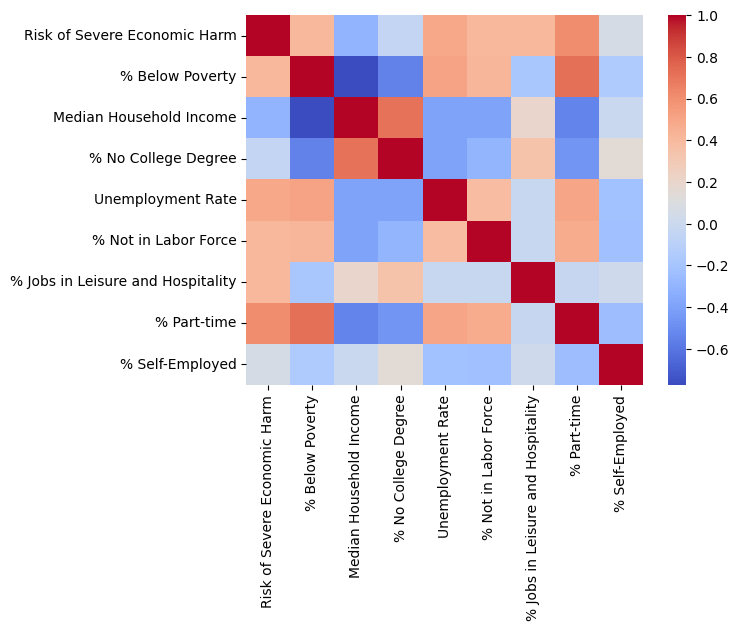

In [11]:
plt.figure()
sns.heatmap(df.corr(),cmap='coolwarm')
plt.show()

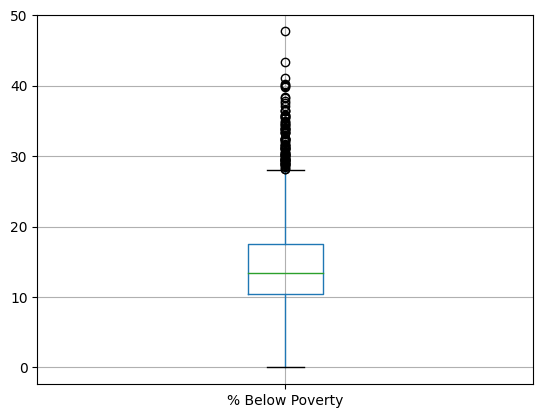

In [12]:
df.boxplot(column=['% Below Poverty'])
plt.show()

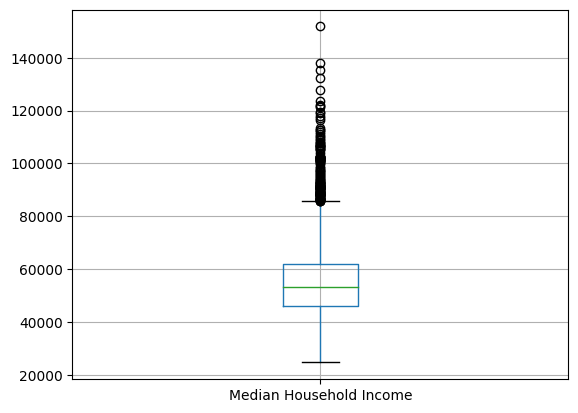

In [13]:
df.boxplot(column=['Median Household Income'])
plt.show()

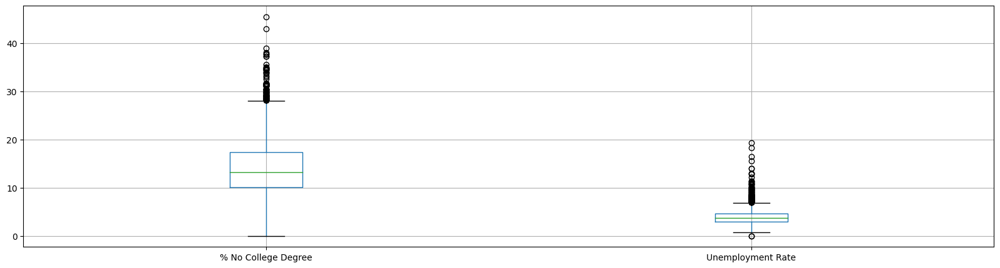

In [14]:
df.loc[:,'% No College Degree':'Unemployment Rate'].boxplot(figsize=(20,5))
plt.show()

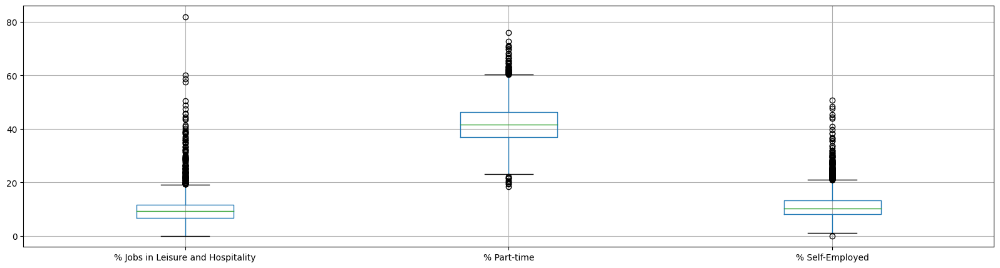

In [15]:
df.loc[:,'% Jobs in Leisure and Hospitality':'% Self-Employed'].boxplot(figsize=(20,5))
plt.show()

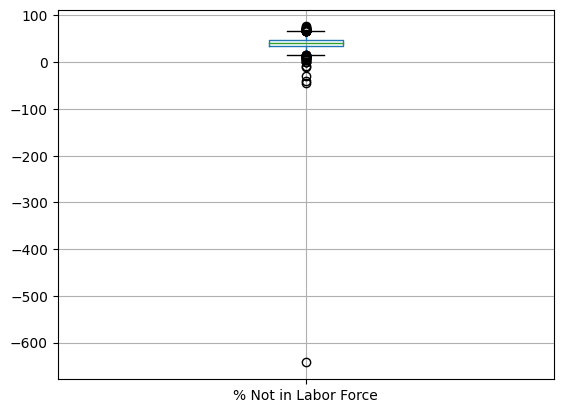

In [16]:
df.boxplot(column=['% Not in Labor Force'])
plt.show()


## Data Preparation

### Let's replace the categorical columns "State" and "County" by numerical columns

In [17]:
a = df['State'].unique().tolist()
c = df['County'].unique().tolist()


In [18]:
b=[]
for i in range(len(a)):
    b.append(i+1)    

In [19]:
d=[]
for i in range(len(c)):
    d.append(i+1)    

In [20]:
scaler_mapper = {}
for i in range(len(a)):
    scaler_mapper[a[i]] = b[i]

In [21]:
scaler_mapper2 = {}
for i in range(len(c)):
    scaler_mapper2[c[i]] = d[i]

In [22]:
df['State'] = df['State'].map(scaler_mapper)
df['County'] = df['County'].map(scaler_mapper2)

In [23]:
df

,State,County,Risk of Severe Economic Harm,% Below Poverty,Median Household Income,% No College Degree,Unemployment Rate,% Not in Labor Force,% Jobs in Leisure and Hospitality,% Part-time,% Self-Employed
0,1,1,47.066623,12.1,58233.0,16.107796,2.7,40.454576,14.216260,39.604710,7.283256
1,1,2,58.180350,10.1,59871.0,21.044656,2.7,43.511495,20.823355,40.364194,12.669969
2,1,3,55.955823,27.1,35972.0,7.609664,3.8,58.630549,9.248695,54.696722,9.675502
3,1,4,44.582765,20.3,47918.0,6.451014,3.1,53.033744,4.345937,52.112959,7.547395
4,1,5,46.755655,16.3,52902.0,8.625066,2.7,44.821051,10.342057,47.550659,7.815851
...,...,...,...,...,...,...,...,...,...,...,...
3137,51,1847,44.764317,8.3,80639.0,14.791503,3.9,35.799861,10.617683,38.451979,6.552799
3138,51,484,49.994031,6.0,98837.0,38.948219,2.7,18.570607,38.886556,24.446686,15.190575
3139,51,1848,47.600642,8.5,70756.0,11.053687,3.9,40.209119,10.094067,39.056725,9.974177
3140,51,1849,49.550755,11.1,55122.0,15.398485,3.9,38.421875,7.987493,38.262163,14.005825


In [24]:
robust_scaler = RobustScaler()
df[['% Below Poverty','Median Household Income','% No College Degree','Unemployment Rate','% Jobs in Leisure and Hospitality','% Part-time','% Self-Employed']] = robust_scaler.fit_transform(df[['% Below Poverty','Median Household Income','% No College Degree','Unemployment Rate','% Jobs in Leisure and Hospitality','% Part-time','% Self-Employed']])

In [25]:
robust_scaler = RobustScaler()
df[['% Not in Labor Force']] = robust_scaler.fit_transform(df[['% Not in Labor Force']])

In [26]:
df['% Not in Labor Force'].min()


-54.16071949422586

In [27]:
df['% Not in Labor Force'] = np.log(df['% Not in Labor Force']+55.2 )

In [28]:
df['% Below Poverty'].min()

-1.887323943661972

In [29]:
df['% Below Poverty'] = np.log(df['% Below Poverty']+2.9 )

In [30]:
df['Median Household Income'].min()

-1.8097030266611847

In [31]:
df['Median Household Income'] = np.log(df['Median Household Income']+2.9 )

In [32]:
df['% No College Degree'].min()

-1.8446660670486823

In [33]:
df['% No College Degree'] = np.log(df['% No College Degree']+2.85 )

In [34]:
df['Unemployment Rate'].min()

-2.3125000000000004

In [35]:
df['Unemployment Rate'] = np.log(df['Unemployment Rate']+3.4 )

In [36]:
df['% Jobs in Leisure and Hospitality'].min()

-1.8377616925087823

In [37]:
df['% Jobs in Leisure and Hospitality'] = np.log(df['% Jobs in Leisure and Hospitality']+ 2.84 )

In [38]:
df['% Part-time'].min()

-2.449119744236648

In [39]:
df['% Part-time'] = np.log(df['% Part-time']+ 3.45 )

In [40]:
df['% Self-Employed'].min()

-1.9970512140183516

In [41]:
df['% Self-Employed'] = np.log(df['% Self-Employed']+ 3 )

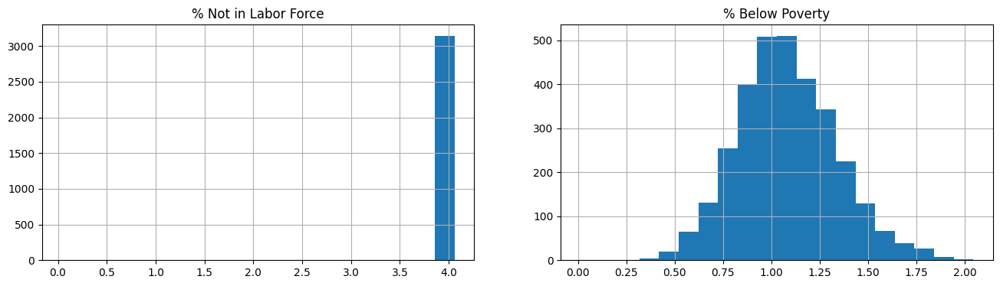

In [42]:
# Create figure with two subplots
fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title("% Not in Labor Force")
df['% Not in Labor Force'].hist(bins=20)

ax3 = fig.add_subplot(1, 2, 2)
ax3.set_title("% Below Poverty")

df['% Below Poverty'].hist(bins=20)

plt.show()

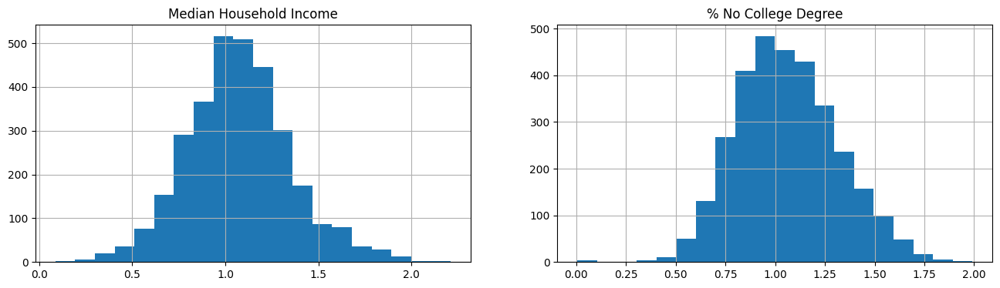

In [43]:
# Create figure with two subplots
fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title("Median Household Income")
df['Median Household Income'].hist(bins=20)

ax3 = fig.add_subplot(1, 2, 2)
ax3.set_title("% No College Degree")

df['% No College Degree'].hist(bins=20)

plt.show()

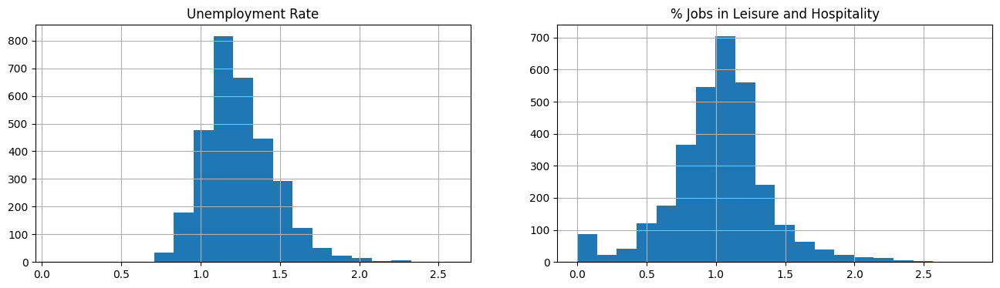

In [44]:
# Create figure with two subplots
fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title("Unemployment Rate")
df['Unemployment Rate'].hist(bins=20)

ax3 = fig.add_subplot(1, 2, 2)
ax3.set_title("% Jobs in Leisure and Hospitality")

df['% Jobs in Leisure and Hospitality'].hist(bins=20)

plt.show()

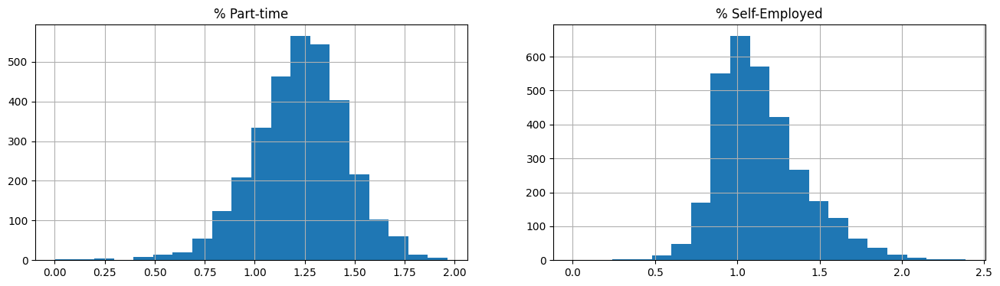

In [45]:
# Create figure with two subplots
fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title("% Part-time")
df['% Part-time'].hist(bins=20)

ax3 = fig.add_subplot(1, 2, 2)
ax3.set_title("% Self-Employed")

df['% Self-Employed'].hist(bins=20)

plt.show()

Finally, we can build the preprocessing pipeline. It first adds the column names back to a set of examples (that can be either a training, or a validation, or test set). Then it applies the two different data preparation strategies to the two groups of columns and unites them with FeatureUnion.

In [46]:
# store a list with the names of all predictors
names_all = [c for c in df if c not in ['Risk of Severe Economic Harm']]

# define column groups with same data preparation
names_outliers = ['% Not in Labor Force','% Below Poverty','Median Household Income','% No College Degree','Unemployment Rate','% Jobs in Leisure and Hospitality','% Part-time','% Self-Employed']
names_no_outliers = list(set(names_all) - set(names_outliers))

In [47]:
class AddColumnNames(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return pd.DataFrame(data=X, columns=self.columns)

In [48]:
class ColumnSelector(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        assert isinstance(X, pd.DataFrame)
        return X[self.columns]

In [49]:
preprocess_pipeline = make_pipeline(
    AddColumnNames(columns=names_all),
    FeatureUnion(transformer_list=[
        ("outlier_columns", make_pipeline(
            ColumnSelector(columns=names_outliers),
        )),
         ("no_outlier_columns", make_pipeline(
             ColumnSelector(columns=names_no_outliers),
         ))
    ])
)

In [50]:
y = df['Risk of Severe Economic Harm']
X = df.drop('Risk of Severe Economic Harm', axis=1).values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True)

### Random Forest Pipeline

In [51]:
pipe = Pipeline(steps=[('preprocess', preprocess_pipeline), 
                       ('reduce_dim', 'passthrough'),
                       ('regresson', RandomForestRegressor(n_estimators=10))])

In [52]:
N_FEATURES_OPTIONS = [2, 6, 11]
MAX_DEPTH_OPTIONS = [2, 4, 6, 8]

param_grid = [
    {
        'reduce_dim': [PCA(iterated_power=7)],
        'reduce_dim__n_components': N_FEATURES_OPTIONS,
        'regresson__max_depth': MAX_DEPTH_OPTIONS
    },
    {
        'reduce_dim': [RFE(svm.SVR(kernel='linear', gamma='auto')),RFE(LinearRegression())],
        'reduce_dim__n_features_to_select': N_FEATURES_OPTIONS,
        'regresson__max_depth': MAX_DEPTH_OPTIONS
    }  
]

search = GridSearchCV(pipe, param_grid, n_jobs=-1, cv=5, refit=True)
search.fit(X_train, y_train)

print("Best CV score = %0.3f:" % search.best_score_)
print("Best parameters: ", search.best_params_)

# store the best params and best model for later use
RF_best_params = search.best_params_
RF_best_model = search.best_estimator_

/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
20 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/pipeline.py", line 378, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/pipeline.py", line 336, in _fit
    X, fitted_transformer = fit_transform_one_cached(
  File "/opt/anaconda3/lib/py

Best CV score = 0.889:
Best parameters:  {'reduce_dim': RFE(estimator=SVR(gamma='auto', kernel='linear'), n_features_to_select=11), 'reduce_dim__n_features_to_select': 11, 'regresson__max_depth': 8}


### Linear Regression Pipeline

In [53]:
pipe = Pipeline(steps=[('preprocess', preprocess_pipeline), 
                       ('reduce_dim', 'passthrough'),
                       ('regresson', LinearRegression())])

In [54]:
N_FEATURES_OPTIONS = [2, 6, 11]
NORMALIZE_OPTIONS = [False, True]

param_grid = [
    {
        'reduce_dim': [PCA(iterated_power=7)],
        'reduce_dim__n_components': N_FEATURES_OPTIONS,
        'regresson__normalize': NORMALIZE_OPTIONS
    },
    {
        'reduce_dim': [RFE(svm.SVR(kernel='linear', gamma='auto')),RFE(LinearRegression())],
        'reduce_dim__n_features_to_select': N_FEATURES_OPTIONS,
        'regresson__normalize': NORMALIZE_OPTIONS
    }  
]

search = GridSearchCV(pipe, param_grid, n_jobs=-1, cv=5, refit=True)
search.fit(X_train, y_train)
print("Best CV score = %0.3f:" % search.best_score_)
print("Best parameters: ", search.best_params_)

# store the best params and best model for later use
LR_best_params = search.best_params_
LR_best_model = search.best_estimator_

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. P

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. P

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 90.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details 

Best CV score = 0.792:
Best parameters:  {'reduce_dim': RFE(estimator=SVR(gamma='auto', kernel='linear'), n_features_to_select=6), 'reduce_dim__n_features_to_select': 6, 'regresson__normalize': False}


/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(


### XGBoost Regressor

In [55]:
import xgboost as xgb
pipe = Pipeline(steps=[#('preprocess', preprocess_pipeline), 
                       ('reduce_dim', 'passthrough'),
                       ('regresson', xgb.XGBRegressor(verbosity=0))]) 

N_FEATURES_OPTIONS = [2, 6, 11]
MAX_DEPTH_OPTIONS = [2, 4, 6, 8]

param_grid = [
    {
        'reduce_dim': [PCA(iterated_power=7)],
        'reduce_dim__n_components': N_FEATURES_OPTIONS,
        'regresson__max_depth': MAX_DEPTH_OPTIONS
    },
    {
        'reduce_dim': [RFE(svm.SVR(kernel='linear', gamma='auto')),RFE(LinearRegression())],
        'reduce_dim__n_features_to_select': N_FEATURES_OPTIONS,
        'regresson__max_depth': MAX_DEPTH_OPTIONS
    }  
]

search = GridSearchCV(pipe, param_grid, n_jobs=-1, cv=5, refit=True)
search.fit(X_train, y_train)
print("Best CV score = %0.3f:" % search.best_score_)
print("Best parameters: ", search.best_params_)

# store the best params and best model for later use
XGB_best_params = search.best_params_
XGB_best_model = search.best_estimator_

/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
20 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/pipeline.py", line 378, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/pipeline.py", line 336, in _fit
    X, fitted_transformer = fit_transform_one_cached(
  File "/opt/anaconda3/lib/py

Best CV score = 0.972:
Best parameters:  {'reduce_dim': RFE(estimator=SVR(gamma='auto', kernel='linear'), n_features_to_select=11), 'reduce_dim__n_features_to_select': 11, 'regresson__max_depth': 2}


### CatBoost Regressor

In [56]:
from catboost import CatBoostRegressor
pipe = Pipeline(steps=[#('preprocess', preprocess_pipeline), 
                       ('reduce_dim', 'passthrough'),
                       ('regresson', CatBoostRegressor())]) 

N_FEATURES_OPTIONS = [2, 6, 11]
MAX_DEPTH_OPTIONS = [2, 4, 6, 8]

param_grid = [
    {
        'reduce_dim': [PCA(iterated_power=7)],
        'reduce_dim__n_components': N_FEATURES_OPTIONS,
        'regresson__max_depth': MAX_DEPTH_OPTIONS
    },
    {
        'reduce_dim': [RFE(svm.SVR(kernel='linear', gamma='auto')),RFE(LinearRegression())],
        'reduce_dim__n_features_to_select': N_FEATURES_OPTIONS,
        'regresson__max_depth': MAX_DEPTH_OPTIONS
    }  
]

search = GridSearchCV(pipe, param_grid, n_jobs=-1, cv=5, refit=True)
search.fit(X_train, y_train)
print("Best CV score = %0.3f:" % search.best_score_)
print("Best parameters: ", search.best_params_)

# store the best params and best model for later use
CB_best_params = search.best_params_
CB_best_model = search.best_estimator_

Learning rate set to 0.045718
0:	learn: 9.9973250	total: 52.7ms	remaining: 52.6s
1:	learn: 9.9864656	total: 53ms	remaining: 26.4s
2:	learn: 9.9760313	total: 53.3ms	remaining: 17.7s
3:	learn: 9.9680544	total: 53.5ms	remaining: 13.3s
4:	learn: 9.9617463	total: 53.8ms	remaining: 10.7s
5:	learn: 9.9520832	total: 54ms	remaining: 8.95s
6:	learn: 9.9437356	total: 54.2ms	remaining: 7.7s
7:	learn: 9.9344550	total: 54.5ms	remaining: 6.75s
8:	learn: 9.9256545	total: 54.7ms	remaining: 6.02s
9:	learn: 9.9188980	total: 54.9ms	remaining: 5.44s
10:	learn: 9.9136019	total: 55.2ms	remaining: 4.96s
11:	learn: 9.9063699	total: 55.4ms	remaining: 4.56s
12:	learn: 9.9016978	total: 55.7ms	remaining: 4.22s
13:	learn: 9.8957258	total: 55.9ms	remaining: 3.94s
14:	learn: 9.8902850	total: 56.1ms	remaining: 3.69s
15:	learn: 9.8844944	total: 56.4ms	remaining: 3.47s
16:	learn: 9.8716435	total: 56.6ms	remaining: 3.27s
17:	learn: 9.8647476	total: 56.9ms	remaining: 3.1s
18:	learn: 9.8607417	total: 57.1ms	remaining: 2.95

627:	learn: 8.9480098	total: 248ms	remaining: 147ms
628:	learn: 8.9472966	total: 249ms	remaining: 147ms
629:	learn: 8.9472049	total: 250ms	remaining: 147ms
630:	learn: 8.9469405	total: 250ms	remaining: 146ms
631:	learn: 8.9458083	total: 250ms	remaining: 146ms
632:	learn: 8.9451448	total: 250ms	remaining: 145ms
633:	learn: 8.9445348	total: 252ms	remaining: 145ms
634:	learn: 8.9436365	total: 252ms	remaining: 145ms
635:	learn: 8.9429727	total: 252ms	remaining: 144ms
636:	learn: 8.9410358	total: 252ms	remaining: 144ms
637:	learn: 8.9408933	total: 253ms	remaining: 143ms
638:	learn: 8.9406657	total: 253ms	remaining: 143ms
639:	learn: 8.9399777	total: 254ms	remaining: 143ms
640:	learn: 8.9393760	total: 254ms	remaining: 142ms
641:	learn: 8.9392396	total: 254ms	remaining: 142ms
642:	learn: 8.9385009	total: 254ms	remaining: 141ms
643:	learn: 8.9379461	total: 255ms	remaining: 141ms
644:	learn: 8.9365412	total: 255ms	remaining: 140ms
645:	learn: 8.9358267	total: 255ms	remaining: 140ms
646:	learn: 

250:	learn: 8.6725751	total: 139ms	remaining: 416ms
251:	learn: 8.6697845	total: 140ms	remaining: 415ms
252:	learn: 8.6687494	total: 140ms	remaining: 414ms
253:	learn: 8.6677215	total: 141ms	remaining: 413ms
254:	learn: 8.6657788	total: 141ms	remaining: 412ms
255:	learn: 8.6622246	total: 142ms	remaining: 412ms
256:	learn: 8.6607323	total: 142ms	remaining: 411ms
257:	learn: 8.6595698	total: 143ms	remaining: 410ms
258:	learn: 8.6560117	total: 143ms	remaining: 410ms
259:	learn: 8.6549666	total: 144ms	remaining: 409ms
260:	learn: 8.6541768	total: 144ms	remaining: 408ms
261:	learn: 8.6494367	total: 145ms	remaining: 407ms
262:	learn: 8.6450862	total: 145ms	remaining: 407ms
263:	learn: 8.6432859	total: 146ms	remaining: 406ms
264:	learn: 8.6387961	total: 146ms	remaining: 405ms
265:	learn: 8.6380465	total: 147ms	remaining: 404ms
266:	learn: 8.6329938	total: 147ms	remaining: 404ms
267:	learn: 8.6305891	total: 148ms	remaining: 403ms
268:	learn: 8.6287852	total: 148ms	remaining: 402ms
269:	learn: 

564:	learn: 8.1061039	total: 296ms	remaining: 228ms
565:	learn: 8.1047477	total: 297ms	remaining: 227ms
566:	learn: 8.1035979	total: 297ms	remaining: 227ms
567:	learn: 8.1016216	total: 297ms	remaining: 226ms
568:	learn: 8.1008146	total: 298ms	remaining: 226ms
569:	learn: 8.0993882	total: 299ms	remaining: 225ms
570:	learn: 8.0985336	total: 299ms	remaining: 225ms
571:	learn: 8.0964804	total: 300ms	remaining: 224ms
572:	learn: 8.0956680	total: 300ms	remaining: 224ms
573:	learn: 8.0939900	total: 301ms	remaining: 223ms
574:	learn: 8.0930422	total: 301ms	remaining: 223ms
575:	learn: 8.0909013	total: 303ms	remaining: 223ms
576:	learn: 8.0903215	total: 304ms	remaining: 223ms
577:	learn: 8.0889999	total: 304ms	remaining: 222ms
578:	learn: 8.0866394	total: 305ms	remaining: 222ms
579:	learn: 8.0846420	total: 305ms	remaining: 221ms
580:	learn: 8.0835273	total: 306ms	remaining: 221ms
581:	learn: 8.0815569	total: 306ms	remaining: 220ms
582:	learn: 8.0797957	total: 307ms	remaining: 220ms
583:	learn: 

877:	learn: 7.7819422	total: 461ms	remaining: 64ms
878:	learn: 7.7814046	total: 461ms	remaining: 63.5ms
879:	learn: 7.7807423	total: 462ms	remaining: 62.9ms
880:	learn: 7.7798910	total: 462ms	remaining: 62.4ms
881:	learn: 7.7784094	total: 463ms	remaining: 61.9ms
882:	learn: 7.7773117	total: 463ms	remaining: 61.4ms
883:	learn: 7.7755770	total: 464ms	remaining: 60.9ms
884:	learn: 7.7734560	total: 465ms	remaining: 60.4ms
885:	learn: 7.7727791	total: 466ms	remaining: 59.9ms
886:	learn: 7.7722112	total: 466ms	remaining: 59.4ms
887:	learn: 7.7715220	total: 466ms	remaining: 58.8ms
888:	learn: 7.7702086	total: 467ms	remaining: 58.3ms
889:	learn: 7.7690711	total: 467ms	remaining: 57.8ms
890:	learn: 7.7687400	total: 468ms	remaining: 57.2ms
891:	learn: 7.7679257	total: 469ms	remaining: 56.8ms
892:	learn: 7.7671257	total: 469ms	remaining: 56.2ms
893:	learn: 7.7666503	total: 470ms	remaining: 55.7ms
894:	learn: 7.7662685	total: 471ms	remaining: 55.2ms
895:	learn: 7.7657635	total: 471ms	remaining: 54

188:	learn: 8.7861881	total: 180ms	remaining: 774ms
189:	learn: 8.7827984	total: 181ms	remaining: 773ms
190:	learn: 8.7785596	total: 183ms	remaining: 775ms
191:	learn: 8.7751832	total: 184ms	remaining: 774ms
192:	learn: 8.7723143	total: 185ms	remaining: 774ms
193:	learn: 8.7689935	total: 187ms	remaining: 775ms
194:	learn: 8.7667721	total: 188ms	remaining: 774ms
195:	learn: 8.7635615	total: 188ms	remaining: 773ms
196:	learn: 8.7606845	total: 189ms	remaining: 771ms
197:	learn: 8.7567230	total: 190ms	remaining: 769ms
198:	learn: 8.7524590	total: 192ms	remaining: 772ms
199:	learn: 8.7465182	total: 193ms	remaining: 771ms
200:	learn: 8.7444926	total: 194ms	remaining: 769ms
201:	learn: 8.7422501	total: 195ms	remaining: 769ms
202:	learn: 8.7361976	total: 196ms	remaining: 769ms
203:	learn: 8.7338074	total: 196ms	remaining: 767ms
204:	learn: 8.7327224	total: 198ms	remaining: 766ms
205:	learn: 8.7304414	total: 198ms	remaining: 765ms
206:	learn: 8.7240189	total: 200ms	remaining: 765ms
207:	learn: 

502:	learn: 8.0181561	total: 539ms	remaining: 533ms
503:	learn: 8.0164713	total: 540ms	remaining: 532ms
504:	learn: 8.0145479	total: 541ms	remaining: 530ms
505:	learn: 8.0114885	total: 542ms	remaining: 529ms
506:	learn: 8.0101745	total: 543ms	remaining: 528ms
507:	learn: 8.0096731	total: 544ms	remaining: 527ms
508:	learn: 8.0076833	total: 545ms	remaining: 525ms
509:	learn: 8.0063808	total: 546ms	remaining: 524ms
510:	learn: 8.0037839	total: 547ms	remaining: 523ms
511:	learn: 8.0021612	total: 548ms	remaining: 522ms
512:	learn: 8.0001183	total: 549ms	remaining: 521ms
513:	learn: 7.9993793	total: 550ms	remaining: 520ms
514:	learn: 7.9961115	total: 550ms	remaining: 518ms
515:	learn: 7.9939921	total: 551ms	remaining: 517ms
516:	learn: 7.9923164	total: 552ms	remaining: 516ms
517:	learn: 7.9908494	total: 553ms	remaining: 515ms
518:	learn: 7.9893582	total: 554ms	remaining: 514ms
519:	learn: 7.9865609	total: 555ms	remaining: 512ms
520:	learn: 7.9842580	total: 556ms	remaining: 511ms
521:	learn: 

817:	learn: 7.5056280	total: 838ms	remaining: 186ms
818:	learn: 7.5047095	total: 839ms	remaining: 185ms
819:	learn: 7.5041994	total: 840ms	remaining: 184ms
820:	learn: 7.5029168	total: 841ms	remaining: 183ms
821:	learn: 7.5019003	total: 842ms	remaining: 182ms
822:	learn: 7.5010224	total: 842ms	remaining: 181ms
823:	learn: 7.4987159	total: 843ms	remaining: 180ms
824:	learn: 7.4978838	total: 844ms	remaining: 179ms
825:	learn: 7.4962120	total: 845ms	remaining: 178ms
826:	learn: 7.4951508	total: 846ms	remaining: 177ms
827:	learn: 7.4949987	total: 847ms	remaining: 176ms
828:	learn: 7.4943359	total: 848ms	remaining: 175ms
829:	learn: 7.4932048	total: 848ms	remaining: 174ms
830:	learn: 7.4916183	total: 849ms	remaining: 173ms
831:	learn: 7.4898922	total: 850ms	remaining: 172ms
832:	learn: 7.4878351	total: 851ms	remaining: 171ms
833:	learn: 7.4864277	total: 852ms	remaining: 170ms
834:	learn: 7.4855002	total: 853ms	remaining: 169ms
835:	learn: 7.4843634	total: 854ms	remaining: 168ms
836:	learn: 

129:	learn: 9.0091369	total: 158ms	remaining: 1.06s
130:	learn: 9.0049800	total: 160ms	remaining: 1.06s
131:	learn: 9.0038554	total: 161ms	remaining: 1.06s
132:	learn: 9.0003074	total: 162ms	remaining: 1.05s
133:	learn: 8.9983726	total: 163ms	remaining: 1.05s
134:	learn: 8.9952232	total: 164ms	remaining: 1.05s
135:	learn: 8.9905918	total: 165ms	remaining: 1.05s
136:	learn: 8.9881402	total: 166ms	remaining: 1.04s
137:	learn: 8.9851674	total: 167ms	remaining: 1.04s
138:	learn: 8.9829926	total: 167ms	remaining: 1.04s
139:	learn: 8.9799544	total: 168ms	remaining: 1.03s
140:	learn: 8.9752434	total: 169ms	remaining: 1.03s
141:	learn: 8.9728508	total: 170ms	remaining: 1.03s
142:	learn: 8.9714918	total: 171ms	remaining: 1.02s
143:	learn: 8.9705196	total: 172ms	remaining: 1.02s
144:	learn: 8.9689986	total: 172ms	remaining: 1.02s
145:	learn: 8.9673188	total: 173ms	remaining: 1.01s
146:	learn: 8.9631721	total: 174ms	remaining: 1.01s
147:	learn: 8.9611479	total: 175ms	remaining: 1.01s
148:	learn: 

443:	learn: 8.1832022	total: 469ms	remaining: 587ms
444:	learn: 8.1819400	total: 470ms	remaining: 586ms
445:	learn: 8.1802877	total: 475ms	remaining: 590ms
446:	learn: 8.1782232	total: 476ms	remaining: 589ms
447:	learn: 8.1759489	total: 477ms	remaining: 587ms
448:	learn: 8.1734248	total: 478ms	remaining: 587ms
449:	learn: 8.1710691	total: 479ms	remaining: 585ms
450:	learn: 8.1697804	total: 480ms	remaining: 584ms
451:	learn: 8.1679969	total: 481ms	remaining: 583ms
452:	learn: 8.1663279	total: 484ms	remaining: 584ms
453:	learn: 8.1648226	total: 485ms	remaining: 583ms
454:	learn: 8.1630861	total: 486ms	remaining: 582ms
455:	learn: 8.1610963	total: 487ms	remaining: 581ms
456:	learn: 8.1595853	total: 489ms	remaining: 580ms
457:	learn: 8.1579802	total: 491ms	remaining: 581ms
458:	learn: 8.1562198	total: 492ms	remaining: 580ms
459:	learn: 8.1556001	total: 493ms	remaining: 579ms
460:	learn: 8.1542151	total: 494ms	remaining: 577ms
461:	learn: 8.1515714	total: 495ms	remaining: 576ms
462:	learn: 

759:	learn: 7.3835497	total: 811ms	remaining: 256ms
760:	learn: 7.3824173	total: 812ms	remaining: 255ms
761:	learn: 7.3812423	total: 813ms	remaining: 254ms
762:	learn: 7.3803272	total: 814ms	remaining: 253ms
763:	learn: 7.3791340	total: 815ms	remaining: 252ms
764:	learn: 7.3766802	total: 816ms	remaining: 251ms
765:	learn: 7.3738363	total: 819ms	remaining: 250ms
766:	learn: 7.3728905	total: 820ms	remaining: 249ms
767:	learn: 7.3717744	total: 821ms	remaining: 248ms
768:	learn: 7.3711731	total: 822ms	remaining: 247ms
769:	learn: 7.3696476	total: 822ms	remaining: 246ms
770:	learn: 7.3680669	total: 823ms	remaining: 245ms
771:	learn: 7.3672635	total: 824ms	remaining: 243ms
772:	learn: 7.3660159	total: 825ms	remaining: 242ms
773:	learn: 7.3649393	total: 826ms	remaining: 241ms
774:	learn: 7.3639038	total: 827ms	remaining: 240ms
775:	learn: 7.3623024	total: 828ms	remaining: 239ms
776:	learn: 7.3610070	total: 829ms	remaining: 238ms
777:	learn: 7.3603842	total: 832ms	remaining: 238ms
778:	learn: 

757:	learn: 7.7096971	total: 816ms	remaining: 261ms
758:	learn: 7.7078929	total: 817ms	remaining: 259ms
759:	learn: 7.7069683	total: 818ms	remaining: 258ms
760:	learn: 7.7060282	total: 819ms	remaining: 257ms
761:	learn: 7.7049345	total: 820ms	remaining: 256ms
762:	learn: 7.7035739	total: 821ms	remaining: 255ms
763:	learn: 7.7021773	total: 822ms	remaining: 254ms
764:	learn: 7.7018567	total: 823ms	remaining: 253ms
765:	learn: 7.7000914	total: 825ms	remaining: 252ms
766:	learn: 7.6994589	total: 826ms	remaining: 251ms
767:	learn: 7.6976440	total: 827ms	remaining: 250ms
768:	learn: 7.6970604	total: 828ms	remaining: 249ms
769:	learn: 7.6944264	total: 828ms	remaining: 247ms
770:	learn: 7.6930538	total: 829ms	remaining: 246ms
771:	learn: 7.6915798	total: 831ms	remaining: 245ms
772:	learn: 7.6901126	total: 831ms	remaining: 244ms
773:	learn: 7.6886736	total: 832ms	remaining: 243ms
774:	learn: 7.6881385	total: 834ms	remaining: 242ms
775:	learn: 7.6867421	total: 835ms	remaining: 241ms
776:	learn: 

387:	learn: 8.2958793	total: 483ms	remaining: 761ms
388:	learn: 8.2924207	total: 487ms	remaining: 765ms
389:	learn: 8.2907720	total: 496ms	remaining: 775ms
390:	learn: 8.2878394	total: 497ms	remaining: 775ms
391:	learn: 8.2858017	total: 498ms	remaining: 773ms
392:	learn: 8.2829794	total: 499ms	remaining: 771ms
393:	learn: 8.2808688	total: 501ms	remaining: 770ms
394:	learn: 8.2781030	total: 502ms	remaining: 769ms
395:	learn: 8.2773861	total: 503ms	remaining: 767ms
396:	learn: 8.2749840	total: 504ms	remaining: 766ms
397:	learn: 8.2718039	total: 506ms	remaining: 765ms
398:	learn: 8.2704748	total: 508ms	remaining: 765ms
399:	learn: 8.2685444	total: 509ms	remaining: 763ms
400:	learn: 8.2667802	total: 510ms	remaining: 762ms
401:	learn: 8.2646346	total: 511ms	remaining: 761ms
402:	learn: 8.2619997	total: 513ms	remaining: 760ms
403:	learn: 8.2600863	total: 514ms	remaining: 758ms
404:	learn: 8.2582519	total: 518ms	remaining: 760ms
405:	learn: 8.2548748	total: 519ms	remaining: 759ms
406:	learn: 

71:	learn: 8.8990321	total: 178ms	remaining: 2.29s
72:	learn: 8.8934408	total: 180ms	remaining: 2.29s
73:	learn: 8.8888835	total: 182ms	remaining: 2.28s
74:	learn: 8.8829804	total: 184ms	remaining: 2.27s
75:	learn: 8.8766197	total: 186ms	remaining: 2.26s
76:	learn: 8.8711545	total: 188ms	remaining: 2.25s
77:	learn: 8.8659297	total: 190ms	remaining: 2.25s
78:	learn: 8.8603239	total: 192ms	remaining: 2.24s
79:	learn: 8.8558560	total: 194ms	remaining: 2.23s
80:	learn: 8.8517335	total: 197ms	remaining: 2.23s
81:	learn: 8.8474217	total: 199ms	remaining: 2.22s
82:	learn: 8.8431729	total: 201ms	remaining: 2.22s
83:	learn: 8.8363116	total: 204ms	remaining: 2.22s
84:	learn: 8.8300141	total: 206ms	remaining: 2.21s
85:	learn: 8.8252947	total: 208ms	remaining: 2.21s
86:	learn: 8.8230332	total: 210ms	remaining: 2.2s
87:	learn: 8.8182956	total: 211ms	remaining: 2.19s
88:	learn: 8.8145881	total: 214ms	remaining: 2.19s
89:	learn: 8.8094803	total: 216ms	remaining: 2.18s
90:	learn: 8.8063369	total: 218m

701:	learn: 7.7825278	total: 883ms	remaining: 375ms
702:	learn: 7.7806913	total: 885ms	remaining: 374ms
703:	learn: 7.7796725	total: 886ms	remaining: 372ms
704:	learn: 7.7783223	total: 888ms	remaining: 371ms
705:	learn: 7.7768215	total: 889ms	remaining: 370ms
706:	learn: 7.7762269	total: 890ms	remaining: 369ms
707:	learn: 7.7755325	total: 891ms	remaining: 368ms
708:	learn: 7.7736179	total: 893ms	remaining: 366ms
709:	learn: 7.7720482	total: 893ms	remaining: 365ms
710:	learn: 7.7708889	total: 895ms	remaining: 364ms
711:	learn: 7.7697033	total: 896ms	remaining: 362ms
712:	learn: 7.7682658	total: 897ms	remaining: 361ms
713:	learn: 7.7658364	total: 899ms	remaining: 360ms
714:	learn: 7.7649123	total: 900ms	remaining: 359ms
715:	learn: 7.7640586	total: 901ms	remaining: 357ms
716:	learn: 7.7633692	total: 902ms	remaining: 356ms
717:	learn: 7.7619477	total: 904ms	remaining: 355ms
718:	learn: 7.7612522	total: 905ms	remaining: 354ms
719:	learn: 7.7603078	total: 906ms	remaining: 352ms
720:	learn: 

Learning rate set to 0.045721
0:	learn: 10.0103131	total: 53.9ms	remaining: 53.8s
1:	learn: 10.0050204	total: 54.3ms	remaining: 27.1s
2:	learn: 9.9907385	total: 54.7ms	remaining: 18.2s
3:	learn: 9.9819643	total: 55.1ms	remaining: 13.7s
4:	learn: 9.9733048	total: 55.5ms	remaining: 11s
5:	learn: 9.9671929	total: 55.8ms	remaining: 9.25s
6:	learn: 9.9580249	total: 56.2ms	remaining: 7.97s
7:	learn: 9.9495976	total: 56.6ms	remaining: 7.01s
8:	learn: 9.9414318	total: 56.9ms	remaining: 6.27s
9:	learn: 9.9361544	total: 57.3ms	remaining: 5.67s
10:	learn: 9.9305173	total: 57.7ms	remaining: 5.18s
11:	learn: 9.9249280	total: 58ms	remaining: 4.78s
12:	learn: 9.9201420	total: 58.5ms	remaining: 4.44s
13:	learn: 9.9143099	total: 59.2ms	remaining: 4.17s
14:	learn: 9.9086522	total: 59.6ms	remaining: 3.91s
15:	learn: 9.9039633	total: 60.1ms	remaining: 3.69s
16:	learn: 9.8994545	total: 60.5ms	remaining: 3.5s
17:	learn: 9.8946036	total: 60.8ms	remaining: 3.32s
18:	learn: 9.8882453	total: 61.2ms	remaining: 3

231:	learn: 8.7617859	total: 226ms	remaining: 747ms
232:	learn: 8.7576623	total: 228ms	remaining: 749ms
233:	learn: 8.7553930	total: 228ms	remaining: 747ms
234:	learn: 8.7539190	total: 229ms	remaining: 746ms
235:	learn: 8.7485785	total: 230ms	remaining: 744ms
236:	learn: 8.7475544	total: 231ms	remaining: 742ms
237:	learn: 8.7462567	total: 231ms	remaining: 740ms
238:	learn: 8.7446403	total: 232ms	remaining: 738ms
239:	learn: 8.7430580	total: 233ms	remaining: 736ms
240:	learn: 8.7425443	total: 233ms	remaining: 734ms
241:	learn: 8.7411286	total: 234ms	remaining: 732ms
242:	learn: 8.7397317	total: 234ms	remaining: 730ms
243:	learn: 8.7378634	total: 235ms	remaining: 728ms
244:	learn: 8.7329117	total: 236ms	remaining: 726ms
245:	learn: 8.7299149	total: 237ms	remaining: 727ms
246:	learn: 8.7253631	total: 238ms	remaining: 725ms
247:	learn: 8.7228033	total: 238ms	remaining: 723ms
248:	learn: 8.7208725	total: 239ms	remaining: 721ms
249:	learn: 8.7200081	total: 240ms	remaining: 719ms
250:	learn: 

315:	learn: 8.5846426	total: 287ms	remaining: 622ms
316:	learn: 8.5832919	total: 288ms	remaining: 620ms
317:	learn: 8.5821117	total: 290ms	remaining: 622ms
318:	learn: 8.5796886	total: 291ms	remaining: 621ms
319:	learn: 8.5778517	total: 292ms	remaining: 620ms
320:	learn: 8.5761677	total: 292ms	remaining: 619ms
321:	learn: 8.5727964	total: 293ms	remaining: 617ms
322:	learn: 8.5714427	total: 294ms	remaining: 616ms
323:	learn: 8.5684379	total: 295ms	remaining: 615ms
324:	learn: 8.5666416	total: 295ms	remaining: 613ms
325:	learn: 8.5652969	total: 296ms	remaining: 612ms
326:	learn: 8.5618126	total: 297ms	remaining: 611ms
327:	learn: 8.5611709	total: 297ms	remaining: 609ms
328:	learn: 8.5591917	total: 298ms	remaining: 609ms
329:	learn: 8.5571870	total: 299ms	remaining: 607ms
330:	learn: 8.5562315	total: 305ms	remaining: 616ms
331:	learn: 8.5530507	total: 306ms	remaining: 615ms
332:	learn: 8.5502748	total: 306ms	remaining: 614ms
333:	learn: 8.5493608	total: 311ms	remaining: 620ms
334:	learn: 

14:	learn: 9.5932660	total: 49.5ms	remaining: 3.25s
15:	learn: 9.5813015	total: 51.9ms	remaining: 3.19s
16:	learn: 9.5645258	total: 53.9ms	remaining: 3.12s
17:	learn: 9.5502605	total: 56.2ms	remaining: 3.06s
18:	learn: 9.5323506	total: 58.5ms	remaining: 3.02s
19:	learn: 9.5200110	total: 60.9ms	remaining: 2.98s
20:	learn: 9.5028363	total: 63ms	remaining: 2.94s
21:	learn: 9.4886390	total: 65ms	remaining: 2.89s
22:	learn: 9.4725147	total: 67.4ms	remaining: 2.86s
23:	learn: 9.4576992	total: 69.9ms	remaining: 2.84s
24:	learn: 9.4444886	total: 72.1ms	remaining: 2.81s
25:	learn: 9.4358993	total: 75.1ms	remaining: 2.81s
26:	learn: 9.4249599	total: 77.1ms	remaining: 2.78s
27:	learn: 9.4145117	total: 79.2ms	remaining: 2.75s
28:	learn: 9.4039572	total: 81.6ms	remaining: 2.73s
29:	learn: 9.3925700	total: 83.7ms	remaining: 2.71s
30:	learn: 9.3864078	total: 87ms	remaining: 2.72s
31:	learn: 9.3771292	total: 90.1ms	remaining: 2.72s
32:	learn: 9.3693136	total: 92.3ms	remaining: 2.7s
33:	learn: 9.360502

743:	learn: 8.6231192	total: 432ms	remaining: 149ms
744:	learn: 8.6229001	total: 433ms	remaining: 148ms
745:	learn: 8.6222476	total: 433ms	remaining: 148ms
746:	learn: 8.6219351	total: 434ms	remaining: 147ms
747:	learn: 8.6212290	total: 434ms	remaining: 146ms
748:	learn: 8.6203683	total: 434ms	remaining: 146ms
749:	learn: 8.6199479	total: 435ms	remaining: 145ms
750:	learn: 8.6192776	total: 435ms	remaining: 144ms
751:	learn: 8.6176176	total: 436ms	remaining: 144ms
752:	learn: 8.6171310	total: 436ms	remaining: 143ms
753:	learn: 8.6165906	total: 437ms	remaining: 142ms
754:	learn: 8.6161350	total: 439ms	remaining: 143ms
755:	learn: 8.6153345	total: 440ms	remaining: 142ms
756:	learn: 8.6150889	total: 440ms	remaining: 141ms
757:	learn: 8.6142015	total: 441ms	remaining: 141ms
758:	learn: 8.6137226	total: 441ms	remaining: 140ms
759:	learn: 8.6132438	total: 441ms	remaining: 139ms
760:	learn: 8.6127117	total: 450ms	remaining: 141ms
761:	learn: 8.6121823	total: 450ms	remaining: 141ms
762:	learn: 

942:	learn: 7.8875751	total: 826ms	remaining: 49.9ms
943:	learn: 7.8872874	total: 827ms	remaining: 49ms
944:	learn: 7.8867421	total: 827ms	remaining: 48.2ms
945:	learn: 7.8862961	total: 828ms	remaining: 47.3ms
946:	learn: 7.8852892	total: 829ms	remaining: 46.4ms
947:	learn: 7.8847701	total: 829ms	remaining: 45.5ms
948:	learn: 7.8841857	total: 830ms	remaining: 44.6ms
949:	learn: 7.8834361	total: 831ms	remaining: 43.7ms
950:	learn: 7.8828551	total: 831ms	remaining: 42.8ms
951:	learn: 7.8825685	total: 835ms	remaining: 42.1ms
952:	learn: 7.8822402	total: 836ms	remaining: 41.2ms
953:	learn: 7.8819391	total: 836ms	remaining: 40.3ms
954:	learn: 7.8815742	total: 837ms	remaining: 39.4ms
955:	learn: 7.8797613	total: 838ms	remaining: 38.6ms
956:	learn: 7.8793806	total: 838ms	remaining: 37.7ms
957:	learn: 7.8789010	total: 839ms	remaining: 36.8ms
958:	learn: 7.8785249	total: 840ms	remaining: 35.9ms
959:	learn: 7.8780487	total: 840ms	remaining: 35ms
960:	learn: 7.8771148	total: 841ms	remaining: 34.1

255:	learn: 4.4203055	total: 196ms	remaining: 570ms
256:	learn: 4.4183860	total: 197ms	remaining: 568ms
257:	learn: 4.4168969	total: 197ms	remaining: 567ms
258:	learn: 4.4144374	total: 198ms	remaining: 566ms
259:	learn: 4.4127634	total: 200ms	remaining: 568ms
260:	learn: 4.4114386	total: 200ms	remaining: 567ms
261:	learn: 4.4094877	total: 201ms	remaining: 566ms
262:	learn: 4.4070924	total: 202ms	remaining: 565ms
263:	learn: 4.4058378	total: 202ms	remaining: 564ms
264:	learn: 4.4034300	total: 203ms	remaining: 562ms
265:	learn: 4.4018404	total: 203ms	remaining: 561ms
266:	learn: 4.4001135	total: 204ms	remaining: 560ms
267:	learn: 4.3982308	total: 205ms	remaining: 559ms
268:	learn: 4.3963508	total: 205ms	remaining: 558ms
269:	learn: 4.3949376	total: 206ms	remaining: 557ms
270:	learn: 4.3926921	total: 207ms	remaining: 556ms
271:	learn: 4.3909915	total: 207ms	remaining: 555ms
272:	learn: 4.3887826	total: 208ms	remaining: 554ms
273:	learn: 4.3867508	total: 210ms	remaining: 556ms
274:	learn: 

569:	learn: 4.2171857	total: 419ms	remaining: 316ms
570:	learn: 4.2169850	total: 420ms	remaining: 316ms
571:	learn: 4.2163282	total: 421ms	remaining: 315ms
572:	learn: 4.2148780	total: 421ms	remaining: 314ms
573:	learn: 4.2131415	total: 422ms	remaining: 313ms
574:	learn: 4.2121505	total: 422ms	remaining: 312ms
575:	learn: 4.2114625	total: 423ms	remaining: 311ms
576:	learn: 4.2111405	total: 424ms	remaining: 311ms
577:	learn: 4.2106761	total: 424ms	remaining: 310ms
578:	learn: 4.2105329	total: 425ms	remaining: 309ms
579:	learn: 4.2092973	total: 425ms	remaining: 308ms
580:	learn: 4.2085516	total: 427ms	remaining: 308ms
581:	learn: 4.2077986	total: 428ms	remaining: 307ms
582:	learn: 4.2065393	total: 428ms	remaining: 306ms
583:	learn: 4.2057030	total: 429ms	remaining: 305ms
584:	learn: 4.2043361	total: 429ms	remaining: 304ms
585:	learn: 4.2040981	total: 430ms	remaining: 304ms
586:	learn: 4.2031995	total: 430ms	remaining: 303ms
587:	learn: 4.2030368	total: 431ms	remaining: 302ms
588:	learn: 

645:	learn: 4.2149651	total: 505ms	remaining: 277ms
646:	learn: 4.2147976	total: 506ms	remaining: 276ms
647:	learn: 4.2144417	total: 506ms	remaining: 275ms
648:	learn: 4.2129190	total: 507ms	remaining: 274ms
649:	learn: 4.2127380	total: 508ms	remaining: 273ms
650:	learn: 4.2109823	total: 508ms	remaining: 272ms
651:	learn: 4.2100877	total: 509ms	remaining: 272ms
652:	learn: 4.2093156	total: 510ms	remaining: 271ms
653:	learn: 4.2084644	total: 510ms	remaining: 270ms
654:	learn: 4.2069284	total: 512ms	remaining: 270ms
655:	learn: 4.2053026	total: 513ms	remaining: 269ms
656:	learn: 4.2051459	total: 513ms	remaining: 268ms
657:	learn: 4.2050230	total: 514ms	remaining: 267ms
658:	learn: 4.2044362	total: 514ms	remaining: 266ms
659:	learn: 4.2023446	total: 515ms	remaining: 265ms
660:	learn: 4.2015373	total: 516ms	remaining: 264ms
661:	learn: 4.2006688	total: 516ms	remaining: 264ms
662:	learn: 4.1995428	total: 517ms	remaining: 263ms
663:	learn: 4.1987819	total: 518ms	remaining: 262ms
664:	learn: 

195:	learn: 3.7850379	total: 145ms	remaining: 597ms
196:	learn: 3.7811450	total: 148ms	remaining: 604ms
197:	learn: 3.7774159	total: 149ms	remaining: 604ms
198:	learn: 3.7734537	total: 150ms	remaining: 603ms
199:	learn: 3.7695667	total: 150ms	remaining: 601ms
200:	learn: 3.7651497	total: 151ms	remaining: 600ms
201:	learn: 3.7613215	total: 151ms	remaining: 598ms
202:	learn: 3.7581928	total: 152ms	remaining: 597ms
203:	learn: 3.7547860	total: 153ms	remaining: 596ms
204:	learn: 3.7507052	total: 153ms	remaining: 594ms
205:	learn: 3.7464207	total: 154ms	remaining: 593ms
206:	learn: 3.7431442	total: 154ms	remaining: 592ms
207:	learn: 3.7392190	total: 155ms	remaining: 590ms
208:	learn: 3.7359250	total: 156ms	remaining: 589ms
209:	learn: 3.7320396	total: 156ms	remaining: 588ms
210:	learn: 3.7286760	total: 157ms	remaining: 587ms
211:	learn: 3.7253175	total: 158ms	remaining: 589ms
212:	learn: 3.7217696	total: 159ms	remaining: 588ms
213:	learn: 3.7190582	total: 160ms	remaining: 586ms
214:	learn: 

208:	learn: 3.6505109	total: 332ms	remaining: 1.25s
209:	learn: 3.6471850	total: 333ms	remaining: 1.25s
210:	learn: 3.6443740	total: 334ms	remaining: 1.25s
211:	learn: 3.6425249	total: 336ms	remaining: 1.25s
212:	learn: 3.6401780	total: 337ms	remaining: 1.24s
213:	learn: 3.6358762	total: 338ms	remaining: 1.24s
214:	learn: 3.6334362	total: 339ms	remaining: 1.24s
215:	learn: 3.6302557	total: 340ms	remaining: 1.24s
216:	learn: 3.6282422	total: 342ms	remaining: 1.23s
217:	learn: 3.6240804	total: 343ms	remaining: 1.23s
218:	learn: 3.6200921	total: 344ms	remaining: 1.23s
219:	learn: 3.6183334	total: 346ms	remaining: 1.23s
220:	learn: 3.6149897	total: 348ms	remaining: 1.23s
221:	learn: 3.6119693	total: 349ms	remaining: 1.22s
222:	learn: 3.6095166	total: 350ms	remaining: 1.22s
223:	learn: 3.6059183	total: 352ms	remaining: 1.22s
224:	learn: 3.6025819	total: 353ms	remaining: 1.22s
225:	learn: 3.6006802	total: 354ms	remaining: 1.21s
226:	learn: 3.5981627	total: 355ms	remaining: 1.21s
227:	learn: 

196:	learn: 4.1015485	total: 307ms	remaining: 1.25s
197:	learn: 4.0987320	total: 309ms	remaining: 1.25s
198:	learn: 4.0944711	total: 310ms	remaining: 1.25s
199:	learn: 4.0914346	total: 311ms	remaining: 1.24s
200:	learn: 4.0887652	total: 312ms	remaining: 1.24s
201:	learn: 4.0866439	total: 314ms	remaining: 1.24s
202:	learn: 4.0839464	total: 315ms	remaining: 1.24s
203:	learn: 4.0818327	total: 316ms	remaining: 1.23s
204:	learn: 4.0790458	total: 318ms	remaining: 1.23s
205:	learn: 4.0773272	total: 319ms	remaining: 1.23s
206:	learn: 4.0740347	total: 320ms	remaining: 1.23s
207:	learn: 4.0700980	total: 321ms	remaining: 1.22s
208:	learn: 4.0679305	total: 322ms	remaining: 1.22s
209:	learn: 4.0655925	total: 323ms	remaining: 1.22s
210:	learn: 4.0636394	total: 325ms	remaining: 1.21s
211:	learn: 4.0610918	total: 327ms	remaining: 1.22s
212:	learn: 4.0569173	total: 328ms	remaining: 1.21s
213:	learn: 4.0538951	total: 331ms	remaining: 1.21s
214:	learn: 4.0511092	total: 332ms	remaining: 1.21s
215:	learn: 

646:	learn: 7.4297144	total: 2.17s	remaining: 1.18s
647:	learn: 7.4286434	total: 2.17s	remaining: 1.18s
648:	learn: 7.4277820	total: 2.17s	remaining: 1.18s
649:	learn: 7.4265390	total: 2.18s	remaining: 1.17s
650:	learn: 7.4245586	total: 2.18s	remaining: 1.17s
651:	learn: 7.4231171	total: 2.19s	remaining: 1.17s
652:	learn: 7.4221694	total: 2.19s	remaining: 1.16s
653:	learn: 7.4197758	total: 2.19s	remaining: 1.16s
654:	learn: 7.4175990	total: 2.2s	remaining: 1.16s
655:	learn: 7.4165456	total: 2.2s	remaining: 1.15s
656:	learn: 7.4146096	total: 2.21s	remaining: 1.15s
657:	learn: 7.4133188	total: 2.21s	remaining: 1.15s
658:	learn: 7.4121309	total: 2.21s	remaining: 1.14s
659:	learn: 7.4103110	total: 2.22s	remaining: 1.14s
660:	learn: 7.4095858	total: 2.22s	remaining: 1.14s
661:	learn: 7.4086976	total: 2.22s	remaining: 1.14s
662:	learn: 7.4077373	total: 2.23s	remaining: 1.13s
663:	learn: 7.4060032	total: 2.23s	remaining: 1.13s
664:	learn: 7.4043855	total: 2.24s	remaining: 1.13s
665:	learn: 7.

255:	learn: 8.3705228	total: 1.02s	remaining: 2.96s
256:	learn: 8.3682598	total: 1.02s	remaining: 2.95s
257:	learn: 8.3655059	total: 1.02s	remaining: 2.95s
258:	learn: 8.3631521	total: 1.03s	remaining: 2.94s
259:	learn: 8.3599088	total: 1.03s	remaining: 2.94s
260:	learn: 8.3568284	total: 1.04s	remaining: 2.94s
261:	learn: 8.3544610	total: 1.04s	remaining: 2.93s
262:	learn: 8.3508775	total: 1.04s	remaining: 2.93s
263:	learn: 8.3467601	total: 1.05s	remaining: 2.92s
264:	learn: 8.3424424	total: 1.05s	remaining: 2.92s
265:	learn: 8.3401329	total: 1.05s	remaining: 2.91s
266:	learn: 8.3369288	total: 1.06s	remaining: 2.91s
267:	learn: 8.3318442	total: 1.06s	remaining: 2.91s
268:	learn: 8.3274741	total: 1.07s	remaining: 2.9s
269:	learn: 8.3239908	total: 1.07s	remaining: 2.89s
270:	learn: 8.3211276	total: 1.08s	remaining: 2.9s
271:	learn: 8.3181826	total: 1.08s	remaining: 2.89s
272:	learn: 8.3136413	total: 1.08s	remaining: 2.88s
273:	learn: 8.3105828	total: 1.09s	remaining: 2.88s
274:	learn: 8.

961:	learn: 7.0257860	total: 3.44s	remaining: 136ms
962:	learn: 7.0247554	total: 3.44s	remaining: 132ms
963:	learn: 7.0236716	total: 3.45s	remaining: 129ms
964:	learn: 7.0228074	total: 3.45s	remaining: 125ms
965:	learn: 7.0211824	total: 3.46s	remaining: 122ms
966:	learn: 7.0199502	total: 3.46s	remaining: 118ms
967:	learn: 7.0188654	total: 3.46s	remaining: 114ms
968:	learn: 7.0174515	total: 3.47s	remaining: 111ms
969:	learn: 7.0168321	total: 3.47s	remaining: 107ms
970:	learn: 7.0146365	total: 3.47s	remaining: 104ms
971:	learn: 7.0133864	total: 3.48s	remaining: 100ms
972:	learn: 7.0128138	total: 3.48s	remaining: 96.7ms
973:	learn: 7.0115800	total: 3.49s	remaining: 93.1ms
974:	learn: 7.0105641	total: 3.49s	remaining: 89.5ms
975:	learn: 7.0098976	total: 3.49s	remaining: 85.9ms
976:	learn: 7.0088257	total: 3.5s	remaining: 82.4ms
977:	learn: 7.0074206	total: 3.5s	remaining: 78.8ms
978:	learn: 7.0066264	total: 3.51s	remaining: 75.2ms
979:	learn: 7.0050014	total: 3.51s	remaining: 71.6ms
980:	l

275:	learn: 3.0764446	total: 410ms	remaining: 1.07s
276:	learn: 3.0732019	total: 411ms	remaining: 1.07s
277:	learn: 3.0719667	total: 413ms	remaining: 1.07s
278:	learn: 3.0700231	total: 414ms	remaining: 1.07s
279:	learn: 3.0685433	total: 415ms	remaining: 1.07s
280:	learn: 3.0665988	total: 417ms	remaining: 1.07s
281:	learn: 3.0645621	total: 418ms	remaining: 1.06s
282:	learn: 3.0632117	total: 420ms	remaining: 1.06s
283:	learn: 3.0620766	total: 423ms	remaining: 1.06s
284:	learn: 3.0603154	total: 424ms	remaining: 1.06s
285:	learn: 3.0585613	total: 425ms	remaining: 1.06s
286:	learn: 3.0560754	total: 426ms	remaining: 1.06s
287:	learn: 3.0544359	total: 428ms	remaining: 1.06s
288:	learn: 3.0536511	total: 429ms	remaining: 1.05s
289:	learn: 3.0506778	total: 430ms	remaining: 1.05s
290:	learn: 3.0484675	total: 431ms	remaining: 1.05s
291:	learn: 3.0471646	total: 433ms	remaining: 1.05s
292:	learn: 3.0449404	total: 435ms	remaining: 1.05s
293:	learn: 3.0432058	total: 437ms	remaining: 1.05s
294:	learn: 

824:	learn: 3.2452410	total: 1.29s	remaining: 273ms
825:	learn: 3.2435103	total: 1.29s	remaining: 272ms
826:	learn: 3.2430759	total: 1.29s	remaining: 270ms
827:	learn: 3.2417947	total: 1.29s	remaining: 269ms
828:	learn: 3.2402558	total: 1.29s	remaining: 267ms
829:	learn: 3.2394895	total: 1.3s	remaining: 266ms
830:	learn: 3.2388003	total: 1.3s	remaining: 264ms
831:	learn: 3.2372761	total: 1.3s	remaining: 262ms
832:	learn: 3.2362701	total: 1.3s	remaining: 261ms
833:	learn: 3.2347230	total: 1.3s	remaining: 259ms
834:	learn: 3.2333980	total: 1.3s	remaining: 258ms
835:	learn: 3.2324680	total: 1.31s	remaining: 257ms
836:	learn: 3.2316137	total: 1.31s	remaining: 255ms
837:	learn: 3.2302772	total: 1.31s	remaining: 254ms
838:	learn: 3.2292661	total: 1.31s	remaining: 252ms
839:	learn: 3.2284841	total: 1.31s	remaining: 250ms
840:	learn: 3.2279706	total: 1.31s	remaining: 249ms
841:	learn: 3.2273901	total: 1.32s	remaining: 247ms
842:	learn: 3.2264729	total: 1.32s	remaining: 245ms
843:	learn: 3.2259

589:	learn: 2.6515156	total: 875ms	remaining: 608ms
590:	learn: 2.6500756	total: 877ms	remaining: 607ms
591:	learn: 2.6494410	total: 879ms	remaining: 605ms
592:	learn: 2.6478650	total: 880ms	remaining: 604ms
593:	learn: 2.6463169	total: 881ms	remaining: 602ms
594:	learn: 2.6452662	total: 882ms	remaining: 601ms
595:	learn: 2.6437892	total: 884ms	remaining: 599ms
596:	learn: 2.6426822	total: 885ms	remaining: 597ms
597:	learn: 2.6416267	total: 887ms	remaining: 596ms
598:	learn: 2.6409931	total: 888ms	remaining: 595ms
599:	learn: 2.6394245	total: 890ms	remaining: 593ms
600:	learn: 2.6389550	total: 891ms	remaining: 592ms
601:	learn: 2.6376517	total: 892ms	remaining: 590ms
602:	learn: 2.6369568	total: 894ms	remaining: 588ms
603:	learn: 2.6356444	total: 895ms	remaining: 587ms
604:	learn: 2.6346981	total: 897ms	remaining: 586ms
605:	learn: 2.6332743	total: 898ms	remaining: 584ms
606:	learn: 2.6325959	total: 899ms	remaining: 582ms
607:	learn: 2.6314394	total: 901ms	remaining: 581ms
608:	learn: 

571:	learn: 7.6127146	total: 2.23s	remaining: 1.67s
572:	learn: 7.6109879	total: 2.23s	remaining: 1.66s
573:	learn: 7.6089244	total: 2.24s	remaining: 1.66s
574:	learn: 7.6078755	total: 2.24s	remaining: 1.66s
575:	learn: 7.6053984	total: 2.24s	remaining: 1.65s
576:	learn: 7.6025077	total: 2.25s	remaining: 1.65s
577:	learn: 7.6006192	total: 2.26s	remaining: 1.65s
578:	learn: 7.5992303	total: 2.26s	remaining: 1.64s
579:	learn: 7.5975674	total: 2.27s	remaining: 1.64s
580:	learn: 7.5965597	total: 2.27s	remaining: 1.64s
581:	learn: 7.5947890	total: 2.27s	remaining: 1.63s
582:	learn: 7.5936947	total: 2.28s	remaining: 1.63s
583:	learn: 7.5919657	total: 2.28s	remaining: 1.63s
584:	learn: 7.5908776	total: 2.29s	remaining: 1.62s
585:	learn: 7.5886296	total: 2.29s	remaining: 1.62s
586:	learn: 7.5876040	total: 2.29s	remaining: 1.61s
587:	learn: 7.5855251	total: 2.3s	remaining: 1.61s
588:	learn: 7.5834592	total: 2.3s	remaining: 1.61s
589:	learn: 7.5825342	total: 2.31s	remaining: 1.6s
590:	learn: 7.5

764:	learn: 3.3660090	total: 1.2s	remaining: 370ms
765:	learn: 3.3647705	total: 1.21s	remaining: 368ms
766:	learn: 3.3638739	total: 1.21s	remaining: 367ms
767:	learn: 3.3627153	total: 1.21s	remaining: 365ms
768:	learn: 3.3613484	total: 1.21s	remaining: 364ms
769:	learn: 3.3604036	total: 1.21s	remaining: 362ms
770:	learn: 3.3594478	total: 1.21s	remaining: 360ms
771:	learn: 3.3588870	total: 1.21s	remaining: 359ms
772:	learn: 3.3580729	total: 1.22s	remaining: 357ms
773:	learn: 3.3574612	total: 1.22s	remaining: 355ms
774:	learn: 3.3559466	total: 1.22s	remaining: 354ms
775:	learn: 3.3555599	total: 1.22s	remaining: 352ms
776:	learn: 3.3537226	total: 1.22s	remaining: 351ms
777:	learn: 3.3531388	total: 1.22s	remaining: 349ms
778:	learn: 3.3519883	total: 1.22s	remaining: 347ms
779:	learn: 3.3508785	total: 1.23s	remaining: 346ms
780:	learn: 3.3499499	total: 1.23s	remaining: 344ms
781:	learn: 3.3490864	total: 1.23s	remaining: 342ms
782:	learn: 3.3486741	total: 1.23s	remaining: 341ms
783:	learn: 3

140:	learn: 4.0269094	total: 498ms	remaining: 3.03s
141:	learn: 4.0220341	total: 501ms	remaining: 3.02s
142:	learn: 4.0182004	total: 506ms	remaining: 3.03s
143:	learn: 4.0129431	total: 508ms	remaining: 3.02s
144:	learn: 4.0067248	total: 510ms	remaining: 3.01s
145:	learn: 4.0027802	total: 513ms	remaining: 3s
146:	learn: 3.9982346	total: 519ms	remaining: 3.01s
147:	learn: 3.9943347	total: 522ms	remaining: 3s
148:	learn: 3.9898471	total: 525ms	remaining: 3s
149:	learn: 3.9860206	total: 527ms	remaining: 2.98s
150:	learn: 3.9830076	total: 531ms	remaining: 2.99s
151:	learn: 3.9778711	total: 534ms	remaining: 2.98s
152:	learn: 3.9727753	total: 537ms	remaining: 2.97s
153:	learn: 3.9698992	total: 539ms	remaining: 2.96s
154:	learn: 3.9662837	total: 545ms	remaining: 2.97s
155:	learn: 3.9620710	total: 548ms	remaining: 2.96s
156:	learn: 3.9583988	total: 551ms	remaining: 2.96s
157:	learn: 3.9524723	total: 555ms	remaining: 2.96s
158:	learn: 3.9500408	total: 559ms	remaining: 2.96s
159:	learn: 3.9449849

903:	learn: 2.3767200	total: 1.39s	remaining: 148ms
904:	learn: 2.3757386	total: 1.39s	remaining: 146ms
905:	learn: 2.3750293	total: 1.39s	remaining: 145ms
906:	learn: 2.3746350	total: 1.39s	remaining: 143ms
907:	learn: 2.3738144	total: 1.4s	remaining: 142ms
908:	learn: 2.3732089	total: 1.4s	remaining: 140ms
909:	learn: 2.3728256	total: 1.4s	remaining: 139ms
910:	learn: 2.3720396	total: 1.4s	remaining: 137ms
911:	learn: 2.3715261	total: 1.4s	remaining: 136ms
912:	learn: 2.3711509	total: 1.41s	remaining: 134ms
913:	learn: 2.3703317	total: 1.41s	remaining: 132ms
914:	learn: 2.3695866	total: 1.41s	remaining: 131ms
915:	learn: 2.3689069	total: 1.41s	remaining: 129ms
916:	learn: 2.3682043	total: 1.41s	remaining: 128ms
917:	learn: 2.3671549	total: 1.41s	remaining: 126ms
918:	learn: 2.3665050	total: 1.41s	remaining: 125ms
919:	learn: 2.3660101	total: 1.42s	remaining: 123ms
920:	learn: 2.3652498	total: 1.42s	remaining: 122ms
921:	learn: 2.3648575	total: 1.42s	remaining: 120ms
922:	learn: 2.364

78:	learn: 4.4766070	total: 279ms	remaining: 3.25s
79:	learn: 4.4677594	total: 282ms	remaining: 3.24s
80:	learn: 4.4576205	total: 288ms	remaining: 3.27s
81:	learn: 4.4485467	total: 291ms	remaining: 3.25s
82:	learn: 4.4370497	total: 293ms	remaining: 3.24s
83:	learn: 4.4302156	total: 296ms	remaining: 3.23s
84:	learn: 4.4225932	total: 306ms	remaining: 3.3s
85:	learn: 4.4138851	total: 309ms	remaining: 3.29s
86:	learn: 4.4077729	total: 312ms	remaining: 3.27s
87:	learn: 4.4015286	total: 316ms	remaining: 3.28s
88:	learn: 4.3959437	total: 318ms	remaining: 3.25s
89:	learn: 4.3856482	total: 320ms	remaining: 3.24s
90:	learn: 4.3784698	total: 325ms	remaining: 3.25s
91:	learn: 4.3708364	total: 332ms	remaining: 3.27s
92:	learn: 4.3624586	total: 335ms	remaining: 3.26s
93:	learn: 4.3562156	total: 337ms	remaining: 3.25s
94:	learn: 4.3488065	total: 340ms	remaining: 3.24s
95:	learn: 4.3424284	total: 349ms	remaining: 3.28s
96:	learn: 4.3357756	total: 352ms	remaining: 3.27s
97:	learn: 4.3312311	total: 354m

455:	learn: 3.1411206	total: 1.69s	remaining: 2.02s
456:	learn: 3.1393764	total: 1.7s	remaining: 2.02s
457:	learn: 3.1380695	total: 1.7s	remaining: 2.01s
458:	learn: 3.1362007	total: 1.7s	remaining: 2.01s
459:	learn: 3.1334417	total: 1.71s	remaining: 2s
460:	learn: 3.1323562	total: 1.71s	remaining: 2s
461:	learn: 3.1307050	total: 1.71s	remaining: 1.99s
462:	learn: 3.1287148	total: 1.72s	remaining: 1.99s
463:	learn: 3.1266472	total: 1.72s	remaining: 1.99s
464:	learn: 3.1246791	total: 1.72s	remaining: 1.98s
465:	learn: 3.1232977	total: 1.73s	remaining: 1.98s
466:	learn: 3.1215982	total: 1.73s	remaining: 1.98s
467:	learn: 3.1187739	total: 1.73s	remaining: 1.97s
468:	learn: 3.1173221	total: 1.74s	remaining: 1.97s
469:	learn: 3.1152455	total: 1.74s	remaining: 1.96s
470:	learn: 3.1134852	total: 1.75s	remaining: 1.96s
471:	learn: 3.1118107	total: 1.75s	remaining: 1.96s
472:	learn: 3.1105474	total: 1.75s	remaining: 1.95s
473:	learn: 3.1092332	total: 1.75s	remaining: 1.95s
474:	learn: 3.1082971

218:	learn: 2.8852220	total: 870ms	remaining: 3.1s
219:	learn: 2.8830913	total: 873ms	remaining: 3.1s
220:	learn: 2.8797789	total: 879ms	remaining: 3.1s
221:	learn: 2.8756904	total: 883ms	remaining: 3.09s
222:	learn: 2.8730445	total: 885ms	remaining: 3.08s
223:	learn: 2.8699927	total: 887ms	remaining: 3.07s
224:	learn: 2.8678626	total: 891ms	remaining: 3.07s
225:	learn: 2.8654120	total: 894ms	remaining: 3.06s
226:	learn: 2.8621655	total: 896ms	remaining: 3.05s
227:	learn: 2.8587099	total: 899ms	remaining: 3.04s
228:	learn: 2.8570713	total: 903ms	remaining: 3.04s
229:	learn: 2.8553216	total: 906ms	remaining: 3.03s
230:	learn: 2.8520924	total: 908ms	remaining: 3.02s
231:	learn: 2.8488541	total: 914ms	remaining: 3.02s
232:	learn: 2.8465655	total: 917ms	remaining: 3.02s
233:	learn: 2.8433259	total: 919ms	remaining: 3.01s
234:	learn: 2.8396486	total: 923ms	remaining: 3s
235:	learn: 2.8358698	total: 927ms	remaining: 3s
236:	learn: 2.8343461	total: 930ms	remaining: 3s
237:	learn: 2.8310656	to

394:	learn: 3.3281904	total: 1.49s	remaining: 2.28s
395:	learn: 3.3262209	total: 1.49s	remaining: 2.27s
396:	learn: 3.3241817	total: 1.5s	remaining: 2.27s
397:	learn: 3.3203611	total: 1.5s	remaining: 2.27s
398:	learn: 3.3171829	total: 1.5s	remaining: 2.27s
399:	learn: 3.3147989	total: 1.51s	remaining: 2.26s
400:	learn: 3.3118539	total: 1.51s	remaining: 2.26s
401:	learn: 3.3090267	total: 1.51s	remaining: 2.25s
402:	learn: 3.3076904	total: 1.52s	remaining: 2.25s
403:	learn: 3.3054621	total: 1.52s	remaining: 2.25s
404:	learn: 3.3036496	total: 1.52s	remaining: 2.24s
405:	learn: 3.3016684	total: 1.53s	remaining: 2.24s
406:	learn: 3.2995704	total: 1.53s	remaining: 2.23s
407:	learn: 3.2964607	total: 1.53s	remaining: 2.23s
408:	learn: 3.2939473	total: 1.54s	remaining: 2.22s
409:	learn: 3.2916784	total: 1.54s	remaining: 2.22s
410:	learn: 3.2897619	total: 1.55s	remaining: 2.22s
411:	learn: 3.2887414	total: 1.55s	remaining: 2.21s
412:	learn: 3.2863529	total: 1.55s	remaining: 2.21s
413:	learn: 3.2

886:	learn: 6.8402984	total: 3.5s	remaining: 446ms
887:	learn: 6.8391731	total: 3.5s	remaining: 442ms
888:	learn: 6.8374130	total: 3.51s	remaining: 438ms
889:	learn: 6.8360449	total: 3.51s	remaining: 434ms
890:	learn: 6.8348451	total: 3.51s	remaining: 430ms
891:	learn: 6.8330872	total: 3.52s	remaining: 426ms
892:	learn: 6.8323843	total: 3.52s	remaining: 422ms
893:	learn: 6.8316256	total: 3.52s	remaining: 418ms
894:	learn: 6.8301508	total: 3.53s	remaining: 414ms
895:	learn: 6.8290342	total: 3.53s	remaining: 410ms
896:	learn: 6.8278614	total: 3.54s	remaining: 406ms
897:	learn: 6.8265007	total: 3.55s	remaining: 403ms
898:	learn: 6.8252542	total: 3.55s	remaining: 399ms
899:	learn: 6.8241371	total: 3.56s	remaining: 395ms
900:	learn: 6.8233353	total: 3.56s	remaining: 391ms
901:	learn: 6.8219350	total: 3.57s	remaining: 388ms
902:	learn: 6.8207409	total: 3.57s	remaining: 383ms
903:	learn: 6.8186859	total: 3.57s	remaining: 379ms
904:	learn: 6.8178817	total: 3.58s	remaining: 376ms
905:	learn: 6.

770:	learn: 2.5675593	total: 2.93s	remaining: 871ms
771:	learn: 2.5661628	total: 2.93s	remaining: 867ms
772:	learn: 2.5648151	total: 2.94s	remaining: 863ms
773:	learn: 2.5632131	total: 2.94s	remaining: 859ms
774:	learn: 2.5617653	total: 2.94s	remaining: 855ms
775:	learn: 2.5611453	total: 2.95s	remaining: 851ms
776:	learn: 2.5598719	total: 2.95s	remaining: 847ms
777:	learn: 2.5586095	total: 2.96s	remaining: 845ms
778:	learn: 2.5575123	total: 2.96s	remaining: 841ms
779:	learn: 2.5563597	total: 2.97s	remaining: 837ms
780:	learn: 2.5556163	total: 2.97s	remaining: 833ms
781:	learn: 2.5548803	total: 2.97s	remaining: 829ms
782:	learn: 2.5533170	total: 2.98s	remaining: 825ms
783:	learn: 2.5520171	total: 2.98s	remaining: 822ms
784:	learn: 2.5499120	total: 2.98s	remaining: 817ms
785:	learn: 2.5487794	total: 2.99s	remaining: 814ms
786:	learn: 2.5470428	total: 2.99s	remaining: 810ms
787:	learn: 2.5456350	total: 3s	remaining: 806ms
788:	learn: 2.5443159	total: 3s	remaining: 803ms
789:	learn: 2.5423

202:	learn: 3.4124167	total: 2.1s	remaining: 8.23s
203:	learn: 3.4096839	total: 2.1s	remaining: 8.21s
204:	learn: 3.4057485	total: 2.12s	remaining: 8.2s
205:	learn: 3.4031580	total: 2.12s	remaining: 8.17s
206:	learn: 3.4000989	total: 2.13s	remaining: 8.17s
207:	learn: 3.3965898	total: 2.14s	remaining: 8.14s
208:	learn: 3.3927286	total: 2.15s	remaining: 8.15s
209:	learn: 3.3892022	total: 2.16s	remaining: 8.14s
210:	learn: 3.3869225	total: 2.17s	remaining: 8.12s
211:	learn: 3.3818878	total: 2.18s	remaining: 8.1s
212:	learn: 3.3786609	total: 2.19s	remaining: 8.08s
213:	learn: 3.3718615	total: 2.2s	remaining: 8.08s
214:	learn: 3.3678873	total: 2.21s	remaining: 8.06s
215:	learn: 3.3623323	total: 2.22s	remaining: 8.05s
216:	learn: 3.3577373	total: 2.23s	remaining: 8.04s
217:	learn: 3.3548268	total: 2.24s	remaining: 8.03s
218:	learn: 3.3514707	total: 2.25s	remaining: 8.01s
219:	learn: 3.3489640	total: 2.25s	remaining: 7.99s
220:	learn: 3.3457961	total: 2.27s	remaining: 8s
221:	learn: 3.340858

86:	learn: 4.1088879	total: 940ms	remaining: 9.87s
87:	learn: 4.1003169	total: 951ms	remaining: 9.86s
88:	learn: 4.0908252	total: 960ms	remaining: 9.83s
89:	learn: 4.0802386	total: 976ms	remaining: 9.87s
90:	learn: 4.0727457	total: 985ms	remaining: 9.84s
91:	learn: 4.0657700	total: 1s	remaining: 9.88s
92:	learn: 4.0560950	total: 1.01s	remaining: 9.82s
93:	learn: 4.0478887	total: 1.02s	remaining: 9.8s
94:	learn: 4.0399404	total: 1.03s	remaining: 9.79s
95:	learn: 4.0319084	total: 1.04s	remaining: 9.76s
96:	learn: 4.0239101	total: 1.04s	remaining: 9.71s
97:	learn: 4.0169572	total: 1.05s	remaining: 9.72s
98:	learn: 4.0081948	total: 1.06s	remaining: 9.68s
99:	learn: 4.0008727	total: 1.07s	remaining: 9.63s
100:	learn: 3.9921639	total: 1.08s	remaining: 9.59s
101:	learn: 3.9836745	total: 1.09s	remaining: 9.58s
102:	learn: 3.9759809	total: 1.1s	remaining: 9.54s
103:	learn: 3.9659032	total: 1.11s	remaining: 9.56s
104:	learn: 3.9601145	total: 1.11s	remaining: 9.49s
105:	learn: 3.9525803	total: 1.

518:	learn: 2.4458054	total: 5.3s	remaining: 4.91s
519:	learn: 2.4433348	total: 5.31s	remaining: 4.9s
520:	learn: 2.4418627	total: 5.32s	remaining: 4.89s
521:	learn: 2.4398754	total: 5.32s	remaining: 4.88s
522:	learn: 2.4385031	total: 5.33s	remaining: 4.86s
523:	learn: 2.4366817	total: 5.34s	remaining: 4.85s
524:	learn: 2.4332489	total: 5.35s	remaining: 4.84s
525:	learn: 2.4303566	total: 5.36s	remaining: 4.83s
526:	learn: 2.4279910	total: 5.37s	remaining: 4.82s
527:	learn: 2.4254107	total: 5.38s	remaining: 4.81s
528:	learn: 2.4219152	total: 5.39s	remaining: 4.8s
529:	learn: 2.4189934	total: 5.4s	remaining: 4.79s
530:	learn: 2.4172441	total: 5.41s	remaining: 4.78s
531:	learn: 2.4156647	total: 5.42s	remaining: 4.77s
532:	learn: 2.4135990	total: 5.43s	remaining: 4.76s
533:	learn: 2.4116627	total: 5.44s	remaining: 4.75s
534:	learn: 2.4088735	total: 5.45s	remaining: 4.74s
535:	learn: 2.4076380	total: 5.47s	remaining: 4.73s
536:	learn: 2.4049446	total: 5.48s	remaining: 4.72s
537:	learn: 2.40

402:	learn: 2.7999128	total: 4.09s	remaining: 6.06s
403:	learn: 2.7978083	total: 4.11s	remaining: 6.06s
404:	learn: 2.7953513	total: 4.12s	remaining: 6.06s
405:	learn: 2.7934863	total: 4.13s	remaining: 6.05s
406:	learn: 2.7907149	total: 4.14s	remaining: 6.04s
407:	learn: 2.7893749	total: 4.15s	remaining: 6.03s
408:	learn: 2.7855573	total: 4.16s	remaining: 6.02s
409:	learn: 2.7816526	total: 4.17s	remaining: 6s
410:	learn: 2.7782977	total: 4.18s	remaining: 5.99s
411:	learn: 2.7766001	total: 4.21s	remaining: 6s
412:	learn: 2.7742927	total: 4.21s	remaining: 5.99s
413:	learn: 2.7713035	total: 4.23s	remaining: 5.98s
414:	learn: 2.7684091	total: 4.24s	remaining: 5.97s
415:	learn: 2.7644258	total: 4.25s	remaining: 5.97s
416:	learn: 2.7619023	total: 4.26s	remaining: 5.96s
417:	learn: 2.7593688	total: 4.28s	remaining: 5.95s
418:	learn: 2.7571249	total: 4.29s	remaining: 5.95s
419:	learn: 2.7530987	total: 4.3s	remaining: 5.94s
420:	learn: 2.7509447	total: 4.32s	remaining: 5.94s
421:	learn: 2.74919

534:	learn: 2.2585936	total: 2.08s	remaining: 1.81s
535:	learn: 2.2561388	total: 2.08s	remaining: 1.8s
536:	learn: 2.2541586	total: 2.09s	remaining: 1.8s
537:	learn: 2.2525885	total: 2.09s	remaining: 1.8s
538:	learn: 2.2513711	total: 2.1s	remaining: 1.79s
539:	learn: 2.2497240	total: 2.1s	remaining: 1.79s
540:	learn: 2.2486314	total: 2.1s	remaining: 1.79s
541:	learn: 2.2466153	total: 2.11s	remaining: 1.78s
542:	learn: 2.2452038	total: 2.11s	remaining: 1.78s
543:	learn: 2.2440005	total: 2.12s	remaining: 1.77s
544:	learn: 2.2418493	total: 2.12s	remaining: 1.77s
545:	learn: 2.2399060	total: 2.12s	remaining: 1.76s
546:	learn: 2.2378989	total: 2.13s	remaining: 1.76s
547:	learn: 2.2368356	total: 2.13s	remaining: 1.76s
548:	learn: 2.2355395	total: 2.13s	remaining: 1.75s
549:	learn: 2.2343373	total: 2.14s	remaining: 1.75s
550:	learn: 2.2334619	total: 2.14s	remaining: 1.74s
551:	learn: 2.2318615	total: 2.14s	remaining: 1.74s
552:	learn: 2.2305390	total: 2.15s	remaining: 1.74s
553:	learn: 2.2299

163:	learn: 6.7963476	total: 63.7ms	remaining: 325ms
164:	learn: 6.7958465	total: 64.1ms	remaining: 324ms
165:	learn: 6.7956670	total: 64.4ms	remaining: 324ms
166:	learn: 6.7951947	total: 64.8ms	remaining: 323ms
167:	learn: 6.7948458	total: 65.2ms	remaining: 323ms
168:	learn: 6.7945676	total: 65.5ms	remaining: 322ms
169:	learn: 6.7935056	total: 65.8ms	remaining: 321ms
170:	learn: 6.7925451	total: 66.2ms	remaining: 321ms
171:	learn: 6.7921088	total: 66.6ms	remaining: 320ms
172:	learn: 6.7917448	total: 66.9ms	remaining: 320ms
173:	learn: 6.7911805	total: 67.2ms	remaining: 319ms
174:	learn: 6.7908373	total: 67.6ms	remaining: 319ms
175:	learn: 6.7896857	total: 67.9ms	remaining: 318ms
176:	learn: 6.7895881	total: 68.3ms	remaining: 318ms
177:	learn: 6.7886206	total: 68.9ms	remaining: 318ms
178:	learn: 6.7883892	total: 69.3ms	remaining: 318ms
179:	learn: 6.7882092	total: 69.6ms	remaining: 317ms
180:	learn: 6.7875930	total: 69.9ms	remaining: 316ms
181:	learn: 6.7872189	total: 70.3ms	remaining:

717:	learn: 1.5250635	total: 7.49s	remaining: 2.94s
718:	learn: 1.5231560	total: 7.5s	remaining: 2.93s
719:	learn: 1.5218230	total: 7.51s	remaining: 2.92s
720:	learn: 1.5203590	total: 7.52s	remaining: 2.91s
721:	learn: 1.5188225	total: 7.53s	remaining: 2.9s
722:	learn: 1.5180841	total: 7.54s	remaining: 2.89s
723:	learn: 1.5173116	total: 7.55s	remaining: 2.88s
724:	learn: 1.5163644	total: 7.56s	remaining: 2.87s
725:	learn: 1.5147589	total: 7.58s	remaining: 2.86s
726:	learn: 1.5137694	total: 7.58s	remaining: 2.85s
727:	learn: 1.5120783	total: 7.59s	remaining: 2.84s
728:	learn: 1.5105988	total: 7.6s	remaining: 2.83s
729:	learn: 1.5094382	total: 7.61s	remaining: 2.81s
730:	learn: 1.5084246	total: 7.62s	remaining: 2.8s
731:	learn: 1.5071888	total: 7.63s	remaining: 2.79s
732:	learn: 1.5058913	total: 7.64s	remaining: 2.78s
733:	learn: 1.5052661	total: 7.65s	remaining: 2.77s
734:	learn: 1.5032625	total: 7.66s	remaining: 2.76s
735:	learn: 1.5021534	total: 7.67s	remaining: 2.75s
736:	learn: 1.50

32:	learn: 7.1340006	total: 23.8ms	remaining: 699ms
33:	learn: 7.1117442	total: 30.5ms	remaining: 868ms
34:	learn: 7.0920552	total: 31.2ms	remaining: 859ms
35:	learn: 7.0734330	total: 31.7ms	remaining: 850ms
36:	learn: 7.0597449	total: 32.3ms	remaining: 841ms
37:	learn: 7.0449095	total: 32.9ms	remaining: 832ms
38:	learn: 7.0288524	total: 33.5ms	remaining: 826ms
39:	learn: 7.0187126	total: 34.1ms	remaining: 818ms
40:	learn: 7.0043502	total: 34.7ms	remaining: 811ms
41:	learn: 6.9918400	total: 35.2ms	remaining: 804ms
42:	learn: 6.9821416	total: 35.8ms	remaining: 798ms
43:	learn: 6.9735209	total: 36.9ms	remaining: 803ms
44:	learn: 6.9627774	total: 37.6ms	remaining: 799ms
45:	learn: 6.9535399	total: 38.2ms	remaining: 792ms
46:	learn: 6.9473282	total: 38.8ms	remaining: 786ms
47:	learn: 6.9391327	total: 40.2ms	remaining: 798ms
48:	learn: 6.9305228	total: 41.6ms	remaining: 807ms
49:	learn: 6.9233341	total: 42.3ms	remaining: 805ms
50:	learn: 6.9156598	total: 42.9ms	remaining: 798ms
51:	learn: 6

346:	learn: 6.5522971	total: 322ms	remaining: 606ms
347:	learn: 6.5517428	total: 323ms	remaining: 605ms
348:	learn: 6.5505618	total: 323ms	remaining: 603ms
349:	learn: 6.5495247	total: 324ms	remaining: 602ms
350:	learn: 6.5485618	total: 324ms	remaining: 600ms
351:	learn: 6.5485072	total: 325ms	remaining: 598ms
352:	learn: 6.5482896	total: 326ms	remaining: 597ms
353:	learn: 6.5476738	total: 326ms	remaining: 595ms
354:	learn: 6.5462237	total: 327ms	remaining: 593ms
355:	learn: 6.5449810	total: 328ms	remaining: 593ms
356:	learn: 6.5439491	total: 328ms	remaining: 591ms
357:	learn: 6.5428245	total: 329ms	remaining: 590ms
358:	learn: 6.5409961	total: 329ms	remaining: 588ms
359:	learn: 6.5400372	total: 330ms	remaining: 587ms
360:	learn: 6.5391577	total: 331ms	remaining: 585ms
361:	learn: 6.5373821	total: 331ms	remaining: 583ms
362:	learn: 6.5364312	total: 332ms	remaining: 582ms
363:	learn: 6.5352253	total: 332ms	remaining: 581ms
364:	learn: 6.5342563	total: 334ms	remaining: 580ms
365:	learn: 

710:	learn: 2.7400614	total: 2.7s	remaining: 1.1s
711:	learn: 2.7388923	total: 2.71s	remaining: 1.09s
712:	learn: 2.7369941	total: 2.71s	remaining: 1.09s
713:	learn: 2.7358036	total: 2.72s	remaining: 1.09s
714:	learn: 2.7348849	total: 2.72s	remaining: 1.08s
715:	learn: 2.7327487	total: 2.72s	remaining: 1.08s
716:	learn: 2.7312459	total: 2.73s	remaining: 1.08s
717:	learn: 2.7305138	total: 2.73s	remaining: 1.07s
718:	learn: 2.7284623	total: 2.73s	remaining: 1.07s
719:	learn: 2.7280641	total: 2.74s	remaining: 1.06s
720:	learn: 2.7265359	total: 2.74s	remaining: 1.06s
721:	learn: 2.7252896	total: 2.75s	remaining: 1.06s
722:	learn: 2.7241592	total: 2.75s	remaining: 1.05s
723:	learn: 2.7226731	total: 2.75s	remaining: 1.05s
724:	learn: 2.7210695	total: 2.76s	remaining: 1.05s
725:	learn: 2.7196831	total: 2.76s	remaining: 1.04s
726:	learn: 2.7189959	total: 2.77s	remaining: 1.04s
727:	learn: 2.7176634	total: 2.77s	remaining: 1.04s
728:	learn: 2.7169160	total: 2.78s	remaining: 1.03s
729:	learn: 2.

235:	learn: 5.5937491	total: 109ms	remaining: 354ms
236:	learn: 5.5932925	total: 110ms	remaining: 354ms
237:	learn: 5.5925779	total: 110ms	remaining: 353ms
238:	learn: 5.5919968	total: 111ms	remaining: 353ms
239:	learn: 5.5914765	total: 111ms	remaining: 352ms
240:	learn: 5.5909831	total: 112ms	remaining: 353ms
241:	learn: 5.5905153	total: 113ms	remaining: 352ms
242:	learn: 5.5900099	total: 113ms	remaining: 352ms
243:	learn: 5.5895664	total: 113ms	remaining: 352ms
244:	learn: 5.5890025	total: 114ms	remaining: 352ms
245:	learn: 5.5883217	total: 115ms	remaining: 351ms
246:	learn: 5.5875980	total: 115ms	remaining: 352ms
247:	learn: 5.5871091	total: 116ms	remaining: 352ms
248:	learn: 5.5861147	total: 116ms	remaining: 351ms
249:	learn: 5.5856554	total: 118ms	remaining: 354ms
250:	learn: 5.5852221	total: 118ms	remaining: 353ms
251:	learn: 5.5847668	total: 119ms	remaining: 352ms
252:	learn: 5.5842407	total: 119ms	remaining: 352ms
253:	learn: 5.5839308	total: 120ms	remaining: 351ms
254:	learn: 

718:	learn: 2.1003855	total: 7.5s	remaining: 2.93s
719:	learn: 2.0987686	total: 7.51s	remaining: 2.92s
720:	learn: 2.0973730	total: 7.52s	remaining: 2.91s
721:	learn: 2.0961666	total: 7.54s	remaining: 2.9s
722:	learn: 2.0935994	total: 7.55s	remaining: 2.89s
723:	learn: 2.0921569	total: 7.56s	remaining: 2.88s
724:	learn: 2.0893881	total: 7.57s	remaining: 2.87s
725:	learn: 2.0889170	total: 7.59s	remaining: 2.86s
726:	learn: 2.0867790	total: 7.6s	remaining: 2.85s
727:	learn: 2.0844888	total: 7.6s	remaining: 2.84s
728:	learn: 2.0829050	total: 7.61s	remaining: 2.83s
729:	learn: 2.0809086	total: 7.62s	remaining: 2.82s
730:	learn: 2.0793306	total: 7.63s	remaining: 2.81s
731:	learn: 2.0781772	total: 7.63s	remaining: 2.79s
732:	learn: 2.0741639	total: 7.64s	remaining: 2.78s
733:	learn: 2.0728330	total: 7.65s	remaining: 2.77s
734:	learn: 2.0712574	total: 7.66s	remaining: 2.76s
735:	learn: 2.0691677	total: 7.67s	remaining: 2.75s
736:	learn: 2.0674121	total: 7.67s	remaining: 2.74s
737:	learn: 2.06

33:	learn: 6.1352026	total: 42.8ms	remaining: 1.22s
34:	learn: 6.1031305	total: 43.6ms	remaining: 1.2s
35:	learn: 6.0760826	total: 44.4ms	remaining: 1.19s
36:	learn: 6.0523409	total: 45.1ms	remaining: 1.17s
37:	learn: 6.0293816	total: 45.8ms	remaining: 1.16s
38:	learn: 6.0061592	total: 46.6ms	remaining: 1.15s
39:	learn: 5.9868135	total: 47.3ms	remaining: 1.14s
40:	learn: 5.9665949	total: 47.9ms	remaining: 1.12s
41:	learn: 5.9434393	total: 48.6ms	remaining: 1.11s
42:	learn: 5.9252671	total: 51.1ms	remaining: 1.14s
43:	learn: 5.9088636	total: 51.8ms	remaining: 1.13s
44:	learn: 5.8944640	total: 52.5ms	remaining: 1.11s
45:	learn: 5.8798415	total: 53.2ms	remaining: 1.1s
46:	learn: 5.8680582	total: 53.9ms	remaining: 1.09s
47:	learn: 5.8521347	total: 54.6ms	remaining: 1.08s
48:	learn: 5.8397564	total: 55.2ms	remaining: 1.07s
49:	learn: 5.8257356	total: 56.2ms	remaining: 1.07s
50:	learn: 5.8131736	total: 57.1ms	remaining: 1.06s
51:	learn: 5.8062820	total: 57.9ms	remaining: 1.05s
52:	learn: 5.7

348:	learn: 5.3336870	total: 309ms	remaining: 576ms
349:	learn: 5.3328563	total: 310ms	remaining: 575ms
350:	learn: 5.3320808	total: 310ms	remaining: 574ms
351:	learn: 5.3314547	total: 311ms	remaining: 573ms
352:	learn: 5.3301490	total: 312ms	remaining: 572ms
353:	learn: 5.3299509	total: 313ms	remaining: 570ms
354:	learn: 5.3287660	total: 313ms	remaining: 569ms
355:	learn: 5.3273840	total: 314ms	remaining: 568ms
356:	learn: 5.3263376	total: 315ms	remaining: 567ms
357:	learn: 5.3249683	total: 315ms	remaining: 566ms
358:	learn: 5.3238087	total: 316ms	remaining: 564ms
359:	learn: 5.3226786	total: 317ms	remaining: 563ms
360:	learn: 5.3216448	total: 318ms	remaining: 562ms
361:	learn: 5.3210308	total: 318ms	remaining: 561ms
362:	learn: 5.3200308	total: 319ms	remaining: 560ms
363:	learn: 5.3193745	total: 320ms	remaining: 558ms
364:	learn: 5.3186370	total: 320ms	remaining: 557ms
365:	learn: 5.3179202	total: 321ms	remaining: 556ms
366:	learn: 5.3173162	total: 322ms	remaining: 555ms
367:	learn: 

532:	learn: 2.5786457	total: 1.99s	remaining: 1.74s
533:	learn: 2.5764453	total: 1.99s	remaining: 1.74s
534:	learn: 2.5752191	total: 1.99s	remaining: 1.73s
535:	learn: 2.5738940	total: 2s	remaining: 1.73s
536:	learn: 2.5720083	total: 2s	remaining: 1.72s
537:	learn: 2.5706012	total: 2s	remaining: 1.72s
538:	learn: 2.5680554	total: 2.01s	remaining: 1.72s
539:	learn: 2.5654254	total: 2.01s	remaining: 1.71s
540:	learn: 2.5636870	total: 2.02s	remaining: 1.71s
541:	learn: 2.5617820	total: 2.02s	remaining: 1.71s
542:	learn: 2.5606861	total: 2.02s	remaining: 1.7s
543:	learn: 2.5589752	total: 2.03s	remaining: 1.7s
544:	learn: 2.5575329	total: 2.03s	remaining: 1.69s
545:	learn: 2.5555164	total: 2.03s	remaining: 1.69s
546:	learn: 2.5539007	total: 2.04s	remaining: 1.69s
547:	learn: 2.5520874	total: 2.04s	remaining: 1.69s
548:	learn: 2.5507622	total: 2.05s	remaining: 1.68s
549:	learn: 2.5492460	total: 2.05s	remaining: 1.68s
550:	learn: 2.5480589	total: 2.05s	remaining: 1.67s
551:	learn: 2.5461227	t

162:	learn: 6.6453705	total: 71.5ms	remaining: 367ms
163:	learn: 6.6447844	total: 71.8ms	remaining: 366ms
164:	learn: 6.6446330	total: 72.3ms	remaining: 366ms
165:	learn: 6.6439562	total: 72.7ms	remaining: 365ms
166:	learn: 6.6433521	total: 73.1ms	remaining: 364ms
167:	learn: 6.6430376	total: 73.4ms	remaining: 364ms
168:	learn: 6.6428447	total: 73.8ms	remaining: 363ms
169:	learn: 6.6420970	total: 74.2ms	remaining: 362ms
170:	learn: 6.6412444	total: 74.6ms	remaining: 362ms
171:	learn: 6.6408759	total: 74.9ms	remaining: 361ms
172:	learn: 6.6407033	total: 75.3ms	remaining: 360ms
173:	learn: 6.6396470	total: 75.7ms	remaining: 359ms
174:	learn: 6.6389770	total: 76ms	remaining: 358ms
175:	learn: 6.6388092	total: 76.4ms	remaining: 358ms
176:	learn: 6.6386906	total: 76.8ms	remaining: 357ms
177:	learn: 6.6383650	total: 77.2ms	remaining: 357ms
178:	learn: 6.6375980	total: 78ms	remaining: 358ms
179:	learn: 6.6374763	total: 78.4ms	remaining: 357ms
180:	learn: 6.6362311	total: 78.7ms	remaining: 356

834:	learn: 1.8267767	total: 8.69s	remaining: 1.72s
835:	learn: 1.8257915	total: 8.7s	remaining: 1.71s
836:	learn: 1.8239043	total: 8.71s	remaining: 1.7s
837:	learn: 1.8231210	total: 8.72s	remaining: 1.69s
838:	learn: 1.8210686	total: 8.74s	remaining: 1.68s
839:	learn: 1.8198265	total: 8.75s	remaining: 1.67s
840:	learn: 1.8186348	total: 8.76s	remaining: 1.66s
841:	learn: 1.8172459	total: 8.78s	remaining: 1.65s
842:	learn: 1.8152243	total: 8.79s	remaining: 1.64s
843:	learn: 1.8133991	total: 8.8s	remaining: 1.63s
844:	learn: 1.8119980	total: 8.81s	remaining: 1.62s
845:	learn: 1.8101315	total: 8.83s	remaining: 1.61s
846:	learn: 1.8086677	total: 8.84s	remaining: 1.6s
847:	learn: 1.8077986	total: 8.85s	remaining: 1.58s
848:	learn: 1.8060232	total: 8.86s	remaining: 1.58s
849:	learn: 1.8031755	total: 8.87s	remaining: 1.56s
850:	learn: 1.8017251	total: 8.88s	remaining: 1.55s
851:	learn: 1.7992324	total: 8.89s	remaining: 1.54s
852:	learn: 1.7970686	total: 8.9s	remaining: 1.53s
853:	learn: 1.796

149:	learn: 6.5730495	total: 159ms	remaining: 901ms
150:	learn: 6.5727308	total: 160ms	remaining: 897ms
151:	learn: 6.5720273	total: 160ms	remaining: 894ms
152:	learn: 6.5711341	total: 161ms	remaining: 890ms
153:	learn: 6.5706036	total: 161ms	remaining: 886ms
154:	learn: 6.5697960	total: 162ms	remaining: 883ms
155:	learn: 6.5683360	total: 163ms	remaining: 879ms
156:	learn: 6.5679696	total: 163ms	remaining: 876ms
157:	learn: 6.5676649	total: 165ms	remaining: 878ms
158:	learn: 6.5672189	total: 165ms	remaining: 875ms
159:	learn: 6.5661277	total: 166ms	remaining: 871ms
160:	learn: 6.5645966	total: 167ms	remaining: 868ms
161:	learn: 6.5644250	total: 167ms	remaining: 866ms
162:	learn: 6.5633831	total: 168ms	remaining: 863ms
163:	learn: 6.5623363	total: 169ms	remaining: 860ms
164:	learn: 6.5620618	total: 169ms	remaining: 857ms
165:	learn: 6.5604609	total: 170ms	remaining: 854ms
166:	learn: 6.5600897	total: 171ms	remaining: 851ms
167:	learn: 6.5595278	total: 171ms	remaining: 848ms
168:	learn: 

463:	learn: 6.3249631	total: 391ms	remaining: 451ms
464:	learn: 6.3243295	total: 391ms	remaining: 450ms
465:	learn: 6.3241014	total: 392ms	remaining: 449ms
466:	learn: 6.3228190	total: 392ms	remaining: 448ms
467:	learn: 6.3221410	total: 393ms	remaining: 447ms
468:	learn: 6.3220891	total: 394ms	remaining: 446ms
469:	learn: 6.3220445	total: 394ms	remaining: 444ms
470:	learn: 6.3212944	total: 395ms	remaining: 443ms
471:	learn: 6.3206566	total: 395ms	remaining: 442ms
472:	learn: 6.3197306	total: 396ms	remaining: 441ms
473:	learn: 6.3190328	total: 396ms	remaining: 440ms
474:	learn: 6.3187540	total: 397ms	remaining: 439ms
475:	learn: 6.3176366	total: 398ms	remaining: 438ms
476:	learn: 6.3172988	total: 398ms	remaining: 436ms
477:	learn: 6.3165835	total: 399ms	remaining: 435ms
478:	learn: 6.3155474	total: 399ms	remaining: 434ms
479:	learn: 6.3147965	total: 400ms	remaining: 433ms
480:	learn: 6.3143275	total: 400ms	remaining: 432ms
481:	learn: 6.3132812	total: 401ms	remaining: 431ms
482:	learn: 

834:	learn: 1.8397114	total: 8.6s	remaining: 1.7s
835:	learn: 1.8387258	total: 8.62s	remaining: 1.69s
836:	learn: 1.8374782	total: 8.63s	remaining: 1.68s
837:	learn: 1.8363050	total: 8.64s	remaining: 1.67s
838:	learn: 1.8334288	total: 8.65s	remaining: 1.66s
839:	learn: 1.8315190	total: 8.66s	remaining: 1.65s
840:	learn: 1.8293390	total: 8.68s	remaining: 1.64s
841:	learn: 1.8287652	total: 8.69s	remaining: 1.63s
842:	learn: 1.8278809	total: 8.7s	remaining: 1.62s
843:	learn: 1.8264842	total: 8.71s	remaining: 1.61s
844:	learn: 1.8253075	total: 8.73s	remaining: 1.6s
845:	learn: 1.8237640	total: 8.74s	remaining: 1.59s
846:	learn: 1.8231773	total: 8.75s	remaining: 1.58s
847:	learn: 1.8223008	total: 8.76s	remaining: 1.57s
848:	learn: 1.8204880	total: 8.77s	remaining: 1.56s
849:	learn: 1.8189363	total: 8.77s	remaining: 1.55s
850:	learn: 1.8177340	total: 8.78s	remaining: 1.54s
851:	learn: 1.8161526	total: 8.79s	remaining: 1.53s
852:	learn: 1.8150333	total: 8.8s	remaining: 1.51s
853:	learn: 1.812

461:	learn: 5.3214984	total: 210ms	remaining: 245ms
462:	learn: 5.3213865	total: 211ms	remaining: 244ms
463:	learn: 5.3209905	total: 211ms	remaining: 244ms
464:	learn: 5.3209137	total: 211ms	remaining: 243ms
465:	learn: 5.3204118	total: 212ms	remaining: 243ms
466:	learn: 5.3201460	total: 212ms	remaining: 242ms
467:	learn: 5.3199476	total: 213ms	remaining: 242ms
468:	learn: 5.3197947	total: 214ms	remaining: 242ms
469:	learn: 5.3195670	total: 214ms	remaining: 242ms
470:	learn: 5.3194104	total: 215ms	remaining: 241ms
471:	learn: 5.3190314	total: 215ms	remaining: 241ms
472:	learn: 5.3187352	total: 216ms	remaining: 240ms
473:	learn: 5.3183593	total: 216ms	remaining: 240ms
474:	learn: 5.3182228	total: 216ms	remaining: 239ms
475:	learn: 5.3178488	total: 217ms	remaining: 239ms
476:	learn: 5.3176919	total: 217ms	remaining: 238ms
477:	learn: 5.3175156	total: 218ms	remaining: 238ms
478:	learn: 5.3170963	total: 218ms	remaining: 237ms
479:	learn: 5.3167998	total: 219ms	remaining: 237ms
480:	learn: 

837:	learn: 1.5941860	total: 8.61s	remaining: 1.66s
838:	learn: 1.5933375	total: 8.62s	remaining: 1.65s
839:	learn: 1.5921612	total: 8.63s	remaining: 1.64s
840:	learn: 1.5907639	total: 8.64s	remaining: 1.63s
841:	learn: 1.5893026	total: 8.65s	remaining: 1.62s
842:	learn: 1.5875385	total: 8.66s	remaining: 1.61s
843:	learn: 1.5861872	total: 8.68s	remaining: 1.6s
844:	learn: 1.5854467	total: 8.69s	remaining: 1.59s
845:	learn: 1.5838481	total: 8.69s	remaining: 1.58s
846:	learn: 1.5821240	total: 8.71s	remaining: 1.57s
847:	learn: 1.5800709	total: 8.72s	remaining: 1.56s
848:	learn: 1.5786108	total: 8.73s	remaining: 1.55s
849:	learn: 1.5772737	total: 8.75s	remaining: 1.54s
850:	learn: 1.5760998	total: 8.75s	remaining: 1.53s
851:	learn: 1.5757099	total: 8.77s	remaining: 1.52s
852:	learn: 1.5750687	total: 8.78s	remaining: 1.51s
853:	learn: 1.5726969	total: 8.79s	remaining: 1.5s
854:	learn: 1.5702200	total: 8.8s	remaining: 1.49s
855:	learn: 1.5681843	total: 8.82s	remaining: 1.48s
856:	learn: 1.5

151:	learn: 5.6890016	total: 67.3ms	remaining: 375ms
152:	learn: 5.6879950	total: 67.7ms	remaining: 375ms
153:	learn: 5.6871819	total: 68.1ms	remaining: 374ms
154:	learn: 5.6865889	total: 68.5ms	remaining: 373ms
155:	learn: 5.6862142	total: 68.9ms	remaining: 373ms
156:	learn: 5.6855321	total: 69.3ms	remaining: 372ms
157:	learn: 5.6847510	total: 69.7ms	remaining: 371ms
158:	learn: 5.6842120	total: 70.1ms	remaining: 371ms
159:	learn: 5.6832464	total: 70.4ms	remaining: 370ms
160:	learn: 5.6828751	total: 70.8ms	remaining: 369ms
161:	learn: 5.6823014	total: 71.2ms	remaining: 368ms
162:	learn: 5.6815139	total: 71.6ms	remaining: 368ms
163:	learn: 5.6805294	total: 72ms	remaining: 367ms
164:	learn: 5.6798343	total: 72.4ms	remaining: 366ms
165:	learn: 5.6792691	total: 72.8ms	remaining: 366ms
166:	learn: 5.6784819	total: 73.2ms	remaining: 365ms
167:	learn: 5.6775243	total: 73.6ms	remaining: 364ms
168:	learn: 5.6770849	total: 74ms	remaining: 364ms
169:	learn: 5.6761500	total: 74.4ms	remaining: 363

752:	learn: 5.4482399	total: 350ms	remaining: 115ms
753:	learn: 5.4478339	total: 350ms	remaining: 114ms
754:	learn: 5.4474363	total: 351ms	remaining: 114ms
755:	learn: 5.4472203	total: 351ms	remaining: 113ms
756:	learn: 5.4469815	total: 352ms	remaining: 113ms
757:	learn: 5.4467441	total: 352ms	remaining: 112ms
758:	learn: 5.4466005	total: 353ms	remaining: 112ms
759:	learn: 5.4462169	total: 353ms	remaining: 111ms
760:	learn: 5.4458396	total: 354ms	remaining: 111ms
761:	learn: 5.4452689	total: 354ms	remaining: 111ms
762:	learn: 5.4451670	total: 354ms	remaining: 110ms
763:	learn: 5.4448261	total: 355ms	remaining: 110ms
764:	learn: 5.4446371	total: 355ms	remaining: 109ms
765:	learn: 5.4443170	total: 356ms	remaining: 109ms
766:	learn: 5.4441662	total: 358ms	remaining: 109ms
767:	learn: 5.4440314	total: 358ms	remaining: 108ms
768:	learn: 5.4438936	total: 358ms	remaining: 108ms
769:	learn: 5.4436399	total: 359ms	remaining: 107ms
770:	learn: 5.4432672	total: 359ms	remaining: 107ms
771:	learn: 

101:	learn: 6.7230300	total: 136ms	remaining: 1.2s
102:	learn: 6.7214223	total: 137ms	remaining: 1.2s
103:	learn: 6.7202063	total: 138ms	remaining: 1.19s
104:	learn: 6.7189045	total: 140ms	remaining: 1.19s
105:	learn: 6.7169173	total: 141ms	remaining: 1.19s
106:	learn: 6.7145244	total: 142ms	remaining: 1.18s
107:	learn: 6.7132158	total: 143ms	remaining: 1.18s
108:	learn: 6.7120395	total: 144ms	remaining: 1.18s
109:	learn: 6.7114922	total: 145ms	remaining: 1.17s
110:	learn: 6.7102638	total: 146ms	remaining: 1.17s
111:	learn: 6.7090909	total: 148ms	remaining: 1.17s
112:	learn: 6.7073395	total: 149ms	remaining: 1.17s
113:	learn: 6.7065268	total: 150ms	remaining: 1.16s
114:	learn: 6.7057962	total: 151ms	remaining: 1.16s
115:	learn: 6.7047385	total: 152ms	remaining: 1.15s
116:	learn: 6.7029022	total: 153ms	remaining: 1.15s
117:	learn: 6.7018891	total: 154ms	remaining: 1.15s
118:	learn: 6.7011309	total: 155ms	remaining: 1.14s
119:	learn: 6.6988888	total: 156ms	remaining: 1.14s
120:	learn: 6.

415:	learn: 6.2772723	total: 517ms	remaining: 726ms
416:	learn: 6.2755923	total: 518ms	remaining: 724ms
417:	learn: 6.2735620	total: 519ms	remaining: 723ms
418:	learn: 6.2727668	total: 521ms	remaining: 722ms
419:	learn: 6.2707629	total: 522ms	remaining: 721ms
420:	learn: 6.2692490	total: 523ms	remaining: 719ms
421:	learn: 6.2685708	total: 524ms	remaining: 718ms
422:	learn: 6.2684718	total: 525ms	remaining: 716ms
423:	learn: 6.2677279	total: 527ms	remaining: 716ms
424:	learn: 6.2659099	total: 528ms	remaining: 714ms
425:	learn: 6.2649825	total: 529ms	remaining: 713ms
426:	learn: 6.2638964	total: 530ms	remaining: 711ms
427:	learn: 6.2630396	total: 537ms	remaining: 718ms
428:	learn: 6.2615047	total: 540ms	remaining: 718ms
429:	learn: 6.2605161	total: 541ms	remaining: 717ms
430:	learn: 6.2586855	total: 542ms	remaining: 715ms
431:	learn: 6.2572754	total: 543ms	remaining: 714ms
432:	learn: 6.2555239	total: 544ms	remaining: 712ms
433:	learn: 6.2540542	total: 545ms	remaining: 710ms
434:	learn: 

662:	learn: 5.0967155	total: 542ms	remaining: 276ms
663:	learn: 5.0955441	total: 543ms	remaining: 275ms
664:	learn: 5.0949711	total: 544ms	remaining: 274ms
665:	learn: 5.0943660	total: 544ms	remaining: 273ms
666:	learn: 5.0939203	total: 545ms	remaining: 272ms
667:	learn: 5.0931899	total: 546ms	remaining: 271ms
668:	learn: 5.0922520	total: 546ms	remaining: 270ms
669:	learn: 5.0918800	total: 547ms	remaining: 269ms
670:	learn: 5.0908310	total: 548ms	remaining: 269ms
671:	learn: 5.0898128	total: 549ms	remaining: 268ms
672:	learn: 5.0888158	total: 549ms	remaining: 267ms
673:	learn: 5.0881908	total: 550ms	remaining: 266ms
674:	learn: 5.0876909	total: 551ms	remaining: 265ms
675:	learn: 5.0871544	total: 552ms	remaining: 264ms
676:	learn: 5.0866720	total: 552ms	remaining: 263ms
677:	learn: 5.0861047	total: 553ms	remaining: 263ms
678:	learn: 5.0852459	total: 554ms	remaining: 262ms
679:	learn: 5.0843702	total: 554ms	remaining: 261ms
680:	learn: 5.0837880	total: 555ms	remaining: 260ms
681:	learn: 

974:	learn: 4.9019063	total: 777ms	remaining: 19.9ms
975:	learn: 4.9009524	total: 777ms	remaining: 19.1ms
976:	learn: 4.8998404	total: 778ms	remaining: 18.3ms
977:	learn: 4.8989284	total: 779ms	remaining: 17.5ms
978:	learn: 4.8979502	total: 780ms	remaining: 16.7ms
979:	learn: 4.8975909	total: 780ms	remaining: 15.9ms
980:	learn: 4.8972866	total: 781ms	remaining: 15.1ms
981:	learn: 4.8966481	total: 782ms	remaining: 14.3ms
982:	learn: 4.8962940	total: 782ms	remaining: 13.5ms
983:	learn: 4.8957292	total: 783ms	remaining: 12.7ms
984:	learn: 4.8952044	total: 784ms	remaining: 11.9ms
985:	learn: 4.8945007	total: 784ms	remaining: 11.1ms
986:	learn: 4.8942439	total: 785ms	remaining: 10.3ms
987:	learn: 4.8934696	total: 786ms	remaining: 9.54ms
988:	learn: 4.8927710	total: 787ms	remaining: 8.76ms
989:	learn: 4.8922800	total: 788ms	remaining: 7.96ms
990:	learn: 4.8917350	total: 789ms	remaining: 7.16ms
991:	learn: 4.8913601	total: 790ms	remaining: 6.37ms
992:	learn: 4.8909552	total: 790ms	remaining: 

288:	learn: 5.2269842	total: 417ms	remaining: 1.02s
289:	learn: 5.2252629	total: 418ms	remaining: 1.02s
290:	learn: 5.2241371	total: 420ms	remaining: 1.02s
291:	learn: 5.2220469	total: 421ms	remaining: 1.02s
292:	learn: 5.2207812	total: 422ms	remaining: 1.02s
293:	learn: 5.2193206	total: 424ms	remaining: 1.02s
294:	learn: 5.2183083	total: 425ms	remaining: 1.01s
295:	learn: 5.2170536	total: 427ms	remaining: 1.01s
296:	learn: 5.2158157	total: 428ms	remaining: 1.01s
297:	learn: 5.2149136	total: 429ms	remaining: 1.01s
298:	learn: 5.2137503	total: 431ms	remaining: 1.01s
299:	learn: 5.2119996	total: 432ms	remaining: 1.01s
300:	learn: 5.2102943	total: 433ms	remaining: 1s
301:	learn: 5.2091176	total: 434ms	remaining: 1s
302:	learn: 5.2076187	total: 436ms	remaining: 1s
303:	learn: 5.2060906	total: 437ms	remaining: 1s
304:	learn: 5.2043653	total: 438ms	remaining: 999ms
305:	learn: 5.2033115	total: 440ms	remaining: 997ms
306:	learn: 5.2017654	total: 441ms	remaining: 995ms
307:	learn: 5.2004965	to

789:	learn: 6.5821701	total: 326ms	remaining: 86.6ms
790:	learn: 6.5820394	total: 326ms	remaining: 86.2ms
791:	learn: 6.5817051	total: 327ms	remaining: 85.7ms
792:	learn: 6.5815295	total: 327ms	remaining: 85.3ms
793:	learn: 6.5811861	total: 327ms	remaining: 84.9ms
794:	learn: 6.5811537	total: 328ms	remaining: 84.5ms
795:	learn: 6.5809118	total: 328ms	remaining: 84ms
796:	learn: 6.5801839	total: 328ms	remaining: 83.6ms
797:	learn: 6.5797412	total: 329ms	remaining: 83.2ms
798:	learn: 6.5797319	total: 329ms	remaining: 82.7ms
799:	learn: 6.5794486	total: 329ms	remaining: 82.3ms
800:	learn: 6.5790863	total: 330ms	remaining: 81.9ms
801:	learn: 6.5788707	total: 330ms	remaining: 81.5ms
802:	learn: 6.5787653	total: 331ms	remaining: 81.1ms
803:	learn: 6.5784725	total: 331ms	remaining: 80.7ms
804:	learn: 6.5778616	total: 331ms	remaining: 80.3ms
805:	learn: 6.5777601	total: 332ms	remaining: 79.8ms
806:	learn: 6.5777005	total: 332ms	remaining: 79.4ms
807:	learn: 6.5774539	total: 332ms	remaining: 79

100:	learn: 5.4376679	total: 77.4ms	remaining: 689ms
101:	learn: 5.4370173	total: 78.2ms	remaining: 688ms
102:	learn: 5.4355527	total: 78.9ms	remaining: 687ms
103:	learn: 5.4340837	total: 79.5ms	remaining: 685ms
104:	learn: 5.4328693	total: 80.2ms	remaining: 684ms
105:	learn: 5.4320741	total: 80.9ms	remaining: 682ms
106:	learn: 5.4300553	total: 81.6ms	remaining: 681ms
107:	learn: 5.4290689	total: 82.3ms	remaining: 680ms
108:	learn: 5.4281515	total: 82.9ms	remaining: 678ms
109:	learn: 5.4271522	total: 83.6ms	remaining: 677ms
110:	learn: 5.4264317	total: 84.3ms	remaining: 675ms
111:	learn: 5.4250868	total: 85ms	remaining: 674ms
112:	learn: 5.4242398	total: 85.6ms	remaining: 672ms
113:	learn: 5.4230928	total: 86.7ms	remaining: 674ms
114:	learn: 5.4205016	total: 87.5ms	remaining: 673ms
115:	learn: 5.4200024	total: 88.8ms	remaining: 676ms
116:	learn: 5.4194008	total: 89.6ms	remaining: 676ms
117:	learn: 5.4179627	total: 90.4ms	remaining: 675ms
118:	learn: 5.4169624	total: 91.2ms	remaining: 6

414:	learn: 5.1170276	total: 318ms	remaining: 448ms
415:	learn: 5.1161736	total: 318ms	remaining: 447ms
416:	learn: 5.1151214	total: 319ms	remaining: 446ms
417:	learn: 5.1137519	total: 320ms	remaining: 445ms
418:	learn: 5.1126655	total: 320ms	remaining: 444ms
419:	learn: 5.1124157	total: 321ms	remaining: 443ms
420:	learn: 5.1118221	total: 322ms	remaining: 442ms
421:	learn: 5.1111003	total: 322ms	remaining: 442ms
422:	learn: 5.1104842	total: 323ms	remaining: 441ms
423:	learn: 5.1090891	total: 324ms	remaining: 440ms
424:	learn: 5.1085610	total: 325ms	remaining: 439ms
425:	learn: 5.1076736	total: 325ms	remaining: 438ms
426:	learn: 5.1069347	total: 326ms	remaining: 437ms
427:	learn: 5.1058716	total: 327ms	remaining: 437ms
428:	learn: 5.1045053	total: 327ms	remaining: 436ms
429:	learn: 5.1031175	total: 328ms	remaining: 435ms
430:	learn: 5.1024474	total: 329ms	remaining: 434ms
431:	learn: 5.1018767	total: 330ms	remaining: 434ms
432:	learn: 5.1009090	total: 331ms	remaining: 433ms
433:	learn: 

652:	learn: 5.4455244	total: 325ms	remaining: 173ms
653:	learn: 5.4452373	total: 325ms	remaining: 172ms
654:	learn: 5.4447496	total: 325ms	remaining: 171ms
655:	learn: 5.4444653	total: 326ms	remaining: 171ms
656:	learn: 5.4443756	total: 326ms	remaining: 170ms
657:	learn: 5.4443111	total: 327ms	remaining: 170ms
658:	learn: 5.4440629	total: 327ms	remaining: 169ms
659:	learn: 5.4439992	total: 328ms	remaining: 169ms
660:	learn: 5.4438545	total: 328ms	remaining: 168ms
661:	learn: 5.4434998	total: 329ms	remaining: 168ms
662:	learn: 5.4429217	total: 329ms	remaining: 167ms
663:	learn: 5.4426060	total: 329ms	remaining: 167ms
664:	learn: 5.4423372	total: 330ms	remaining: 166ms
665:	learn: 5.4420114	total: 331ms	remaining: 166ms
666:	learn: 5.4414650	total: 331ms	remaining: 165ms
667:	learn: 5.4411857	total: 331ms	remaining: 165ms
668:	learn: 5.4408133	total: 332ms	remaining: 164ms
669:	learn: 5.4405479	total: 332ms	remaining: 164ms
670:	learn: 5.4404638	total: 333ms	remaining: 163ms
671:	learn: 

963:	learn: 5.3763378	total: 473ms	remaining: 17.7ms
964:	learn: 5.3762927	total: 474ms	remaining: 17.2ms
965:	learn: 5.3760976	total: 474ms	remaining: 16.7ms
966:	learn: 5.3758461	total: 475ms	remaining: 16.2ms
967:	learn: 5.3756110	total: 475ms	remaining: 15.7ms
968:	learn: 5.3753015	total: 476ms	remaining: 15.2ms
969:	learn: 5.3751786	total: 476ms	remaining: 14.7ms
970:	learn: 5.3749949	total: 476ms	remaining: 14.2ms
971:	learn: 5.3749624	total: 477ms	remaining: 13.7ms
972:	learn: 5.3747909	total: 477ms	remaining: 13.2ms
973:	learn: 5.3745841	total: 478ms	remaining: 12.8ms
974:	learn: 5.3742006	total: 478ms	remaining: 12.3ms
975:	learn: 5.3739236	total: 478ms	remaining: 11.8ms
976:	learn: 5.3737724	total: 479ms	remaining: 11.3ms
977:	learn: 5.3737030	total: 479ms	remaining: 10.8ms
978:	learn: 5.3736730	total: 480ms	remaining: 10.3ms
979:	learn: 5.3736446	total: 480ms	remaining: 9.8ms
980:	learn: 5.3734513	total: 481ms	remaining: 9.31ms
981:	learn: 5.3733616	total: 481ms	remaining: 8

278:	learn: 6.3571691	total: 324ms	remaining: 836ms
279:	learn: 6.3549868	total: 325ms	remaining: 835ms
280:	learn: 6.3544438	total: 326ms	remaining: 834ms
281:	learn: 6.3528099	total: 327ms	remaining: 833ms
282:	learn: 6.3506987	total: 328ms	remaining: 832ms
283:	learn: 6.3497402	total: 329ms	remaining: 830ms
284:	learn: 6.3488908	total: 330ms	remaining: 829ms
285:	learn: 6.3487842	total: 331ms	remaining: 827ms
286:	learn: 6.3465359	total: 332ms	remaining: 826ms
287:	learn: 6.3464276	total: 333ms	remaining: 824ms
288:	learn: 6.3463379	total: 335ms	remaining: 824ms
289:	learn: 6.3456339	total: 336ms	remaining: 823ms
290:	learn: 6.3446479	total: 337ms	remaining: 822ms
291:	learn: 6.3428371	total: 338ms	remaining: 820ms
292:	learn: 6.3427332	total: 339ms	remaining: 819ms
293:	learn: 6.3426379	total: 340ms	remaining: 817ms
294:	learn: 6.3416117	total: 341ms	remaining: 816ms
295:	learn: 6.3406768	total: 342ms	remaining: 814ms
296:	learn: 6.3389984	total: 344ms	remaining: 813ms
297:	learn: 

660:	learn: 6.3062625	total: 647ms	remaining: 332ms
661:	learn: 6.3054086	total: 648ms	remaining: 331ms
662:	learn: 6.3039197	total: 649ms	remaining: 330ms
663:	learn: 6.3030625	total: 649ms	remaining: 329ms
664:	learn: 6.3024595	total: 650ms	remaining: 327ms
665:	learn: 6.3023611	total: 650ms	remaining: 326ms
666:	learn: 6.3018596	total: 653ms	remaining: 326ms
667:	learn: 6.3004281	total: 654ms	remaining: 325ms
668:	learn: 6.2996261	total: 654ms	remaining: 324ms
669:	learn: 6.2984351	total: 655ms	remaining: 323ms
670:	learn: 6.2973551	total: 656ms	remaining: 321ms
671:	learn: 6.2967346	total: 656ms	remaining: 320ms
672:	learn: 6.2961928	total: 657ms	remaining: 319ms
673:	learn: 6.2957376	total: 657ms	remaining: 318ms
674:	learn: 6.2951492	total: 658ms	remaining: 317ms
675:	learn: 6.2943915	total: 658ms	remaining: 316ms
676:	learn: 6.2929167	total: 659ms	remaining: 314ms
677:	learn: 6.2918255	total: 660ms	remaining: 313ms
678:	learn: 6.2914789	total: 660ms	remaining: 312ms
679:	learn: 

973:	learn: 6.1252223	total: 877ms	remaining: 23.4ms
974:	learn: 6.1249626	total: 877ms	remaining: 22.5ms
975:	learn: 6.1245461	total: 878ms	remaining: 21.6ms
976:	learn: 6.1238860	total: 879ms	remaining: 20.7ms
977:	learn: 6.1229714	total: 879ms	remaining: 19.8ms
978:	learn: 6.1229219	total: 880ms	remaining: 18.9ms
979:	learn: 6.1221863	total: 880ms	remaining: 18ms
980:	learn: 6.1210866	total: 881ms	remaining: 17.1ms
981:	learn: 6.1209500	total: 881ms	remaining: 16.2ms
982:	learn: 6.1209353	total: 882ms	remaining: 15.3ms
983:	learn: 6.1200437	total: 883ms	remaining: 14.4ms
984:	learn: 6.1197926	total: 883ms	remaining: 13.4ms
985:	learn: 6.1192713	total: 884ms	remaining: 12.5ms
986:	learn: 6.1189956	total: 884ms	remaining: 11.6ms
987:	learn: 6.1185525	total: 885ms	remaining: 10.7ms
988:	learn: 6.1183779	total: 886ms	remaining: 9.85ms
989:	learn: 6.1179236	total: 886ms	remaining: 8.95ms
990:	learn: 6.1168634	total: 887ms	remaining: 8.05ms
991:	learn: 6.1162693	total: 888ms	remaining: 7.

286:	learn: 5.4285021	total: 211ms	remaining: 525ms
287:	learn: 5.4281692	total: 212ms	remaining: 524ms
288:	learn: 5.4260511	total: 213ms	remaining: 524ms
289:	learn: 5.4254457	total: 213ms	remaining: 522ms
290:	learn: 5.4240527	total: 214ms	remaining: 522ms
291:	learn: 5.4233246	total: 215ms	remaining: 521ms
292:	learn: 5.4225695	total: 216ms	remaining: 520ms
293:	learn: 5.4215120	total: 216ms	remaining: 519ms
294:	learn: 5.4209386	total: 217ms	remaining: 519ms
295:	learn: 5.4201633	total: 218ms	remaining: 518ms
296:	learn: 5.4189172	total: 218ms	remaining: 517ms
297:	learn: 5.4182205	total: 219ms	remaining: 516ms
298:	learn: 5.4173357	total: 220ms	remaining: 516ms
299:	learn: 5.4158236	total: 221ms	remaining: 515ms
300:	learn: 5.4146989	total: 222ms	remaining: 515ms
301:	learn: 5.4131632	total: 222ms	remaining: 514ms
302:	learn: 5.4119247	total: 223ms	remaining: 513ms
303:	learn: 5.4113451	total: 224ms	remaining: 512ms
304:	learn: 5.4101865	total: 225ms	remaining: 512ms
305:	learn: 

777:	learn: 6.1044089	total: 608ms	remaining: 174ms
778:	learn: 6.1042249	total: 609ms	remaining: 173ms
779:	learn: 6.1034700	total: 609ms	remaining: 172ms
780:	learn: 6.1028577	total: 610ms	remaining: 171ms
781:	learn: 6.1021782	total: 611ms	remaining: 170ms
782:	learn: 6.1013649	total: 611ms	remaining: 169ms
783:	learn: 6.1012841	total: 612ms	remaining: 169ms
784:	learn: 6.1007534	total: 613ms	remaining: 168ms
785:	learn: 6.1007128	total: 613ms	remaining: 167ms
786:	learn: 6.0995065	total: 614ms	remaining: 166ms
787:	learn: 6.0989502	total: 615ms	remaining: 165ms
788:	learn: 6.0980013	total: 615ms	remaining: 165ms
789:	learn: 6.0970999	total: 616ms	remaining: 164ms
790:	learn: 6.0965723	total: 616ms	remaining: 163ms
791:	learn: 6.0960743	total: 617ms	remaining: 162ms
792:	learn: 6.0956489	total: 618ms	remaining: 161ms
793:	learn: 6.0956141	total: 618ms	remaining: 160ms
794:	learn: 6.0946136	total: 619ms	remaining: 160ms
795:	learn: 6.0939234	total: 620ms	remaining: 159ms
796:	learn: 

90:	learn: 5.3833756	total: 125ms	remaining: 1.25s
91:	learn: 5.3816831	total: 126ms	remaining: 1.24s
92:	learn: 5.3792781	total: 127ms	remaining: 1.24s
93:	learn: 5.3769788	total: 129ms	remaining: 1.24s
94:	learn: 5.3755919	total: 130ms	remaining: 1.24s
95:	learn: 5.3746107	total: 131ms	remaining: 1.24s
96:	learn: 5.3725076	total: 133ms	remaining: 1.24s
97:	learn: 5.3703415	total: 134ms	remaining: 1.23s
98:	learn: 5.3689676	total: 135ms	remaining: 1.23s
99:	learn: 5.3677771	total: 137ms	remaining: 1.23s
100:	learn: 5.3659778	total: 138ms	remaining: 1.23s
101:	learn: 5.3649654	total: 139ms	remaining: 1.23s
102:	learn: 5.3634472	total: 141ms	remaining: 1.23s
103:	learn: 5.3621170	total: 142ms	remaining: 1.22s
104:	learn: 5.3591403	total: 143ms	remaining: 1.22s
105:	learn: 5.3573329	total: 145ms	remaining: 1.22s
106:	learn: 5.3558072	total: 146ms	remaining: 1.22s
107:	learn: 5.3549937	total: 147ms	remaining: 1.22s
108:	learn: 5.3536495	total: 149ms	remaining: 1.22s
109:	learn: 5.3514596	

404:	learn: 4.8956085	total: 561ms	remaining: 824ms
405:	learn: 4.8945448	total: 562ms	remaining: 822ms
406:	learn: 4.8933622	total: 563ms	remaining: 821ms
407:	learn: 4.8923910	total: 565ms	remaining: 819ms
408:	learn: 4.8913167	total: 566ms	remaining: 818ms
409:	learn: 4.8901047	total: 568ms	remaining: 817ms
410:	learn: 4.8893641	total: 569ms	remaining: 815ms
411:	learn: 4.8882091	total: 570ms	remaining: 814ms
412:	learn: 4.8871251	total: 572ms	remaining: 813ms
413:	learn: 4.8856924	total: 573ms	remaining: 811ms
414:	learn: 4.8839058	total: 575ms	remaining: 810ms
415:	learn: 4.8825999	total: 576ms	remaining: 808ms
416:	learn: 4.8813881	total: 577ms	remaining: 807ms
417:	learn: 4.8799733	total: 578ms	remaining: 805ms
418:	learn: 4.8786034	total: 580ms	remaining: 804ms
419:	learn: 4.8776758	total: 581ms	remaining: 802ms
420:	learn: 4.8758505	total: 582ms	remaining: 801ms
421:	learn: 4.8742884	total: 584ms	remaining: 800ms
422:	learn: 4.8734498	total: 585ms	remaining: 798ms
423:	learn: 

778:	learn: 5.4409024	total: 363ms	remaining: 103ms
779:	learn: 5.4407523	total: 363ms	remaining: 102ms
780:	learn: 5.4405106	total: 363ms	remaining: 102ms
781:	learn: 5.4403831	total: 364ms	remaining: 101ms
782:	learn: 5.4401304	total: 364ms	remaining: 101ms
783:	learn: 5.4399865	total: 365ms	remaining: 100ms
784:	learn: 5.4398019	total: 365ms	remaining: 100ms
785:	learn: 5.4391614	total: 365ms	remaining: 99.5ms
786:	learn: 5.4390049	total: 366ms	remaining: 99.2ms
787:	learn: 5.4388104	total: 367ms	remaining: 98.7ms
788:	learn: 5.4386066	total: 367ms	remaining: 98.2ms
789:	learn: 5.4383849	total: 368ms	remaining: 97.7ms
790:	learn: 5.4381995	total: 368ms	remaining: 97.3ms
791:	learn: 5.4380486	total: 369ms	remaining: 96.8ms
792:	learn: 5.4378410	total: 369ms	remaining: 96.3ms
793:	learn: 5.4376467	total: 369ms	remaining: 95.8ms
794:	learn: 5.4374409	total: 370ms	remaining: 95.3ms
795:	learn: 5.4373820	total: 370ms	remaining: 94.9ms
796:	learn: 5.4370443	total: 371ms	remaining: 94.4ms


90:	learn: 6.5185804	total: 224ms	remaining: 2.24s
91:	learn: 6.5161465	total: 227ms	remaining: 2.24s
92:	learn: 6.5140793	total: 229ms	remaining: 2.23s
93:	learn: 6.5124104	total: 231ms	remaining: 2.23s
94:	learn: 6.5114042	total: 234ms	remaining: 2.23s
95:	learn: 6.5093058	total: 236ms	remaining: 2.22s
96:	learn: 6.5076241	total: 239ms	remaining: 2.22s
97:	learn: 6.5061166	total: 243ms	remaining: 2.23s
98:	learn: 6.5046283	total: 245ms	remaining: 2.23s
99:	learn: 6.5032305	total: 248ms	remaining: 2.23s
100:	learn: 6.5025453	total: 250ms	remaining: 2.23s
101:	learn: 6.5003298	total: 253ms	remaining: 2.23s
102:	learn: 6.4993368	total: 256ms	remaining: 2.23s
103:	learn: 6.4978874	total: 258ms	remaining: 2.22s
104:	learn: 6.4956047	total: 260ms	remaining: 2.22s
105:	learn: 6.4945713	total: 263ms	remaining: 2.21s
106:	learn: 6.4927542	total: 265ms	remaining: 2.21s
107:	learn: 6.4915437	total: 268ms	remaining: 2.21s
108:	learn: 6.4880041	total: 270ms	remaining: 2.21s
109:	learn: 6.4859577	

405:	learn: 5.9720737	total: 1.01s	remaining: 1.48s
406:	learn: 5.9699089	total: 1.01s	remaining: 1.47s
407:	learn: 5.9675268	total: 1.01s	remaining: 1.47s
408:	learn: 5.9643673	total: 1.02s	remaining: 1.47s
409:	learn: 5.9628137	total: 1.02s	remaining: 1.47s
410:	learn: 5.9615492	total: 1.02s	remaining: 1.47s
411:	learn: 5.9601111	total: 1.03s	remaining: 1.47s
412:	learn: 5.9583984	total: 1.03s	remaining: 1.47s
413:	learn: 5.9582707	total: 1.04s	remaining: 1.47s
414:	learn: 5.9571115	total: 1.04s	remaining: 1.47s
415:	learn: 5.9557272	total: 1.05s	remaining: 1.47s
416:	learn: 5.9540574	total: 1.05s	remaining: 1.47s
417:	learn: 5.9525118	total: 1.05s	remaining: 1.46s
418:	learn: 5.9509648	total: 1.05s	remaining: 1.46s
419:	learn: 5.9490038	total: 1.06s	remaining: 1.46s
420:	learn: 5.9469310	total: 1.06s	remaining: 1.46s
421:	learn: 5.9460325	total: 1.06s	remaining: 1.46s
422:	learn: 5.9428745	total: 1.06s	remaining: 1.45s
423:	learn: 5.9409239	total: 1.07s	remaining: 1.45s
424:	learn: 

602:	learn: 4.8244844	total: 887ms	remaining: 584ms
603:	learn: 4.8232946	total: 888ms	remaining: 582ms
604:	learn: 4.8219139	total: 889ms	remaining: 581ms
605:	learn: 4.8201121	total: 891ms	remaining: 579ms
606:	learn: 4.8191772	total: 892ms	remaining: 578ms
607:	learn: 4.8183216	total: 893ms	remaining: 576ms
608:	learn: 4.8169331	total: 894ms	remaining: 574ms
609:	learn: 4.8158105	total: 895ms	remaining: 573ms
610:	learn: 4.8147716	total: 897ms	remaining: 571ms
611:	learn: 4.8135465	total: 898ms	remaining: 570ms
612:	learn: 4.8119613	total: 900ms	remaining: 568ms
613:	learn: 4.8112666	total: 901ms	remaining: 567ms
614:	learn: 4.8106514	total: 903ms	remaining: 565ms
615:	learn: 4.8094615	total: 904ms	remaining: 563ms
616:	learn: 4.8086675	total: 905ms	remaining: 562ms
617:	learn: 4.8079536	total: 907ms	remaining: 560ms
618:	learn: 4.8077825	total: 908ms	remaining: 559ms
619:	learn: 4.8067146	total: 909ms	remaining: 557ms
620:	learn: 4.8056531	total: 910ms	remaining: 556ms
621:	learn: 

916:	learn: 4.5253297	total: 1.31s	remaining: 119ms
917:	learn: 4.5241289	total: 1.31s	remaining: 117ms
918:	learn: 4.5233492	total: 1.31s	remaining: 116ms
919:	learn: 4.5227631	total: 1.31s	remaining: 114ms
920:	learn: 4.5218708	total: 1.31s	remaining: 113ms
921:	learn: 4.5210815	total: 1.32s	remaining: 111ms
922:	learn: 4.5201973	total: 1.32s	remaining: 110ms
923:	learn: 4.5195122	total: 1.32s	remaining: 109ms
924:	learn: 4.5190337	total: 1.32s	remaining: 107ms
925:	learn: 4.5185036	total: 1.32s	remaining: 106ms
926:	learn: 4.5174359	total: 1.32s	remaining: 104ms
927:	learn: 4.5170109	total: 1.32s	remaining: 103ms
928:	learn: 4.5164030	total: 1.33s	remaining: 101ms
929:	learn: 4.5150540	total: 1.33s	remaining: 99.9ms
930:	learn: 4.5142297	total: 1.33s	remaining: 98.5ms
931:	learn: 4.5137038	total: 1.33s	remaining: 97.1ms
932:	learn: 4.5130983	total: 1.33s	remaining: 95.6ms
933:	learn: 4.5117028	total: 1.33s	remaining: 94.2ms
934:	learn: 4.5109142	total: 1.33s	remaining: 92.8ms
935:	l

231:	learn: 6.4153285	total: 601ms	remaining: 1.99s
232:	learn: 6.4133954	total: 603ms	remaining: 1.99s
233:	learn: 6.4123219	total: 606ms	remaining: 1.98s
234:	learn: 6.4108289	total: 608ms	remaining: 1.98s
235:	learn: 6.4095534	total: 610ms	remaining: 1.98s
236:	learn: 6.4091759	total: 613ms	remaining: 1.97s
237:	learn: 6.4066312	total: 615ms	remaining: 1.97s
238:	learn: 6.4052241	total: 618ms	remaining: 1.97s
239:	learn: 6.4014737	total: 620ms	remaining: 1.96s
240:	learn: 6.4002100	total: 623ms	remaining: 1.96s
241:	learn: 6.3999915	total: 625ms	remaining: 1.96s
242:	learn: 6.3997968	total: 627ms	remaining: 1.95s
243:	learn: 6.3974034	total: 630ms	remaining: 1.95s
244:	learn: 6.3953649	total: 632ms	remaining: 1.95s
245:	learn: 6.3946074	total: 635ms	remaining: 1.95s
246:	learn: 6.3920585	total: 637ms	remaining: 1.94s
247:	learn: 6.3900638	total: 640ms	remaining: 1.94s
248:	learn: 6.3898425	total: 641ms	remaining: 1.93s
249:	learn: 6.3872915	total: 643ms	remaining: 1.93s
250:	learn: 

775:	learn: 5.2377263	total: 406ms	remaining: 117ms
776:	learn: 5.2376266	total: 407ms	remaining: 117ms
777:	learn: 5.2373869	total: 408ms	remaining: 116ms
778:	learn: 5.2372328	total: 408ms	remaining: 116ms
779:	learn: 5.2370094	total: 409ms	remaining: 115ms
780:	learn: 5.2368988	total: 409ms	remaining: 115ms
781:	learn: 5.2366862	total: 411ms	remaining: 114ms
782:	learn: 5.2364470	total: 411ms	remaining: 114ms
783:	learn: 5.2362023	total: 411ms	remaining: 113ms
784:	learn: 5.2360004	total: 412ms	remaining: 113ms
785:	learn: 5.2356575	total: 412ms	remaining: 112ms
786:	learn: 5.2355508	total: 413ms	remaining: 112ms
787:	learn: 5.2350368	total: 413ms	remaining: 111ms
788:	learn: 5.2348656	total: 414ms	remaining: 111ms
789:	learn: 5.2347348	total: 414ms	remaining: 110ms
790:	learn: 5.2345673	total: 414ms	remaining: 109ms
791:	learn: 5.2343931	total: 415ms	remaining: 109ms
792:	learn: 5.2341381	total: 415ms	remaining: 108ms
793:	learn: 5.2337263	total: 416ms	remaining: 108ms
794:	learn: 

87:	learn: 5.6035521	total: 120ms	remaining: 1.24s
88:	learn: 5.6002512	total: 121ms	remaining: 1.24s
89:	learn: 5.5970370	total: 123ms	remaining: 1.24s
90:	learn: 5.5945378	total: 124ms	remaining: 1.24s
91:	learn: 5.5933070	total: 125ms	remaining: 1.24s
92:	learn: 5.5906913	total: 127ms	remaining: 1.24s
93:	learn: 5.5887711	total: 128ms	remaining: 1.24s
94:	learn: 5.5869152	total: 129ms	remaining: 1.23s
95:	learn: 5.5850850	total: 131ms	remaining: 1.23s
96:	learn: 5.5830994	total: 132ms	remaining: 1.23s
97:	learn: 5.5811828	total: 133ms	remaining: 1.23s
98:	learn: 5.5797751	total: 135ms	remaining: 1.23s
99:	learn: 5.5783034	total: 136ms	remaining: 1.22s
100:	learn: 5.5764226	total: 137ms	remaining: 1.22s
101:	learn: 5.5751608	total: 138ms	remaining: 1.22s
102:	learn: 5.5730945	total: 139ms	remaining: 1.21s
103:	learn: 5.5708617	total: 141ms	remaining: 1.21s
104:	learn: 5.5681860	total: 143ms	remaining: 1.22s
105:	learn: 5.5667576	total: 144ms	remaining: 1.22s
106:	learn: 5.5653483	tot

402:	learn: 5.1099556	total: 552ms	remaining: 818ms
403:	learn: 5.1092630	total: 553ms	remaining: 816ms
404:	learn: 5.1077175	total: 554ms	remaining: 815ms
405:	learn: 5.1068826	total: 556ms	remaining: 813ms
406:	learn: 5.1046079	total: 557ms	remaining: 812ms
407:	learn: 5.1031091	total: 558ms	remaining: 810ms
408:	learn: 5.1020955	total: 560ms	remaining: 809ms
409:	learn: 5.1005642	total: 561ms	remaining: 807ms
410:	learn: 5.0991325	total: 562ms	remaining: 805ms
411:	learn: 5.0978276	total: 564ms	remaining: 804ms
412:	learn: 5.0964862	total: 565ms	remaining: 803ms
413:	learn: 5.0952043	total: 566ms	remaining: 801ms
414:	learn: 5.0936834	total: 567ms	remaining: 800ms
415:	learn: 5.0920160	total: 569ms	remaining: 798ms
416:	learn: 5.0906953	total: 570ms	remaining: 797ms
417:	learn: 5.0892172	total: 571ms	remaining: 795ms
418:	learn: 5.0873427	total: 573ms	remaining: 794ms
419:	learn: 5.0866738	total: 574ms	remaining: 793ms
420:	learn: 5.0849368	total: 575ms	remaining: 791ms
421:	learn: 

729:	learn: 5.9469400	total: 977ms	remaining: 361ms
730:	learn: 5.9452909	total: 978ms	remaining: 360ms
731:	learn: 5.9440962	total: 980ms	remaining: 359ms
732:	learn: 5.9436910	total: 983ms	remaining: 358ms
733:	learn: 5.9430051	total: 984ms	remaining: 357ms
734:	learn: 5.9424639	total: 985ms	remaining: 355ms
735:	learn: 5.9417426	total: 986ms	remaining: 354ms
736:	learn: 5.9414086	total: 987ms	remaining: 352ms
737:	learn: 5.9397114	total: 988ms	remaining: 351ms
738:	learn: 5.9394541	total: 989ms	remaining: 349ms
739:	learn: 5.9385938	total: 990ms	remaining: 348ms
740:	learn: 5.9385733	total: 994ms	remaining: 347ms
741:	learn: 5.9378289	total: 995ms	remaining: 346ms
742:	learn: 5.9375054	total: 997ms	remaining: 345ms
743:	learn: 5.9374130	total: 999ms	remaining: 344ms
744:	learn: 5.9367906	total: 1s	remaining: 342ms
745:	learn: 5.9363240	total: 1s	remaining: 342ms
746:	learn: 5.9362538	total: 1s	remaining: 341ms
747:	learn: 5.9351130	total: 1.01s	remaining: 339ms
748:	learn: 5.9341267

42:	learn: 5.7806883	total: 145ms	remaining: 3.24s
43:	learn: 5.7647860	total: 149ms	remaining: 3.24s
44:	learn: 5.7498001	total: 152ms	remaining: 3.23s
45:	learn: 5.7358281	total: 156ms	remaining: 3.23s
46:	learn: 5.7226773	total: 159ms	remaining: 3.22s
47:	learn: 5.7093153	total: 162ms	remaining: 3.22s
48:	learn: 5.6987997	total: 166ms	remaining: 3.22s
49:	learn: 5.6883389	total: 169ms	remaining: 3.21s
50:	learn: 5.6785604	total: 173ms	remaining: 3.21s
51:	learn: 5.6689144	total: 175ms	remaining: 3.18s
52:	learn: 5.6593163	total: 178ms	remaining: 3.18s
53:	learn: 5.6519250	total: 180ms	remaining: 3.16s
54:	learn: 5.6437026	total: 184ms	remaining: 3.16s
55:	learn: 5.6355129	total: 187ms	remaining: 3.15s
56:	learn: 5.6283029	total: 190ms	remaining: 3.15s
57:	learn: 5.6213586	total: 194ms	remaining: 3.15s
58:	learn: 5.6153290	total: 197ms	remaining: 3.15s
59:	learn: 5.6073917	total: 200ms	remaining: 3.13s
60:	learn: 5.6007643	total: 203ms	remaining: 3.13s
61:	learn: 5.5951544	total: 207

359:	learn: 4.9480361	total: 1.24s	remaining: 2.21s
360:	learn: 4.9463170	total: 1.25s	remaining: 2.21s
361:	learn: 4.9438542	total: 1.25s	remaining: 2.2s
362:	learn: 4.9410757	total: 1.25s	remaining: 2.2s
363:	learn: 4.9398457	total: 1.26s	remaining: 2.19s
364:	learn: 4.9380769	total: 1.26s	remaining: 2.19s
365:	learn: 4.9352009	total: 1.26s	remaining: 2.19s
366:	learn: 4.9329952	total: 1.27s	remaining: 2.19s
367:	learn: 4.9306017	total: 1.27s	remaining: 2.18s
368:	learn: 4.9283024	total: 1.27s	remaining: 2.18s
369:	learn: 4.9268057	total: 1.28s	remaining: 2.17s
370:	learn: 4.9251584	total: 1.28s	remaining: 2.17s
371:	learn: 4.9231124	total: 1.28s	remaining: 2.16s
372:	learn: 4.9214885	total: 1.28s	remaining: 2.16s
373:	learn: 4.9202585	total: 1.29s	remaining: 2.16s
374:	learn: 4.9183904	total: 1.29s	remaining: 2.15s
375:	learn: 4.9156036	total: 1.29s	remaining: 2.15s
376:	learn: 4.9141152	total: 1.3s	remaining: 2.14s
377:	learn: 4.9109973	total: 1.3s	remaining: 2.14s
378:	learn: 4.90

721:	learn: 5.5281800	total: 1.83s	remaining: 704ms
722:	learn: 5.5273734	total: 1.83s	remaining: 701ms
723:	learn: 5.5268458	total: 1.83s	remaining: 699ms
724:	learn: 5.5253752	total: 1.83s	remaining: 696ms
725:	learn: 5.5248046	total: 1.84s	remaining: 694ms
726:	learn: 5.5240832	total: 1.84s	remaining: 691ms
727:	learn: 5.5230927	total: 1.84s	remaining: 689ms
728:	learn: 5.5229708	total: 1.84s	remaining: 686ms
729:	learn: 5.5224561	total: 1.85s	remaining: 683ms
730:	learn: 5.5219573	total: 1.85s	remaining: 681ms
731:	learn: 5.5203735	total: 1.85s	remaining: 678ms
732:	learn: 5.5193163	total: 1.85s	remaining: 676ms
733:	learn: 5.5192644	total: 1.86s	remaining: 673ms
734:	learn: 5.5180507	total: 1.86s	remaining: 670ms
735:	learn: 5.5167330	total: 1.86s	remaining: 668ms
736:	learn: 5.5155916	total: 1.86s	remaining: 665ms
737:	learn: 5.5140359	total: 1.87s	remaining: 663ms
738:	learn: 5.5125147	total: 1.87s	remaining: 660ms
739:	learn: 5.5108260	total: 1.87s	remaining: 658ms
740:	learn: 

36:	learn: 5.9061710	total: 26.1ms	remaining: 679ms
37:	learn: 5.8540571	total: 26.7ms	remaining: 676ms
38:	learn: 5.7964876	total: 27.3ms	remaining: 673ms
39:	learn: 5.7466565	total: 28ms	remaining: 672ms
40:	learn: 5.6941028	total: 28.8ms	remaining: 674ms
41:	learn: 5.6427001	total: 29.5ms	remaining: 673ms
42:	learn: 5.5902845	total: 30.1ms	remaining: 671ms
43:	learn: 5.5377534	total: 30.8ms	remaining: 668ms
44:	learn: 5.4877007	total: 31.4ms	remaining: 666ms
45:	learn: 5.4390811	total: 32ms	remaining: 664ms
46:	learn: 5.3924330	total: 32.6ms	remaining: 662ms
47:	learn: 5.3476329	total: 33.3ms	remaining: 660ms
48:	learn: 5.3056562	total: 33.9ms	remaining: 658ms
49:	learn: 5.2624523	total: 34.5ms	remaining: 656ms
50:	learn: 5.2198155	total: 35.1ms	remaining: 654ms
51:	learn: 5.1789786	total: 35.7ms	remaining: 652ms
52:	learn: 5.1397096	total: 36.4ms	remaining: 650ms
53:	learn: 5.0967547	total: 37ms	remaining: 648ms
54:	learn: 5.0562780	total: 37.6ms	remaining: 646ms
55:	learn: 5.01960

350:	learn: 2.5783008	total: 232ms	remaining: 428ms
351:	learn: 2.5765212	total: 232ms	remaining: 428ms
352:	learn: 2.5742820	total: 233ms	remaining: 427ms
353:	learn: 2.5733432	total: 234ms	remaining: 426ms
354:	learn: 2.5718631	total: 234ms	remaining: 425ms
355:	learn: 2.5706758	total: 235ms	remaining: 425ms
356:	learn: 2.5698003	total: 235ms	remaining: 424ms
357:	learn: 2.5688830	total: 236ms	remaining: 423ms
358:	learn: 2.5678724	total: 237ms	remaining: 422ms
359:	learn: 2.5663556	total: 237ms	remaining: 422ms
360:	learn: 2.5654297	total: 238ms	remaining: 421ms
361:	learn: 2.5637501	total: 239ms	remaining: 421ms
362:	learn: 2.5622651	total: 239ms	remaining: 420ms
363:	learn: 2.5611062	total: 240ms	remaining: 419ms
364:	learn: 2.5601639	total: 240ms	remaining: 418ms
365:	learn: 2.5590528	total: 241ms	remaining: 418ms
366:	learn: 2.5579607	total: 242ms	remaining: 417ms
367:	learn: 2.5571348	total: 242ms	remaining: 416ms
368:	learn: 2.5561189	total: 243ms	remaining: 415ms
369:	learn: 

600:	learn: 5.1561937	total: 466ms	remaining: 309ms
601:	learn: 5.1553195	total: 467ms	remaining: 308ms
602:	learn: 5.1543080	total: 467ms	remaining: 308ms
603:	learn: 5.1537598	total: 468ms	remaining: 307ms
604:	learn: 5.1531658	total: 469ms	remaining: 306ms
605:	learn: 5.1527421	total: 470ms	remaining: 305ms
606:	learn: 5.1511972	total: 470ms	remaining: 305ms
607:	learn: 5.1494690	total: 471ms	remaining: 304ms
608:	learn: 5.1492369	total: 472ms	remaining: 303ms
609:	learn: 5.1482735	total: 473ms	remaining: 302ms
610:	learn: 5.1475023	total: 473ms	remaining: 301ms
611:	learn: 5.1466102	total: 474ms	remaining: 300ms
612:	learn: 5.1462727	total: 475ms	remaining: 300ms
613:	learn: 5.1454491	total: 475ms	remaining: 299ms
614:	learn: 5.1439787	total: 476ms	remaining: 298ms
615:	learn: 5.1436451	total: 477ms	remaining: 297ms
616:	learn: 5.1430140	total: 478ms	remaining: 296ms
617:	learn: 5.1420649	total: 478ms	remaining: 296ms
618:	learn: 5.1416873	total: 479ms	remaining: 295ms
619:	learn: 

913:	learn: 4.9538615	total: 729ms	remaining: 68.6ms
914:	learn: 4.9532850	total: 729ms	remaining: 67.8ms
915:	learn: 4.9529967	total: 730ms	remaining: 67ms
916:	learn: 4.9518589	total: 732ms	remaining: 66.3ms
917:	learn: 4.9512516	total: 734ms	remaining: 65.5ms
918:	learn: 4.9506195	total: 734ms	remaining: 64.7ms
919:	learn: 4.9493680	total: 736ms	remaining: 64ms
920:	learn: 4.9487168	total: 737ms	remaining: 63.2ms
921:	learn: 4.9480530	total: 737ms	remaining: 62.4ms
922:	learn: 4.9474279	total: 738ms	remaining: 61.6ms
923:	learn: 4.9464752	total: 739ms	remaining: 60.8ms
924:	learn: 4.9462500	total: 741ms	remaining: 60.1ms
925:	learn: 4.9458396	total: 743ms	remaining: 59.4ms
926:	learn: 4.9449453	total: 744ms	remaining: 58.6ms
927:	learn: 4.9443131	total: 747ms	remaining: 58ms
928:	learn: 4.9437710	total: 748ms	remaining: 57.2ms
929:	learn: 4.9431113	total: 754ms	remaining: 56.7ms
930:	learn: 4.9427916	total: 755ms	remaining: 55.9ms
931:	learn: 4.9420869	total: 756ms	remaining: 55.2ms

226:	learn: 2.9090963	total: 153ms	remaining: 521ms
227:	learn: 2.9059378	total: 154ms	remaining: 521ms
228:	learn: 2.9019287	total: 155ms	remaining: 520ms
229:	learn: 2.8986239	total: 155ms	remaining: 520ms
230:	learn: 2.8946508	total: 156ms	remaining: 520ms
231:	learn: 2.8909443	total: 157ms	remaining: 519ms
232:	learn: 2.8870585	total: 157ms	remaining: 518ms
233:	learn: 2.8846620	total: 158ms	remaining: 518ms
234:	learn: 2.8811171	total: 159ms	remaining: 517ms
235:	learn: 2.8781964	total: 159ms	remaining: 516ms
236:	learn: 2.8754638	total: 160ms	remaining: 515ms
237:	learn: 2.8729944	total: 161ms	remaining: 515ms
238:	learn: 2.8693352	total: 161ms	remaining: 514ms
239:	learn: 2.8667601	total: 162ms	remaining: 513ms
240:	learn: 2.8638682	total: 163ms	remaining: 512ms
241:	learn: 2.8603832	total: 163ms	remaining: 511ms
242:	learn: 2.8570993	total: 164ms	remaining: 510ms
243:	learn: 2.8549087	total: 164ms	remaining: 510ms
244:	learn: 2.8515607	total: 168ms	remaining: 517ms
245:	learn: 

728:	learn: 4.8867991	total: 558ms	remaining: 207ms
729:	learn: 4.8855393	total: 558ms	remaining: 207ms
730:	learn: 4.8850696	total: 559ms	remaining: 206ms
731:	learn: 4.8844112	total: 560ms	remaining: 205ms
732:	learn: 4.8840592	total: 562ms	remaining: 205ms
733:	learn: 4.8830997	total: 562ms	remaining: 204ms
734:	learn: 4.8822340	total: 563ms	remaining: 203ms
735:	learn: 4.8813102	total: 564ms	remaining: 202ms
736:	learn: 4.8810411	total: 564ms	remaining: 201ms
737:	learn: 4.8802301	total: 565ms	remaining: 201ms
738:	learn: 4.8793844	total: 566ms	remaining: 200ms
739:	learn: 4.8788180	total: 566ms	remaining: 199ms
740:	learn: 4.8786548	total: 567ms	remaining: 198ms
741:	learn: 4.8774058	total: 568ms	remaining: 197ms
742:	learn: 4.8768632	total: 569ms	remaining: 197ms
743:	learn: 4.8762883	total: 569ms	remaining: 196ms
744:	learn: 4.8757426	total: 570ms	remaining: 195ms
745:	learn: 4.8751044	total: 571ms	remaining: 194ms
746:	learn: 4.8739843	total: 572ms	remaining: 194ms
747:	learn: 

40:	learn: 5.6218753	total: 153ms	remaining: 3.59s
41:	learn: 5.6033586	total: 157ms	remaining: 3.58s
42:	learn: 5.5868779	total: 160ms	remaining: 3.56s
43:	learn: 5.5712947	total: 164ms	remaining: 3.55s
44:	learn: 5.5559610	total: 167ms	remaining: 3.54s
45:	learn: 5.5414301	total: 170ms	remaining: 3.53s
46:	learn: 5.5296491	total: 174ms	remaining: 3.52s
47:	learn: 5.5186767	total: 177ms	remaining: 3.51s
48:	learn: 5.5079684	total: 182ms	remaining: 3.52s
49:	learn: 5.4976541	total: 185ms	remaining: 3.5s
50:	learn: 5.4890931	total: 188ms	remaining: 3.49s
51:	learn: 5.4802556	total: 191ms	remaining: 3.48s
52:	learn: 5.4711775	total: 195ms	remaining: 3.48s
53:	learn: 5.4645667	total: 197ms	remaining: 3.45s
54:	learn: 5.4580374	total: 200ms	remaining: 3.44s
55:	learn: 5.4504949	total: 204ms	remaining: 3.44s
56:	learn: 5.4421336	total: 207ms	remaining: 3.43s
57:	learn: 5.4359468	total: 210ms	remaining: 3.41s
58:	learn: 5.4294884	total: 213ms	remaining: 3.4s
59:	learn: 5.4238483	total: 216ms

357:	learn: 4.7564662	total: 1.25s	remaining: 2.24s
358:	learn: 4.7544773	total: 1.25s	remaining: 2.23s
359:	learn: 4.7526017	total: 1.25s	remaining: 2.23s
360:	learn: 4.7515767	total: 1.26s	remaining: 2.23s
361:	learn: 4.7499210	total: 1.26s	remaining: 2.22s
362:	learn: 4.7474939	total: 1.26s	remaining: 2.22s
363:	learn: 4.7457508	total: 1.26s	remaining: 2.21s
364:	learn: 4.7443525	total: 1.27s	remaining: 2.21s
365:	learn: 4.7434757	total: 1.27s	remaining: 2.2s
366:	learn: 4.7413925	total: 1.27s	remaining: 2.2s
367:	learn: 4.7388926	total: 1.28s	remaining: 2.19s
368:	learn: 4.7375771	total: 1.28s	remaining: 2.19s
369:	learn: 4.7359192	total: 1.29s	remaining: 2.19s
370:	learn: 4.7345377	total: 1.29s	remaining: 2.19s
371:	learn: 4.7326380	total: 1.31s	remaining: 2.22s
372:	learn: 4.7308168	total: 1.32s	remaining: 2.21s
373:	learn: 4.7293313	total: 1.32s	remaining: 2.21s
374:	learn: 4.7273375	total: 1.33s	remaining: 2.22s
375:	learn: 4.7253311	total: 1.34s	remaining: 2.22s
376:	learn: 4.

718:	learn: 4.5516100	total: 1.03s	remaining: 403ms
719:	learn: 4.5507482	total: 1.03s	remaining: 401ms
720:	learn: 4.5499317	total: 1.03s	remaining: 400ms
721:	learn: 4.5488506	total: 1.03s	remaining: 398ms
722:	learn: 4.5476594	total: 1.04s	remaining: 397ms
723:	learn: 4.5463824	total: 1.04s	remaining: 396ms
724:	learn: 4.5455781	total: 1.04s	remaining: 394ms
725:	learn: 4.5445270	total: 1.04s	remaining: 393ms
726:	learn: 4.5429868	total: 1.04s	remaining: 391ms
727:	learn: 4.5419863	total: 1.04s	remaining: 390ms
728:	learn: 4.5410164	total: 1.04s	remaining: 388ms
729:	learn: 4.5402600	total: 1.04s	remaining: 387ms
730:	learn: 4.5391238	total: 1.05s	remaining: 385ms
731:	learn: 4.5382452	total: 1.05s	remaining: 384ms
732:	learn: 4.5374297	total: 1.05s	remaining: 382ms
733:	learn: 4.5365278	total: 1.05s	remaining: 381ms
734:	learn: 4.5360685	total: 1.05s	remaining: 379ms
735:	learn: 4.5348440	total: 1.05s	remaining: 378ms
736:	learn: 4.5336619	total: 1.05s	remaining: 376ms
737:	learn: 

31:	learn: 6.1267792	total: 21.5ms	remaining: 651ms
32:	learn: 6.0622587	total: 22.2ms	remaining: 649ms
33:	learn: 5.9966823	total: 22.8ms	remaining: 648ms
34:	learn: 5.9444316	total: 23.5ms	remaining: 648ms
35:	learn: 5.8846736	total: 24.3ms	remaining: 650ms
36:	learn: 5.8265690	total: 25.1ms	remaining: 653ms
37:	learn: 5.7754382	total: 25.7ms	remaining: 652ms
38:	learn: 5.7229467	total: 26.4ms	remaining: 650ms
39:	learn: 5.6742268	total: 27ms	remaining: 648ms
40:	learn: 5.6242134	total: 27.6ms	remaining: 646ms
41:	learn: 5.5770085	total: 28.3ms	remaining: 645ms
42:	learn: 5.5272817	total: 28.9ms	remaining: 643ms
43:	learn: 5.4764955	total: 29.5ms	remaining: 641ms
44:	learn: 5.4291629	total: 30.1ms	remaining: 639ms
45:	learn: 5.3871292	total: 30.8ms	remaining: 639ms
46:	learn: 5.3407940	total: 31.4ms	remaining: 637ms
47:	learn: 5.2953418	total: 32.1ms	remaining: 636ms
48:	learn: 5.2523236	total: 32.7ms	remaining: 634ms
49:	learn: 5.2110560	total: 33.2ms	remaining: 632ms
50:	learn: 5.1

345:	learn: 2.5711060	total: 243ms	remaining: 459ms
346:	learn: 2.5701455	total: 244ms	remaining: 458ms
347:	learn: 2.5688342	total: 244ms	remaining: 457ms
348:	learn: 2.5678441	total: 245ms	remaining: 457ms
349:	learn: 2.5669599	total: 246ms	remaining: 456ms
350:	learn: 2.5658613	total: 246ms	remaining: 455ms
351:	learn: 2.5649495	total: 247ms	remaining: 454ms
352:	learn: 2.5637530	total: 247ms	remaining: 453ms
353:	learn: 2.5628236	total: 248ms	remaining: 453ms
354:	learn: 2.5618640	total: 249ms	remaining: 452ms
355:	learn: 2.5604485	total: 250ms	remaining: 451ms
356:	learn: 2.5595799	total: 250ms	remaining: 451ms
357:	learn: 2.5582733	total: 251ms	remaining: 450ms
358:	learn: 2.5573960	total: 251ms	remaining: 449ms
359:	learn: 2.5553144	total: 252ms	remaining: 448ms
360:	learn: 2.5544230	total: 253ms	remaining: 447ms
361:	learn: 2.5534054	total: 253ms	remaining: 446ms
362:	learn: 2.5526508	total: 254ms	remaining: 445ms
363:	learn: 2.5523859	total: 255ms	remaining: 445ms
364:	learn: 

592:	learn: 5.9610560	total: 732ms	remaining: 502ms
593:	learn: 5.9598691	total: 733ms	remaining: 501ms
594:	learn: 5.9589902	total: 734ms	remaining: 499ms
595:	learn: 5.9569648	total: 735ms	remaining: 498ms
596:	learn: 5.9562772	total: 736ms	remaining: 497ms
597:	learn: 5.9556039	total: 737ms	remaining: 495ms
598:	learn: 5.9549965	total: 738ms	remaining: 494ms
599:	learn: 5.9544166	total: 739ms	remaining: 493ms
600:	learn: 5.9522822	total: 740ms	remaining: 491ms
601:	learn: 5.9507225	total: 741ms	remaining: 490ms
602:	learn: 5.9492166	total: 742ms	remaining: 488ms
603:	learn: 5.9476241	total: 743ms	remaining: 487ms
604:	learn: 5.9471629	total: 744ms	remaining: 486ms
605:	learn: 5.9456592	total: 745ms	remaining: 484ms
606:	learn: 5.9449530	total: 746ms	remaining: 483ms
607:	learn: 5.9445901	total: 747ms	remaining: 482ms
608:	learn: 5.9435138	total: 748ms	remaining: 480ms
609:	learn: 5.9432211	total: 749ms	remaining: 479ms
610:	learn: 5.9424651	total: 750ms	remaining: 478ms
611:	learn: 

906:	learn: 5.6743725	total: 1.08s	remaining: 111ms
907:	learn: 5.6743394	total: 1.08s	remaining: 110ms
908:	learn: 5.6736506	total: 1.08s	remaining: 108ms
909:	learn: 5.6732316	total: 1.08s	remaining: 107ms
910:	learn: 5.6721599	total: 1.08s	remaining: 106ms
911:	learn: 5.6714239	total: 1.09s	remaining: 105ms
912:	learn: 5.6703424	total: 1.09s	remaining: 104ms
913:	learn: 5.6700889	total: 1.09s	remaining: 102ms
914:	learn: 5.6696444	total: 1.09s	remaining: 101ms
915:	learn: 5.6686250	total: 1.09s	remaining: 100ms
916:	learn: 5.6685058	total: 1.09s	remaining: 99ms
917:	learn: 5.6677128	total: 1.1s	remaining: 98ms
918:	learn: 5.6667567	total: 1.1s	remaining: 96.8ms
919:	learn: 5.6654733	total: 1.1s	remaining: 95.6ms
920:	learn: 5.6647338	total: 1.1s	remaining: 94.4ms
921:	learn: 5.6632636	total: 1.1s	remaining: 93.2ms
922:	learn: 5.6629026	total: 1.1s	remaining: 92ms
923:	learn: 5.6622589	total: 1.1s	remaining: 90.8ms
924:	learn: 5.6618167	total: 1.1s	remaining: 89.5ms
925:	learn: 5.660

220:	learn: 5.2502796	total: 754ms	remaining: 2.66s
221:	learn: 5.2475129	total: 758ms	remaining: 2.65s
222:	learn: 5.2450241	total: 762ms	remaining: 2.65s
223:	learn: 5.2428653	total: 764ms	remaining: 2.65s
224:	learn: 5.2404917	total: 767ms	remaining: 2.64s
225:	learn: 5.2390112	total: 771ms	remaining: 2.64s
226:	learn: 5.2362200	total: 773ms	remaining: 2.63s
227:	learn: 5.2341940	total: 777ms	remaining: 2.63s
228:	learn: 5.2328784	total: 780ms	remaining: 2.63s
229:	learn: 5.2305158	total: 782ms	remaining: 2.62s
230:	learn: 5.2279268	total: 785ms	remaining: 2.61s
231:	learn: 5.2264648	total: 789ms	remaining: 2.61s
232:	learn: 5.2238991	total: 792ms	remaining: 2.61s
233:	learn: 5.2226957	total: 795ms	remaining: 2.6s
234:	learn: 5.2214376	total: 798ms	remaining: 2.6s
235:	learn: 5.2185062	total: 802ms	remaining: 2.59s
236:	learn: 5.2161135	total: 805ms	remaining: 2.59s
237:	learn: 5.2143600	total: 809ms	remaining: 2.59s
238:	learn: 5.2131812	total: 812ms	remaining: 2.58s
239:	learn: 5.

675:	learn: 4.4412569	total: 2.29s	remaining: 1.1s
676:	learn: 4.4397470	total: 2.29s	remaining: 1.09s
677:	learn: 4.4374405	total: 2.3s	remaining: 1.09s
678:	learn: 4.4362580	total: 2.3s	remaining: 1.09s
679:	learn: 4.4347919	total: 2.31s	remaining: 1.08s
680:	learn: 4.4337955	total: 2.31s	remaining: 1.08s
681:	learn: 4.4324934	total: 2.31s	remaining: 1.08s
682:	learn: 4.4313954	total: 2.31s	remaining: 1.07s
683:	learn: 4.4305527	total: 2.32s	remaining: 1.07s
684:	learn: 4.4291621	total: 2.32s	remaining: 1.07s
685:	learn: 4.4280902	total: 2.32s	remaining: 1.06s
686:	learn: 4.4266610	total: 2.33s	remaining: 1.06s
687:	learn: 4.4254967	total: 2.33s	remaining: 1.06s
688:	learn: 4.4244024	total: 2.34s	remaining: 1.05s
689:	learn: 4.4229253	total: 2.34s	remaining: 1.05s
690:	learn: 4.4214779	total: 2.35s	remaining: 1.05s
691:	learn: 4.4208806	total: 2.35s	remaining: 1.04s
692:	learn: 4.4195744	total: 2.35s	remaining: 1.04s
693:	learn: 4.4175719	total: 2.36s	remaining: 1.04s
694:	learn: 4.4

989:	learn: 4.0698888	total: 3.34s	remaining: 33.7ms
990:	learn: 4.0682003	total: 3.34s	remaining: 30.4ms
991:	learn: 4.0667803	total: 3.35s	remaining: 27ms
992:	learn: 4.0660736	total: 3.35s	remaining: 23.6ms
993:	learn: 4.0651981	total: 3.35s	remaining: 20.2ms
994:	learn: 4.0640994	total: 3.36s	remaining: 16.9ms
995:	learn: 4.0630274	total: 3.36s	remaining: 13.5ms
996:	learn: 4.0621938	total: 3.37s	remaining: 10.1ms
997:	learn: 4.0612654	total: 3.37s	remaining: 6.75ms
998:	learn: 4.0604855	total: 3.37s	remaining: 3.37ms
999:	learn: 4.0594907	total: 3.37s	remaining: 0us
Learning rate set to 0.045718
0:	learn: 9.4679148	total: 1.46ms	remaining: 1.46s
1:	learn: 9.2167100	total: 3.58ms	remaining: 1.78s
2:	learn: 8.9665662	total: 5.38ms	remaining: 1.79s
3:	learn: 8.7503541	total: 6.7ms	remaining: 1.67s
4:	learn: 8.5180424	total: 8.02ms	remaining: 1.6s
5:	learn: 8.3297151	total: 9.38ms	remaining: 1.55s
6:	learn: 8.1163427	total: 11.1ms	remaining: 1.58s
7:	learn: 7.9137587	total: 15.9ms	rem

304:	learn: 2.3731695	total: 486ms	remaining: 1.11s
305:	learn: 2.3711772	total: 488ms	remaining: 1.11s
306:	learn: 2.3702620	total: 489ms	remaining: 1.1s
307:	learn: 2.3685968	total: 492ms	remaining: 1.1s
308:	learn: 2.3678754	total: 493ms	remaining: 1.1s
309:	learn: 2.3658426	total: 494ms	remaining: 1.1s
310:	learn: 2.3636773	total: 496ms	remaining: 1.1s
311:	learn: 2.3618674	total: 502ms	remaining: 1.11s
312:	learn: 2.3610055	total: 503ms	remaining: 1.1s
313:	learn: 2.3606923	total: 505ms	remaining: 1.1s
314:	learn: 2.3587342	total: 507ms	remaining: 1.1s
315:	learn: 2.3581539	total: 508ms	remaining: 1.1s
316:	learn: 2.3575369	total: 509ms	remaining: 1.1s
317:	learn: 2.3566605	total: 511ms	remaining: 1.09s
318:	learn: 2.3547705	total: 517ms	remaining: 1.1s
319:	learn: 2.3531257	total: 519ms	remaining: 1.1s
320:	learn: 2.3516650	total: 521ms	remaining: 1.1s
321:	learn: 2.3502252	total: 523ms	remaining: 1.1s
322:	learn: 2.3485265	total: 524ms	remaining: 1.1s
323:	learn: 2.3474004	total

547:	learn: 5.8744330	total: 1.45s	remaining: 1.2s
548:	learn: 5.8707898	total: 1.45s	remaining: 1.19s
549:	learn: 5.8688190	total: 1.46s	remaining: 1.19s
550:	learn: 5.8679491	total: 1.46s	remaining: 1.19s
551:	learn: 5.8670530	total: 1.46s	remaining: 1.19s
552:	learn: 5.8653476	total: 1.46s	remaining: 1.18s
553:	learn: 5.8646873	total: 1.47s	remaining: 1.18s
554:	learn: 5.8629852	total: 1.47s	remaining: 1.18s
555:	learn: 5.8608844	total: 1.47s	remaining: 1.18s
556:	learn: 5.8607938	total: 1.47s	remaining: 1.17s
557:	learn: 5.8584963	total: 1.48s	remaining: 1.17s
558:	learn: 5.8575167	total: 1.48s	remaining: 1.17s
559:	learn: 5.8570609	total: 1.48s	remaining: 1.16s
560:	learn: 5.8559314	total: 1.48s	remaining: 1.16s
561:	learn: 5.8540166	total: 1.49s	remaining: 1.16s
562:	learn: 5.8526988	total: 1.49s	remaining: 1.16s
563:	learn: 5.8519591	total: 1.49s	remaining: 1.15s
564:	learn: 5.8506218	total: 1.49s	remaining: 1.15s
565:	learn: 5.8488882	total: 1.5s	remaining: 1.15s
566:	learn: 5.

863:	learn: 5.5151630	total: 2.25s	remaining: 355ms
864:	learn: 5.5144255	total: 2.25s	remaining: 352ms
865:	learn: 5.5132300	total: 2.26s	remaining: 349ms
866:	learn: 5.5118323	total: 2.26s	remaining: 347ms
867:	learn: 5.5100045	total: 2.26s	remaining: 344ms
868:	learn: 5.5090937	total: 2.26s	remaining: 341ms
869:	learn: 5.5084788	total: 2.27s	remaining: 339ms
870:	learn: 5.5065416	total: 2.27s	remaining: 336ms
871:	learn: 5.5055116	total: 2.27s	remaining: 334ms
872:	learn: 5.5051031	total: 2.27s	remaining: 331ms
873:	learn: 5.5044413	total: 2.28s	remaining: 328ms
874:	learn: 5.5039551	total: 2.28s	remaining: 326ms
875:	learn: 5.5016822	total: 2.28s	remaining: 323ms
876:	learn: 5.4997328	total: 2.29s	remaining: 320ms
877:	learn: 5.4971423	total: 2.29s	remaining: 318ms
878:	learn: 5.4965585	total: 2.29s	remaining: 315ms
879:	learn: 5.4950647	total: 2.29s	remaining: 313ms
880:	learn: 5.4938156	total: 2.29s	remaining: 310ms
881:	learn: 5.4933771	total: 2.3s	remaining: 307ms
882:	learn: 5

176:	learn: 3.0866697	total: 118ms	remaining: 549ms
177:	learn: 3.0804573	total: 119ms	remaining: 548ms
178:	learn: 3.0748818	total: 119ms	remaining: 547ms
179:	learn: 3.0680519	total: 120ms	remaining: 547ms
180:	learn: 3.0613177	total: 121ms	remaining: 546ms
181:	learn: 3.0556708	total: 121ms	remaining: 545ms
182:	learn: 3.0499792	total: 122ms	remaining: 544ms
183:	learn: 3.0442307	total: 122ms	remaining: 543ms
184:	learn: 3.0377422	total: 123ms	remaining: 542ms
185:	learn: 3.0326208	total: 124ms	remaining: 541ms
186:	learn: 3.0272020	total: 124ms	remaining: 540ms
187:	learn: 3.0227165	total: 125ms	remaining: 539ms
188:	learn: 3.0170849	total: 125ms	remaining: 538ms
189:	learn: 3.0118377	total: 126ms	remaining: 537ms
190:	learn: 3.0069023	total: 127ms	remaining: 536ms
191:	learn: 3.0012966	total: 127ms	remaining: 535ms
192:	learn: 2.9955483	total: 128ms	remaining: 534ms
193:	learn: 2.9903593	total: 128ms	remaining: 534ms
194:	learn: 2.9849546	total: 129ms	remaining: 533ms
195:	learn: 

490:	learn: 2.4504302	total: 312ms	remaining: 323ms
491:	learn: 2.4496914	total: 312ms	remaining: 322ms
492:	learn: 2.4490425	total: 313ms	remaining: 322ms
493:	learn: 2.4482250	total: 314ms	remaining: 321ms
494:	learn: 2.4469499	total: 314ms	remaining: 320ms
495:	learn: 2.4461105	total: 315ms	remaining: 320ms
496:	learn: 2.4459086	total: 315ms	remaining: 319ms
497:	learn: 2.4451648	total: 316ms	remaining: 319ms
498:	learn: 2.4446555	total: 317ms	remaining: 318ms
499:	learn: 2.4440084	total: 317ms	remaining: 317ms
500:	learn: 2.4434680	total: 318ms	remaining: 317ms
501:	learn: 2.4432766	total: 318ms	remaining: 316ms
502:	learn: 2.4426897	total: 319ms	remaining: 315ms
503:	learn: 2.4422264	total: 320ms	remaining: 315ms
504:	learn: 2.4410985	total: 320ms	remaining: 314ms
505:	learn: 2.4404939	total: 321ms	remaining: 313ms
506:	learn: 2.4398888	total: 321ms	remaining: 313ms
507:	learn: 2.4393194	total: 322ms	remaining: 312ms
508:	learn: 2.4388962	total: 323ms	remaining: 311ms
509:	learn: 

540:	learn: 2.4893956	total: 419ms	remaining: 356ms
541:	learn: 2.4885042	total: 420ms	remaining: 355ms
542:	learn: 2.4878688	total: 421ms	remaining: 354ms
543:	learn: 2.4877405	total: 421ms	remaining: 353ms
544:	learn: 2.4872731	total: 422ms	remaining: 352ms
545:	learn: 2.4867369	total: 423ms	remaining: 351ms
546:	learn: 2.4859901	total: 423ms	remaining: 351ms
547:	learn: 2.4852923	total: 424ms	remaining: 350ms
548:	learn: 2.4846558	total: 425ms	remaining: 349ms
549:	learn: 2.4842294	total: 425ms	remaining: 348ms
550:	learn: 2.4841051	total: 426ms	remaining: 347ms
551:	learn: 2.4831186	total: 426ms	remaining: 346ms
552:	learn: 2.4822378	total: 427ms	remaining: 345ms
553:	learn: 2.4815615	total: 427ms	remaining: 344ms
554:	learn: 2.4810978	total: 428ms	remaining: 343ms
555:	learn: 2.4805644	total: 428ms	remaining: 342ms
556:	learn: 2.4800377	total: 430ms	remaining: 342ms
557:	learn: 2.4795749	total: 430ms	remaining: 341ms
558:	learn: 2.4789022	total: 431ms	remaining: 340ms
559:	learn: 

854:	learn: 2.3627604	total: 702ms	remaining: 119ms
855:	learn: 2.3623643	total: 703ms	remaining: 118ms
856:	learn: 2.3618236	total: 704ms	remaining: 117ms
857:	learn: 2.3615457	total: 705ms	remaining: 117ms
858:	learn: 2.3611751	total: 706ms	remaining: 116ms
859:	learn: 2.3610000	total: 707ms	remaining: 115ms
860:	learn: 2.3608268	total: 707ms	remaining: 114ms
861:	learn: 2.3606524	total: 708ms	remaining: 113ms
862:	learn: 2.3600217	total: 708ms	remaining: 112ms
863:	learn: 2.3597044	total: 709ms	remaining: 112ms
864:	learn: 2.3594118	total: 710ms	remaining: 111ms
865:	learn: 2.3589658	total: 710ms	remaining: 110ms
866:	learn: 2.3588873	total: 711ms	remaining: 109ms
867:	learn: 2.3588133	total: 712ms	remaining: 108ms
868:	learn: 2.3587781	total: 712ms	remaining: 107ms
869:	learn: 2.3584159	total: 713ms	remaining: 107ms
870:	learn: 2.3579439	total: 713ms	remaining: 106ms
871:	learn: 2.3572400	total: 714ms	remaining: 105ms
872:	learn: 2.3570818	total: 718ms	remaining: 104ms
873:	learn: 

167:	learn: 2.5739749	total: 267ms	remaining: 1.32s
168:	learn: 2.5704988	total: 269ms	remaining: 1.32s
169:	learn: 2.5670026	total: 270ms	remaining: 1.32s
170:	learn: 2.5628514	total: 271ms	remaining: 1.31s
171:	learn: 2.5598384	total: 272ms	remaining: 1.31s
172:	learn: 2.5570267	total: 273ms	remaining: 1.31s
173:	learn: 2.5541424	total: 275ms	remaining: 1.3s
174:	learn: 2.5504393	total: 276ms	remaining: 1.3s
175:	learn: 2.5479372	total: 277ms	remaining: 1.3s
176:	learn: 2.5449582	total: 278ms	remaining: 1.29s
177:	learn: 2.5421802	total: 279ms	remaining: 1.29s
178:	learn: 2.5402484	total: 280ms	remaining: 1.28s
179:	learn: 2.5378804	total: 281ms	remaining: 1.28s
180:	learn: 2.5354558	total: 283ms	remaining: 1.28s
181:	learn: 2.5323439	total: 284ms	remaining: 1.28s
182:	learn: 2.5297004	total: 285ms	remaining: 1.27s
183:	learn: 2.5271588	total: 286ms	remaining: 1.27s
184:	learn: 2.5242050	total: 287ms	remaining: 1.27s
185:	learn: 2.5221921	total: 289ms	remaining: 1.26s
186:	learn: 2.5

481:	learn: 2.1311104	total: 752ms	remaining: 809ms
482:	learn: 2.1302234	total: 754ms	remaining: 807ms
483:	learn: 2.1297650	total: 755ms	remaining: 805ms
484:	learn: 2.1285927	total: 756ms	remaining: 803ms
485:	learn: 2.1276264	total: 759ms	remaining: 802ms
486:	learn: 2.1271833	total: 760ms	remaining: 800ms
487:	learn: 2.1255396	total: 761ms	remaining: 798ms
488:	learn: 2.1245170	total: 762ms	remaining: 796ms
489:	learn: 2.1239524	total: 763ms	remaining: 795ms
490:	learn: 2.1230797	total: 765ms	remaining: 793ms
491:	learn: 2.1222057	total: 767ms	remaining: 792ms
492:	learn: 2.1213570	total: 768ms	remaining: 790ms
493:	learn: 2.1207118	total: 769ms	remaining: 788ms
494:	learn: 2.1199182	total: 770ms	remaining: 786ms
495:	learn: 2.1191788	total: 771ms	remaining: 784ms
496:	learn: 2.1184690	total: 773ms	remaining: 782ms
497:	learn: 2.1178915	total: 774ms	remaining: 780ms
498:	learn: 2.1171410	total: 775ms	remaining: 778ms
499:	learn: 2.1166054	total: 776ms	remaining: 776ms
500:	learn: 

716:	learn: 4.7449063	total: 983ms	remaining: 388ms
717:	learn: 4.7433078	total: 984ms	remaining: 387ms
718:	learn: 4.7424405	total: 986ms	remaining: 385ms
719:	learn: 4.7415475	total: 988ms	remaining: 384ms
720:	learn: 4.7406374	total: 989ms	remaining: 383ms
721:	learn: 4.7395034	total: 991ms	remaining: 381ms
722:	learn: 4.7382224	total: 992ms	remaining: 380ms
723:	learn: 4.7369118	total: 993ms	remaining: 379ms
724:	learn: 4.7365044	total: 994ms	remaining: 377ms
725:	learn: 4.7356185	total: 996ms	remaining: 376ms
726:	learn: 4.7348407	total: 997ms	remaining: 375ms
727:	learn: 4.7336338	total: 998ms	remaining: 373ms
728:	learn: 4.7325596	total: 999ms	remaining: 372ms
729:	learn: 4.7318015	total: 1s	remaining: 370ms
730:	learn: 4.7305750	total: 1s	remaining: 369ms
731:	learn: 4.7294673	total: 1s	remaining: 367ms
732:	learn: 4.7285502	total: 1s	remaining: 366ms
733:	learn: 4.7275550	total: 1s	remaining: 365ms
734:	learn: 4.7259654	total: 1.01s	remaining: 363ms
735:	learn: 4.7256836	total

29:	learn: 6.3127767	total: 20.1ms	remaining: 651ms
30:	learn: 6.2416785	total: 20.7ms	remaining: 649ms
31:	learn: 6.1730226	total: 21.4ms	remaining: 646ms
32:	learn: 6.1099254	total: 22ms	remaining: 645ms
33:	learn: 6.0433382	total: 22.6ms	remaining: 643ms
34:	learn: 5.9921565	total: 23.4ms	remaining: 645ms
35:	learn: 5.9314911	total: 24.9ms	remaining: 667ms
36:	learn: 5.8729329	total: 25.6ms	remaining: 665ms
37:	learn: 5.8233806	total: 26.2ms	remaining: 662ms
38:	learn: 5.7686028	total: 26.8ms	remaining: 660ms
39:	learn: 5.7183024	total: 27.4ms	remaining: 658ms
40:	learn: 5.6642877	total: 28ms	remaining: 656ms
41:	learn: 5.6162818	total: 28.7ms	remaining: 654ms
42:	learn: 5.5738153	total: 29.3ms	remaining: 652ms
43:	learn: 5.5262192	total: 29.9ms	remaining: 650ms
44:	learn: 5.4777774	total: 30.5ms	remaining: 647ms
45:	learn: 5.4308596	total: 31.1ms	remaining: 645ms
46:	learn: 5.3821448	total: 31.7ms	remaining: 643ms
47:	learn: 5.3332359	total: 32.3ms	remaining: 641ms
48:	learn: 5.287

343:	learn: 2.6437367	total: 234ms	remaining: 446ms
344:	learn: 2.6433998	total: 235ms	remaining: 445ms
345:	learn: 2.6417102	total: 235ms	remaining: 445ms
346:	learn: 2.6409256	total: 236ms	remaining: 444ms
347:	learn: 2.6389548	total: 236ms	remaining: 443ms
348:	learn: 2.6381438	total: 237ms	remaining: 442ms
349:	learn: 2.6364366	total: 238ms	remaining: 441ms
350:	learn: 2.6349264	total: 238ms	remaining: 441ms
351:	learn: 2.6327071	total: 239ms	remaining: 440ms
352:	learn: 2.6313572	total: 239ms	remaining: 439ms
353:	learn: 2.6297928	total: 240ms	remaining: 438ms
354:	learn: 2.6275776	total: 241ms	remaining: 438ms
355:	learn: 2.6268045	total: 242ms	remaining: 437ms
356:	learn: 2.6260427	total: 242ms	remaining: 436ms
357:	learn: 2.6242599	total: 243ms	remaining: 436ms
358:	learn: 2.6229948	total: 244ms	remaining: 435ms
359:	learn: 2.6214062	total: 244ms	remaining: 434ms
360:	learn: 2.6199493	total: 245ms	remaining: 433ms
361:	learn: 2.6192042	total: 245ms	remaining: 432ms
362:	learn: 

664:	learn: 2.3598626	total: 537ms	remaining: 271ms
665:	learn: 2.3597860	total: 540ms	remaining: 271ms
666:	learn: 2.3592984	total: 541ms	remaining: 270ms
667:	learn: 2.3588469	total: 542ms	remaining: 269ms
668:	learn: 2.3587720	total: 543ms	remaining: 269ms
669:	learn: 2.3586917	total: 543ms	remaining: 268ms
670:	learn: 2.3585409	total: 544ms	remaining: 267ms
671:	learn: 2.3582297	total: 545ms	remaining: 266ms
672:	learn: 2.3579448	total: 545ms	remaining: 265ms
673:	learn: 2.3576006	total: 546ms	remaining: 264ms
674:	learn: 2.3575091	total: 547ms	remaining: 263ms
675:	learn: 2.3574196	total: 547ms	remaining: 262ms
676:	learn: 2.3572472	total: 548ms	remaining: 262ms
677:	learn: 2.3564947	total: 549ms	remaining: 261ms
678:	learn: 2.3564073	total: 550ms	remaining: 260ms
679:	learn: 2.3559356	total: 550ms	remaining: 259ms
680:	learn: 2.3555873	total: 553ms	remaining: 259ms
681:	learn: 2.3554480	total: 554ms	remaining: 258ms
682:	learn: 2.3552122	total: 554ms	remaining: 257ms
683:	learn: 

977:	learn: 2.2646752	total: 767ms	remaining: 17.3ms
978:	learn: 2.2645718	total: 768ms	remaining: 16.5ms
979:	learn: 2.2642318	total: 768ms	remaining: 15.7ms
980:	learn: 2.2641166	total: 769ms	remaining: 14.9ms
981:	learn: 2.2637536	total: 770ms	remaining: 14.1ms
982:	learn: 2.2635910	total: 770ms	remaining: 13.3ms
983:	learn: 2.2633906	total: 771ms	remaining: 12.5ms
984:	learn: 2.2631704	total: 771ms	remaining: 11.7ms
985:	learn: 2.2628802	total: 772ms	remaining: 11ms
986:	learn: 2.2626299	total: 773ms	remaining: 10.2ms
987:	learn: 2.2622293	total: 773ms	remaining: 9.39ms
988:	learn: 2.2619948	total: 774ms	remaining: 8.61ms
989:	learn: 2.2616656	total: 774ms	remaining: 7.82ms
990:	learn: 2.2615304	total: 775ms	remaining: 7.04ms
991:	learn: 2.2612126	total: 776ms	remaining: 6.25ms
992:	learn: 2.2608701	total: 776ms	remaining: 5.47ms
993:	learn: 2.2606132	total: 777ms	remaining: 4.69ms
994:	learn: 2.2602850	total: 778ms	remaining: 3.91ms
995:	learn: 2.2599828	total: 778ms	remaining: 3.

291:	learn: 2.2961698	total: 381ms	remaining: 924ms
292:	learn: 2.2948327	total: 382ms	remaining: 922ms
293:	learn: 2.2921263	total: 383ms	remaining: 921ms
294:	learn: 2.2904207	total: 385ms	remaining: 919ms
295:	learn: 2.2892076	total: 386ms	remaining: 918ms
296:	learn: 2.2877702	total: 387ms	remaining: 917ms
297:	learn: 2.2867694	total: 389ms	remaining: 916ms
298:	learn: 2.2851000	total: 390ms	remaining: 914ms
299:	learn: 2.2833440	total: 391ms	remaining: 913ms
300:	learn: 2.2824283	total: 392ms	remaining: 911ms
301:	learn: 2.2805134	total: 394ms	remaining: 910ms
302:	learn: 2.2789446	total: 396ms	remaining: 911ms
303:	learn: 2.2774723	total: 397ms	remaining: 910ms
304:	learn: 2.2758103	total: 399ms	remaining: 908ms
305:	learn: 2.2744245	total: 400ms	remaining: 907ms
306:	learn: 2.2727193	total: 401ms	remaining: 905ms
307:	learn: 2.2706720	total: 403ms	remaining: 905ms
308:	learn: 2.2699755	total: 404ms	remaining: 904ms
309:	learn: 2.2686350	total: 406ms	remaining: 903ms
310:	learn: 

536:	learn: 4.7036963	total: 1.83s	remaining: 1.58s
537:	learn: 4.7016387	total: 1.84s	remaining: 1.58s
538:	learn: 4.7003504	total: 1.84s	remaining: 1.57s
539:	learn: 4.6996749	total: 1.84s	remaining: 1.57s
540:	learn: 4.6972954	total: 1.84s	remaining: 1.57s
541:	learn: 4.6948152	total: 1.85s	remaining: 1.56s
542:	learn: 4.6933787	total: 1.85s	remaining: 1.56s
543:	learn: 4.6914268	total: 1.85s	remaining: 1.55s
544:	learn: 4.6898493	total: 1.86s	remaining: 1.55s
545:	learn: 4.6881590	total: 1.86s	remaining: 1.55s
546:	learn: 4.6867022	total: 1.87s	remaining: 1.54s
547:	learn: 4.6851190	total: 1.87s	remaining: 1.54s
548:	learn: 4.6844235	total: 1.87s	remaining: 1.54s
549:	learn: 4.6829702	total: 1.87s	remaining: 1.53s
550:	learn: 4.6818020	total: 1.88s	remaining: 1.53s
551:	learn: 4.6807186	total: 1.88s	remaining: 1.53s
552:	learn: 4.6794685	total: 1.89s	remaining: 1.52s
553:	learn: 4.6781068	total: 1.89s	remaining: 1.52s
554:	learn: 4.6765631	total: 1.89s	remaining: 1.51s
555:	learn: 

851:	learn: 4.3003219	total: 2.89s	remaining: 502ms
852:	learn: 4.2990694	total: 2.89s	remaining: 498ms
853:	learn: 4.2976126	total: 2.89s	remaining: 495ms
854:	learn: 4.2954915	total: 2.9s	remaining: 491ms
855:	learn: 4.2942535	total: 2.9s	remaining: 488ms
856:	learn: 4.2929247	total: 2.9s	remaining: 485ms
857:	learn: 4.2918645	total: 2.91s	remaining: 481ms
858:	learn: 4.2900399	total: 2.91s	remaining: 478ms
859:	learn: 4.2888691	total: 2.91s	remaining: 474ms
860:	learn: 4.2874870	total: 2.92s	remaining: 471ms
861:	learn: 4.2862198	total: 2.92s	remaining: 468ms
862:	learn: 4.2848269	total: 2.92s	remaining: 464ms
863:	learn: 4.2833871	total: 2.93s	remaining: 461ms
864:	learn: 4.2823869	total: 2.93s	remaining: 457ms
865:	learn: 4.2806963	total: 2.93s	remaining: 454ms
866:	learn: 4.2792383	total: 2.94s	remaining: 451ms
867:	learn: 4.2781567	total: 2.94s	remaining: 447ms
868:	learn: 4.2774445	total: 2.94s	remaining: 444ms
869:	learn: 4.2766058	total: 2.95s	remaining: 441ms
870:	learn: 4.2

167:	learn: 2.4092864	total: 558ms	remaining: 2.76s
168:	learn: 2.4064803	total: 561ms	remaining: 2.76s
169:	learn: 2.4044926	total: 567ms	remaining: 2.77s
170:	learn: 2.4021620	total: 569ms	remaining: 2.76s
171:	learn: 2.3990530	total: 572ms	remaining: 2.75s
172:	learn: 2.3960301	total: 576ms	remaining: 2.75s
173:	learn: 2.3933167	total: 581ms	remaining: 2.75s
174:	learn: 2.3892978	total: 583ms	remaining: 2.75s
175:	learn: 2.3875138	total: 586ms	remaining: 2.74s
176:	learn: 2.3849028	total: 589ms	remaining: 2.74s
177:	learn: 2.3811374	total: 592ms	remaining: 2.73s
178:	learn: 2.3793649	total: 596ms	remaining: 2.73s
179:	learn: 2.3773164	total: 599ms	remaining: 2.73s
180:	learn: 2.3744764	total: 603ms	remaining: 2.73s
181:	learn: 2.3706672	total: 606ms	remaining: 2.72s
182:	learn: 2.3686220	total: 609ms	remaining: 2.72s
183:	learn: 2.3640884	total: 612ms	remaining: 2.71s
184:	learn: 2.3623663	total: 614ms	remaining: 2.71s
185:	learn: 2.3595062	total: 617ms	remaining: 2.7s
186:	learn: 2

482:	learn: 1.8500414	total: 1.6s	remaining: 1.71s
483:	learn: 1.8485286	total: 1.6s	remaining: 1.71s
484:	learn: 1.8471370	total: 1.61s	remaining: 1.71s
485:	learn: 1.8459841	total: 1.61s	remaining: 1.7s
486:	learn: 1.8442333	total: 1.61s	remaining: 1.7s
487:	learn: 1.8427284	total: 1.62s	remaining: 1.7s
488:	learn: 1.8422621	total: 1.62s	remaining: 1.69s
489:	learn: 1.8414030	total: 1.62s	remaining: 1.69s
490:	learn: 1.8410695	total: 1.63s	remaining: 1.68s
491:	learn: 1.8406885	total: 1.63s	remaining: 1.68s
492:	learn: 1.8390014	total: 1.63s	remaining: 1.68s
493:	learn: 1.8384458	total: 1.64s	remaining: 1.68s
494:	learn: 1.8362689	total: 1.64s	remaining: 1.67s
495:	learn: 1.8359040	total: 1.64s	remaining: 1.67s
496:	learn: 1.8352159	total: 1.64s	remaining: 1.66s
497:	learn: 1.8343321	total: 1.65s	remaining: 1.66s
498:	learn: 1.8340021	total: 1.65s	remaining: 1.66s
499:	learn: 1.8332906	total: 1.65s	remaining: 1.65s
500:	learn: 1.8329157	total: 1.66s	remaining: 1.65s
501:	learn: 1.831

673:	learn: 4.2909637	total: 2.35s	remaining: 1.14s
674:	learn: 4.2897074	total: 2.35s	remaining: 1.13s
675:	learn: 4.2887415	total: 2.36s	remaining: 1.13s
676:	learn: 4.2873420	total: 2.36s	remaining: 1.13s
677:	learn: 4.2861886	total: 2.37s	remaining: 1.12s
678:	learn: 4.2853870	total: 2.37s	remaining: 1.12s
679:	learn: 4.2841216	total: 2.37s	remaining: 1.12s
680:	learn: 4.2828620	total: 2.38s	remaining: 1.11s
681:	learn: 4.2809177	total: 2.38s	remaining: 1.11s
682:	learn: 4.2797263	total: 2.38s	remaining: 1.1s
683:	learn: 4.2789966	total: 2.39s	remaining: 1.1s
684:	learn: 4.2777110	total: 2.39s	remaining: 1.1s
685:	learn: 4.2772077	total: 2.39s	remaining: 1.09s
686:	learn: 4.2761043	total: 2.4s	remaining: 1.09s
687:	learn: 4.2752561	total: 2.4s	remaining: 1.09s
688:	learn: 4.2736364	total: 2.4s	remaining: 1.08s
689:	learn: 4.2712405	total: 2.41s	remaining: 1.08s
690:	learn: 4.2699614	total: 2.41s	remaining: 1.08s
691:	learn: 4.2687829	total: 2.41s	remaining: 1.07s
692:	learn: 4.2679

988:	learn: 3.9504305	total: 3.55s	remaining: 39.5ms
989:	learn: 3.9499576	total: 3.55s	remaining: 35.9ms
990:	learn: 3.9492064	total: 3.56s	remaining: 32.3ms
991:	learn: 3.9486312	total: 3.56s	remaining: 28.7ms
992:	learn: 3.9475231	total: 3.56s	remaining: 25.1ms
993:	learn: 3.9467519	total: 3.57s	remaining: 21.5ms
994:	learn: 3.9460900	total: 3.57s	remaining: 18ms
995:	learn: 3.9451227	total: 3.58s	remaining: 14.4ms
996:	learn: 3.9444491	total: 3.58s	remaining: 10.8ms
997:	learn: 3.9439034	total: 3.59s	remaining: 7.19ms
998:	learn: 3.9427707	total: 3.59s	remaining: 3.59ms
999:	learn: 3.9420222	total: 3.59s	remaining: 0us
Learning rate set to 0.045721
0:	learn: 9.4826129	total: 1.42ms	remaining: 1.42s
1:	learn: 9.2180205	total: 2.69ms	remaining: 1.34s
2:	learn: 8.9765229	total: 3.94ms	remaining: 1.31s
3:	learn: 8.7310041	total: 5.2ms	remaining: 1.29s
4:	learn: 8.4887566	total: 6.46ms	remaining: 1.28s
5:	learn: 8.2780321	total: 8.57ms	remaining: 1.42s
6:	learn: 8.0568293	total: 13.4ms	

303:	learn: 2.2770723	total: 576ms	remaining: 1.32s
304:	learn: 2.2759221	total: 578ms	remaining: 1.32s
305:	learn: 2.2739503	total: 582ms	remaining: 1.32s
306:	learn: 2.2723816	total: 584ms	remaining: 1.32s
307:	learn: 2.2717867	total: 585ms	remaining: 1.31s
308:	learn: 2.2702773	total: 586ms	remaining: 1.31s
309:	learn: 2.2688217	total: 588ms	remaining: 1.31s
310:	learn: 2.2681108	total: 589ms	remaining: 1.3s
311:	learn: 2.2672679	total: 590ms	remaining: 1.3s
312:	learn: 2.2658620	total: 591ms	remaining: 1.3s
313:	learn: 2.2642839	total: 593ms	remaining: 1.29s
314:	learn: 2.2632418	total: 594ms	remaining: 1.29s
315:	learn: 2.2611387	total: 595ms	remaining: 1.29s
316:	learn: 2.2602830	total: 597ms	remaining: 1.28s
317:	learn: 2.2593482	total: 597ms	remaining: 1.28s
318:	learn: 2.2579021	total: 599ms	remaining: 1.28s
319:	learn: 2.2567996	total: 600ms	remaining: 1.27s
320:	learn: 2.2551875	total: 601ms	remaining: 1.27s
321:	learn: 2.2538365	total: 603ms	remaining: 1.27s
322:	learn: 2.2

804:	learn: 2.3024086	total: 536ms	remaining: 130ms
805:	learn: 2.3020900	total: 537ms	remaining: 129ms
806:	learn: 2.3017079	total: 538ms	remaining: 129ms
807:	learn: 2.3015337	total: 538ms	remaining: 128ms
808:	learn: 2.3012550	total: 539ms	remaining: 127ms
809:	learn: 2.3011100	total: 539ms	remaining: 126ms
810:	learn: 2.3008765	total: 540ms	remaining: 126ms
811:	learn: 2.3005300	total: 541ms	remaining: 125ms
812:	learn: 2.3001140	total: 541ms	remaining: 124ms
813:	learn: 2.2996959	total: 542ms	remaining: 124ms
814:	learn: 2.2991840	total: 542ms	remaining: 123ms
815:	learn: 2.2988243	total: 543ms	remaining: 122ms
816:	learn: 2.2984125	total: 544ms	remaining: 122ms
817:	learn: 2.2980232	total: 544ms	remaining: 121ms
818:	learn: 2.2976476	total: 545ms	remaining: 120ms
819:	learn: 2.2972964	total: 546ms	remaining: 120ms
820:	learn: 2.2969482	total: 546ms	remaining: 119ms
821:	learn: 2.2968371	total: 547ms	remaining: 118ms
822:	learn: 2.2965760	total: 548ms	remaining: 118ms
823:	learn: 

117:	learn: 2.5359552	total: 392ms	remaining: 2.93s
118:	learn: 2.5307433	total: 395ms	remaining: 2.92s
119:	learn: 2.5267056	total: 397ms	remaining: 2.91s
120:	learn: 2.5227213	total: 400ms	remaining: 2.9s
121:	learn: 2.5184528	total: 403ms	remaining: 2.9s
122:	learn: 2.5121320	total: 406ms	remaining: 2.89s
123:	learn: 2.5084972	total: 408ms	remaining: 2.88s
124:	learn: 2.5037746	total: 411ms	remaining: 2.88s
125:	learn: 2.4995061	total: 414ms	remaining: 2.87s
126:	learn: 2.4937166	total: 417ms	remaining: 2.87s
127:	learn: 2.4907366	total: 421ms	remaining: 2.87s
128:	learn: 2.4851936	total: 424ms	remaining: 2.87s
129:	learn: 2.4814862	total: 427ms	remaining: 2.86s
130:	learn: 2.4776976	total: 430ms	remaining: 2.85s
131:	learn: 2.4735428	total: 433ms	remaining: 2.85s
132:	learn: 2.4683572	total: 436ms	remaining: 2.84s
133:	learn: 2.4649004	total: 439ms	remaining: 2.83s
134:	learn: 2.4615283	total: 441ms	remaining: 2.83s
135:	learn: 2.4583421	total: 444ms	remaining: 2.82s
136:	learn: 2.

432:	learn: 1.8808093	total: 1.34s	remaining: 1.75s
433:	learn: 1.8801686	total: 1.34s	remaining: 1.75s
434:	learn: 1.8784933	total: 1.34s	remaining: 1.75s
435:	learn: 1.8769943	total: 1.35s	remaining: 1.74s
436:	learn: 1.8756655	total: 1.35s	remaining: 1.74s
437:	learn: 1.8743877	total: 1.35s	remaining: 1.74s
438:	learn: 1.8730319	total: 1.35s	remaining: 1.73s
439:	learn: 1.8715222	total: 1.36s	remaining: 1.73s
440:	learn: 1.8692007	total: 1.36s	remaining: 1.73s
441:	learn: 1.8672400	total: 1.36s	remaining: 1.72s
442:	learn: 1.8667837	total: 1.37s	remaining: 1.72s
443:	learn: 1.8651212	total: 1.37s	remaining: 1.71s
444:	learn: 1.8632217	total: 1.37s	remaining: 1.71s
445:	learn: 1.8623433	total: 1.37s	remaining: 1.71s
446:	learn: 1.8613965	total: 1.38s	remaining: 1.7s
447:	learn: 1.8605747	total: 1.38s	remaining: 1.7s
448:	learn: 1.8599105	total: 1.38s	remaining: 1.7s
449:	learn: 1.8580197	total: 1.39s	remaining: 1.69s
450:	learn: 1.8567938	total: 1.39s	remaining: 1.69s
451:	learn: 1.8

619:	learn: 2.0817328	total: 1.02s	remaining: 623ms
620:	learn: 2.0812090	total: 1.02s	remaining: 622ms
621:	learn: 2.0808587	total: 1.02s	remaining: 620ms
622:	learn: 2.0802533	total: 1.02s	remaining: 618ms
623:	learn: 2.0792016	total: 1.02s	remaining: 616ms
624:	learn: 2.0791189	total: 1.02s	remaining: 614ms
625:	learn: 2.0777003	total: 1.02s	remaining: 613ms
626:	learn: 2.0776103	total: 1.03s	remaining: 611ms
627:	learn: 2.0766361	total: 1.03s	remaining: 610ms
628:	learn: 2.0756552	total: 1.03s	remaining: 608ms
629:	learn: 2.0752765	total: 1.03s	remaining: 606ms
630:	learn: 2.0748175	total: 1.03s	remaining: 604ms
631:	learn: 2.0740709	total: 1.03s	remaining: 602ms
632:	learn: 2.0738189	total: 1.04s	remaining: 601ms
633:	learn: 2.0727927	total: 1.04s	remaining: 599ms
634:	learn: 2.0720423	total: 1.04s	remaining: 597ms
635:	learn: 2.0710846	total: 1.04s	remaining: 596ms
636:	learn: 2.0704205	total: 1.04s	remaining: 594ms
637:	learn: 2.0697149	total: 1.04s	remaining: 592ms
638:	learn: 

933:	learn: 1.9050378	total: 1.52s	remaining: 107ms
934:	learn: 1.9043111	total: 1.52s	remaining: 106ms
935:	learn: 1.9038123	total: 1.52s	remaining: 104ms
936:	learn: 1.9034194	total: 1.52s	remaining: 102ms
937:	learn: 1.9025621	total: 1.52s	remaining: 101ms
938:	learn: 1.9019795	total: 1.52s	remaining: 99.1ms
939:	learn: 1.9015463	total: 1.53s	remaining: 97.5ms
940:	learn: 1.9012694	total: 1.53s	remaining: 95.8ms
941:	learn: 1.9006407	total: 1.53s	remaining: 94.2ms
942:	learn: 1.9006289	total: 1.53s	remaining: 92.5ms
943:	learn: 1.9004003	total: 1.53s	remaining: 91ms
944:	learn: 1.8996994	total: 1.53s	remaining: 89.4ms
945:	learn: 1.8994090	total: 1.54s	remaining: 87.7ms
946:	learn: 1.8993895	total: 1.54s	remaining: 86.1ms
947:	learn: 1.8990234	total: 1.54s	remaining: 84.6ms
948:	learn: 1.8984949	total: 1.54s	remaining: 83ms
949:	learn: 1.8981362	total: 1.54s	remaining: 81.4ms
950:	learn: 1.8976059	total: 1.55s	remaining: 79.7ms
951:	learn: 1.8974242	total: 1.55s	remaining: 78.1ms
95

248:	learn: 2.1305870	total: 752ms	remaining: 2.27s
249:	learn: 2.1291338	total: 754ms	remaining: 2.26s
250:	learn: 2.1258565	total: 757ms	remaining: 2.26s
251:	learn: 2.1246993	total: 760ms	remaining: 2.25s
252:	learn: 2.1236642	total: 762ms	remaining: 2.25s
253:	learn: 2.1214943	total: 765ms	remaining: 2.25s
254:	learn: 2.1200914	total: 768ms	remaining: 2.24s
255:	learn: 2.1176685	total: 771ms	remaining: 2.24s
256:	learn: 2.1150635	total: 774ms	remaining: 2.24s
257:	learn: 2.1129509	total: 777ms	remaining: 2.23s
258:	learn: 2.1103840	total: 779ms	remaining: 2.23s
259:	learn: 2.1084852	total: 782ms	remaining: 2.23s
260:	learn: 2.1051175	total: 784ms	remaining: 2.22s
261:	learn: 2.1030501	total: 787ms	remaining: 2.22s
262:	learn: 2.1017136	total: 790ms	remaining: 2.21s
263:	learn: 2.1001584	total: 792ms	remaining: 2.21s
264:	learn: 2.0978147	total: 794ms	remaining: 2.2s
265:	learn: 2.0969295	total: 797ms	remaining: 2.2s
266:	learn: 2.0946924	total: 800ms	remaining: 2.2s
267:	learn: 2.0

659:	learn: 2.3650182	total: 458ms	remaining: 236ms
660:	learn: 2.3646950	total: 459ms	remaining: 235ms
661:	learn: 2.3645276	total: 460ms	remaining: 235ms
662:	learn: 2.3642614	total: 460ms	remaining: 234ms
663:	learn: 2.3639390	total: 461ms	remaining: 233ms
664:	learn: 2.3633448	total: 462ms	remaining: 233ms
665:	learn: 2.3629939	total: 462ms	remaining: 232ms
666:	learn: 2.3622496	total: 464ms	remaining: 232ms
667:	learn: 2.3617594	total: 465ms	remaining: 231ms
668:	learn: 2.3616183	total: 465ms	remaining: 230ms
669:	learn: 2.3613159	total: 467ms	remaining: 230ms
670:	learn: 2.3609103	total: 468ms	remaining: 229ms
671:	learn: 2.3603614	total: 468ms	remaining: 229ms
672:	learn: 2.3596741	total: 469ms	remaining: 228ms
673:	learn: 2.3589938	total: 470ms	remaining: 227ms
674:	learn: 2.3586553	total: 471ms	remaining: 227ms
675:	learn: 2.3580369	total: 471ms	remaining: 226ms
676:	learn: 2.3576928	total: 472ms	remaining: 225ms
677:	learn: 2.3573377	total: 473ms	remaining: 224ms
678:	learn: 

972:	learn: 2.2610500	total: 722ms	remaining: 20ms
973:	learn: 2.2607479	total: 723ms	remaining: 19.3ms
974:	learn: 2.2600074	total: 724ms	remaining: 18.6ms
975:	learn: 2.2596965	total: 724ms	remaining: 17.8ms
976:	learn: 2.2593600	total: 725ms	remaining: 17.1ms
977:	learn: 2.2589655	total: 726ms	remaining: 16.3ms
978:	learn: 2.2586624	total: 726ms	remaining: 15.6ms
979:	learn: 2.2584293	total: 727ms	remaining: 14.8ms
980:	learn: 2.2582803	total: 728ms	remaining: 14.1ms
981:	learn: 2.2579190	total: 728ms	remaining: 13.4ms
982:	learn: 2.2575808	total: 729ms	remaining: 12.6ms
983:	learn: 2.2573960	total: 730ms	remaining: 11.9ms
984:	learn: 2.2572509	total: 730ms	remaining: 11.1ms
985:	learn: 2.2569157	total: 731ms	remaining: 10.4ms
986:	learn: 2.2568164	total: 731ms	remaining: 9.63ms
987:	learn: 2.2564746	total: 732ms	remaining: 8.89ms
988:	learn: 2.2563199	total: 733ms	remaining: 8.15ms
989:	learn: 2.2561811	total: 733ms	remaining: 7.41ms
990:	learn: 2.2559333	total: 734ms	remaining: 6.

287:	learn: 2.3511434	total: 480ms	remaining: 1.19s
288:	learn: 2.3497353	total: 481ms	remaining: 1.18s
289:	learn: 2.3475663	total: 483ms	remaining: 1.18s
290:	learn: 2.3466568	total: 484ms	remaining: 1.18s
291:	learn: 2.3441641	total: 485ms	remaining: 1.18s
292:	learn: 2.3428716	total: 486ms	remaining: 1.17s
293:	learn: 2.3418171	total: 487ms	remaining: 1.17s
294:	learn: 2.3409650	total: 488ms	remaining: 1.17s
295:	learn: 2.3398357	total: 490ms	remaining: 1.17s
296:	learn: 2.3376829	total: 491ms	remaining: 1.16s
297:	learn: 2.3366745	total: 492ms	remaining: 1.16s
298:	learn: 2.3346289	total: 494ms	remaining: 1.16s
299:	learn: 2.3327706	total: 496ms	remaining: 1.16s
300:	learn: 2.3308126	total: 497ms	remaining: 1.15s
301:	learn: 2.3294484	total: 498ms	remaining: 1.15s
302:	learn: 2.3281590	total: 500ms	remaining: 1.15s
303:	learn: 2.3262128	total: 501ms	remaining: 1.15s
304:	learn: 2.3248699	total: 503ms	remaining: 1.15s
305:	learn: 2.3233973	total: 504ms	remaining: 1.14s
306:	learn: 

795:	learn: 1.9339198	total: 1.16s	remaining: 298ms
796:	learn: 1.9333027	total: 1.16s	remaining: 296ms
797:	learn: 1.9328425	total: 1.16s	remaining: 295ms
798:	learn: 1.9326300	total: 1.17s	remaining: 293ms
799:	learn: 1.9321866	total: 1.17s	remaining: 292ms
800:	learn: 1.9318476	total: 1.17s	remaining: 290ms
801:	learn: 1.9311086	total: 1.17s	remaining: 289ms
802:	learn: 1.9309729	total: 1.17s	remaining: 287ms
803:	learn: 1.9300383	total: 1.17s	remaining: 286ms
804:	learn: 1.9294365	total: 1.17s	remaining: 284ms
805:	learn: 1.9286664	total: 1.17s	remaining: 283ms
806:	learn: 1.9279189	total: 1.18s	remaining: 281ms
807:	learn: 1.9274806	total: 1.18s	remaining: 280ms
808:	learn: 1.9270900	total: 1.18s	remaining: 278ms
809:	learn: 1.9263369	total: 1.18s	remaining: 276ms
810:	learn: 1.9258756	total: 1.18s	remaining: 275ms
811:	learn: 1.9257224	total: 1.18s	remaining: 273ms
812:	learn: 1.9251664	total: 1.18s	remaining: 272ms
813:	learn: 1.9246634	total: 1.18s	remaining: 270ms
814:	learn: 

110:	learn: 2.5738632	total: 318ms	remaining: 2.55s
111:	learn: 2.5666545	total: 321ms	remaining: 2.54s
112:	learn: 2.5593094	total: 324ms	remaining: 2.54s
113:	learn: 2.5530693	total: 326ms	remaining: 2.54s
114:	learn: 2.5477909	total: 329ms	remaining: 2.53s
115:	learn: 2.5429701	total: 332ms	remaining: 2.53s
116:	learn: 2.5370570	total: 335ms	remaining: 2.53s
117:	learn: 2.5312863	total: 337ms	remaining: 2.52s
118:	learn: 2.5261102	total: 340ms	remaining: 2.52s
119:	learn: 2.5210158	total: 343ms	remaining: 2.52s
120:	learn: 2.5168474	total: 346ms	remaining: 2.52s
121:	learn: 2.5091884	total: 349ms	remaining: 2.51s
122:	learn: 2.5047201	total: 352ms	remaining: 2.51s
123:	learn: 2.4995467	total: 355ms	remaining: 2.5s
124:	learn: 2.4950734	total: 357ms	remaining: 2.5s
125:	learn: 2.4907769	total: 360ms	remaining: 2.5s
126:	learn: 2.4853011	total: 363ms	remaining: 2.49s
127:	learn: 2.4794650	total: 365ms	remaining: 2.49s
128:	learn: 2.4735530	total: 368ms	remaining: 2.48s
129:	learn: 2.4

425:	learn: 1.8403990	total: 1.21s	remaining: 1.62s
426:	learn: 1.8387967	total: 1.21s	remaining: 1.62s
427:	learn: 1.8376254	total: 1.21s	remaining: 1.62s
428:	learn: 1.8366987	total: 1.21s	remaining: 1.61s
429:	learn: 1.8357297	total: 1.22s	remaining: 1.61s
430:	learn: 1.8345849	total: 1.22s	remaining: 1.61s
431:	learn: 1.8333020	total: 1.22s	remaining: 1.6s
432:	learn: 1.8309088	total: 1.22s	remaining: 1.6s
433:	learn: 1.8301293	total: 1.22s	remaining: 1.6s
434:	learn: 1.8293731	total: 1.23s	remaining: 1.59s
435:	learn: 1.8283707	total: 1.23s	remaining: 1.59s
436:	learn: 1.8275657	total: 1.23s	remaining: 1.59s
437:	learn: 1.8260809	total: 1.24s	remaining: 1.58s
438:	learn: 1.8251919	total: 1.24s	remaining: 1.58s
439:	learn: 1.8241965	total: 1.24s	remaining: 1.58s
440:	learn: 1.8221051	total: 1.24s	remaining: 1.58s
441:	learn: 1.8200800	total: 1.25s	remaining: 1.57s
442:	learn: 1.8186844	total: 1.25s	remaining: 1.57s
443:	learn: 1.8181779	total: 1.25s	remaining: 1.56s
444:	learn: 1.8

617:	learn: 2.0003473	total: 1.13s	remaining: 701ms
618:	learn: 1.9994979	total: 1.14s	remaining: 699ms
619:	learn: 1.9987503	total: 1.14s	remaining: 697ms
620:	learn: 1.9979317	total: 1.14s	remaining: 696ms
621:	learn: 1.9975270	total: 1.14s	remaining: 694ms
622:	learn: 1.9966976	total: 1.14s	remaining: 692ms
623:	learn: 1.9963548	total: 1.14s	remaining: 689ms
624:	learn: 1.9957533	total: 1.15s	remaining: 687ms
625:	learn: 1.9947259	total: 1.15s	remaining: 685ms
626:	learn: 1.9943722	total: 1.15s	remaining: 683ms
627:	learn: 1.9935551	total: 1.15s	remaining: 681ms
628:	learn: 1.9929737	total: 1.15s	remaining: 679ms
629:	learn: 1.9922897	total: 1.15s	remaining: 677ms
630:	learn: 1.9920145	total: 1.15s	remaining: 675ms
631:	learn: 1.9912323	total: 1.16s	remaining: 673ms
632:	learn: 1.9909280	total: 1.16s	remaining: 671ms
633:	learn: 1.9900641	total: 1.16s	remaining: 669ms
634:	learn: 1.9893158	total: 1.16s	remaining: 666ms
635:	learn: 1.9889733	total: 1.16s	remaining: 664ms
636:	learn: 

931:	learn: 1.8256227	total: 1.6s	remaining: 116ms
932:	learn: 1.8254214	total: 1.6s	remaining: 115ms
933:	learn: 1.8250436	total: 1.6s	remaining: 113ms
934:	learn: 1.8247438	total: 1.6s	remaining: 111ms
935:	learn: 1.8242075	total: 1.6s	remaining: 109ms
936:	learn: 1.8235708	total: 1.6s	remaining: 108ms
937:	learn: 1.8232270	total: 1.6s	remaining: 106ms
938:	learn: 1.8228671	total: 1.6s	remaining: 104ms
939:	learn: 1.8228087	total: 1.6s	remaining: 103ms
940:	learn: 1.8226182	total: 1.61s	remaining: 101ms
941:	learn: 1.8222637	total: 1.61s	remaining: 99ms
942:	learn: 1.8217089	total: 1.61s	remaining: 97.3ms
943:	learn: 1.8212953	total: 1.61s	remaining: 95.5ms
944:	learn: 1.8210921	total: 1.61s	remaining: 93.8ms
945:	learn: 1.8205136	total: 1.61s	remaining: 92ms
946:	learn: 1.8202072	total: 1.61s	remaining: 90.3ms
947:	learn: 1.8194081	total: 1.61s	remaining: 88.6ms
948:	learn: 1.8188845	total: 1.62s	remaining: 86.9ms
949:	learn: 1.8183512	total: 1.62s	remaining: 85.2ms
950:	learn: 1.81

605:	learn: 2.0053093	total: 857ms	remaining: 557ms
606:	learn: 2.0048328	total: 858ms	remaining: 556ms
607:	learn: 2.0042690	total: 860ms	remaining: 554ms
608:	learn: 2.0029948	total: 861ms	remaining: 553ms
609:	learn: 2.0018648	total: 862ms	remaining: 551ms
610:	learn: 2.0014841	total: 864ms	remaining: 550ms
611:	learn: 2.0007525	total: 865ms	remaining: 548ms
612:	learn: 2.0000470	total: 866ms	remaining: 547ms
613:	learn: 1.9989876	total: 867ms	remaining: 545ms
614:	learn: 1.9986064	total: 868ms	remaining: 544ms
615:	learn: 1.9980620	total: 870ms	remaining: 542ms
616:	learn: 1.9976580	total: 871ms	remaining: 541ms
617:	learn: 1.9973470	total: 872ms	remaining: 539ms
618:	learn: 1.9966666	total: 874ms	remaining: 538ms
619:	learn: 1.9963983	total: 875ms	remaining: 536ms
620:	learn: 1.9955635	total: 877ms	remaining: 535ms
621:	learn: 1.9952443	total: 878ms	remaining: 534ms
622:	learn: 1.9948250	total: 880ms	remaining: 532ms
623:	learn: 1.9943582	total: 881ms	remaining: 531ms
624:	learn: 

247:	learn: 1.9078338	total: 2.29s	remaining: 6.95s
248:	learn: 1.9035843	total: 2.3s	remaining: 6.94s
249:	learn: 1.9017215	total: 2.31s	remaining: 6.92s
250:	learn: 1.8996883	total: 2.31s	remaining: 6.9s
251:	learn: 1.8984519	total: 2.32s	remaining: 6.89s
252:	learn: 1.8972553	total: 2.33s	remaining: 6.88s
253:	learn: 1.8961275	total: 2.34s	remaining: 6.86s
254:	learn: 1.8939736	total: 2.35s	remaining: 6.86s
255:	learn: 1.8910500	total: 2.35s	remaining: 6.84s
256:	learn: 1.8880680	total: 2.36s	remaining: 6.83s
257:	learn: 1.8860746	total: 2.37s	remaining: 6.81s
258:	learn: 1.8852799	total: 2.38s	remaining: 6.8s
259:	learn: 1.8838905	total: 2.39s	remaining: 6.79s
260:	learn: 1.8818288	total: 2.4s	remaining: 6.8s
261:	learn: 1.8807558	total: 2.41s	remaining: 6.79s
262:	learn: 1.8782391	total: 2.42s	remaining: 6.78s
263:	learn: 1.8759718	total: 2.43s	remaining: 6.76s
264:	learn: 1.8729576	total: 2.44s	remaining: 6.78s
265:	learn: 1.8707102	total: 2.45s	remaining: 6.76s
266:	learn: 1.867

919:	learn: 1.8340289	total: 1.28s	remaining: 112ms
920:	learn: 1.8336028	total: 1.28s	remaining: 110ms
921:	learn: 1.8332919	total: 1.29s	remaining: 109ms
922:	learn: 1.8329276	total: 1.29s	remaining: 108ms
923:	learn: 1.8327419	total: 1.29s	remaining: 107ms
924:	learn: 1.8325974	total: 1.3s	remaining: 105ms
925:	learn: 1.8322240	total: 1.3s	remaining: 104ms
926:	learn: 1.8317589	total: 1.3s	remaining: 102ms
927:	learn: 1.8312037	total: 1.3s	remaining: 101ms
928:	learn: 1.8308980	total: 1.3s	remaining: 99.5ms
929:	learn: 1.8301503	total: 1.3s	remaining: 98.1ms
930:	learn: 1.8293069	total: 1.3s	remaining: 96.7ms
931:	learn: 1.8288587	total: 1.3s	remaining: 95.3ms
932:	learn: 1.8285563	total: 1.31s	remaining: 93.9ms
933:	learn: 1.8275059	total: 1.31s	remaining: 92.5ms
934:	learn: 1.8272752	total: 1.31s	remaining: 91.1ms
935:	learn: 1.8265118	total: 1.31s	remaining: 89.7ms
936:	learn: 1.8263923	total: 1.31s	remaining: 88.2ms
937:	learn: 1.8262574	total: 1.31s	remaining: 86.8ms
938:	learn

234:	learn: 1.9880419	total: 2.26s	remaining: 7.37s
235:	learn: 1.9864198	total: 2.27s	remaining: 7.36s
236:	learn: 1.9845654	total: 2.28s	remaining: 7.34s
237:	learn: 1.9819121	total: 2.29s	remaining: 7.32s
238:	learn: 1.9785921	total: 2.3s	remaining: 7.31s
239:	learn: 1.9765027	total: 2.3s	remaining: 7.3s
240:	learn: 1.9734598	total: 2.31s	remaining: 7.29s
241:	learn: 1.9694133	total: 2.32s	remaining: 7.27s
242:	learn: 1.9678340	total: 2.33s	remaining: 7.26s
243:	learn: 1.9640057	total: 2.34s	remaining: 7.25s
244:	learn: 1.9608737	total: 2.35s	remaining: 7.23s
245:	learn: 1.9591721	total: 2.35s	remaining: 7.22s
246:	learn: 1.9563177	total: 2.36s	remaining: 7.2s
247:	learn: 1.9542296	total: 2.37s	remaining: 7.2s
248:	learn: 1.9518465	total: 2.38s	remaining: 7.19s
249:	learn: 1.9503393	total: 2.39s	remaining: 7.18s
250:	learn: 1.9487337	total: 2.4s	remaining: 7.17s
251:	learn: 1.9454051	total: 2.41s	remaining: 7.16s
252:	learn: 1.9433432	total: 2.42s	remaining: 7.14s
253:	learn: 1.9418

798:	learn: 1.5693996	total: 2.68s	remaining: 674ms
799:	learn: 1.5684367	total: 2.68s	remaining: 671ms
800:	learn: 1.5679682	total: 2.69s	remaining: 667ms
801:	learn: 1.5668499	total: 2.69s	remaining: 665ms
802:	learn: 1.5665003	total: 2.69s	remaining: 661ms
803:	learn: 1.5655639	total: 2.7s	remaining: 658ms
804:	learn: 1.5645275	total: 2.7s	remaining: 654ms
805:	learn: 1.5635732	total: 2.7s	remaining: 651ms
806:	learn: 1.5626328	total: 2.71s	remaining: 647ms
807:	learn: 1.5616747	total: 2.71s	remaining: 644ms
808:	learn: 1.5607969	total: 2.71s	remaining: 641ms
809:	learn: 1.5605308	total: 2.72s	remaining: 637ms
810:	learn: 1.5597600	total: 2.72s	remaining: 635ms
811:	learn: 1.5592050	total: 2.73s	remaining: 632ms
812:	learn: 1.5586430	total: 2.73s	remaining: 628ms
813:	learn: 1.5579217	total: 2.73s	remaining: 625ms
814:	learn: 1.5571628	total: 2.74s	remaining: 621ms
815:	learn: 1.5570874	total: 2.74s	remaining: 618ms
816:	learn: 1.5562758	total: 2.74s	remaining: 615ms
817:	learn: 1.5

113:	learn: 2.3342211	total: 918ms	remaining: 7.14s
114:	learn: 2.3291034	total: 927ms	remaining: 7.13s
115:	learn: 2.3243330	total: 934ms	remaining: 7.12s
116:	learn: 2.3163637	total: 942ms	remaining: 7.11s
117:	learn: 2.3098990	total: 951ms	remaining: 7.11s
118:	learn: 2.3035487	total: 958ms	remaining: 7.09s
119:	learn: 2.2990897	total: 967ms	remaining: 7.09s
120:	learn: 2.2934708	total: 974ms	remaining: 7.08s
121:	learn: 2.2872561	total: 982ms	remaining: 7.07s
122:	learn: 2.2826155	total: 991ms	remaining: 7.06s
123:	learn: 2.2780783	total: 1s	remaining: 7.07s
124:	learn: 2.2723937	total: 1.01s	remaining: 7.08s
125:	learn: 2.2678769	total: 1.02s	remaining: 7.11s
126:	learn: 2.2637839	total: 1.03s	remaining: 7.11s
127:	learn: 2.2588330	total: 1.04s	remaining: 7.11s
128:	learn: 2.2545385	total: 1.06s	remaining: 7.14s
129:	learn: 2.2507312	total: 1.07s	remaining: 7.16s
130:	learn: 2.2464667	total: 1.08s	remaining: 7.15s
131:	learn: 2.2409447	total: 1.09s	remaining: 7.15s
132:	learn: 2.2

429:	learn: 1.5563178	total: 3.48s	remaining: 4.61s
430:	learn: 1.5549141	total: 3.48s	remaining: 4.6s
431:	learn: 1.5541088	total: 3.49s	remaining: 4.59s
432:	learn: 1.5528923	total: 3.5s	remaining: 4.58s
433:	learn: 1.5520545	total: 3.5s	remaining: 4.57s
434:	learn: 1.5506427	total: 3.51s	remaining: 4.56s
435:	learn: 1.5488927	total: 3.52s	remaining: 4.55s
436:	learn: 1.5473776	total: 3.53s	remaining: 4.55s
437:	learn: 1.5456170	total: 3.54s	remaining: 4.54s
438:	learn: 1.5449130	total: 3.54s	remaining: 4.53s
439:	learn: 1.5443459	total: 3.55s	remaining: 4.52s
440:	learn: 1.5425896	total: 3.56s	remaining: 4.51s
441:	learn: 1.5404178	total: 3.57s	remaining: 4.51s
442:	learn: 1.5400896	total: 3.58s	remaining: 4.5s
443:	learn: 1.5375644	total: 3.59s	remaining: 4.5s
444:	learn: 1.5366008	total: 3.6s	remaining: 4.49s
445:	learn: 1.5350227	total: 3.6s	remaining: 4.48s
446:	learn: 1.5331201	total: 3.62s	remaining: 4.48s
447:	learn: 1.5319779	total: 3.63s	remaining: 4.47s
448:	learn: 1.53103

657:	learn: 2.4074459	total: 443ms	remaining: 230ms
658:	learn: 2.4068428	total: 444ms	remaining: 229ms
659:	learn: 2.4062001	total: 444ms	remaining: 229ms
660:	learn: 2.4057306	total: 445ms	remaining: 228ms
661:	learn: 2.4055058	total: 445ms	remaining: 227ms
662:	learn: 2.4049240	total: 446ms	remaining: 227ms
663:	learn: 2.4046520	total: 447ms	remaining: 226ms
664:	learn: 2.4040967	total: 447ms	remaining: 225ms
665:	learn: 2.4035435	total: 448ms	remaining: 225ms
666:	learn: 2.4030464	total: 448ms	remaining: 224ms
667:	learn: 2.4022212	total: 449ms	remaining: 223ms
668:	learn: 2.4017804	total: 451ms	remaining: 223ms
669:	learn: 2.4013396	total: 452ms	remaining: 222ms
670:	learn: 2.4007474	total: 452ms	remaining: 222ms
671:	learn: 2.4005237	total: 453ms	remaining: 221ms
672:	learn: 2.4001944	total: 453ms	remaining: 220ms
673:	learn: 2.3997891	total: 454ms	remaining: 219ms
674:	learn: 2.3992618	total: 454ms	remaining: 219ms
675:	learn: 2.3986521	total: 455ms	remaining: 218ms
676:	learn: 

969:	learn: 2.2966315	total: 662ms	remaining: 20.5ms
970:	learn: 2.2963447	total: 662ms	remaining: 19.8ms
971:	learn: 2.2960456	total: 663ms	remaining: 19.1ms
972:	learn: 2.2957336	total: 664ms	remaining: 18.4ms
973:	learn: 2.2956813	total: 664ms	remaining: 17.7ms
974:	learn: 2.2953449	total: 665ms	remaining: 17ms
975:	learn: 2.2952806	total: 667ms	remaining: 16.4ms
976:	learn: 2.2950176	total: 667ms	remaining: 15.7ms
977:	learn: 2.2947811	total: 668ms	remaining: 15ms
978:	learn: 2.2946104	total: 669ms	remaining: 14.3ms
979:	learn: 2.2944774	total: 669ms	remaining: 13.7ms
980:	learn: 2.2939054	total: 670ms	remaining: 13ms
981:	learn: 2.2935998	total: 670ms	remaining: 12.3ms
982:	learn: 2.2932228	total: 671ms	remaining: 11.6ms
983:	learn: 2.2930941	total: 672ms	remaining: 10.9ms
984:	learn: 2.2928134	total: 672ms	remaining: 10.2ms
985:	learn: 2.2920264	total: 673ms	remaining: 9.56ms
986:	learn: 2.2917145	total: 675ms	remaining: 8.89ms
987:	learn: 2.2912675	total: 676ms	remaining: 8.21ms

284:	learn: 2.1347583	total: 952ms	remaining: 2.39s
285:	learn: 2.1336762	total: 956ms	remaining: 2.38s
286:	learn: 2.1323833	total: 959ms	remaining: 2.38s
287:	learn: 2.1310963	total: 964ms	remaining: 2.38s
288:	learn: 2.1300279	total: 967ms	remaining: 2.38s
289:	learn: 2.1287589	total: 973ms	remaining: 2.38s
290:	learn: 2.1271030	total: 976ms	remaining: 2.38s
291:	learn: 2.1239386	total: 981ms	remaining: 2.38s
292:	learn: 2.1212029	total: 984ms	remaining: 2.37s
293:	learn: 2.1189447	total: 988ms	remaining: 2.37s
294:	learn: 2.1179392	total: 992ms	remaining: 2.37s
295:	learn: 2.1162215	total: 995ms	remaining: 2.37s
296:	learn: 2.1124349	total: 997ms	remaining: 2.36s
297:	learn: 2.1105974	total: 1000ms	remaining: 2.35s
298:	learn: 2.1081470	total: 1s	remaining: 2.35s
299:	learn: 2.1069826	total: 1s	remaining: 2.35s
300:	learn: 2.1057482	total: 1.01s	remaining: 2.34s
301:	learn: 2.1050815	total: 1.01s	remaining: 2.34s
302:	learn: 2.1027808	total: 1.01s	remaining: 2.33s
303:	learn: 2.101

601:	learn: 2.0434692	total: 886ms	remaining: 586ms
602:	learn: 2.0427167	total: 888ms	remaining: 585ms
603:	learn: 2.0417484	total: 889ms	remaining: 583ms
604:	learn: 2.0411633	total: 891ms	remaining: 581ms
605:	learn: 2.0405096	total: 892ms	remaining: 580ms
606:	learn: 2.0398137	total: 893ms	remaining: 578ms
607:	learn: 2.0389491	total: 895ms	remaining: 577ms
608:	learn: 2.0380846	total: 896ms	remaining: 575ms
609:	learn: 2.0369512	total: 897ms	remaining: 573ms
610:	learn: 2.0360647	total: 899ms	remaining: 572ms
611:	learn: 2.0355188	total: 900ms	remaining: 570ms
612:	learn: 2.0346070	total: 901ms	remaining: 569ms
613:	learn: 2.0341865	total: 902ms	remaining: 567ms
614:	learn: 2.0336465	total: 903ms	remaining: 566ms
615:	learn: 2.0328822	total: 905ms	remaining: 564ms
616:	learn: 2.0319542	total: 906ms	remaining: 562ms
617:	learn: 2.0313710	total: 907ms	remaining: 561ms
618:	learn: 2.0309931	total: 909ms	remaining: 559ms
619:	learn: 2.0299020	total: 910ms	remaining: 558ms
620:	learn: 

915:	learn: 1.8669380	total: 1.31s	remaining: 120ms
916:	learn: 1.8663767	total: 1.31s	remaining: 119ms
917:	learn: 1.8659013	total: 1.31s	remaining: 117ms
918:	learn: 1.8651994	total: 1.31s	remaining: 116ms
919:	learn: 1.8647538	total: 1.32s	remaining: 114ms
920:	learn: 1.8644973	total: 1.32s	remaining: 113ms
921:	learn: 1.8639880	total: 1.32s	remaining: 112ms
922:	learn: 1.8637180	total: 1.32s	remaining: 110ms
923:	learn: 1.8632270	total: 1.32s	remaining: 109ms
924:	learn: 1.8627003	total: 1.32s	remaining: 107ms
925:	learn: 1.8621799	total: 1.32s	remaining: 106ms
926:	learn: 1.8617395	total: 1.32s	remaining: 104ms
927:	learn: 1.8615374	total: 1.33s	remaining: 103ms
928:	learn: 1.8610176	total: 1.33s	remaining: 101ms
929:	learn: 1.8604714	total: 1.33s	remaining: 100ms
930:	learn: 1.8602666	total: 1.33s	remaining: 98.6ms
931:	learn: 1.8600733	total: 1.33s	remaining: 97.2ms
932:	learn: 1.8598240	total: 1.33s	remaining: 95.8ms
933:	learn: 1.8594829	total: 1.33s	remaining: 94.3ms
934:	lea

228:	learn: 2.0284616	total: 216ms	remaining: 728ms
229:	learn: 2.0193011	total: 217ms	remaining: 727ms
230:	learn: 2.0144414	total: 218ms	remaining: 726ms
231:	learn: 2.0083659	total: 219ms	remaining: 725ms
232:	learn: 2.0028192	total: 220ms	remaining: 725ms
233:	learn: 1.9906491	total: 221ms	remaining: 724ms
234:	learn: 1.9850695	total: 222ms	remaining: 722ms
235:	learn: 1.9782753	total: 223ms	remaining: 721ms
236:	learn: 1.9731973	total: 224ms	remaining: 720ms
237:	learn: 1.9681807	total: 224ms	remaining: 719ms
238:	learn: 1.9635617	total: 225ms	remaining: 717ms
239:	learn: 1.9589327	total: 226ms	remaining: 715ms
240:	learn: 1.9549342	total: 227ms	remaining: 714ms
241:	learn: 1.9477475	total: 228ms	remaining: 713ms
242:	learn: 1.9417666	total: 228ms	remaining: 712ms
243:	learn: 1.9362891	total: 229ms	remaining: 710ms
244:	learn: 1.9307159	total: 230ms	remaining: 709ms
245:	learn: 1.9270586	total: 231ms	remaining: 707ms
246:	learn: 1.9215310	total: 231ms	remaining: 706ms
247:	learn: 

748:	learn: 1.5908719	total: 2.28s	remaining: 765ms
749:	learn: 1.5902403	total: 2.28s	remaining: 761ms
750:	learn: 1.5901064	total: 2.29s	remaining: 758ms
751:	learn: 1.5896198	total: 2.29s	remaining: 755ms
752:	learn: 1.5887834	total: 2.29s	remaining: 752ms
753:	learn: 1.5877691	total: 2.29s	remaining: 749ms
754:	learn: 1.5868092	total: 2.3s	remaining: 745ms
755:	learn: 1.5864349	total: 2.3s	remaining: 743ms
756:	learn: 1.5858908	total: 2.3s	remaining: 739ms
757:	learn: 1.5848838	total: 2.31s	remaining: 736ms
758:	learn: 1.5842089	total: 2.31s	remaining: 733ms
759:	learn: 1.5833203	total: 2.31s	remaining: 730ms
760:	learn: 1.5827234	total: 2.31s	remaining: 727ms
761:	learn: 1.5822650	total: 2.32s	remaining: 724ms
762:	learn: 1.5813460	total: 2.32s	remaining: 721ms
763:	learn: 1.5799149	total: 2.32s	remaining: 717ms
764:	learn: 1.5794143	total: 2.33s	remaining: 714ms
765:	learn: 1.5781776	total: 2.33s	remaining: 711ms
766:	learn: 1.5776289	total: 2.33s	remaining: 708ms
767:	learn: 1.5

63:	learn: 2.9679259	total: 600ms	remaining: 8.77s
64:	learn: 2.9462106	total: 613ms	remaining: 8.81s
65:	learn: 2.9208628	total: 626ms	remaining: 8.86s
66:	learn: 2.8987223	total: 635ms	remaining: 8.85s
67:	learn: 2.8769838	total: 650ms	remaining: 8.9s
68:	learn: 2.8571820	total: 669ms	remaining: 9.02s
69:	learn: 2.8374326	total: 679ms	remaining: 9.02s
70:	learn: 2.8146825	total: 692ms	remaining: 9.05s
71:	learn: 2.7955119	total: 710ms	remaining: 9.15s
72:	learn: 2.7758705	total: 722ms	remaining: 9.17s
73:	learn: 2.7569043	total: 734ms	remaining: 9.19s
74:	learn: 2.7387504	total: 747ms	remaining: 9.21s
75:	learn: 2.7215086	total: 759ms	remaining: 9.22s
76:	learn: 2.7043941	total: 768ms	remaining: 9.2s
77:	learn: 2.6900084	total: 776ms	remaining: 9.17s
78:	learn: 2.6729662	total: 784ms	remaining: 9.14s
79:	learn: 2.6582336	total: 792ms	remaining: 9.11s
80:	learn: 2.6435931	total: 803ms	remaining: 9.11s
81:	learn: 2.6284251	total: 811ms	remaining: 9.08s
82:	learn: 2.6141529	total: 821ms

379:	learn: 1.6026865	total: 3.46s	remaining: 5.64s
380:	learn: 1.5996395	total: 3.47s	remaining: 5.64s
381:	learn: 1.5976945	total: 3.49s	remaining: 5.64s
382:	learn: 1.5956921	total: 3.5s	remaining: 5.63s
383:	learn: 1.5946232	total: 3.51s	remaining: 5.62s
384:	learn: 1.5930810	total: 3.51s	remaining: 5.61s
385:	learn: 1.5917608	total: 3.52s	remaining: 5.6s
386:	learn: 1.5906030	total: 3.53s	remaining: 5.59s
387:	learn: 1.5892649	total: 3.54s	remaining: 5.58s
388:	learn: 1.5887483	total: 3.54s	remaining: 5.57s
389:	learn: 1.5865242	total: 3.55s	remaining: 5.56s
390:	learn: 1.5851740	total: 3.56s	remaining: 5.55s
391:	learn: 1.5832182	total: 3.57s	remaining: 5.54s
392:	learn: 1.5824558	total: 3.58s	remaining: 5.53s
393:	learn: 1.5818989	total: 3.59s	remaining: 5.51s
394:	learn: 1.5801825	total: 3.59s	remaining: 5.5s
395:	learn: 1.5789919	total: 3.6s	remaining: 5.5s
396:	learn: 1.5776393	total: 3.61s	remaining: 5.48s
397:	learn: 1.5764483	total: 3.62s	remaining: 5.47s
398:	learn: 1.575

563:	learn: 1.3947169	total: 5.47s	remaining: 4.23s
564:	learn: 1.3945995	total: 5.48s	remaining: 4.22s
565:	learn: 1.3932141	total: 5.49s	remaining: 4.21s
566:	learn: 1.3918733	total: 5.5s	remaining: 4.2s
567:	learn: 1.3906100	total: 5.51s	remaining: 4.19s
568:	learn: 1.3895999	total: 5.52s	remaining: 4.18s
569:	learn: 1.3875333	total: 5.53s	remaining: 4.17s
570:	learn: 1.3868646	total: 5.54s	remaining: 4.16s
571:	learn: 1.3861141	total: 5.55s	remaining: 4.15s
572:	learn: 1.3846642	total: 5.55s	remaining: 4.14s
573:	learn: 1.3840347	total: 5.57s	remaining: 4.13s
574:	learn: 1.3819357	total: 5.57s	remaining: 4.12s
575:	learn: 1.3815295	total: 5.59s	remaining: 4.11s
576:	learn: 1.3801701	total: 5.59s	remaining: 4.1s
577:	learn: 1.3790143	total: 5.61s	remaining: 4.09s
578:	learn: 1.3774331	total: 5.62s	remaining: 4.08s
579:	learn: 1.3763954	total: 5.63s	remaining: 4.07s
580:	learn: 1.3750145	total: 5.63s	remaining: 4.06s
581:	learn: 1.3741851	total: 5.64s	remaining: 4.05s
582:	learn: 1.3

879:	learn: 1.0931090	total: 8.24s	remaining: 1.12s
880:	learn: 1.0924575	total: 8.25s	remaining: 1.11s
881:	learn: 1.0917669	total: 8.26s	remaining: 1.1s
882:	learn: 1.0908689	total: 8.27s	remaining: 1.09s
883:	learn: 1.0898683	total: 8.27s	remaining: 1.08s
884:	learn: 1.0895919	total: 8.28s	remaining: 1.08s
885:	learn: 1.0888008	total: 8.29s	remaining: 1.07s
886:	learn: 1.0876728	total: 8.3s	remaining: 1.06s
887:	learn: 1.0867918	total: 8.31s	remaining: 1.05s
888:	learn: 1.0859216	total: 8.31s	remaining: 1.04s
889:	learn: 1.0852054	total: 8.32s	remaining: 1.03s
890:	learn: 1.0847475	total: 8.33s	remaining: 1.02s
891:	learn: 1.0843866	total: 8.34s	remaining: 1.01s
892:	learn: 1.0833947	total: 8.35s	remaining: 1s
893:	learn: 1.0824598	total: 8.35s	remaining: 990ms
894:	learn: 1.0817565	total: 8.36s	remaining: 981ms
895:	learn: 1.0810366	total: 8.37s	remaining: 971ms
896:	learn: 1.0794901	total: 8.38s	remaining: 962ms
897:	learn: 1.0789420	total: 8.38s	remaining: 952ms
898:	learn: 1.078

193:	learn: 2.1973474	total: 176ms	remaining: 732ms
194:	learn: 2.1898261	total: 177ms	remaining: 731ms
195:	learn: 2.1806919	total: 178ms	remaining: 729ms
196:	learn: 2.1739669	total: 179ms	remaining: 728ms
197:	learn: 2.1662088	total: 180ms	remaining: 727ms
198:	learn: 2.1569120	total: 181ms	remaining: 727ms
199:	learn: 2.1498899	total: 182ms	remaining: 726ms
200:	learn: 2.1431063	total: 182ms	remaining: 725ms
201:	learn: 2.1366973	total: 183ms	remaining: 724ms
202:	learn: 2.1307164	total: 184ms	remaining: 723ms
203:	learn: 2.1237622	total: 185ms	remaining: 722ms
204:	learn: 2.1174500	total: 186ms	remaining: 721ms
205:	learn: 2.1095610	total: 187ms	remaining: 719ms
206:	learn: 2.1028232	total: 188ms	remaining: 719ms
207:	learn: 2.0941886	total: 188ms	remaining: 718ms
208:	learn: 2.0861498	total: 189ms	remaining: 716ms
209:	learn: 2.0806673	total: 190ms	remaining: 715ms
210:	learn: 2.0746481	total: 191ms	remaining: 714ms
211:	learn: 2.0690431	total: 192ms	remaining: 713ms
212:	learn: 

507:	learn: 1.0732261	total: 483ms	remaining: 468ms
508:	learn: 1.0717409	total: 484ms	remaining: 467ms
509:	learn: 1.0686589	total: 485ms	remaining: 466ms
510:	learn: 1.0675614	total: 485ms	remaining: 465ms
511:	learn: 1.0664858	total: 487ms	remaining: 464ms
512:	learn: 1.0661008	total: 488ms	remaining: 463ms
513:	learn: 1.0648231	total: 488ms	remaining: 462ms
514:	learn: 1.0644447	total: 489ms	remaining: 461ms
515:	learn: 1.0640749	total: 490ms	remaining: 460ms
516:	learn: 1.0607855	total: 491ms	remaining: 459ms
517:	learn: 1.0579093	total: 492ms	remaining: 458ms
518:	learn: 1.0567320	total: 493ms	remaining: 457ms
519:	learn: 1.0563601	total: 497ms	remaining: 459ms
520:	learn: 1.0559999	total: 498ms	remaining: 458ms
521:	learn: 1.0544071	total: 499ms	remaining: 457ms
522:	learn: 1.0514890	total: 500ms	remaining: 456ms
523:	learn: 1.0504784	total: 501ms	remaining: 456ms
524:	learn: 1.0501321	total: 503ms	remaining: 455ms
525:	learn: 1.0489465	total: 503ms	remaining: 454ms
526:	learn: 

741:	learn: 1.5384141	total: 2.1s	remaining: 732ms
742:	learn: 1.5374193	total: 2.11s	remaining: 729ms
743:	learn: 1.5365381	total: 2.11s	remaining: 726ms
744:	learn: 1.5362296	total: 2.12s	remaining: 725ms
745:	learn: 1.5359741	total: 2.12s	remaining: 722ms
746:	learn: 1.5346927	total: 2.12s	remaining: 720ms
747:	learn: 1.5338229	total: 2.13s	remaining: 717ms
748:	learn: 1.5331313	total: 2.13s	remaining: 714ms
749:	learn: 1.5322075	total: 2.13s	remaining: 711ms
750:	learn: 1.5316655	total: 2.13s	remaining: 708ms
751:	learn: 1.5312607	total: 2.14s	remaining: 705ms
752:	learn: 1.5302183	total: 2.14s	remaining: 702ms
753:	learn: 1.5289581	total: 2.14s	remaining: 699ms
754:	learn: 1.5281871	total: 2.15s	remaining: 696ms
755:	learn: 1.5275377	total: 2.15s	remaining: 693ms
756:	learn: 1.5268144	total: 2.15s	remaining: 690ms
757:	learn: 1.5260693	total: 2.15s	remaining: 687ms
758:	learn: 1.5250640	total: 2.15s	remaining: 684ms
759:	learn: 1.5246038	total: 2.16s	remaining: 682ms
760:	learn: 1

54:	learn: 4.8931938	total: 48.1ms	remaining: 827ms
55:	learn: 4.8505132	total: 51.3ms	remaining: 865ms
56:	learn: 4.8036723	total: 52.1ms	remaining: 862ms
57:	learn: 4.7605355	total: 52.9ms	remaining: 859ms
58:	learn: 4.7203624	total: 53.7ms	remaining: 856ms
59:	learn: 4.6839414	total: 54.5ms	remaining: 853ms
60:	learn: 4.6429720	total: 55.2ms	remaining: 850ms
61:	learn: 4.6060677	total: 55.9ms	remaining: 846ms
62:	learn: 4.5767668	total: 56.7ms	remaining: 843ms
63:	learn: 4.5365709	total: 57.5ms	remaining: 840ms
64:	learn: 4.5085270	total: 58.3ms	remaining: 838ms
65:	learn: 4.4740639	total: 59ms	remaining: 836ms
66:	learn: 4.4390805	total: 59.8ms	remaining: 833ms
67:	learn: 4.3983890	total: 60.7ms	remaining: 832ms
68:	learn: 4.3680043	total: 61.7ms	remaining: 833ms
69:	learn: 4.3307342	total: 62.7ms	remaining: 833ms
70:	learn: 4.2923909	total: 63.5ms	remaining: 831ms
71:	learn: 4.2646071	total: 64.4ms	remaining: 830ms
72:	learn: 4.2329576	total: 65.1ms	remaining: 827ms
73:	learn: 4.1

368:	learn: 1.2538686	total: 317ms	remaining: 541ms
369:	learn: 1.2486794	total: 317ms	remaining: 540ms
370:	learn: 1.2462082	total: 318ms	remaining: 539ms
371:	learn: 1.2439174	total: 319ms	remaining: 538ms
372:	learn: 1.2406993	total: 320ms	remaining: 537ms
373:	learn: 1.2357236	total: 320ms	remaining: 536ms
374:	learn: 1.2333381	total: 321ms	remaining: 535ms
375:	learn: 1.2313576	total: 322ms	remaining: 535ms
376:	learn: 1.2292007	total: 323ms	remaining: 534ms
377:	learn: 1.2271245	total: 324ms	remaining: 533ms
378:	learn: 1.2220933	total: 325ms	remaining: 532ms
379:	learn: 1.2199713	total: 326ms	remaining: 531ms
380:	learn: 1.2179398	total: 326ms	remaining: 530ms
381:	learn: 1.2158667	total: 327ms	remaining: 529ms
382:	learn: 1.2132246	total: 328ms	remaining: 528ms
383:	learn: 1.2095339	total: 329ms	remaining: 527ms
384:	learn: 1.2075906	total: 330ms	remaining: 526ms
385:	learn: 1.2056617	total: 330ms	remaining: 525ms
386:	learn: 1.2033875	total: 331ms	remaining: 524ms
387:	learn: 

564:	learn: 1.7115758	total: 1.73s	remaining: 1.33s
565:	learn: 1.7105939	total: 1.73s	remaining: 1.33s
566:	learn: 1.7091383	total: 1.74s	remaining: 1.33s
567:	learn: 1.7080632	total: 1.74s	remaining: 1.33s
568:	learn: 1.7070239	total: 1.75s	remaining: 1.32s
569:	learn: 1.7055708	total: 1.75s	remaining: 1.32s
570:	learn: 1.7048955	total: 1.75s	remaining: 1.32s
571:	learn: 1.7044588	total: 1.76s	remaining: 1.31s
572:	learn: 1.7036344	total: 1.76s	remaining: 1.31s
573:	learn: 1.7031642	total: 1.76s	remaining: 1.31s
574:	learn: 1.7022868	total: 1.77s	remaining: 1.31s
575:	learn: 1.7013907	total: 1.77s	remaining: 1.31s
576:	learn: 1.7008187	total: 1.78s	remaining: 1.3s
577:	learn: 1.6996075	total: 1.78s	remaining: 1.3s
578:	learn: 1.6988227	total: 1.78s	remaining: 1.3s
579:	learn: 1.6976993	total: 1.79s	remaining: 1.29s
580:	learn: 1.6967061	total: 1.79s	remaining: 1.29s
581:	learn: 1.6952984	total: 1.79s	remaining: 1.29s
582:	learn: 1.6947538	total: 1.8s	remaining: 1.29s
583:	learn: 1.69

879:	learn: 1.4509284	total: 2.77s	remaining: 377ms
880:	learn: 1.4500887	total: 2.77s	remaining: 374ms
881:	learn: 1.4495564	total: 2.77s	remaining: 371ms
882:	learn: 1.4486187	total: 2.78s	remaining: 368ms
883:	learn: 1.4482894	total: 2.78s	remaining: 365ms
884:	learn: 1.4474141	total: 2.78s	remaining: 362ms
885:	learn: 1.4467819	total: 2.79s	remaining: 359ms
886:	learn: 1.4456781	total: 2.79s	remaining: 356ms
887:	learn: 1.4444126	total: 2.79s	remaining: 352ms
888:	learn: 1.4436149	total: 2.8s	remaining: 349ms
889:	learn: 1.4429893	total: 2.8s	remaining: 346ms
890:	learn: 1.4418104	total: 2.8s	remaining: 343ms
891:	learn: 1.4411439	total: 2.8s	remaining: 340ms
892:	learn: 1.4397532	total: 2.81s	remaining: 336ms
893:	learn: 1.4384591	total: 2.81s	remaining: 333ms
894:	learn: 1.4380820	total: 2.81s	remaining: 330ms
895:	learn: 1.4372580	total: 2.81s	remaining: 327ms
896:	learn: 1.4363336	total: 2.82s	remaining: 324ms
897:	learn: 1.4352148	total: 2.82s	remaining: 321ms
898:	learn: 1.43

195:	learn: 2.0814978	total: 1.49s	remaining: 6.09s
196:	learn: 2.0779517	total: 1.49s	remaining: 6.08s
197:	learn: 2.0777788	total: 1.49s	remaining: 6.05s
198:	learn: 2.0757634	total: 1.5s	remaining: 6.04s
199:	learn: 2.0733191	total: 1.51s	remaining: 6.03s
200:	learn: 2.0720806	total: 1.51s	remaining: 6.01s
201:	learn: 2.0700136	total: 1.52s	remaining: 6s
202:	learn: 2.0685265	total: 1.53s	remaining: 6s
203:	learn: 2.0659757	total: 1.53s	remaining: 5.99s
204:	learn: 2.0631542	total: 1.54s	remaining: 5.99s
205:	learn: 2.0609636	total: 1.55s	remaining: 5.98s
206:	learn: 2.0599107	total: 1.55s	remaining: 5.96s
207:	learn: 2.0572896	total: 1.56s	remaining: 5.95s
208:	learn: 2.0555862	total: 1.57s	remaining: 5.95s
209:	learn: 2.0531110	total: 1.58s	remaining: 5.96s
210:	learn: 2.0514343	total: 1.59s	remaining: 5.95s
211:	learn: 2.0501910	total: 1.59s	remaining: 5.93s
212:	learn: 2.0469628	total: 1.6s	remaining: 5.92s
213:	learn: 2.0461254	total: 1.6s	remaining: 5.89s
214:	learn: 2.0413254

511:	learn: 1.4839723	total: 3.87s	remaining: 3.69s
512:	learn: 1.4827011	total: 3.88s	remaining: 3.68s
513:	learn: 1.4815521	total: 3.89s	remaining: 3.68s
514:	learn: 1.4807260	total: 3.9s	remaining: 3.67s
515:	learn: 1.4805585	total: 3.9s	remaining: 3.66s
516:	learn: 1.4791066	total: 3.91s	remaining: 3.65s
517:	learn: 1.4773949	total: 3.92s	remaining: 3.64s
518:	learn: 1.4761661	total: 3.92s	remaining: 3.63s
519:	learn: 1.4747003	total: 3.93s	remaining: 3.63s
520:	learn: 1.4735837	total: 3.94s	remaining: 3.62s
521:	learn: 1.4720000	total: 3.94s	remaining: 3.61s
522:	learn: 1.4704665	total: 3.95s	remaining: 3.6s
523:	learn: 1.4695036	total: 3.96s	remaining: 3.6s
524:	learn: 1.4688274	total: 3.97s	remaining: 3.59s
525:	learn: 1.4676629	total: 3.97s	remaining: 3.58s
526:	learn: 1.4665920	total: 3.98s	remaining: 3.57s
527:	learn: 1.4645537	total: 3.99s	remaining: 3.57s
528:	learn: 1.4638174	total: 4s	remaining: 3.56s
529:	learn: 1.4622679	total: 4.01s	remaining: 3.55s
530:	learn: 1.46127

550:	learn: 1.4514217	total: 4.84s	remaining: 3.94s
551:	learn: 1.4508247	total: 4.85s	remaining: 3.94s
552:	learn: 1.4486268	total: 4.86s	remaining: 3.93s
553:	learn: 1.4480712	total: 4.87s	remaining: 3.92s
554:	learn: 1.4472537	total: 4.88s	remaining: 3.91s
555:	learn: 1.4457184	total: 4.89s	remaining: 3.9s
556:	learn: 1.4448555	total: 4.89s	remaining: 3.89s
557:	learn: 1.4441293	total: 4.9s	remaining: 3.88s
558:	learn: 1.4429121	total: 4.91s	remaining: 3.87s
559:	learn: 1.4418153	total: 4.91s	remaining: 3.86s
560:	learn: 1.4403827	total: 4.92s	remaining: 3.85s
561:	learn: 1.4390603	total: 4.93s	remaining: 3.84s
562:	learn: 1.4375856	total: 4.94s	remaining: 3.83s
563:	learn: 1.4365113	total: 4.95s	remaining: 3.82s
564:	learn: 1.4352712	total: 4.96s	remaining: 3.81s
565:	learn: 1.4345458	total: 4.96s	remaining: 3.8s
566:	learn: 1.4328562	total: 4.97s	remaining: 3.79s
567:	learn: 1.4313029	total: 4.98s	remaining: 3.79s
568:	learn: 1.4291968	total: 4.98s	remaining: 3.77s
569:	learn: 1.4

866:	learn: 1.1358473	total: 7.28s	remaining: 1.12s
867:	learn: 1.1345061	total: 7.29s	remaining: 1.11s
868:	learn: 1.1335691	total: 7.3s	remaining: 1.1s
869:	learn: 1.1322569	total: 7.3s	remaining: 1.09s
870:	learn: 1.1315664	total: 7.31s	remaining: 1.08s
871:	learn: 1.1307277	total: 7.32s	remaining: 1.07s
872:	learn: 1.1302063	total: 7.33s	remaining: 1.06s
873:	learn: 1.1291676	total: 7.33s	remaining: 1.06s
874:	learn: 1.1280419	total: 7.34s	remaining: 1.05s
875:	learn: 1.1268610	total: 7.35s	remaining: 1.04s
876:	learn: 1.1257847	total: 7.36s	remaining: 1.03s
877:	learn: 1.1243509	total: 7.37s	remaining: 1.02s
878:	learn: 1.1241558	total: 7.37s	remaining: 1.01s
879:	learn: 1.1236922	total: 7.38s	remaining: 1.01s
880:	learn: 1.1225255	total: 7.39s	remaining: 998ms
881:	learn: 1.1217463	total: 7.39s	remaining: 989ms
882:	learn: 1.1208307	total: 7.4s	remaining: 981ms
883:	learn: 1.1198407	total: 7.41s	remaining: 972ms
884:	learn: 1.1190835	total: 7.41s	remaining: 963ms
885:	learn: 1.11

180:	learn: 2.4280176	total: 150ms	remaining: 679ms
181:	learn: 2.4196447	total: 151ms	remaining: 679ms
182:	learn: 2.4112725	total: 152ms	remaining: 678ms
183:	learn: 2.4038895	total: 153ms	remaining: 677ms
184:	learn: 2.3951382	total: 154ms	remaining: 676ms
185:	learn: 2.3861108	total: 154ms	remaining: 675ms
186:	learn: 2.3771210	total: 155ms	remaining: 674ms
187:	learn: 2.3701682	total: 156ms	remaining: 674ms
188:	learn: 2.3625613	total: 157ms	remaining: 673ms
189:	learn: 2.3547461	total: 158ms	remaining: 672ms
190:	learn: 2.3470233	total: 158ms	remaining: 671ms
191:	learn: 2.3412360	total: 159ms	remaining: 670ms
192:	learn: 2.3317448	total: 160ms	remaining: 669ms
193:	learn: 2.3248008	total: 161ms	remaining: 668ms
194:	learn: 2.3178358	total: 162ms	remaining: 667ms
195:	learn: 2.3104486	total: 162ms	remaining: 666ms
196:	learn: 2.3033901	total: 163ms	remaining: 665ms
197:	learn: 2.2962040	total: 164ms	remaining: 665ms
198:	learn: 2.2807277	total: 165ms	remaining: 664ms
199:	learn: 

494:	learn: 1.1227167	total: 421ms	remaining: 429ms
495:	learn: 1.1217039	total: 422ms	remaining: 428ms
496:	learn: 1.1204198	total: 422ms	remaining: 427ms
497:	learn: 1.1190367	total: 423ms	remaining: 426ms
498:	learn: 1.1160680	total: 424ms	remaining: 426ms
499:	learn: 1.1155612	total: 425ms	remaining: 425ms
500:	learn: 1.1139555	total: 426ms	remaining: 424ms
501:	learn: 1.1124652	total: 427ms	remaining: 423ms
502:	learn: 1.1119678	total: 427ms	remaining: 422ms
503:	learn: 1.1105734	total: 428ms	remaining: 421ms
504:	learn: 1.1075363	total: 429ms	remaining: 420ms
505:	learn: 1.1063104	total: 430ms	remaining: 420ms
506:	learn: 1.1047397	total: 431ms	remaining: 419ms
507:	learn: 1.1042590	total: 431ms	remaining: 418ms
508:	learn: 1.1037891	total: 432ms	remaining: 417ms
509:	learn: 1.1033299	total: 433ms	remaining: 416ms
510:	learn: 1.1021564	total: 434ms	remaining: 415ms
511:	learn: 1.1004296	total: 434ms	remaining: 414ms
512:	learn: 1.0985906	total: 435ms	remaining: 413ms
513:	learn: 

695:	learn: 1.2051182	total: 6.22s	remaining: 2.72s
696:	learn: 1.2045874	total: 6.23s	remaining: 2.71s
697:	learn: 1.2034815	total: 6.24s	remaining: 2.7s
698:	learn: 1.2027773	total: 6.24s	remaining: 2.69s
699:	learn: 1.2025887	total: 6.25s	remaining: 2.68s
700:	learn: 1.2015866	total: 6.26s	remaining: 2.67s
701:	learn: 1.2013899	total: 6.27s	remaining: 2.66s
702:	learn: 1.2000524	total: 6.28s	remaining: 2.65s
703:	learn: 1.1988472	total: 6.29s	remaining: 2.64s
704:	learn: 1.1983812	total: 6.29s	remaining: 2.63s
705:	learn: 1.1974596	total: 6.3s	remaining: 2.62s
706:	learn: 1.1960548	total: 6.31s	remaining: 2.61s
707:	learn: 1.1951193	total: 6.31s	remaining: 2.6s
708:	learn: 1.1947875	total: 6.32s	remaining: 2.6s
709:	learn: 1.1937297	total: 6.33s	remaining: 2.58s
710:	learn: 1.1926872	total: 6.34s	remaining: 2.58s
711:	learn: 1.1917325	total: 6.35s	remaining: 2.57s
712:	learn: 1.1909325	total: 6.36s	remaining: 2.56s
713:	learn: 1.1897322	total: 6.37s	remaining: 2.55s
714:	learn: 1.18

10:	learn: 7.5284750	total: 19.9ms	remaining: 1.79s
11:	learn: 7.3657751	total: 21.7ms	remaining: 1.79s
12:	learn: 7.1941199	total: 23.5ms	remaining: 1.78s
13:	learn: 7.0497468	total: 25.2ms	remaining: 1.77s
14:	learn: 6.8862731	total: 26.9ms	remaining: 1.77s
15:	learn: 6.7436993	total: 28.7ms	remaining: 1.76s
16:	learn: 6.6088418	total: 30.6ms	remaining: 1.77s
17:	learn: 6.4631890	total: 32.5ms	remaining: 1.77s
18:	learn: 6.3439269	total: 34.2ms	remaining: 1.76s
19:	learn: 6.2294186	total: 35.4ms	remaining: 1.73s
20:	learn: 6.1192715	total: 37.1ms	remaining: 1.73s
21:	learn: 6.0022520	total: 38.8ms	remaining: 1.73s
22:	learn: 5.8866096	total: 40.6ms	remaining: 1.72s
23:	learn: 5.7856362	total: 42.3ms	remaining: 1.72s
24:	learn: 5.6727525	total: 43.8ms	remaining: 1.71s
25:	learn: 5.5757841	total: 45.3ms	remaining: 1.7s
26:	learn: 5.4745512	total: 47.3ms	remaining: 1.71s
27:	learn: 5.3711898	total: 49.1ms	remaining: 1.71s
28:	learn: 5.2796097	total: 50.9ms	remaining: 1.7s
29:	learn: 5.1

325:	learn: 0.8431987	total: 638ms	remaining: 1.32s
326:	learn: 0.8408214	total: 640ms	remaining: 1.32s
327:	learn: 0.8382308	total: 641ms	remaining: 1.31s
328:	learn: 0.8379470	total: 643ms	remaining: 1.31s
329:	learn: 0.8376676	total: 645ms	remaining: 1.31s
330:	learn: 0.8359899	total: 651ms	remaining: 1.31s
331:	learn: 0.8334765	total: 653ms	remaining: 1.31s
332:	learn: 0.8307340	total: 655ms	remaining: 1.31s
333:	learn: 0.8268434	total: 657ms	remaining: 1.31s
334:	learn: 0.8265782	total: 660ms	remaining: 1.31s
335:	learn: 0.8250117	total: 669ms	remaining: 1.32s
336:	learn: 0.8225660	total: 671ms	remaining: 1.32s
337:	learn: 0.8205587	total: 673ms	remaining: 1.32s
338:	learn: 0.8185082	total: 675ms	remaining: 1.32s
339:	learn: 0.8156266	total: 677ms	remaining: 1.31s
340:	learn: 0.8121266	total: 681ms	remaining: 1.32s
341:	learn: 0.8092135	total: 683ms	remaining: 1.31s
342:	learn: 0.8066837	total: 685ms	remaining: 1.31s
343:	learn: 0.8050894	total: 687ms	remaining: 1.31s
344:	learn: 

600:	learn: 1.7300586	total: 1.86s	remaining: 1.24s
601:	learn: 1.7288317	total: 1.87s	remaining: 1.23s
602:	learn: 1.7282082	total: 1.87s	remaining: 1.23s
603:	learn: 1.7268059	total: 1.87s	remaining: 1.23s
604:	learn: 1.7260728	total: 1.88s	remaining: 1.22s
605:	learn: 1.7251327	total: 1.88s	remaining: 1.22s
606:	learn: 1.7236964	total: 1.88s	remaining: 1.22s
607:	learn: 1.7230085	total: 1.88s	remaining: 1.21s
608:	learn: 1.7218352	total: 1.89s	remaining: 1.21s
609:	learn: 1.7213946	total: 1.89s	remaining: 1.21s
610:	learn: 1.7206627	total: 1.89s	remaining: 1.2s
611:	learn: 1.7202782	total: 1.89s	remaining: 1.2s
612:	learn: 1.7195933	total: 1.9s	remaining: 1.2s
613:	learn: 1.7190326	total: 1.9s	remaining: 1.2s
614:	learn: 1.7176010	total: 1.91s	remaining: 1.2s
615:	learn: 1.7167787	total: 1.91s	remaining: 1.19s
616:	learn: 1.7153848	total: 1.91s	remaining: 1.19s
617:	learn: 1.7138730	total: 1.92s	remaining: 1.18s
618:	learn: 1.7134557	total: 1.92s	remaining: 1.18s
619:	learn: 1.71289

915:	learn: 1.4604244	total: 2.79s	remaining: 256ms
916:	learn: 1.4592684	total: 2.8s	remaining: 253ms
917:	learn: 1.4586523	total: 2.8s	remaining: 250ms
918:	learn: 1.4577082	total: 2.8s	remaining: 247ms
919:	learn: 1.4567291	total: 2.8s	remaining: 244ms
920:	learn: 1.4555777	total: 2.81s	remaining: 241ms
921:	learn: 1.4552416	total: 2.81s	remaining: 238ms
922:	learn: 1.4541331	total: 2.81s	remaining: 235ms
923:	learn: 1.4538372	total: 2.82s	remaining: 232ms
924:	learn: 1.4528467	total: 2.82s	remaining: 229ms
925:	learn: 1.4525131	total: 2.82s	remaining: 226ms
926:	learn: 1.4517941	total: 2.83s	remaining: 223ms
927:	learn: 1.4509577	total: 2.83s	remaining: 219ms
928:	learn: 1.4498068	total: 2.83s	remaining: 216ms
929:	learn: 1.4493089	total: 2.83s	remaining: 213ms
930:	learn: 1.4489229	total: 2.84s	remaining: 210ms
931:	learn: 1.4478196	total: 2.84s	remaining: 207ms
932:	learn: 1.4472499	total: 2.84s	remaining: 204ms
933:	learn: 1.4469951	total: 2.85s	remaining: 201ms
934:	learn: 1.44

230:	learn: 1.1786853	total: 429ms	remaining: 1.43s
231:	learn: 1.1737654	total: 431ms	remaining: 1.43s
232:	learn: 1.1699150	total: 432ms	remaining: 1.42s
233:	learn: 1.1642279	total: 434ms	remaining: 1.42s
234:	learn: 1.1590520	total: 436ms	remaining: 1.42s
235:	learn: 1.1583917	total: 438ms	remaining: 1.42s
236:	learn: 1.1529896	total: 440ms	remaining: 1.42s
237:	learn: 1.1500106	total: 441ms	remaining: 1.41s
238:	learn: 1.1458203	total: 444ms	remaining: 1.41s
239:	learn: 1.1394140	total: 446ms	remaining: 1.41s
240:	learn: 1.1361234	total: 447ms	remaining: 1.41s
241:	learn: 1.1307319	total: 449ms	remaining: 1.41s
242:	learn: 1.1239817	total: 451ms	remaining: 1.4s
243:	learn: 1.1182063	total: 453ms	remaining: 1.4s
244:	learn: 1.1122874	total: 454ms	remaining: 1.4s
245:	learn: 1.1069292	total: 456ms	remaining: 1.4s
246:	learn: 1.1021621	total: 457ms	remaining: 1.39s
247:	learn: 1.1015455	total: 459ms	remaining: 1.39s
248:	learn: 1.0980874	total: 461ms	remaining: 1.39s
249:	learn: 1.09

542:	learn: 1.0349747	total: 634ms	remaining: 533ms
543:	learn: 1.0339793	total: 634ms	remaining: 532ms
544:	learn: 1.0311612	total: 635ms	remaining: 530ms
545:	learn: 1.0298639	total: 636ms	remaining: 529ms
546:	learn: 1.0294969	total: 637ms	remaining: 528ms
547:	learn: 1.0285441	total: 638ms	remaining: 526ms
548:	learn: 1.0261433	total: 639ms	remaining: 525ms
549:	learn: 1.0243255	total: 640ms	remaining: 523ms
550:	learn: 1.0232317	total: 640ms	remaining: 522ms
551:	learn: 1.0212742	total: 641ms	remaining: 520ms
552:	learn: 1.0202881	total: 642ms	remaining: 519ms
553:	learn: 1.0177569	total: 643ms	remaining: 518ms
554:	learn: 1.0165449	total: 644ms	remaining: 516ms
555:	learn: 1.0162003	total: 645ms	remaining: 515ms
556:	learn: 1.0158578	total: 645ms	remaining: 513ms
557:	learn: 1.0132546	total: 646ms	remaining: 512ms
558:	learn: 1.0110788	total: 647ms	remaining: 511ms
559:	learn: 1.0099154	total: 648ms	remaining: 509ms
560:	learn: 1.0088331	total: 649ms	remaining: 508ms
561:	learn: 

856:	learn: 0.7319233	total: 931ms	remaining: 155ms
857:	learn: 0.7314273	total: 932ms	remaining: 154ms
858:	learn: 0.7307783	total: 933ms	remaining: 153ms
859:	learn: 0.7299515	total: 933ms	remaining: 152ms
860:	learn: 0.7293459	total: 934ms	remaining: 151ms
861:	learn: 0.7288486	total: 935ms	remaining: 150ms
862:	learn: 0.7285611	total: 936ms	remaining: 149ms
863:	learn: 0.7279864	total: 936ms	remaining: 147ms
864:	learn: 0.7273761	total: 937ms	remaining: 146ms
865:	learn: 0.7272891	total: 938ms	remaining: 145ms
866:	learn: 0.7264935	total: 939ms	remaining: 144ms
867:	learn: 0.7258827	total: 940ms	remaining: 143ms
868:	learn: 0.7254166	total: 940ms	remaining: 142ms
869:	learn: 0.7242227	total: 941ms	remaining: 141ms
870:	learn: 0.7236427	total: 942ms	remaining: 140ms
871:	learn: 0.7225578	total: 943ms	remaining: 138ms
872:	learn: 0.7218210	total: 944ms	remaining: 137ms
873:	learn: 0.7210921	total: 945ms	remaining: 136ms
874:	learn: 0.7203446	total: 946ms	remaining: 135ms
875:	learn: 

170:	learn: 1.4551002	total: 306ms	remaining: 1.49s
171:	learn: 1.4480863	total: 308ms	remaining: 1.48s
172:	learn: 1.4435351	total: 310ms	remaining: 1.48s
173:	learn: 1.4350998	total: 312ms	remaining: 1.48s
174:	learn: 1.4294124	total: 313ms	remaining: 1.48s
175:	learn: 1.4234870	total: 315ms	remaining: 1.47s
176:	learn: 1.4153585	total: 317ms	remaining: 1.47s
177:	learn: 1.4052432	total: 319ms	remaining: 1.47s
178:	learn: 1.3979006	total: 321ms	remaining: 1.47s
179:	learn: 1.3889021	total: 322ms	remaining: 1.47s
180:	learn: 1.3840543	total: 324ms	remaining: 1.47s
181:	learn: 1.3748792	total: 326ms	remaining: 1.46s
182:	learn: 1.3654993	total: 328ms	remaining: 1.46s
183:	learn: 1.3575745	total: 329ms	remaining: 1.46s
184:	learn: 1.3490399	total: 331ms	remaining: 1.46s
185:	learn: 1.3413964	total: 334ms	remaining: 1.46s
186:	learn: 1.3335234	total: 336ms	remaining: 1.46s
187:	learn: 1.3292609	total: 337ms	remaining: 1.46s
188:	learn: 1.3213794	total: 339ms	remaining: 1.46s
189:	learn: 

484:	learn: 0.5339705	total: 957ms	remaining: 1.01s
485:	learn: 0.5328238	total: 958ms	remaining: 1.01s
486:	learn: 0.5318989	total: 960ms	remaining: 1.01s
487:	learn: 0.5311169	total: 962ms	remaining: 1.01s
488:	learn: 0.5297225	total: 971ms	remaining: 1.01s
489:	learn: 0.5289067	total: 972ms	remaining: 1.01s
490:	learn: 0.5282578	total: 975ms	remaining: 1.01s
491:	learn: 0.5274377	total: 977ms	remaining: 1.01s
492:	learn: 0.5261275	total: 979ms	remaining: 1.01s
493:	learn: 0.5255998	total: 990ms	remaining: 1.01s
494:	learn: 0.5243347	total: 993ms	remaining: 1.01s
495:	learn: 0.5237663	total: 995ms	remaining: 1.01s
496:	learn: 0.5228275	total: 997ms	remaining: 1.01s
497:	learn: 0.5218633	total: 999ms	remaining: 1.01s
498:	learn: 0.5205788	total: 1s	remaining: 1.01s
499:	learn: 0.5195250	total: 1s	remaining: 1s
500:	learn: 0.5187331	total: 1.01s	remaining: 1s
501:	learn: 0.5180773	total: 1.01s	remaining: 1s
502:	learn: 0.5173523	total: 1.01s	remaining: 999ms
503:	learn: 0.5162526	total

745:	learn: 1.1950775	total: 6.18s	remaining: 2.1s
746:	learn: 1.1939474	total: 6.19s	remaining: 2.1s
747:	learn: 1.1926821	total: 6.2s	remaining: 2.09s
748:	learn: 1.1921076	total: 6.21s	remaining: 2.08s
749:	learn: 1.1909461	total: 6.22s	remaining: 2.07s
750:	learn: 1.1902550	total: 6.22s	remaining: 2.06s
751:	learn: 1.1898271	total: 6.23s	remaining: 2.06s
752:	learn: 1.1890906	total: 6.24s	remaining: 2.05s
753:	learn: 1.1878133	total: 6.25s	remaining: 2.04s
754:	learn: 1.1875598	total: 6.26s	remaining: 2.03s
755:	learn: 1.1871656	total: 6.27s	remaining: 2.02s
756:	learn: 1.1861176	total: 6.27s	remaining: 2.01s
757:	learn: 1.1852754	total: 6.28s	remaining: 2s
758:	learn: 1.1845355	total: 6.29s	remaining: 2s
759:	learn: 1.1833184	total: 6.3s	remaining: 1.99s
760:	learn: 1.1831253	total: 6.31s	remaining: 1.98s
761:	learn: 1.1817545	total: 6.32s	remaining: 1.97s
762:	learn: 1.1807032	total: 6.33s	remaining: 1.97s
763:	learn: 1.1802666	total: 6.33s	remaining: 1.96s
764:	learn: 1.1793915	

60:	learn: 4.6951719	total: 55.9ms	remaining: 860ms
61:	learn: 4.6540748	total: 56.8ms	remaining: 860ms
62:	learn: 4.6248922	total: 57.7ms	remaining: 858ms
63:	learn: 4.5848532	total: 58.5ms	remaining: 856ms
64:	learn: 4.5436726	total: 59.4ms	remaining: 854ms
65:	learn: 4.5148163	total: 60.2ms	remaining: 852ms
66:	learn: 4.4823508	total: 61.1ms	remaining: 850ms
67:	learn: 4.4395329	total: 61.9ms	remaining: 848ms
68:	learn: 4.4082880	total: 62.7ms	remaining: 846ms
69:	learn: 4.3715506	total: 63.5ms	remaining: 843ms
70:	learn: 4.3344783	total: 64.3ms	remaining: 841ms
71:	learn: 4.3058085	total: 65.1ms	remaining: 839ms
72:	learn: 4.2748184	total: 65.9ms	remaining: 837ms
73:	learn: 4.2384589	total: 66.7ms	remaining: 835ms
74:	learn: 4.2027076	total: 67.5ms	remaining: 833ms
75:	learn: 4.1674808	total: 68.4ms	remaining: 831ms
76:	learn: 4.1347013	total: 69.2ms	remaining: 829ms
77:	learn: 4.1064297	total: 70.2ms	remaining: 829ms
78:	learn: 4.0764415	total: 71ms	remaining: 828ms
79:	learn: 4.0

374:	learn: 1.3932991	total: 334ms	remaining: 556ms
375:	learn: 1.3907675	total: 334ms	remaining: 555ms
376:	learn: 1.3893764	total: 335ms	remaining: 554ms
377:	learn: 1.3879463	total: 336ms	remaining: 553ms
378:	learn: 1.3854418	total: 337ms	remaining: 552ms
379:	learn: 1.3840936	total: 338ms	remaining: 551ms
380:	learn: 1.3776853	total: 339ms	remaining: 550ms
381:	learn: 1.3751191	total: 339ms	remaining: 549ms
382:	learn: 1.3737191	total: 340ms	remaining: 548ms
383:	learn: 1.3725779	total: 341ms	remaining: 547ms
384:	learn: 1.3713309	total: 342ms	remaining: 546ms
385:	learn: 1.3680979	total: 342ms	remaining: 545ms
386:	learn: 1.3627058	total: 343ms	remaining: 544ms
387:	learn: 1.3613238	total: 344ms	remaining: 543ms
388:	learn: 1.3577035	total: 345ms	remaining: 542ms
389:	learn: 1.3548130	total: 346ms	remaining: 541ms
390:	learn: 1.3489361	total: 347ms	remaining: 540ms
391:	learn: 1.3463474	total: 348ms	remaining: 539ms
392:	learn: 1.3439942	total: 349ms	remaining: 539ms
393:	learn: 

821:	learn: 0.7309482	total: 805ms	remaining: 174ms
822:	learn: 0.7304354	total: 806ms	remaining: 173ms
823:	learn: 0.7303189	total: 807ms	remaining: 172ms
824:	learn: 0.7297581	total: 808ms	remaining: 171ms
825:	learn: 0.7295820	total: 808ms	remaining: 170ms
826:	learn: 0.7283227	total: 809ms	remaining: 169ms
827:	learn: 0.7277344	total: 810ms	remaining: 168ms
828:	learn: 0.7271523	total: 810ms	remaining: 167ms
829:	learn: 0.7260936	total: 811ms	remaining: 166ms
830:	learn: 0.7255858	total: 812ms	remaining: 165ms
831:	learn: 0.7249768	total: 813ms	remaining: 164ms
832:	learn: 0.7240651	total: 814ms	remaining: 163ms
833:	learn: 0.7235173	total: 815ms	remaining: 162ms
834:	learn: 0.7231027	total: 815ms	remaining: 161ms
835:	learn: 0.7224098	total: 816ms	remaining: 160ms
836:	learn: 0.7220069	total: 817ms	remaining: 159ms
837:	learn: 0.7218991	total: 818ms	remaining: 158ms
838:	learn: 0.7207783	total: 819ms	remaining: 157ms
839:	learn: 0.7195648	total: 820ms	remaining: 156ms
840:	learn: 

135:	learn: 1.8738307	total: 256ms	remaining: 1.62s
136:	learn: 1.8629403	total: 257ms	remaining: 1.62s
137:	learn: 1.8534923	total: 259ms	remaining: 1.62s
138:	learn: 1.8450817	total: 260ms	remaining: 1.61s
139:	learn: 1.8320581	total: 262ms	remaining: 1.61s
140:	learn: 1.8183344	total: 264ms	remaining: 1.61s
141:	learn: 1.8068932	total: 266ms	remaining: 1.6s
142:	learn: 1.7943340	total: 268ms	remaining: 1.6s
143:	learn: 1.7869240	total: 270ms	remaining: 1.6s
144:	learn: 1.7748700	total: 272ms	remaining: 1.6s
145:	learn: 1.7673036	total: 273ms	remaining: 1.6s
146:	learn: 1.7553017	total: 275ms	remaining: 1.59s
147:	learn: 1.7482445	total: 277ms	remaining: 1.59s
148:	learn: 1.7377077	total: 278ms	remaining: 1.59s
149:	learn: 1.7304447	total: 279ms	remaining: 1.58s
150:	learn: 1.7230509	total: 281ms	remaining: 1.58s
151:	learn: 1.7175208	total: 283ms	remaining: 1.58s
152:	learn: 1.7115536	total: 285ms	remaining: 1.58s
153:	learn: 1.6996907	total: 287ms	remaining: 1.57s
154:	learn: 1.694

449:	learn: 0.6116822	total: 868ms	remaining: 1.06s
450:	learn: 0.6099600	total: 870ms	remaining: 1.06s
451:	learn: 0.6082041	total: 872ms	remaining: 1.06s
452:	learn: 0.6065368	total: 874ms	remaining: 1.05s
453:	learn: 0.6056347	total: 876ms	remaining: 1.05s
454:	learn: 0.6042696	total: 878ms	remaining: 1.05s
455:	learn: 0.6029320	total: 879ms	remaining: 1.05s
456:	learn: 0.6009435	total: 881ms	remaining: 1.05s
457:	learn: 0.5995371	total: 883ms	remaining: 1.04s
458:	learn: 0.5983195	total: 885ms	remaining: 1.04s
459:	learn: 0.5972653	total: 887ms	remaining: 1.04s
460:	learn: 0.5955274	total: 888ms	remaining: 1.04s
461:	learn: 0.5943616	total: 890ms	remaining: 1.04s
462:	learn: 0.5935774	total: 892ms	remaining: 1.03s
463:	learn: 0.5925777	total: 894ms	remaining: 1.03s
464:	learn: 0.5913493	total: 896ms	remaining: 1.03s
465:	learn: 0.5900368	total: 897ms	remaining: 1.03s
466:	learn: 0.5887476	total: 900ms	remaining: 1.03s
467:	learn: 0.5874512	total: 901ms	remaining: 1.02s
468:	learn: 

827:	learn: 1.1432170	total: 6.3s	remaining: 1.31s
828:	learn: 1.1427817	total: 6.31s	remaining: 1.3s
829:	learn: 1.1414022	total: 6.32s	remaining: 1.29s
830:	learn: 1.1404847	total: 6.33s	remaining: 1.29s
831:	learn: 1.1393978	total: 6.33s	remaining: 1.28s
832:	learn: 1.1376765	total: 6.34s	remaining: 1.27s
833:	learn: 1.1365051	total: 6.35s	remaining: 1.26s
834:	learn: 1.1356960	total: 6.36s	remaining: 1.26s
835:	learn: 1.1350954	total: 6.37s	remaining: 1.25s
836:	learn: 1.1340185	total: 6.38s	remaining: 1.24s
837:	learn: 1.1328087	total: 6.39s	remaining: 1.23s
838:	learn: 1.1315916	total: 6.39s	remaining: 1.23s
839:	learn: 1.1309165	total: 6.4s	remaining: 1.22s
840:	learn: 1.1302162	total: 6.41s	remaining: 1.21s
841:	learn: 1.1293390	total: 6.42s	remaining: 1.2s
842:	learn: 1.1280013	total: 6.42s	remaining: 1.2s
843:	learn: 1.1274671	total: 6.44s	remaining: 1.19s
844:	learn: 1.1267873	total: 6.45s	remaining: 1.18s
845:	learn: 1.1253258	total: 6.46s	remaining: 1.18s
846:	learn: 1.124

143:	learn: 1.3635582	total: 638ms	remaining: 3.79s
144:	learn: 1.3547660	total: 641ms	remaining: 3.78s
145:	learn: 1.3473653	total: 645ms	remaining: 3.77s
146:	learn: 1.3406576	total: 649ms	remaining: 3.77s
147:	learn: 1.3319655	total: 654ms	remaining: 3.76s
148:	learn: 1.3233963	total: 658ms	remaining: 3.76s
149:	learn: 1.3172061	total: 662ms	remaining: 3.75s
150:	learn: 1.3094441	total: 667ms	remaining: 3.75s
151:	learn: 1.3028573	total: 671ms	remaining: 3.74s
152:	learn: 1.2969378	total: 675ms	remaining: 3.74s
153:	learn: 1.2892728	total: 680ms	remaining: 3.73s
154:	learn: 1.2806706	total: 686ms	remaining: 3.74s
155:	learn: 1.2743524	total: 692ms	remaining: 3.74s
156:	learn: 1.2666896	total: 695ms	remaining: 3.73s
157:	learn: 1.2581047	total: 700ms	remaining: 3.73s
158:	learn: 1.2500091	total: 704ms	remaining: 3.73s
159:	learn: 1.2420427	total: 709ms	remaining: 3.72s
160:	learn: 1.2350324	total: 712ms	remaining: 3.71s
161:	learn: 1.2294601	total: 717ms	remaining: 3.71s
162:	learn: 

459:	learn: 0.4812439	total: 1.95s	remaining: 2.29s
460:	learn: 0.4803949	total: 1.96s	remaining: 2.29s
461:	learn: 0.4796808	total: 1.96s	remaining: 2.28s
462:	learn: 0.4787118	total: 1.96s	remaining: 2.28s
463:	learn: 0.4781275	total: 1.97s	remaining: 2.28s
464:	learn: 0.4772035	total: 1.98s	remaining: 2.27s
465:	learn: 0.4761182	total: 1.98s	remaining: 2.27s
466:	learn: 0.4753702	total: 1.98s	remaining: 2.26s
467:	learn: 0.4744307	total: 1.99s	remaining: 2.26s
468:	learn: 0.4737124	total: 1.99s	remaining: 2.26s
469:	learn: 0.4725500	total: 2s	remaining: 2.25s
470:	learn: 0.4713388	total: 2s	remaining: 2.25s
471:	learn: 0.4704752	total: 2.01s	remaining: 2.24s
472:	learn: 0.4700865	total: 2.01s	remaining: 2.24s
473:	learn: 0.4691341	total: 2.02s	remaining: 2.24s
474:	learn: 0.4684072	total: 2.02s	remaining: 2.23s
475:	learn: 0.4678416	total: 2.02s	remaining: 2.23s
476:	learn: 0.4666132	total: 2.03s	remaining: 2.22s
477:	learn: 0.4659321	total: 2.03s	remaining: 2.22s
478:	learn: 0.4651

640:	learn: 0.4650050	total: 1.28s	remaining: 719ms
641:	learn: 0.4646527	total: 1.29s	remaining: 718ms
642:	learn: 0.4641864	total: 1.29s	remaining: 717ms
643:	learn: 0.4636633	total: 1.29s	remaining: 715ms
644:	learn: 0.4634662	total: 1.29s	remaining: 712ms
645:	learn: 0.4630141	total: 1.3s	remaining: 710ms
646:	learn: 0.4625526	total: 1.3s	remaining: 708ms
647:	learn: 0.4619742	total: 1.3s	remaining: 706ms
648:	learn: 0.4614994	total: 1.3s	remaining: 704ms
649:	learn: 0.4608761	total: 1.3s	remaining: 702ms
650:	learn: 0.4603889	total: 1.3s	remaining: 700ms
651:	learn: 0.4597289	total: 1.31s	remaining: 698ms
652:	learn: 0.4591336	total: 1.31s	remaining: 695ms
653:	learn: 0.4584304	total: 1.31s	remaining: 694ms
654:	learn: 0.4575878	total: 1.31s	remaining: 692ms
655:	learn: 0.4571166	total: 1.31s	remaining: 690ms
656:	learn: 0.4568192	total: 1.32s	remaining: 688ms
657:	learn: 0.4565047	total: 1.32s	remaining: 686ms
658:	learn: 0.4560060	total: 1.32s	remaining: 684ms
659:	learn: 0.4556

955:	learn: 0.3344903	total: 1.91s	remaining: 88ms
956:	learn: 0.3340387	total: 1.91s	remaining: 86ms
957:	learn: 0.3337308	total: 1.92s	remaining: 84ms
958:	learn: 0.3333895	total: 1.92s	remaining: 82ms
959:	learn: 0.3330578	total: 1.92s	remaining: 80ms
960:	learn: 0.3328220	total: 1.92s	remaining: 77.9ms
961:	learn: 0.3325204	total: 1.92s	remaining: 75.9ms
962:	learn: 0.3321814	total: 1.92s	remaining: 73.9ms
963:	learn: 0.3319735	total: 1.93s	remaining: 71.9ms
964:	learn: 0.3316877	total: 1.93s	remaining: 69.9ms
965:	learn: 0.3313481	total: 1.93s	remaining: 67.9ms
966:	learn: 0.3311111	total: 1.93s	remaining: 65.9ms
967:	learn: 0.3309128	total: 1.93s	remaining: 63.9ms
968:	learn: 0.3305480	total: 1.94s	remaining: 61.9ms
969:	learn: 0.3302106	total: 1.94s	remaining: 59.9ms
970:	learn: 0.3298716	total: 1.94s	remaining: 57.9ms
971:	learn: 0.3294767	total: 1.94s	remaining: 55.9ms
972:	learn: 0.3291663	total: 1.94s	remaining: 53.9ms
973:	learn: 0.3288178	total: 1.94s	remaining: 51.9ms
974

271:	learn: 0.7818532	total: 1.17s	remaining: 3.14s
272:	learn: 0.7790446	total: 1.18s	remaining: 3.14s
273:	learn: 0.7760571	total: 1.18s	remaining: 3.13s
274:	learn: 0.7718792	total: 1.19s	remaining: 3.13s
275:	learn: 0.7689366	total: 1.19s	remaining: 3.12s
276:	learn: 0.7647068	total: 1.2s	remaining: 3.12s
277:	learn: 0.7618485	total: 1.2s	remaining: 3.12s
278:	learn: 0.7586796	total: 1.2s	remaining: 3.11s
279:	learn: 0.7554003	total: 1.21s	remaining: 3.11s
280:	learn: 0.7527438	total: 1.21s	remaining: 3.1s
281:	learn: 0.7504346	total: 1.22s	remaining: 3.1s
282:	learn: 0.7483047	total: 1.22s	remaining: 3.09s
283:	learn: 0.7454012	total: 1.22s	remaining: 3.08s
284:	learn: 0.7433036	total: 1.23s	remaining: 3.08s
285:	learn: 0.7401630	total: 1.23s	remaining: 3.07s
286:	learn: 0.7371548	total: 1.24s	remaining: 3.07s
287:	learn: 0.7350827	total: 1.24s	remaining: 3.06s
288:	learn: 0.7326324	total: 1.24s	remaining: 3.06s
289:	learn: 0.7304615	total: 1.25s	remaining: 3.05s
290:	learn: 0.728

808:	learn: 0.7395394	total: 740ms	remaining: 175ms
809:	learn: 0.7386953	total: 741ms	remaining: 174ms
810:	learn: 0.7385170	total: 741ms	remaining: 173ms
811:	learn: 0.7378571	total: 742ms	remaining: 172ms
812:	learn: 0.7373859	total: 743ms	remaining: 171ms
813:	learn: 0.7362008	total: 744ms	remaining: 170ms
814:	learn: 0.7357309	total: 745ms	remaining: 169ms
815:	learn: 0.7350569	total: 745ms	remaining: 168ms
816:	learn: 0.7342530	total: 746ms	remaining: 167ms
817:	learn: 0.7329893	total: 747ms	remaining: 166ms
818:	learn: 0.7319731	total: 748ms	remaining: 165ms
819:	learn: 0.7310440	total: 749ms	remaining: 164ms
820:	learn: 0.7301823	total: 750ms	remaining: 163ms
821:	learn: 0.7295941	total: 750ms	remaining: 162ms
822:	learn: 0.7289406	total: 751ms	remaining: 162ms
823:	learn: 0.7282035	total: 752ms	remaining: 161ms
824:	learn: 0.7276784	total: 753ms	remaining: 160ms
825:	learn: 0.7270985	total: 754ms	remaining: 159ms
826:	learn: 0.7264232	total: 755ms	remaining: 158ms
827:	learn: 

122:	learn: 1.4753583	total: 533ms	remaining: 3.8s
123:	learn: 1.4650699	total: 537ms	remaining: 3.79s
124:	learn: 1.4557761	total: 541ms	remaining: 3.79s
125:	learn: 1.4413661	total: 545ms	remaining: 3.78s
126:	learn: 1.4298193	total: 550ms	remaining: 3.78s
127:	learn: 1.4227835	total: 554ms	remaining: 3.77s
128:	learn: 1.4122439	total: 558ms	remaining: 3.77s
129:	learn: 1.4041615	total: 562ms	remaining: 3.76s
130:	learn: 1.3927427	total: 567ms	remaining: 3.76s
131:	learn: 1.3844730	total: 571ms	remaining: 3.75s
132:	learn: 1.3749305	total: 575ms	remaining: 3.75s
133:	learn: 1.3624867	total: 580ms	remaining: 3.75s
134:	learn: 1.3528893	total: 585ms	remaining: 3.75s
135:	learn: 1.3430390	total: 589ms	remaining: 3.74s
136:	learn: 1.3344136	total: 593ms	remaining: 3.73s
137:	learn: 1.3256751	total: 598ms	remaining: 3.73s
138:	learn: 1.3175802	total: 601ms	remaining: 3.72s
139:	learn: 1.3064070	total: 605ms	remaining: 3.71s
140:	learn: 1.2989659	total: 609ms	remaining: 3.71s
141:	learn: 1

437:	learn: 0.4250003	total: 1.84s	remaining: 2.36s
438:	learn: 0.4242095	total: 1.85s	remaining: 2.36s
439:	learn: 0.4231320	total: 1.85s	remaining: 2.35s
440:	learn: 0.4222985	total: 1.85s	remaining: 2.35s
441:	learn: 0.4209376	total: 1.86s	remaining: 2.35s
442:	learn: 0.4199338	total: 1.86s	remaining: 2.34s
443:	learn: 0.4190821	total: 1.87s	remaining: 2.34s
444:	learn: 0.4181456	total: 1.87s	remaining: 2.33s
445:	learn: 0.4174211	total: 1.88s	remaining: 2.33s
446:	learn: 0.4162038	total: 1.88s	remaining: 2.33s
447:	learn: 0.4154903	total: 1.88s	remaining: 2.32s
448:	learn: 0.4143127	total: 1.89s	remaining: 2.32s
449:	learn: 0.4137725	total: 1.89s	remaining: 2.31s
450:	learn: 0.4127994	total: 1.9s	remaining: 2.31s
451:	learn: 0.4122666	total: 1.9s	remaining: 2.3s
452:	learn: 0.4117210	total: 1.9s	remaining: 2.3s
453:	learn: 0.4111607	total: 1.91s	remaining: 2.29s
454:	learn: 0.4105586	total: 1.91s	remaining: 2.29s
455:	learn: 0.4097872	total: 1.92s	remaining: 2.29s
456:	learn: 0.408

682:	learn: 0.7366654	total: 581ms	remaining: 270ms
683:	learn: 0.7360354	total: 582ms	remaining: 269ms
684:	learn: 0.7343756	total: 583ms	remaining: 268ms
685:	learn: 0.7335586	total: 584ms	remaining: 267ms
686:	learn: 0.7327622	total: 585ms	remaining: 266ms
687:	learn: 0.7320639	total: 585ms	remaining: 266ms
688:	learn: 0.7313064	total: 586ms	remaining: 265ms
689:	learn: 0.7307360	total: 587ms	remaining: 264ms
690:	learn: 0.7296220	total: 588ms	remaining: 263ms
691:	learn: 0.7290865	total: 589ms	remaining: 262ms
692:	learn: 0.7279258	total: 590ms	remaining: 261ms
693:	learn: 0.7268400	total: 591ms	remaining: 260ms
694:	learn: 0.7263031	total: 591ms	remaining: 259ms
695:	learn: 0.7250361	total: 592ms	remaining: 259ms
696:	learn: 0.7233757	total: 594ms	remaining: 258ms
697:	learn: 0.7225498	total: 594ms	remaining: 257ms
698:	learn: 0.7218770	total: 595ms	remaining: 256ms
699:	learn: 0.7211646	total: 596ms	remaining: 255ms
700:	learn: 0.7203121	total: 597ms	remaining: 255ms
701:	learn: 

994:	learn: 0.5528412	total: 851ms	remaining: 4.28ms
995:	learn: 0.5521860	total: 852ms	remaining: 3.42ms
996:	learn: 0.5517902	total: 853ms	remaining: 2.57ms
997:	learn: 0.5514004	total: 854ms	remaining: 1.71ms
998:	learn: 0.5511476	total: 854ms	remaining: 855us
999:	learn: 0.5509110	total: 855ms	remaining: 0us
Learning rate set to 0.045721
0:	learn: 9.7389647	total: 1.93ms	remaining: 1.93s
1:	learn: 9.4779707	total: 3.47ms	remaining: 1.73s
2:	learn: 9.2114367	total: 5.25ms	remaining: 1.75s
3:	learn: 8.9923946	total: 7.21ms	remaining: 1.79s
4:	learn: 8.7662784	total: 9.07ms	remaining: 1.8s
5:	learn: 8.5377159	total: 18.7ms	remaining: 3.1s
6:	learn: 8.3240773	total: 20.7ms	remaining: 2.94s
7:	learn: 8.1240859	total: 22.8ms	remaining: 2.83s
8:	learn: 7.9331211	total: 24.2ms	remaining: 2.66s
9:	learn: 7.7467496	total: 26ms	remaining: 2.57s
10:	learn: 7.5703356	total: 30.3ms	remaining: 2.73s
11:	learn: 7.3979809	total: 32.2ms	remaining: 2.65s
12:	learn: 7.2225629	total: 33.6ms	remaining: 

310:	learn: 0.8775158	total: 663ms	remaining: 1.47s
311:	learn: 0.8751544	total: 665ms	remaining: 1.47s
312:	learn: 0.8716560	total: 667ms	remaining: 1.46s
313:	learn: 0.8689082	total: 670ms	remaining: 1.46s
314:	learn: 0.8670603	total: 672ms	remaining: 1.46s
315:	learn: 0.8653744	total: 673ms	remaining: 1.46s
316:	learn: 0.8605499	total: 674ms	remaining: 1.45s
317:	learn: 0.8566326	total: 676ms	remaining: 1.45s
318:	learn: 0.8535860	total: 679ms	remaining: 1.45s
319:	learn: 0.8515334	total: 680ms	remaining: 1.45s
320:	learn: 0.8482371	total: 682ms	remaining: 1.44s
321:	learn: 0.8464535	total: 684ms	remaining: 1.44s
322:	learn: 0.8420915	total: 686ms	remaining: 1.44s
323:	learn: 0.8387093	total: 689ms	remaining: 1.44s
324:	learn: 0.8358941	total: 691ms	remaining: 1.43s
325:	learn: 0.8343047	total: 692ms	remaining: 1.43s
326:	learn: 0.8314754	total: 694ms	remaining: 1.43s
327:	learn: 0.8288631	total: 696ms	remaining: 1.43s
328:	learn: 0.8267980	total: 698ms	remaining: 1.42s
329:	learn: 

625:	learn: 0.4532615	total: 1.31s	remaining: 786ms
626:	learn: 0.4523648	total: 1.32s	remaining: 784ms
627:	learn: 0.4518395	total: 1.32s	remaining: 782ms
628:	learn: 0.4513411	total: 1.33s	remaining: 782ms
629:	learn: 0.4508571	total: 1.33s	remaining: 780ms
630:	learn: 0.4504099	total: 1.33s	remaining: 778ms
631:	learn: 0.4498451	total: 1.33s	remaining: 778ms
632:	learn: 0.4492163	total: 1.34s	remaining: 775ms
633:	learn: 0.4484877	total: 1.34s	remaining: 773ms
634:	learn: 0.4481262	total: 1.34s	remaining: 771ms
635:	learn: 0.4477725	total: 1.34s	remaining: 769ms
636:	learn: 0.4473206	total: 1.35s	remaining: 768ms
637:	learn: 0.4470599	total: 1.35s	remaining: 765ms
638:	learn: 0.4464444	total: 1.35s	remaining: 763ms
639:	learn: 0.4455053	total: 1.35s	remaining: 761ms
640:	learn: 0.4448081	total: 1.35s	remaining: 758ms
641:	learn: 0.4443300	total: 1.36s	remaining: 756ms
642:	learn: 0.4439219	total: 1.36s	remaining: 755ms
643:	learn: 0.4431801	total: 1.36s	remaining: 752ms
644:	learn: 

252:	learn: 6.6075338	total: 124ms	remaining: 365ms
253:	learn: 6.6074265	total: 124ms	remaining: 365ms
254:	learn: 6.6073314	total: 125ms	remaining: 364ms
255:	learn: 6.6063560	total: 125ms	remaining: 363ms
256:	learn: 6.6062543	total: 127ms	remaining: 366ms
257:	learn: 6.6057180	total: 127ms	remaining: 365ms
258:	learn: 6.6054156	total: 127ms	remaining: 364ms
259:	learn: 6.6049012	total: 128ms	remaining: 364ms
260:	learn: 6.6048031	total: 128ms	remaining: 363ms
261:	learn: 6.6046528	total: 129ms	remaining: 362ms
262:	learn: 6.6040694	total: 129ms	remaining: 361ms
263:	learn: 6.6037924	total: 129ms	remaining: 360ms
264:	learn: 6.6035135	total: 130ms	remaining: 360ms
265:	learn: 6.6027974	total: 130ms	remaining: 359ms
266:	learn: 6.6018998	total: 130ms	remaining: 358ms
267:	learn: 6.6009650	total: 131ms	remaining: 357ms
268:	learn: 6.6008818	total: 131ms	remaining: 356ms
269:	learn: 6.6000084	total: 132ms	remaining: 356ms
270:	learn: 6.5999167	total: 132ms	remaining: 355ms
271:	learn: 

566:	learn: 6.5090435	total: 256ms	remaining: 195ms
567:	learn: 6.5087634	total: 256ms	remaining: 195ms
568:	learn: 6.5084328	total: 257ms	remaining: 194ms
569:	learn: 6.5080743	total: 257ms	remaining: 194ms
570:	learn: 6.5079016	total: 257ms	remaining: 193ms
571:	learn: 6.5076242	total: 258ms	remaining: 193ms
572:	learn: 6.5071956	total: 259ms	remaining: 193ms
573:	learn: 6.5070321	total: 259ms	remaining: 192ms
574:	learn: 6.5068009	total: 260ms	remaining: 192ms
575:	learn: 6.5067864	total: 260ms	remaining: 191ms
576:	learn: 6.5065577	total: 260ms	remaining: 191ms
577:	learn: 6.5062439	total: 261ms	remaining: 190ms
578:	learn: 6.5059777	total: 261ms	remaining: 190ms
579:	learn: 6.5056118	total: 262ms	remaining: 189ms
580:	learn: 6.5055863	total: 262ms	remaining: 189ms
581:	learn: 6.5052551	total: 262ms	remaining: 189ms
582:	learn: 6.5049154	total: 263ms	remaining: 188ms
583:	learn: 6.5047884	total: 263ms	remaining: 188ms
584:	learn: 6.5047636	total: 264ms	remaining: 187ms
585:	learn: 

189:	learn: 6.9555518	total: 89.8ms	remaining: 383ms
190:	learn: 6.9548321	total: 90.2ms	remaining: 382ms
191:	learn: 6.9542246	total: 90.6ms	remaining: 381ms
192:	learn: 6.9535426	total: 90.9ms	remaining: 380ms
193:	learn: 6.9528964	total: 91.4ms	remaining: 380ms
194:	learn: 6.9521997	total: 91.8ms	remaining: 379ms
195:	learn: 6.9515874	total: 92.3ms	remaining: 378ms
196:	learn: 6.9509457	total: 92.7ms	remaining: 378ms
197:	learn: 6.9502818	total: 93.1ms	remaining: 377ms
198:	learn: 6.9497209	total: 93.5ms	remaining: 376ms
199:	learn: 6.9489879	total: 93.9ms	remaining: 376ms
200:	learn: 6.9483610	total: 94.3ms	remaining: 375ms
201:	learn: 6.9475868	total: 94.7ms	remaining: 374ms
202:	learn: 6.9467692	total: 95.1ms	remaining: 373ms
203:	learn: 6.9449346	total: 95.5ms	remaining: 373ms
204:	learn: 6.9443846	total: 95.9ms	remaining: 372ms
205:	learn: 6.9427114	total: 97.4ms	remaining: 376ms
206:	learn: 6.9419846	total: 97.9ms	remaining: 375ms
207:	learn: 6.9414123	total: 98.4ms	remaining:

817:	learn: 6.7128659	total: 435ms	remaining: 96.8ms
818:	learn: 6.7125316	total: 436ms	remaining: 96.3ms
819:	learn: 6.7122632	total: 436ms	remaining: 95.7ms
820:	learn: 6.7121208	total: 436ms	remaining: 95.2ms
821:	learn: 6.7120528	total: 437ms	remaining: 94.6ms
822:	learn: 6.7116999	total: 437ms	remaining: 94ms
823:	learn: 6.7113453	total: 438ms	remaining: 93.5ms
824:	learn: 6.7110763	total: 438ms	remaining: 92.9ms
825:	learn: 6.7104969	total: 438ms	remaining: 92.4ms
826:	learn: 6.7102407	total: 439ms	remaining: 91.8ms
827:	learn: 6.7100246	total: 439ms	remaining: 91.2ms
828:	learn: 6.7099638	total: 440ms	remaining: 90.7ms
829:	learn: 6.7096012	total: 440ms	remaining: 90.2ms
830:	learn: 6.7094271	total: 441ms	remaining: 89.6ms
831:	learn: 6.7090554	total: 441ms	remaining: 89.1ms
832:	learn: 6.7089886	total: 442ms	remaining: 88.5ms
833:	learn: 6.7089026	total: 442ms	remaining: 88ms
834:	learn: 6.7083474	total: 442ms	remaining: 87.4ms
835:	learn: 6.7082837	total: 443ms	remaining: 86.9

441:	learn: 6.6716219	total: 226ms	remaining: 285ms
442:	learn: 6.6707961	total: 226ms	remaining: 285ms
443:	learn: 6.6704056	total: 227ms	remaining: 284ms
444:	learn: 6.6703490	total: 227ms	remaining: 283ms
445:	learn: 6.6699848	total: 227ms	remaining: 283ms
446:	learn: 6.6696186	total: 228ms	remaining: 282ms
447:	learn: 6.6691080	total: 228ms	remaining: 281ms
448:	learn: 6.6683073	total: 229ms	remaining: 281ms
449:	learn: 6.6677711	total: 229ms	remaining: 280ms
450:	learn: 6.6674673	total: 229ms	remaining: 279ms
451:	learn: 6.6670692	total: 230ms	remaining: 278ms
452:	learn: 6.6667383	total: 230ms	remaining: 278ms
453:	learn: 6.6663282	total: 231ms	remaining: 278ms
454:	learn: 6.6660817	total: 232ms	remaining: 278ms
455:	learn: 6.6653100	total: 232ms	remaining: 277ms
456:	learn: 6.6652540	total: 233ms	remaining: 276ms
457:	learn: 6.6648719	total: 233ms	remaining: 276ms
458:	learn: 6.6643608	total: 233ms	remaining: 275ms
459:	learn: 6.6638571	total: 234ms	remaining: 274ms
460:	learn: 

755:	learn: 6.5888236	total: 349ms	remaining: 113ms
756:	learn: 6.5887875	total: 349ms	remaining: 112ms
757:	learn: 6.5885265	total: 349ms	remaining: 112ms
758:	learn: 6.5882422	total: 350ms	remaining: 111ms
759:	learn: 6.5880488	total: 350ms	remaining: 111ms
760:	learn: 6.5879641	total: 351ms	remaining: 110ms
761:	learn: 6.5879257	total: 351ms	remaining: 110ms
762:	learn: 6.5876417	total: 351ms	remaining: 109ms
763:	learn: 6.5872583	total: 352ms	remaining: 109ms
764:	learn: 6.5871421	total: 352ms	remaining: 108ms
765:	learn: 6.5867247	total: 353ms	remaining: 108ms
766:	learn: 6.5866889	total: 354ms	remaining: 107ms
767:	learn: 6.5862058	total: 354ms	remaining: 107ms
768:	learn: 6.5861311	total: 356ms	remaining: 107ms
769:	learn: 6.5860617	total: 357ms	remaining: 107ms
770:	learn: 6.5857019	total: 357ms	remaining: 106ms
771:	learn: 6.5856346	total: 358ms	remaining: 106ms
772:	learn: 6.5855859	total: 358ms	remaining: 105ms
773:	learn: 6.5855680	total: 359ms	remaining: 105ms
774:	learn: 

379:	learn: 6.5738873	total: 204ms	remaining: 333ms
380:	learn: 6.5736829	total: 204ms	remaining: 332ms
381:	learn: 6.5732988	total: 205ms	remaining: 332ms
382:	learn: 6.5732279	total: 206ms	remaining: 331ms
383:	learn: 6.5721850	total: 206ms	remaining: 330ms
384:	learn: 6.5721159	total: 206ms	remaining: 330ms
385:	learn: 6.5717327	total: 207ms	remaining: 329ms
386:	learn: 6.5714042	total: 208ms	remaining: 329ms
387:	learn: 6.5713369	total: 208ms	remaining: 328ms
388:	learn: 6.5711605	total: 208ms	remaining: 327ms
389:	learn: 6.5708455	total: 209ms	remaining: 326ms
390:	learn: 6.5705292	total: 209ms	remaining: 326ms
391:	learn: 6.5702758	total: 209ms	remaining: 325ms
392:	learn: 6.5700725	total: 210ms	remaining: 324ms
393:	learn: 6.5700077	total: 210ms	remaining: 323ms
394:	learn: 6.5694920	total: 210ms	remaining: 322ms
395:	learn: 6.5689724	total: 211ms	remaining: 322ms
396:	learn: 6.5680144	total: 212ms	remaining: 321ms
397:	learn: 6.5676102	total: 212ms	remaining: 321ms
398:	learn: 

693:	learn: 6.4921017	total: 340ms	remaining: 150ms
694:	learn: 6.4920158	total: 340ms	remaining: 149ms
695:	learn: 6.4916832	total: 340ms	remaining: 149ms
696:	learn: 6.4914258	total: 341ms	remaining: 148ms
697:	learn: 6.4912355	total: 341ms	remaining: 148ms
698:	learn: 6.4910602	total: 341ms	remaining: 147ms
699:	learn: 6.4910399	total: 342ms	remaining: 147ms
700:	learn: 6.4908537	total: 342ms	remaining: 146ms
701:	learn: 6.4907869	total: 343ms	remaining: 145ms
702:	learn: 6.4905459	total: 343ms	remaining: 145ms
703:	learn: 6.4904570	total: 343ms	remaining: 144ms
704:	learn: 6.4903147	total: 344ms	remaining: 144ms
705:	learn: 6.4901820	total: 344ms	remaining: 143ms
706:	learn: 6.4900176	total: 345ms	remaining: 143ms
707:	learn: 6.4896339	total: 345ms	remaining: 142ms
708:	learn: 6.4896143	total: 346ms	remaining: 142ms
709:	learn: 6.4894733	total: 346ms	remaining: 141ms
710:	learn: 6.4894085	total: 346ms	remaining: 141ms
711:	learn: 6.4890886	total: 347ms	remaining: 140ms
712:	learn: 

316:	learn: 6.6748197	total: 123ms	remaining: 264ms
317:	learn: 6.6743896	total: 123ms	remaining: 264ms
318:	learn: 6.6742233	total: 123ms	remaining: 263ms
319:	learn: 6.6741644	total: 124ms	remaining: 263ms
320:	learn: 6.6736760	total: 124ms	remaining: 263ms
321:	learn: 6.6731719	total: 125ms	remaining: 262ms
322:	learn: 6.6730072	total: 125ms	remaining: 262ms
323:	learn: 6.6729229	total: 125ms	remaining: 261ms
324:	learn: 6.6727215	total: 126ms	remaining: 261ms
325:	learn: 6.6718365	total: 126ms	remaining: 260ms
326:	learn: 6.6710244	total: 126ms	remaining: 260ms
327:	learn: 6.6701919	total: 127ms	remaining: 260ms
328:	learn: 6.6696145	total: 127ms	remaining: 259ms
329:	learn: 6.6689907	total: 128ms	remaining: 259ms
330:	learn: 6.6688526	total: 128ms	remaining: 259ms
331:	learn: 6.6683139	total: 128ms	remaining: 258ms
332:	learn: 6.6677795	total: 129ms	remaining: 258ms
333:	learn: 6.6674164	total: 129ms	remaining: 257ms
334:	learn: 6.6668253	total: 129ms	remaining: 257ms
335:	learn: 

630:	learn: 6.5658485	total: 264ms	remaining: 154ms
631:	learn: 6.5655024	total: 264ms	remaining: 154ms
632:	learn: 6.5654747	total: 264ms	remaining: 153ms
633:	learn: 6.5652670	total: 265ms	remaining: 153ms
634:	learn: 6.5650537	total: 265ms	remaining: 152ms
635:	learn: 6.5648720	total: 266ms	remaining: 152ms
636:	learn: 6.5647788	total: 266ms	remaining: 152ms
637:	learn: 6.5647517	total: 266ms	remaining: 151ms
638:	learn: 6.5641202	total: 267ms	remaining: 151ms
639:	learn: 6.5637973	total: 267ms	remaining: 150ms
640:	learn: 6.5637041	total: 267ms	remaining: 150ms
641:	learn: 6.5636243	total: 268ms	remaining: 149ms
642:	learn: 6.5632809	total: 268ms	remaining: 149ms
643:	learn: 6.5631516	total: 268ms	remaining: 148ms
644:	learn: 6.5629899	total: 269ms	remaining: 148ms
645:	learn: 6.5628010	total: 269ms	remaining: 148ms
646:	learn: 6.5626026	total: 270ms	remaining: 147ms
647:	learn: 6.5624214	total: 270ms	remaining: 147ms
648:	learn: 6.5622204	total: 270ms	remaining: 146ms
649:	learn: 

942:	learn: 6.4939883	total: 399ms	remaining: 24.1ms
943:	learn: 6.4936551	total: 399ms	remaining: 23.7ms
944:	learn: 6.4935179	total: 400ms	remaining: 23.3ms
945:	learn: 6.4933953	total: 400ms	remaining: 22.9ms
946:	learn: 6.4931145	total: 401ms	remaining: 22.4ms
947:	learn: 6.4929468	total: 401ms	remaining: 22ms
948:	learn: 6.4927369	total: 402ms	remaining: 21.6ms
949:	learn: 6.4925021	total: 402ms	remaining: 21.2ms
950:	learn: 6.4924598	total: 402ms	remaining: 20.7ms
951:	learn: 6.4922664	total: 403ms	remaining: 20.3ms
952:	learn: 6.4922138	total: 403ms	remaining: 19.9ms
953:	learn: 6.4920113	total: 404ms	remaining: 19.5ms
954:	learn: 6.4918239	total: 404ms	remaining: 19ms
955:	learn: 6.4914694	total: 405ms	remaining: 18.6ms
956:	learn: 6.4912920	total: 405ms	remaining: 18.2ms
957:	learn: 6.4912036	total: 405ms	remaining: 17.8ms
958:	learn: 6.4910773	total: 406ms	remaining: 17.4ms
959:	learn: 6.4907951	total: 406ms	remaining: 16.9ms
960:	learn: 6.4904933	total: 407ms	remaining: 16.5

254:	learn: 6.4948477	total: 164ms	remaining: 480ms
255:	learn: 6.4945690	total: 165ms	remaining: 479ms
256:	learn: 6.4924533	total: 165ms	remaining: 478ms
257:	learn: 6.4921431	total: 166ms	remaining: 478ms
258:	learn: 6.4919807	total: 167ms	remaining: 477ms
259:	learn: 6.4917210	total: 170ms	remaining: 483ms
260:	learn: 6.4909874	total: 170ms	remaining: 483ms
261:	learn: 6.4908850	total: 172ms	remaining: 485ms
262:	learn: 6.4907304	total: 173ms	remaining: 484ms
263:	learn: 6.4895402	total: 173ms	remaining: 483ms
264:	learn: 6.4887550	total: 174ms	remaining: 482ms
265:	learn: 6.4867682	total: 174ms	remaining: 481ms
266:	learn: 6.4855091	total: 175ms	remaining: 480ms
267:	learn: 6.4854110	total: 176ms	remaining: 480ms
268:	learn: 6.4842447	total: 176ms	remaining: 479ms
269:	learn: 6.4835285	total: 177ms	remaining: 478ms
270:	learn: 6.4826966	total: 177ms	remaining: 477ms
271:	learn: 6.4826023	total: 178ms	remaining: 476ms
272:	learn: 6.4825179	total: 178ms	remaining: 475ms
273:	learn: 

568:	learn: 6.2462500	total: 379ms	remaining: 287ms
569:	learn: 6.2459536	total: 379ms	remaining: 286ms
570:	learn: 6.2451281	total: 380ms	remaining: 285ms
571:	learn: 6.2446675	total: 380ms	remaining: 285ms
572:	learn: 6.2428307	total: 381ms	remaining: 284ms
573:	learn: 6.2408553	total: 381ms	remaining: 283ms
574:	learn: 6.2406409	total: 382ms	remaining: 282ms
575:	learn: 6.2394461	total: 383ms	remaining: 282ms
576:	learn: 6.2388933	total: 383ms	remaining: 281ms
577:	learn: 6.2379569	total: 384ms	remaining: 280ms
578:	learn: 6.2366752	total: 385ms	remaining: 280ms
579:	learn: 6.2358843	total: 385ms	remaining: 279ms
580:	learn: 6.2352848	total: 386ms	remaining: 278ms
581:	learn: 6.2345121	total: 387ms	remaining: 278ms
582:	learn: 6.2334958	total: 387ms	remaining: 277ms
583:	learn: 6.2332056	total: 388ms	remaining: 276ms
584:	learn: 6.2331646	total: 388ms	remaining: 275ms
585:	learn: 6.2328119	total: 389ms	remaining: 275ms
586:	learn: 6.2323800	total: 389ms	remaining: 274ms
587:	learn: 

881:	learn: 6.0508976	total: 582ms	remaining: 77.9ms
882:	learn: 6.0506935	total: 583ms	remaining: 77.2ms
883:	learn: 6.0504791	total: 584ms	remaining: 76.6ms
884:	learn: 6.0498772	total: 584ms	remaining: 75.9ms
885:	learn: 6.0494518	total: 585ms	remaining: 75.2ms
886:	learn: 6.0492480	total: 585ms	remaining: 74.6ms
887:	learn: 6.0486904	total: 586ms	remaining: 73.9ms
888:	learn: 6.0485347	total: 586ms	remaining: 73.2ms
889:	learn: 6.0485019	total: 587ms	remaining: 72.6ms
890:	learn: 6.0481371	total: 588ms	remaining: 71.9ms
891:	learn: 6.0479379	total: 588ms	remaining: 71.2ms
892:	learn: 6.0475047	total: 589ms	remaining: 70.5ms
893:	learn: 6.0469580	total: 589ms	remaining: 69.9ms
894:	learn: 6.0467054	total: 590ms	remaining: 69.2ms
895:	learn: 6.0459435	total: 591ms	remaining: 68.6ms
896:	learn: 6.0454179	total: 591ms	remaining: 67.9ms
897:	learn: 6.0439432	total: 592ms	remaining: 67.2ms
898:	learn: 6.0435547	total: 593ms	remaining: 66.6ms
899:	learn: 6.0429270	total: 593ms	remaining: 

193:	learn: 6.8416030	total: 143ms	remaining: 592ms
194:	learn: 6.8409174	total: 143ms	remaining: 591ms
195:	learn: 6.8397017	total: 144ms	remaining: 591ms
196:	learn: 6.8381989	total: 145ms	remaining: 590ms
197:	learn: 6.8376432	total: 145ms	remaining: 589ms
198:	learn: 6.8366041	total: 146ms	remaining: 588ms
199:	learn: 6.8352228	total: 147ms	remaining: 588ms
200:	learn: 6.8339459	total: 148ms	remaining: 587ms
201:	learn: 6.8331278	total: 148ms	remaining: 586ms
202:	learn: 6.8314889	total: 149ms	remaining: 585ms
203:	learn: 6.8307133	total: 150ms	remaining: 584ms
204:	learn: 6.8290918	total: 150ms	remaining: 583ms
205:	learn: 6.8278568	total: 151ms	remaining: 582ms
206:	learn: 6.8256724	total: 152ms	remaining: 581ms
207:	learn: 6.8247145	total: 152ms	remaining: 581ms
208:	learn: 6.8239181	total: 154ms	remaining: 584ms
209:	learn: 6.8230617	total: 155ms	remaining: 583ms
210:	learn: 6.8222821	total: 156ms	remaining: 582ms
211:	learn: 6.8213390	total: 156ms	remaining: 581ms
212:	learn: 

507:	learn: 6.5309299	total: 376ms	remaining: 364ms
508:	learn: 6.5292357	total: 377ms	remaining: 364ms
509:	learn: 6.5286761	total: 378ms	remaining: 363ms
510:	learn: 6.5285254	total: 378ms	remaining: 362ms
511:	learn: 6.5282501	total: 379ms	remaining: 361ms
512:	learn: 6.5280351	total: 380ms	remaining: 360ms
513:	learn: 6.5266437	total: 380ms	remaining: 360ms
514:	learn: 6.5263159	total: 381ms	remaining: 359ms
515:	learn: 6.5254725	total: 382ms	remaining: 358ms
516:	learn: 6.5247928	total: 383ms	remaining: 358ms
517:	learn: 6.5236561	total: 383ms	remaining: 357ms
518:	learn: 6.5230574	total: 384ms	remaining: 356ms
519:	learn: 6.5216703	total: 385ms	remaining: 355ms
520:	learn: 6.5212819	total: 386ms	remaining: 354ms
521:	learn: 6.5206552	total: 387ms	remaining: 354ms
522:	learn: 6.5203895	total: 387ms	remaining: 353ms
523:	learn: 6.5198492	total: 388ms	remaining: 352ms
524:	learn: 6.5186796	total: 389ms	remaining: 352ms
525:	learn: 6.5178553	total: 389ms	remaining: 351ms
526:	learn: 

821:	learn: 6.2852440	total: 654ms	remaining: 142ms
822:	learn: 6.2849815	total: 657ms	remaining: 141ms
823:	learn: 6.2843580	total: 657ms	remaining: 140ms
824:	learn: 6.2838679	total: 658ms	remaining: 140ms
825:	learn: 6.2832219	total: 659ms	remaining: 139ms
826:	learn: 6.2818719	total: 659ms	remaining: 138ms
827:	learn: 6.2814012	total: 660ms	remaining: 137ms
828:	learn: 6.2806272	total: 661ms	remaining: 136ms
829:	learn: 6.2794489	total: 661ms	remaining: 135ms
830:	learn: 6.2781021	total: 662ms	remaining: 135ms
831:	learn: 6.2779245	total: 663ms	remaining: 134ms
832:	learn: 6.2775812	total: 664ms	remaining: 133ms
833:	learn: 6.2771501	total: 664ms	remaining: 132ms
834:	learn: 6.2770041	total: 665ms	remaining: 131ms
835:	learn: 6.2751387	total: 666ms	remaining: 131ms
836:	learn: 6.2749024	total: 667ms	remaining: 130ms
837:	learn: 6.2736068	total: 667ms	remaining: 129ms
838:	learn: 6.2729420	total: 668ms	remaining: 128ms
839:	learn: 6.2716640	total: 669ms	remaining: 127ms
840:	learn: 

133:	learn: 6.7450294	total: 104ms	remaining: 673ms
134:	learn: 6.7441708	total: 105ms	remaining: 671ms
135:	learn: 6.7431724	total: 105ms	remaining: 669ms
136:	learn: 6.7425720	total: 106ms	remaining: 667ms
137:	learn: 6.7417675	total: 107ms	remaining: 665ms
138:	learn: 6.7414288	total: 107ms	remaining: 663ms
139:	learn: 6.7401132	total: 108ms	remaining: 662ms
140:	learn: 6.7390171	total: 108ms	remaining: 660ms
141:	learn: 6.7383410	total: 109ms	remaining: 658ms
142:	learn: 6.7373689	total: 109ms	remaining: 656ms
143:	learn: 6.7365307	total: 113ms	remaining: 672ms
144:	learn: 6.7356928	total: 114ms	remaining: 671ms
145:	learn: 6.7352516	total: 114ms	remaining: 669ms
146:	learn: 6.7329893	total: 115ms	remaining: 667ms
147:	learn: 6.7326532	total: 116ms	remaining: 665ms
148:	learn: 6.7316915	total: 117ms	remaining: 671ms
149:	learn: 6.7309141	total: 118ms	remaining: 669ms
150:	learn: 6.7297641	total: 119ms	remaining: 668ms
151:	learn: 6.7281958	total: 119ms	remaining: 666ms
152:	learn: 

447:	learn: 6.4616032	total: 308ms	remaining: 379ms
448:	learn: 6.4606056	total: 308ms	remaining: 378ms
449:	learn: 6.4602142	total: 309ms	remaining: 377ms
450:	learn: 6.4599989	total: 309ms	remaining: 376ms
451:	learn: 6.4594972	total: 310ms	remaining: 376ms
452:	learn: 6.4583777	total: 310ms	remaining: 375ms
453:	learn: 6.4583394	total: 311ms	remaining: 374ms
454:	learn: 6.4569850	total: 312ms	remaining: 373ms
455:	learn: 6.4562203	total: 312ms	remaining: 372ms
456:	learn: 6.4555342	total: 313ms	remaining: 372ms
457:	learn: 6.4550521	total: 313ms	remaining: 371ms
458:	learn: 6.4546037	total: 314ms	remaining: 370ms
459:	learn: 6.4539422	total: 315ms	remaining: 369ms
460:	learn: 6.4528046	total: 315ms	remaining: 369ms
461:	learn: 6.4521671	total: 316ms	remaining: 368ms
462:	learn: 6.4519973	total: 317ms	remaining: 367ms
463:	learn: 6.4506846	total: 317ms	remaining: 366ms
464:	learn: 6.4500249	total: 318ms	remaining: 366ms
465:	learn: 6.4499925	total: 318ms	remaining: 365ms
466:	learn: 

761:	learn: 6.2397306	total: 515ms	remaining: 161ms
762:	learn: 6.2392592	total: 516ms	remaining: 160ms
763:	learn: 6.2385430	total: 517ms	remaining: 160ms
764:	learn: 6.2381896	total: 517ms	remaining: 159ms
765:	learn: 6.2376502	total: 518ms	remaining: 158ms
766:	learn: 6.2371042	total: 518ms	remaining: 157ms
767:	learn: 6.2361231	total: 519ms	remaining: 157ms
768:	learn: 6.2351803	total: 520ms	remaining: 156ms
769:	learn: 6.2349807	total: 520ms	remaining: 155ms
770:	learn: 6.2342486	total: 521ms	remaining: 155ms
771:	learn: 6.2340414	total: 521ms	remaining: 154ms
772:	learn: 6.2337478	total: 522ms	remaining: 153ms
773:	learn: 6.2333112	total: 523ms	remaining: 153ms
774:	learn: 6.2326133	total: 523ms	remaining: 152ms
775:	learn: 6.2315436	total: 524ms	remaining: 151ms
776:	learn: 6.2311025	total: 525ms	remaining: 151ms
777:	learn: 6.2305577	total: 525ms	remaining: 150ms
778:	learn: 6.2293616	total: 526ms	remaining: 149ms
779:	learn: 6.2291550	total: 527ms	remaining: 149ms
780:	learn: 

73:	learn: 6.6674502	total: 50.6ms	remaining: 634ms
74:	learn: 6.6658056	total: 51.2ms	remaining: 632ms
75:	learn: 6.6631573	total: 52.9ms	remaining: 643ms
76:	learn: 6.6611276	total: 53.6ms	remaining: 643ms
77:	learn: 6.6579031	total: 54.3ms	remaining: 642ms
78:	learn: 6.6558074	total: 55ms	remaining: 641ms
79:	learn: 6.6539210	total: 55.6ms	remaining: 639ms
80:	learn: 6.6517963	total: 56.1ms	remaining: 637ms
81:	learn: 6.6505695	total: 56.7ms	remaining: 635ms
82:	learn: 6.6486006	total: 57.3ms	remaining: 633ms
83:	learn: 6.6468892	total: 57.9ms	remaining: 631ms
84:	learn: 6.6449591	total: 58.8ms	remaining: 633ms
85:	learn: 6.6423958	total: 59.4ms	remaining: 631ms
86:	learn: 6.6402666	total: 60ms	remaining: 630ms
87:	learn: 6.6394460	total: 60.6ms	remaining: 628ms
88:	learn: 6.6377919	total: 61.3ms	remaining: 627ms
89:	learn: 6.6366914	total: 61.9ms	remaining: 626ms
90:	learn: 6.6354895	total: 62.5ms	remaining: 624ms
91:	learn: 6.6344929	total: 63.1ms	remaining: 623ms
92:	learn: 6.633

386:	learn: 6.4133804	total: 261ms	remaining: 414ms
387:	learn: 6.4133272	total: 262ms	remaining: 413ms
388:	learn: 6.4130490	total: 262ms	remaining: 412ms
389:	learn: 6.4126348	total: 263ms	remaining: 411ms
390:	learn: 6.4116514	total: 263ms	remaining: 410ms
391:	learn: 6.4113614	total: 264ms	remaining: 410ms
392:	learn: 6.4110253	total: 265ms	remaining: 409ms
393:	learn: 6.4103789	total: 265ms	remaining: 408ms
394:	learn: 6.4089966	total: 266ms	remaining: 407ms
395:	learn: 6.4089725	total: 266ms	remaining: 406ms
396:	learn: 6.4081376	total: 267ms	remaining: 406ms
397:	learn: 6.4081014	total: 268ms	remaining: 405ms
398:	learn: 6.4077357	total: 268ms	remaining: 404ms
399:	learn: 6.4062814	total: 269ms	remaining: 403ms
400:	learn: 6.4062461	total: 269ms	remaining: 402ms
401:	learn: 6.4054568	total: 270ms	remaining: 401ms
402:	learn: 6.4048218	total: 270ms	remaining: 400ms
403:	learn: 6.4022791	total: 271ms	remaining: 400ms
404:	learn: 6.4011584	total: 272ms	remaining: 399ms
405:	learn: 

700:	learn: 6.2020965	total: 463ms	remaining: 197ms
701:	learn: 6.2013523	total: 463ms	remaining: 197ms
702:	learn: 6.2002545	total: 464ms	remaining: 196ms
703:	learn: 6.2000370	total: 464ms	remaining: 195ms
704:	learn: 6.1998857	total: 465ms	remaining: 195ms
705:	learn: 6.1992233	total: 466ms	remaining: 194ms
706:	learn: 6.1982835	total: 466ms	remaining: 193ms
707:	learn: 6.1965837	total: 467ms	remaining: 193ms
708:	learn: 6.1956880	total: 468ms	remaining: 192ms
709:	learn: 6.1952131	total: 468ms	remaining: 191ms
710:	learn: 6.1950628	total: 469ms	remaining: 191ms
711:	learn: 6.1948683	total: 470ms	remaining: 190ms
712:	learn: 6.1945341	total: 470ms	remaining: 189ms
713:	learn: 6.1941386	total: 471ms	remaining: 189ms
714:	learn: 6.1930283	total: 471ms	remaining: 188ms
715:	learn: 6.1918586	total: 472ms	remaining: 187ms
716:	learn: 6.1915400	total: 473ms	remaining: 186ms
717:	learn: 6.1914789	total: 473ms	remaining: 186ms
718:	learn: 6.1906148	total: 474ms	remaining: 185ms
719:	learn: 

12:	learn: 8.0639360	total: 8.46ms	remaining: 642ms
13:	learn: 7.9694158	total: 9.04ms	remaining: 637ms
14:	learn: 7.8838644	total: 9.7ms	remaining: 637ms
15:	learn: 7.8053993	total: 10.3ms	remaining: 632ms
16:	learn: 7.7354707	total: 11ms	remaining: 635ms
17:	learn: 7.6650661	total: 11.7ms	remaining: 639ms
18:	learn: 7.5984994	total: 12.4ms	remaining: 639ms
19:	learn: 7.5400471	total: 13ms	remaining: 635ms
20:	learn: 7.4858548	total: 13.7ms	remaining: 636ms
21:	learn: 7.4349006	total: 14.3ms	remaining: 634ms
22:	learn: 7.3869359	total: 14.9ms	remaining: 631ms
23:	learn: 7.3440948	total: 15.4ms	remaining: 628ms
24:	learn: 7.3046544	total: 16.1ms	remaining: 628ms
25:	learn: 7.2643693	total: 16.7ms	remaining: 625ms
26:	learn: 7.2285212	total: 17.3ms	remaining: 623ms
27:	learn: 7.1985700	total: 17.9ms	remaining: 622ms
28:	learn: 7.1668021	total: 19.7ms	remaining: 659ms
29:	learn: 7.1393927	total: 20.3ms	remaining: 655ms
30:	learn: 7.1119663	total: 20.8ms	remaining: 651ms
31:	learn: 7.0854

326:	learn: 6.5203770	total: 212ms	remaining: 437ms
327:	learn: 6.5195279	total: 213ms	remaining: 436ms
328:	learn: 6.5187030	total: 213ms	remaining: 435ms
329:	learn: 6.5180415	total: 214ms	remaining: 434ms
330:	learn: 6.5170855	total: 215ms	remaining: 434ms
331:	learn: 6.5156651	total: 215ms	remaining: 433ms
332:	learn: 6.5149781	total: 216ms	remaining: 432ms
333:	learn: 6.5133468	total: 217ms	remaining: 432ms
334:	learn: 6.5129191	total: 217ms	remaining: 431ms
335:	learn: 6.5100177	total: 218ms	remaining: 430ms
336:	learn: 6.5074444	total: 218ms	remaining: 430ms
337:	learn: 6.5065773	total: 219ms	remaining: 429ms
338:	learn: 6.5056442	total: 220ms	remaining: 428ms
339:	learn: 6.5055656	total: 220ms	remaining: 427ms
340:	learn: 6.5054515	total: 221ms	remaining: 426ms
341:	learn: 6.5043332	total: 221ms	remaining: 425ms
342:	learn: 6.5039383	total: 222ms	remaining: 425ms
343:	learn: 6.5031967	total: 222ms	remaining: 424ms
344:	learn: 6.5021386	total: 223ms	remaining: 423ms
345:	learn: 

640:	learn: 6.2525346	total: 419ms	remaining: 235ms
641:	learn: 6.2520494	total: 419ms	remaining: 234ms
642:	learn: 6.2516351	total: 420ms	remaining: 233ms
643:	learn: 6.2503571	total: 421ms	remaining: 232ms
644:	learn: 6.2491146	total: 421ms	remaining: 232ms
645:	learn: 6.2480683	total: 422ms	remaining: 231ms
646:	learn: 6.2478970	total: 423ms	remaining: 231ms
647:	learn: 6.2470359	total: 423ms	remaining: 230ms
648:	learn: 6.2469993	total: 424ms	remaining: 229ms
649:	learn: 6.2462060	total: 424ms	remaining: 229ms
650:	learn: 6.2457134	total: 425ms	remaining: 228ms
651:	learn: 6.2443802	total: 426ms	remaining: 227ms
652:	learn: 6.2442468	total: 426ms	remaining: 226ms
653:	learn: 6.2434501	total: 427ms	remaining: 226ms
654:	learn: 6.2421979	total: 427ms	remaining: 225ms
655:	learn: 6.2419860	total: 428ms	remaining: 224ms
656:	learn: 6.2408444	total: 429ms	remaining: 224ms
657:	learn: 6.2406257	total: 429ms	remaining: 223ms
658:	learn: 6.2403817	total: 430ms	remaining: 222ms
659:	learn: 

952:	learn: 6.0544855	total: 629ms	remaining: 31ms
953:	learn: 6.0542106	total: 629ms	remaining: 30.3ms
954:	learn: 6.0531456	total: 630ms	remaining: 29.7ms
955:	learn: 6.0526717	total: 630ms	remaining: 29ms
956:	learn: 6.0519194	total: 631ms	remaining: 28.3ms
957:	learn: 6.0516550	total: 632ms	remaining: 27.7ms
958:	learn: 6.0515958	total: 632ms	remaining: 27ms
959:	learn: 6.0510276	total: 633ms	remaining: 26.4ms
960:	learn: 6.0504901	total: 633ms	remaining: 25.7ms
961:	learn: 6.0498159	total: 634ms	remaining: 25ms
962:	learn: 6.0489807	total: 635ms	remaining: 24.4ms
963:	learn: 6.0488348	total: 635ms	remaining: 23.7ms
964:	learn: 6.0484817	total: 636ms	remaining: 23.1ms
965:	learn: 6.0480526	total: 637ms	remaining: 22.4ms
966:	learn: 6.0476123	total: 637ms	remaining: 21.7ms
967:	learn: 6.0472858	total: 638ms	remaining: 21.1ms
968:	learn: 6.0465518	total: 638ms	remaining: 20.4ms
969:	learn: 6.0462401	total: 639ms	remaining: 19.8ms
970:	learn: 6.0455521	total: 640ms	remaining: 19.1ms
9

266:	learn: 6.3697723	total: 308ms	remaining: 845ms
267:	learn: 6.3679970	total: 309ms	remaining: 844ms
268:	learn: 6.3673970	total: 310ms	remaining: 842ms
269:	learn: 6.3672529	total: 311ms	remaining: 841ms
270:	learn: 6.3664601	total: 312ms	remaining: 840ms
271:	learn: 6.3659080	total: 313ms	remaining: 838ms
272:	learn: 6.3650594	total: 315ms	remaining: 838ms
273:	learn: 6.3635296	total: 317ms	remaining: 839ms
274:	learn: 6.3612265	total: 318ms	remaining: 837ms
275:	learn: 6.3611129	total: 319ms	remaining: 836ms
276:	learn: 6.3587085	total: 320ms	remaining: 835ms
277:	learn: 6.3580894	total: 321ms	remaining: 834ms
278:	learn: 6.3571691	total: 322ms	remaining: 832ms
279:	learn: 6.3549868	total: 323ms	remaining: 831ms
280:	learn: 6.3544438	total: 324ms	remaining: 829ms
281:	learn: 6.3528099	total: 325ms	remaining: 828ms
282:	learn: 6.3506987	total: 326ms	remaining: 826ms
283:	learn: 6.3497402	total: 327ms	remaining: 825ms
284:	learn: 6.3488908	total: 328ms	remaining: 824ms
285:	learn: 

580:	learn: 5.9766258	total: 664ms	remaining: 479ms
581:	learn: 5.9748045	total: 665ms	remaining: 477ms
582:	learn: 5.9736906	total: 666ms	remaining: 476ms
583:	learn: 5.9723955	total: 667ms	remaining: 475ms
584:	learn: 5.9712496	total: 668ms	remaining: 474ms
585:	learn: 5.9698892	total: 669ms	remaining: 472ms
586:	learn: 5.9680039	total: 670ms	remaining: 471ms
587:	learn: 5.9672727	total: 671ms	remaining: 470ms
588:	learn: 5.9662281	total: 672ms	remaining: 469ms
589:	learn: 5.9645669	total: 673ms	remaining: 468ms
590:	learn: 5.9634809	total: 674ms	remaining: 467ms
591:	learn: 5.9614467	total: 675ms	remaining: 465ms
592:	learn: 5.9610560	total: 676ms	remaining: 464ms
593:	learn: 5.9598691	total: 677ms	remaining: 463ms
594:	learn: 5.9589902	total: 678ms	remaining: 462ms
595:	learn: 5.9569648	total: 679ms	remaining: 460ms
596:	learn: 5.9562772	total: 681ms	remaining: 460ms
597:	learn: 5.9556039	total: 682ms	remaining: 458ms
598:	learn: 5.9549965	total: 683ms	remaining: 457ms
599:	learn: 

894:	learn: 5.6809279	total: 1.01s	remaining: 119ms
895:	learn: 5.6808225	total: 1.01s	remaining: 118ms
896:	learn: 5.6803792	total: 1.01s	remaining: 117ms
897:	learn: 5.6801050	total: 1.02s	remaining: 115ms
898:	learn: 5.6792610	total: 1.02s	remaining: 114ms
899:	learn: 5.6780300	total: 1.02s	remaining: 113ms
900:	learn: 5.6773347	total: 1.02s	remaining: 112ms
901:	learn: 5.6764619	total: 1.02s	remaining: 111ms
902:	learn: 5.6760923	total: 1.02s	remaining: 110ms
903:	learn: 5.6757839	total: 1.02s	remaining: 109ms
904:	learn: 5.6756617	total: 1.02s	remaining: 107ms
905:	learn: 5.6745957	total: 1.02s	remaining: 106ms
906:	learn: 5.6743725	total: 1.03s	remaining: 105ms
907:	learn: 5.6743394	total: 1.03s	remaining: 104ms
908:	learn: 5.6736506	total: 1.03s	remaining: 103ms
909:	learn: 5.6732316	total: 1.03s	remaining: 102ms
910:	learn: 5.6721599	total: 1.03s	remaining: 101ms
911:	learn: 5.6714239	total: 1.03s	remaining: 99.8ms
912:	learn: 5.6703424	total: 1.03s	remaining: 98.6ms
913:	learn

208:	learn: 6.7032081	total: 297ms	remaining: 1.12s
209:	learn: 6.7016762	total: 298ms	remaining: 1.12s
210:	learn: 6.7001318	total: 299ms	remaining: 1.12s
211:	learn: 6.6972408	total: 301ms	remaining: 1.12s
212:	learn: 6.6946691	total: 302ms	remaining: 1.12s
213:	learn: 6.6927168	total: 304ms	remaining: 1.11s
214:	learn: 6.6914915	total: 305ms	remaining: 1.11s
215:	learn: 6.6902372	total: 306ms	remaining: 1.11s
216:	learn: 6.6887070	total: 308ms	remaining: 1.11s
217:	learn: 6.6861927	total: 309ms	remaining: 1.11s
218:	learn: 6.6844911	total: 311ms	remaining: 1.11s
219:	learn: 6.6827552	total: 312ms	remaining: 1.1s
220:	learn: 6.6818453	total: 313ms	remaining: 1.1s
221:	learn: 6.6792093	total: 315ms	remaining: 1.1s
222:	learn: 6.6782627	total: 316ms	remaining: 1.1s
223:	learn: 6.6767413	total: 318ms	remaining: 1.1s
224:	learn: 6.6741978	total: 319ms	remaining: 1.1s
225:	learn: 6.6713724	total: 320ms	remaining: 1.1s
226:	learn: 6.6704437	total: 321ms	remaining: 1.09s
227:	learn: 6.66965

522:	learn: 6.2380746	total: 748ms	remaining: 682ms
523:	learn: 6.2365147	total: 749ms	remaining: 681ms
524:	learn: 6.2343485	total: 751ms	remaining: 679ms
525:	learn: 6.2328147	total: 752ms	remaining: 678ms
526:	learn: 6.2312873	total: 754ms	remaining: 676ms
527:	learn: 6.2308066	total: 755ms	remaining: 675ms
528:	learn: 6.2293551	total: 756ms	remaining: 673ms
529:	learn: 6.2274122	total: 758ms	remaining: 672ms
530:	learn: 6.2265634	total: 759ms	remaining: 670ms
531:	learn: 6.2247645	total: 760ms	remaining: 669ms
532:	learn: 6.2234544	total: 761ms	remaining: 667ms
533:	learn: 6.2219700	total: 763ms	remaining: 666ms
534:	learn: 6.2210619	total: 765ms	remaining: 665ms
535:	learn: 6.2199894	total: 766ms	remaining: 663ms
536:	learn: 6.2183089	total: 767ms	remaining: 661ms
537:	learn: 6.2164846	total: 768ms	remaining: 660ms
538:	learn: 6.2155641	total: 770ms	remaining: 658ms
539:	learn: 6.2146326	total: 771ms	remaining: 657ms
540:	learn: 6.2137535	total: 772ms	remaining: 655ms
541:	learn: 

836:	learn: 5.8724922	total: 1.19s	remaining: 232ms
837:	learn: 5.8711293	total: 1.19s	remaining: 230ms
838:	learn: 5.8706069	total: 1.19s	remaining: 229ms
839:	learn: 5.8697673	total: 1.19s	remaining: 227ms
840:	learn: 5.8691540	total: 1.2s	remaining: 226ms
841:	learn: 5.8677682	total: 1.2s	remaining: 225ms
842:	learn: 5.8663505	total: 1.2s	remaining: 223ms
843:	learn: 5.8653703	total: 1.2s	remaining: 222ms
844:	learn: 5.8646947	total: 1.2s	remaining: 220ms
845:	learn: 5.8638392	total: 1.2s	remaining: 219ms
846:	learn: 5.8628063	total: 1.2s	remaining: 217ms
847:	learn: 5.8620433	total: 1.21s	remaining: 216ms
848:	learn: 5.8611190	total: 1.21s	remaining: 215ms
849:	learn: 5.8605671	total: 1.21s	remaining: 213ms
850:	learn: 5.8598636	total: 1.21s	remaining: 212ms
851:	learn: 5.8585864	total: 1.21s	remaining: 211ms
852:	learn: 5.8577845	total: 1.21s	remaining: 209ms
853:	learn: 5.8571182	total: 1.21s	remaining: 208ms
854:	learn: 5.8560491	total: 1.22s	remaining: 206ms
855:	learn: 5.85427

149:	learn: 6.6680744	total: 168ms	remaining: 950ms
150:	learn: 6.6665329	total: 169ms	remaining: 948ms
151:	learn: 6.6662749	total: 170ms	remaining: 948ms
152:	learn: 6.6649709	total: 171ms	remaining: 947ms
153:	learn: 6.6639870	total: 172ms	remaining: 945ms
154:	learn: 6.6628414	total: 173ms	remaining: 944ms
155:	learn: 6.6623141	total: 176ms	remaining: 952ms
156:	learn: 6.6600068	total: 177ms	remaining: 951ms
157:	learn: 6.6587993	total: 178ms	remaining: 950ms
158:	learn: 6.6582333	total: 180ms	remaining: 952ms
159:	learn: 6.6569027	total: 181ms	remaining: 952ms
160:	learn: 6.6549688	total: 183ms	remaining: 952ms
161:	learn: 6.6534924	total: 184ms	remaining: 950ms
162:	learn: 6.6507102	total: 185ms	remaining: 949ms
163:	learn: 6.6495520	total: 186ms	remaining: 947ms
164:	learn: 6.6490128	total: 187ms	remaining: 945ms
165:	learn: 6.6481597	total: 188ms	remaining: 944ms
166:	learn: 6.6458605	total: 189ms	remaining: 942ms
167:	learn: 6.6449609	total: 190ms	remaining: 940ms
168:	learn: 

463:	learn: 6.2148381	total: 530ms	remaining: 612ms
464:	learn: 6.2127426	total: 531ms	remaining: 611ms
465:	learn: 6.2106328	total: 532ms	remaining: 609ms
466:	learn: 6.2092707	total: 533ms	remaining: 609ms
467:	learn: 6.2080613	total: 534ms	remaining: 607ms
468:	learn: 6.2074635	total: 535ms	remaining: 606ms
469:	learn: 6.2056796	total: 537ms	remaining: 605ms
470:	learn: 6.2034699	total: 548ms	remaining: 616ms
471:	learn: 6.2027540	total: 549ms	remaining: 614ms
472:	learn: 6.2008507	total: 550ms	remaining: 613ms
473:	learn: 6.2002017	total: 551ms	remaining: 612ms
474:	learn: 6.1995943	total: 553ms	remaining: 611ms
475:	learn: 6.1983651	total: 554ms	remaining: 610ms
476:	learn: 6.1982237	total: 555ms	remaining: 608ms
477:	learn: 6.1962458	total: 556ms	remaining: 607ms
478:	learn: 6.1952620	total: 557ms	remaining: 606ms
479:	learn: 6.1941034	total: 558ms	remaining: 605ms
480:	learn: 6.1930042	total: 560ms	remaining: 604ms
481:	learn: 6.1915210	total: 561ms	remaining: 603ms
482:	learn: 

777:	learn: 5.9040351	total: 897ms	remaining: 256ms
778:	learn: 5.9034269	total: 898ms	remaining: 255ms
779:	learn: 5.9028499	total: 899ms	remaining: 253ms
780:	learn: 5.9027043	total: 900ms	remaining: 252ms
781:	learn: 5.9022687	total: 901ms	remaining: 251ms
782:	learn: 5.9017365	total: 902ms	remaining: 250ms
783:	learn: 5.9014174	total: 903ms	remaining: 249ms
784:	learn: 5.9013922	total: 904ms	remaining: 248ms
785:	learn: 5.9001740	total: 905ms	remaining: 247ms
786:	learn: 5.8989872	total: 907ms	remaining: 245ms
787:	learn: 5.8987121	total: 908ms	remaining: 244ms
788:	learn: 5.8981846	total: 909ms	remaining: 243ms
789:	learn: 5.8969514	total: 910ms	remaining: 242ms
790:	learn: 5.8953208	total: 911ms	remaining: 241ms
791:	learn: 5.8947545	total: 912ms	remaining: 240ms
792:	learn: 5.8942565	total: 913ms	remaining: 238ms
793:	learn: 5.8928396	total: 914ms	remaining: 237ms
794:	learn: 5.8913109	total: 915ms	remaining: 236ms
795:	learn: 5.8889793	total: 916ms	remaining: 235ms
796:	learn: 

91:	learn: 6.5909032	total: 111ms	remaining: 1.09s
92:	learn: 6.5896659	total: 112ms	remaining: 1.09s
93:	learn: 6.5883312	total: 113ms	remaining: 1.09s
94:	learn: 6.5871121	total: 114ms	remaining: 1.08s
95:	learn: 6.5859448	total: 115ms	remaining: 1.08s
96:	learn: 6.5843450	total: 116ms	remaining: 1.08s
97:	learn: 6.5830522	total: 117ms	remaining: 1.08s
98:	learn: 6.5811709	total: 118ms	remaining: 1.07s
99:	learn: 6.5805306	total: 119ms	remaining: 1.07s
100:	learn: 6.5785388	total: 121ms	remaining: 1.08s
101:	learn: 6.5778745	total: 122ms	remaining: 1.08s
102:	learn: 6.5768684	total: 123ms	remaining: 1.07s
103:	learn: 6.5759226	total: 125ms	remaining: 1.07s
104:	learn: 6.5749565	total: 126ms	remaining: 1.07s
105:	learn: 6.5727924	total: 127ms	remaining: 1.07s
106:	learn: 6.5721602	total: 128ms	remaining: 1.07s
107:	learn: 6.5714579	total: 129ms	remaining: 1.06s
108:	learn: 6.5706102	total: 130ms	remaining: 1.06s
109:	learn: 6.5698104	total: 133ms	remaining: 1.07s
110:	learn: 6.5680468

405:	learn: 6.2186263	total: 464ms	remaining: 679ms
406:	learn: 6.2175258	total: 465ms	remaining: 677ms
407:	learn: 6.2158032	total: 466ms	remaining: 676ms
408:	learn: 6.2141776	total: 470ms	remaining: 679ms
409:	learn: 6.2123476	total: 471ms	remaining: 678ms
410:	learn: 6.2112798	total: 472ms	remaining: 676ms
411:	learn: 6.2103972	total: 473ms	remaining: 675ms
412:	learn: 6.2098970	total: 474ms	remaining: 674ms
413:	learn: 6.2084152	total: 475ms	remaining: 672ms
414:	learn: 6.2070140	total: 476ms	remaining: 671ms
415:	learn: 6.2050052	total: 477ms	remaining: 670ms
416:	learn: 6.2042005	total: 478ms	remaining: 669ms
417:	learn: 6.2037990	total: 480ms	remaining: 668ms
418:	learn: 6.2023460	total: 481ms	remaining: 667ms
419:	learn: 6.2000812	total: 482ms	remaining: 665ms
420:	learn: 6.1985551	total: 483ms	remaining: 664ms
421:	learn: 6.1970342	total: 484ms	remaining: 663ms
422:	learn: 6.1940580	total: 485ms	remaining: 662ms
423:	learn: 6.1935764	total: 486ms	remaining: 661ms
424:	learn: 

719:	learn: 5.8751673	total: 832ms	remaining: 324ms
720:	learn: 5.8740382	total: 834ms	remaining: 323ms
721:	learn: 5.8729365	total: 835ms	remaining: 321ms
722:	learn: 5.8726234	total: 836ms	remaining: 320ms
723:	learn: 5.8707163	total: 837ms	remaining: 319ms
724:	learn: 5.8699158	total: 838ms	remaining: 318ms
725:	learn: 5.8683610	total: 839ms	remaining: 317ms
726:	learn: 5.8670564	total: 840ms	remaining: 315ms
727:	learn: 5.8656264	total: 841ms	remaining: 314ms
728:	learn: 5.8651638	total: 842ms	remaining: 313ms
729:	learn: 5.8643620	total: 843ms	remaining: 312ms
730:	learn: 5.8635711	total: 844ms	remaining: 311ms
731:	learn: 5.8629587	total: 845ms	remaining: 309ms
732:	learn: 5.8618377	total: 846ms	remaining: 308ms
733:	learn: 5.8604170	total: 848ms	remaining: 307ms
734:	learn: 5.8587808	total: 849ms	remaining: 306ms
735:	learn: 5.8573594	total: 850ms	remaining: 305ms
736:	learn: 5.8565909	total: 851ms	remaining: 304ms
737:	learn: 5.8556130	total: 852ms	remaining: 302ms
738:	learn: 

32:	learn: 7.0110055	total: 37.1ms	remaining: 1.09s
33:	learn: 6.9903538	total: 38.2ms	remaining: 1.08s
34:	learn: 6.9696586	total: 39.2ms	remaining: 1.08s
35:	learn: 6.9522714	total: 40.2ms	remaining: 1.08s
36:	learn: 6.9359349	total: 41.2ms	remaining: 1.07s
37:	learn: 6.9213193	total: 43ms	remaining: 1.09s
38:	learn: 6.9061026	total: 44.1ms	remaining: 1.09s
39:	learn: 6.8928535	total: 45.1ms	remaining: 1.08s
40:	learn: 6.8810183	total: 46.4ms	remaining: 1.09s
41:	learn: 6.8681728	total: 47.5ms	remaining: 1.08s
42:	learn: 6.8564890	total: 48.5ms	remaining: 1.08s
43:	learn: 6.8468869	total: 49.6ms	remaining: 1.08s
44:	learn: 6.8382765	total: 50.6ms	remaining: 1.07s
45:	learn: 6.8296751	total: 51.6ms	remaining: 1.07s
46:	learn: 6.8219142	total: 52.6ms	remaining: 1.07s
47:	learn: 6.8144721	total: 53.6ms	remaining: 1.06s
48:	learn: 6.8064034	total: 54.6ms	remaining: 1.06s
49:	learn: 6.7980494	total: 55.8ms	remaining: 1.06s
50:	learn: 6.7908759	total: 56.8ms	remaining: 1.06s
51:	learn: 6.7

347:	learn: 6.3161895	total: 381ms	remaining: 713ms
348:	learn: 6.3134073	total: 382ms	remaining: 712ms
349:	learn: 6.3106713	total: 383ms	remaining: 711ms
350:	learn: 6.3095866	total: 384ms	remaining: 710ms
351:	learn: 6.3088387	total: 385ms	remaining: 709ms
352:	learn: 6.3062025	total: 386ms	remaining: 707ms
353:	learn: 6.3045093	total: 387ms	remaining: 706ms
354:	learn: 6.3033462	total: 388ms	remaining: 705ms
355:	learn: 6.3021491	total: 389ms	remaining: 704ms
356:	learn: 6.3013543	total: 390ms	remaining: 703ms
357:	learn: 6.2993645	total: 391ms	remaining: 701ms
358:	learn: 6.2973683	total: 392ms	remaining: 700ms
359:	learn: 6.2960998	total: 393ms	remaining: 699ms
360:	learn: 6.2957678	total: 394ms	remaining: 698ms
361:	learn: 6.2940290	total: 398ms	remaining: 701ms
362:	learn: 6.2930704	total: 399ms	remaining: 701ms
363:	learn: 6.2919742	total: 401ms	remaining: 700ms
364:	learn: 6.2916459	total: 402ms	remaining: 699ms
365:	learn: 6.2892664	total: 403ms	remaining: 697ms
366:	learn: 

661:	learn: 5.9426362	total: 743ms	remaining: 379ms
662:	learn: 5.9417273	total: 744ms	remaining: 378ms
663:	learn: 5.9405521	total: 745ms	remaining: 377ms
664:	learn: 5.9399647	total: 746ms	remaining: 376ms
665:	learn: 5.9384926	total: 747ms	remaining: 375ms
666:	learn: 5.9358794	total: 748ms	remaining: 373ms
667:	learn: 5.9338617	total: 749ms	remaining: 372ms
668:	learn: 5.9334997	total: 750ms	remaining: 371ms
669:	learn: 5.9326467	total: 751ms	remaining: 370ms
670:	learn: 5.9319694	total: 752ms	remaining: 369ms
671:	learn: 5.9303802	total: 754ms	remaining: 368ms
672:	learn: 5.9290968	total: 755ms	remaining: 367ms
673:	learn: 5.9284199	total: 758ms	remaining: 366ms
674:	learn: 5.9275750	total: 759ms	remaining: 365ms
675:	learn: 5.9261054	total: 760ms	remaining: 364ms
676:	learn: 5.9253910	total: 761ms	remaining: 363ms
677:	learn: 5.9243809	total: 762ms	remaining: 362ms
678:	learn: 5.9233670	total: 763ms	remaining: 361ms
679:	learn: 5.9229068	total: 764ms	remaining: 360ms
680:	learn: 

974:	learn: 5.6635899	total: 1.12s	remaining: 28.8ms
975:	learn: 5.6635401	total: 1.12s	remaining: 27.6ms
976:	learn: 5.6634828	total: 1.13s	remaining: 26.5ms
977:	learn: 5.6623899	total: 1.13s	remaining: 25.3ms
978:	learn: 5.6619600	total: 1.13s	remaining: 24.2ms
979:	learn: 5.6616921	total: 1.13s	remaining: 23ms
980:	learn: 5.6612453	total: 1.13s	remaining: 21.9ms
981:	learn: 5.6609789	total: 1.13s	remaining: 20.7ms
982:	learn: 5.6605711	total: 1.13s	remaining: 19.6ms
983:	learn: 5.6600327	total: 1.13s	remaining: 18.4ms
984:	learn: 5.6589960	total: 1.13s	remaining: 17.3ms
985:	learn: 5.6589233	total: 1.14s	remaining: 16.1ms
986:	learn: 5.6584530	total: 1.14s	remaining: 15ms
987:	learn: 5.6577887	total: 1.14s	remaining: 13.8ms
988:	learn: 5.6567232	total: 1.14s	remaining: 12.7ms
989:	learn: 5.6563964	total: 1.14s	remaining: 11.5ms
990:	learn: 5.6553939	total: 1.14s	remaining: 10.4ms
991:	learn: 5.6551644	total: 1.14s	remaining: 9.21ms
992:	learn: 5.6547105	total: 1.14s	remaining: 8.06

289:	learn: 6.1844476	total: 787ms	remaining: 1.93s
290:	learn: 6.1833319	total: 790ms	remaining: 1.92s
291:	learn: 6.1802582	total: 794ms	remaining: 1.93s
292:	learn: 6.1764895	total: 797ms	remaining: 1.92s
293:	learn: 6.1739859	total: 799ms	remaining: 1.92s
294:	learn: 6.1725471	total: 802ms	remaining: 1.92s
295:	learn: 6.1719100	total: 807ms	remaining: 1.92s
296:	learn: 6.1678676	total: 809ms	remaining: 1.92s
297:	learn: 6.1675579	total: 812ms	remaining: 1.91s
298:	learn: 6.1654438	total: 814ms	remaining: 1.91s
299:	learn: 6.1640527	total: 816ms	remaining: 1.9s
300:	learn: 6.1628052	total: 819ms	remaining: 1.9s
301:	learn: 6.1610427	total: 826ms	remaining: 1.91s
302:	learn: 6.1597719	total: 829ms	remaining: 1.91s
303:	learn: 6.1588256	total: 833ms	remaining: 1.91s
304:	learn: 6.1567359	total: 836ms	remaining: 1.9s
305:	learn: 6.1548071	total: 841ms	remaining: 1.91s
306:	learn: 6.1531877	total: 844ms	remaining: 1.9s
307:	learn: 6.1501943	total: 847ms	remaining: 1.9s
308:	learn: 6.148

605:	learn: 5.6626630	total: 1.6s	remaining: 1.04s
606:	learn: 5.6617365	total: 1.61s	remaining: 1.04s
607:	learn: 5.6614122	total: 1.61s	remaining: 1.04s
608:	learn: 5.6597149	total: 1.61s	remaining: 1.03s
609:	learn: 5.6588505	total: 1.61s	remaining: 1.03s
610:	learn: 5.6587948	total: 1.62s	remaining: 1.03s
611:	learn: 5.6580013	total: 1.62s	remaining: 1.03s
612:	learn: 5.6579110	total: 1.62s	remaining: 1.02s
613:	learn: 5.6564908	total: 1.62s	remaining: 1.02s
614:	learn: 5.6563868	total: 1.63s	remaining: 1.02s
615:	learn: 5.6552727	total: 1.63s	remaining: 1.01s
616:	learn: 5.6546777	total: 1.63s	remaining: 1.01s
617:	learn: 5.6541339	total: 1.63s	remaining: 1.01s
618:	learn: 5.6524502	total: 1.64s	remaining: 1.01s
619:	learn: 5.6508793	total: 1.64s	remaining: 1s
620:	learn: 5.6495547	total: 1.64s	remaining: 1s
621:	learn: 5.6483820	total: 1.64s	remaining: 999ms
622:	learn: 5.6475824	total: 1.65s	remaining: 996ms
623:	learn: 5.6460023	total: 1.65s	remaining: 994ms
624:	learn: 5.64417

920:	learn: 5.3283814	total: 2.5s	remaining: 214ms
921:	learn: 5.3272404	total: 2.5s	remaining: 211ms
922:	learn: 5.3267064	total: 2.5s	remaining: 209ms
923:	learn: 5.3262631	total: 2.5s	remaining: 206ms
924:	learn: 5.3257557	total: 2.51s	remaining: 204ms
925:	learn: 5.3253850	total: 2.51s	remaining: 201ms
926:	learn: 5.3251400	total: 2.52s	remaining: 198ms
927:	learn: 5.3247426	total: 2.52s	remaining: 195ms
928:	learn: 5.3237333	total: 2.52s	remaining: 193ms
929:	learn: 5.3227449	total: 2.52s	remaining: 190ms
930:	learn: 5.3219374	total: 2.53s	remaining: 187ms
931:	learn: 5.3211597	total: 2.53s	remaining: 185ms
932:	learn: 5.3203990	total: 2.53s	remaining: 182ms
933:	learn: 5.3197680	total: 2.54s	remaining: 179ms
934:	learn: 5.3193885	total: 2.54s	remaining: 177ms
935:	learn: 5.3180205	total: 2.54s	remaining: 174ms
936:	learn: 5.3175080	total: 2.55s	remaining: 171ms
937:	learn: 5.3158152	total: 2.55s	remaining: 169ms
938:	learn: 5.3152777	total: 2.55s	remaining: 166ms
939:	learn: 5.31

236:	learn: 6.5168166	total: 930ms	remaining: 3s
237:	learn: 6.5138315	total: 935ms	remaining: 2.99s
238:	learn: 6.5120518	total: 938ms	remaining: 2.99s
239:	learn: 6.5096016	total: 941ms	remaining: 2.98s
240:	learn: 6.5072806	total: 945ms	remaining: 2.98s
241:	learn: 6.5040105	total: 949ms	remaining: 2.97s
242:	learn: 6.5014517	total: 952ms	remaining: 2.96s
243:	learn: 6.4996195	total: 956ms	remaining: 2.96s
244:	learn: 6.4974091	total: 962ms	remaining: 2.96s
245:	learn: 6.4947508	total: 967ms	remaining: 2.96s
246:	learn: 6.4911431	total: 972ms	remaining: 2.96s
247:	learn: 6.4892539	total: 977ms	remaining: 2.96s
248:	learn: 6.4877649	total: 985ms	remaining: 2.97s
249:	learn: 6.4846578	total: 988ms	remaining: 2.96s
250:	learn: 6.4828343	total: 995ms	remaining: 2.97s
251:	learn: 6.4812122	total: 998ms	remaining: 2.96s
252:	learn: 6.4786940	total: 1s	remaining: 2.96s
253:	learn: 6.4763646	total: 1.01s	remaining: 2.96s
254:	learn: 6.4746888	total: 1.01s	remaining: 2.95s
255:	learn: 6.4735

552:	learn: 5.9157675	total: 2.18s	remaining: 1.76s
553:	learn: 5.9130173	total: 2.18s	remaining: 1.76s
554:	learn: 5.9122037	total: 2.19s	remaining: 1.75s
555:	learn: 5.9114973	total: 2.19s	remaining: 1.75s
556:	learn: 5.9101738	total: 2.2s	remaining: 1.75s
557:	learn: 5.9094692	total: 2.2s	remaining: 1.74s
558:	learn: 5.9074187	total: 2.2s	remaining: 1.74s
559:	learn: 5.9047793	total: 2.21s	remaining: 1.74s
560:	learn: 5.9041732	total: 2.21s	remaining: 1.73s
561:	learn: 5.9036225	total: 2.21s	remaining: 1.73s
562:	learn: 5.9027064	total: 2.22s	remaining: 1.73s
563:	learn: 5.9015117	total: 2.23s	remaining: 1.72s
564:	learn: 5.8995222	total: 2.23s	remaining: 1.72s
565:	learn: 5.8985328	total: 2.23s	remaining: 1.71s
566:	learn: 5.8968103	total: 2.24s	remaining: 1.71s
567:	learn: 5.8954571	total: 2.24s	remaining: 1.71s
568:	learn: 5.8936598	total: 2.25s	remaining: 1.7s
569:	learn: 5.8912119	total: 2.25s	remaining: 1.7s
570:	learn: 5.8889764	total: 2.25s	remaining: 1.69s
571:	learn: 5.886

868:	learn: 5.4525402	total: 3.42s	remaining: 516ms
869:	learn: 5.4516084	total: 3.43s	remaining: 512ms
870:	learn: 5.4499412	total: 3.43s	remaining: 508ms
871:	learn: 5.4488283	total: 3.44s	remaining: 504ms
872:	learn: 5.4475758	total: 3.44s	remaining: 500ms
873:	learn: 5.4453345	total: 3.44s	remaining: 496ms
874:	learn: 5.4448902	total: 3.45s	remaining: 492ms
875:	learn: 5.4422749	total: 3.45s	remaining: 488ms
876:	learn: 5.4406693	total: 3.45s	remaining: 484ms
877:	learn: 5.4396588	total: 3.46s	remaining: 480ms
878:	learn: 5.4378101	total: 3.46s	remaining: 476ms
879:	learn: 5.4356407	total: 3.47s	remaining: 474ms
880:	learn: 5.4338852	total: 3.48s	remaining: 470ms
881:	learn: 5.4331666	total: 3.48s	remaining: 466ms
882:	learn: 5.4314590	total: 3.49s	remaining: 462ms
883:	learn: 5.4305286	total: 3.49s	remaining: 458ms
884:	learn: 5.4294184	total: 3.5s	remaining: 455ms
885:	learn: 5.4279852	total: 3.51s	remaining: 452ms
886:	learn: 5.4273372	total: 3.52s	remaining: 448ms
887:	learn: 5

184:	learn: 6.5070575	total: 556ms	remaining: 2.45s
185:	learn: 6.5043898	total: 559ms	remaining: 2.44s
186:	learn: 6.5015323	total: 561ms	remaining: 2.44s
187:	learn: 6.4998632	total: 564ms	remaining: 2.43s
188:	learn: 6.4982881	total: 566ms	remaining: 2.43s
189:	learn: 6.4963217	total: 569ms	remaining: 2.42s
190:	learn: 6.4940110	total: 572ms	remaining: 2.42s
191:	learn: 6.4905362	total: 574ms	remaining: 2.42s
192:	learn: 6.4879348	total: 577ms	remaining: 2.41s
193:	learn: 6.4851232	total: 579ms	remaining: 2.4s
194:	learn: 6.4833426	total: 582ms	remaining: 2.4s
195:	learn: 6.4813748	total: 589ms	remaining: 2.41s
196:	learn: 6.4804861	total: 591ms	remaining: 2.41s
197:	learn: 6.4790359	total: 593ms	remaining: 2.4s
198:	learn: 6.4764172	total: 596ms	remaining: 2.4s
199:	learn: 6.4753143	total: 598ms	remaining: 2.39s
200:	learn: 6.4736960	total: 601ms	remaining: 2.39s
201:	learn: 6.4721400	total: 604ms	remaining: 2.38s
202:	learn: 6.4694209	total: 606ms	remaining: 2.38s
203:	learn: 6.46

499:	learn: 5.9387884	total: 1.36s	remaining: 1.36s
500:	learn: 5.9369867	total: 1.36s	remaining: 1.35s
501:	learn: 5.9360110	total: 1.36s	remaining: 1.35s
502:	learn: 5.9352922	total: 1.36s	remaining: 1.35s
503:	learn: 5.9335835	total: 1.37s	remaining: 1.34s
504:	learn: 5.9311565	total: 1.37s	remaining: 1.34s
505:	learn: 5.9305985	total: 1.37s	remaining: 1.34s
506:	learn: 5.9300612	total: 1.37s	remaining: 1.34s
507:	learn: 5.9289740	total: 1.38s	remaining: 1.33s
508:	learn: 5.9261544	total: 1.38s	remaining: 1.33s
509:	learn: 5.9248691	total: 1.38s	remaining: 1.33s
510:	learn: 5.9243255	total: 1.38s	remaining: 1.32s
511:	learn: 5.9223135	total: 1.39s	remaining: 1.32s
512:	learn: 5.9215706	total: 1.39s	remaining: 1.32s
513:	learn: 5.9196447	total: 1.39s	remaining: 1.32s
514:	learn: 5.9179974	total: 1.39s	remaining: 1.31s
515:	learn: 5.9179529	total: 1.4s	remaining: 1.31s
516:	learn: 5.9165925	total: 1.4s	remaining: 1.31s
517:	learn: 5.9160636	total: 1.4s	remaining: 1.3s
518:	learn: 5.91

815:	learn: 5.5589812	total: 2.19s	remaining: 493ms
816:	learn: 5.5585631	total: 2.19s	remaining: 491ms
817:	learn: 5.5576786	total: 2.19s	remaining: 488ms
818:	learn: 5.5567702	total: 2.19s	remaining: 485ms
819:	learn: 5.5564901	total: 2.2s	remaining: 483ms
820:	learn: 5.5545777	total: 2.2s	remaining: 480ms
821:	learn: 5.5539405	total: 2.2s	remaining: 477ms
822:	learn: 5.5526789	total: 2.21s	remaining: 474ms
823:	learn: 5.5516697	total: 2.21s	remaining: 472ms
824:	learn: 5.5509930	total: 2.21s	remaining: 469ms
825:	learn: 5.5496874	total: 2.21s	remaining: 466ms
826:	learn: 5.5489607	total: 2.21s	remaining: 463ms
827:	learn: 5.5486014	total: 2.22s	remaining: 461ms
828:	learn: 5.5472253	total: 2.22s	remaining: 458ms
829:	learn: 5.5465572	total: 2.22s	remaining: 455ms
830:	learn: 5.5453458	total: 2.23s	remaining: 453ms
831:	learn: 5.5437032	total: 2.23s	remaining: 450ms
832:	learn: 5.5429550	total: 2.23s	remaining: 447ms
833:	learn: 5.5420688	total: 2.23s	remaining: 444ms
834:	learn: 5.5

130:	learn: 6.4584373	total: 344ms	remaining: 2.28s
131:	learn: 6.4570677	total: 345ms	remaining: 2.27s
132:	learn: 6.4547325	total: 348ms	remaining: 2.27s
133:	learn: 6.4509382	total: 350ms	remaining: 2.26s
134:	learn: 6.4493110	total: 353ms	remaining: 2.26s
135:	learn: 6.4485119	total: 355ms	remaining: 2.26s
136:	learn: 6.4464683	total: 358ms	remaining: 2.25s
137:	learn: 6.4458203	total: 360ms	remaining: 2.25s
138:	learn: 6.4444578	total: 363ms	remaining: 2.25s
139:	learn: 6.4423887	total: 365ms	remaining: 2.24s
140:	learn: 6.4415861	total: 368ms	remaining: 2.24s
141:	learn: 6.4401531	total: 370ms	remaining: 2.23s
142:	learn: 6.4390083	total: 373ms	remaining: 2.23s
143:	learn: 6.4373158	total: 375ms	remaining: 2.23s
144:	learn: 6.4330679	total: 384ms	remaining: 2.27s
145:	learn: 6.4302756	total: 387ms	remaining: 2.26s
146:	learn: 6.4290552	total: 390ms	remaining: 2.26s
147:	learn: 6.4278179	total: 392ms	remaining: 2.26s
148:	learn: 6.4267107	total: 395ms	remaining: 2.25s
149:	learn: 

445:	learn: 5.9647740	total: 1.16s	remaining: 1.44s
446:	learn: 5.9640171	total: 1.16s	remaining: 1.44s
447:	learn: 5.9615405	total: 1.16s	remaining: 1.44s
448:	learn: 5.9603555	total: 1.17s	remaining: 1.43s
449:	learn: 5.9581389	total: 1.17s	remaining: 1.43s
450:	learn: 5.9559718	total: 1.17s	remaining: 1.43s
451:	learn: 5.9547859	total: 1.17s	remaining: 1.42s
452:	learn: 5.9539998	total: 1.18s	remaining: 1.42s
453:	learn: 5.9520839	total: 1.18s	remaining: 1.42s
454:	learn: 5.9508332	total: 1.18s	remaining: 1.42s
455:	learn: 5.9482411	total: 1.18s	remaining: 1.41s
456:	learn: 5.9473889	total: 1.19s	remaining: 1.41s
457:	learn: 5.9468037	total: 1.19s	remaining: 1.41s
458:	learn: 5.9459227	total: 1.19s	remaining: 1.41s
459:	learn: 5.9429305	total: 1.19s	remaining: 1.4s
460:	learn: 5.9423862	total: 1.2s	remaining: 1.4s
461:	learn: 5.9418330	total: 1.2s	remaining: 1.4s
462:	learn: 5.9413252	total: 1.2s	remaining: 1.4s
463:	learn: 5.9407940	total: 1.21s	remaining: 1.39s
464:	learn: 5.93903

760:	learn: 5.5572215	total: 1.97s	remaining: 618ms
761:	learn: 5.5557042	total: 1.97s	remaining: 615ms
762:	learn: 5.5553832	total: 1.97s	remaining: 613ms
763:	learn: 5.5547437	total: 1.98s	remaining: 610ms
764:	learn: 5.5547156	total: 1.98s	remaining: 607ms
765:	learn: 5.5529752	total: 1.98s	remaining: 605ms
766:	learn: 5.5495659	total: 1.98s	remaining: 602ms
767:	learn: 5.5483777	total: 1.99s	remaining: 600ms
768:	learn: 5.5472795	total: 1.99s	remaining: 597ms
769:	learn: 5.5464578	total: 1.99s	remaining: 594ms
770:	learn: 5.5449864	total: 1.99s	remaining: 592ms
771:	learn: 5.5445323	total: 1.99s	remaining: 589ms
772:	learn: 5.5428092	total: 2s	remaining: 586ms
773:	learn: 5.5412885	total: 2s	remaining: 584ms
774:	learn: 5.5408008	total: 2s	remaining: 581ms
775:	learn: 5.5399777	total: 2s	remaining: 579ms
776:	learn: 5.5393975	total: 2.01s	remaining: 576ms
777:	learn: 5.5383203	total: 2.01s	remaining: 573ms
778:	learn: 5.5366640	total: 2.01s	remaining: 571ms
779:	learn: 5.5353190	to

75:	learn: 6.6515020	total: 213ms	remaining: 2.59s
76:	learn: 6.6494561	total: 215ms	remaining: 2.57s
77:	learn: 6.6461132	total: 217ms	remaining: 2.56s
78:	learn: 6.6435225	total: 220ms	remaining: 2.56s
79:	learn: 6.6414882	total: 222ms	remaining: 2.55s
80:	learn: 6.6398840	total: 224ms	remaining: 2.54s
81:	learn: 6.6384924	total: 227ms	remaining: 2.54s
82:	learn: 6.6352173	total: 229ms	remaining: 2.53s
83:	learn: 6.6340079	total: 232ms	remaining: 2.53s
84:	learn: 6.6329776	total: 234ms	remaining: 2.52s
85:	learn: 6.6308131	total: 237ms	remaining: 2.52s
86:	learn: 6.6296661	total: 238ms	remaining: 2.5s
87:	learn: 6.6260768	total: 241ms	remaining: 2.49s
88:	learn: 6.6237861	total: 243ms	remaining: 2.49s
89:	learn: 6.6208179	total: 246ms	remaining: 2.49s
90:	learn: 6.6186403	total: 248ms	remaining: 2.48s
91:	learn: 6.6171209	total: 251ms	remaining: 2.48s
92:	learn: 6.6158742	total: 252ms	remaining: 2.46s
93:	learn: 6.6144036	total: 254ms	remaining: 2.45s
94:	learn: 6.6124685	total: 257m

390:	learn: 6.0395579	total: 985ms	remaining: 1.53s
391:	learn: 6.0368748	total: 987ms	remaining: 1.53s
392:	learn: 6.0348608	total: 990ms	remaining: 1.53s
393:	learn: 6.0323379	total: 992ms	remaining: 1.52s
394:	learn: 6.0304789	total: 995ms	remaining: 1.52s
395:	learn: 6.0288987	total: 998ms	remaining: 1.52s
396:	learn: 6.0274413	total: 1s	remaining: 1.52s
397:	learn: 6.0251938	total: 1s	remaining: 1.52s
398:	learn: 6.0235078	total: 1.01s	remaining: 1.51s
399:	learn: 6.0223049	total: 1.01s	remaining: 1.51s
400:	learn: 6.0206460	total: 1.01s	remaining: 1.51s
401:	learn: 6.0187679	total: 1.01s	remaining: 1.51s
402:	learn: 6.0154890	total: 1.02s	remaining: 1.51s
403:	learn: 6.0146258	total: 1.02s	remaining: 1.5s
404:	learn: 6.0137462	total: 1.02s	remaining: 1.5s
405:	learn: 6.0122246	total: 1.02s	remaining: 1.5s
406:	learn: 6.0099441	total: 1.03s	remaining: 1.5s
407:	learn: 6.0083568	total: 1.03s	remaining: 1.49s
408:	learn: 6.0066051	total: 1.03s	remaining: 1.49s
409:	learn: 6.0048684	

706:	learn: 5.5819304	total: 1.8s	remaining: 745ms
707:	learn: 5.5799637	total: 1.8s	remaining: 743ms
708:	learn: 5.5776668	total: 1.8s	remaining: 740ms
709:	learn: 5.5765334	total: 1.8s	remaining: 738ms
710:	learn: 5.5749783	total: 1.81s	remaining: 735ms
711:	learn: 5.5745960	total: 1.81s	remaining: 733ms
712:	learn: 5.5724116	total: 1.81s	remaining: 730ms
713:	learn: 5.5717522	total: 1.82s	remaining: 728ms
714:	learn: 5.5702599	total: 1.82s	remaining: 725ms
715:	learn: 5.5690807	total: 1.82s	remaining: 723ms
716:	learn: 5.5680779	total: 1.82s	remaining: 720ms
717:	learn: 5.5672099	total: 1.83s	remaining: 718ms
718:	learn: 5.5664311	total: 1.83s	remaining: 715ms
719:	learn: 5.5650103	total: 1.83s	remaining: 713ms
720:	learn: 5.5636335	total: 1.83s	remaining: 710ms
721:	learn: 5.5627370	total: 1.84s	remaining: 707ms
722:	learn: 5.5616267	total: 1.84s	remaining: 705ms
723:	learn: 5.5607537	total: 1.84s	remaining: 703ms
724:	learn: 5.5600214	total: 1.85s	remaining: 700ms
725:	learn: 5.55

20:	learn: 6.9554016	total: 14.2ms	remaining: 664ms
21:	learn: 6.8739125	total: 14.9ms	remaining: 661ms
22:	learn: 6.7954916	total: 15.5ms	remaining: 659ms
23:	learn: 6.7143138	total: 16.1ms	remaining: 656ms
24:	learn: 6.6406273	total: 16.7ms	remaining: 653ms
25:	learn: 6.5646660	total: 17.4ms	remaining: 650ms
26:	learn: 6.4921638	total: 18ms	remaining: 647ms
27:	learn: 6.4254325	total: 18.6ms	remaining: 646ms
28:	learn: 6.3570219	total: 19.2ms	remaining: 644ms
29:	learn: 6.2878782	total: 19.8ms	remaining: 641ms
30:	learn: 6.2301099	total: 20.5ms	remaining: 639ms
31:	learn: 6.1703494	total: 21.2ms	remaining: 640ms
32:	learn: 6.1116381	total: 21.9ms	remaining: 643ms
33:	learn: 6.0529350	total: 22.7ms	remaining: 644ms
34:	learn: 6.0011107	total: 23.3ms	remaining: 643ms
35:	learn: 5.9459759	total: 24ms	remaining: 641ms
36:	learn: 5.8941100	total: 24.6ms	remaining: 640ms
37:	learn: 5.8412435	total: 25.2ms	remaining: 638ms
38:	learn: 5.7945832	total: 25.9ms	remaining: 637ms
39:	learn: 5.748

334:	learn: 2.6674018	total: 229ms	remaining: 454ms
335:	learn: 2.6662295	total: 230ms	remaining: 454ms
336:	learn: 2.6651774	total: 231ms	remaining: 454ms
337:	learn: 2.6636602	total: 231ms	remaining: 453ms
338:	learn: 2.6624748	total: 232ms	remaining: 452ms
339:	learn: 2.6609525	total: 233ms	remaining: 452ms
340:	learn: 2.6595185	total: 233ms	remaining: 451ms
341:	learn: 2.6584291	total: 234ms	remaining: 450ms
342:	learn: 2.6574883	total: 234ms	remaining: 449ms
343:	learn: 2.6562688	total: 235ms	remaining: 448ms
344:	learn: 2.6547060	total: 236ms	remaining: 448ms
345:	learn: 2.6533688	total: 236ms	remaining: 447ms
346:	learn: 2.6522106	total: 237ms	remaining: 446ms
347:	learn: 2.6508635	total: 238ms	remaining: 446ms
348:	learn: 2.6493790	total: 239ms	remaining: 445ms
349:	learn: 2.6479123	total: 239ms	remaining: 444ms
350:	learn: 2.6464243	total: 240ms	remaining: 443ms
351:	learn: 2.6450435	total: 240ms	remaining: 443ms
352:	learn: 2.6432721	total: 241ms	remaining: 442ms
353:	learn: 

648:	learn: 2.4371325	total: 448ms	remaining: 242ms
649:	learn: 2.4368061	total: 449ms	remaining: 242ms
650:	learn: 2.4363465	total: 449ms	remaining: 241ms
651:	learn: 2.4356645	total: 450ms	remaining: 240ms
652:	learn: 2.4356045	total: 451ms	remaining: 239ms
653:	learn: 2.4349561	total: 451ms	remaining: 239ms
654:	learn: 2.4345326	total: 452ms	remaining: 238ms
655:	learn: 2.4338157	total: 452ms	remaining: 237ms
656:	learn: 2.4333469	total: 453ms	remaining: 237ms
657:	learn: 2.4330135	total: 454ms	remaining: 236ms
658:	learn: 2.4323694	total: 454ms	remaining: 235ms
659:	learn: 2.4317399	total: 456ms	remaining: 235ms
660:	learn: 2.4314796	total: 456ms	remaining: 234ms
661:	learn: 2.4308849	total: 457ms	remaining: 233ms
662:	learn: 2.4301707	total: 458ms	remaining: 233ms
663:	learn: 2.4299894	total: 459ms	remaining: 232ms
664:	learn: 2.4296178	total: 459ms	remaining: 231ms
665:	learn: 2.4295589	total: 460ms	remaining: 231ms
666:	learn: 2.4292564	total: 460ms	remaining: 230ms
667:	learn: 

960:	learn: 2.3291506	total: 662ms	remaining: 26.9ms
961:	learn: 2.3290781	total: 663ms	remaining: 26.2ms
962:	learn: 2.3288787	total: 663ms	remaining: 25.5ms
963:	learn: 2.3284370	total: 664ms	remaining: 24.8ms
964:	learn: 2.3282768	total: 665ms	remaining: 24.1ms
965:	learn: 2.3280016	total: 666ms	remaining: 23.4ms
966:	learn: 2.3276973	total: 666ms	remaining: 22.7ms
967:	learn: 2.3273654	total: 667ms	remaining: 22ms
968:	learn: 2.3271566	total: 668ms	remaining: 21.4ms
969:	learn: 2.3268450	total: 668ms	remaining: 20.7ms
970:	learn: 2.3267992	total: 669ms	remaining: 20ms
971:	learn: 2.3267307	total: 669ms	remaining: 19.3ms
972:	learn: 2.3263550	total: 670ms	remaining: 18.6ms
973:	learn: 2.3261533	total: 671ms	remaining: 17.9ms
974:	learn: 2.3257347	total: 671ms	remaining: 17.2ms
975:	learn: 2.3255695	total: 672ms	remaining: 16.5ms
976:	learn: 2.3255265	total: 673ms	remaining: 15.8ms
977:	learn: 2.3253167	total: 673ms	remaining: 15.1ms
978:	learn: 2.3250519	total: 674ms	remaining: 14.5

273:	learn: 2.3501955	total: 195ms	remaining: 517ms
274:	learn: 2.3480942	total: 196ms	remaining: 516ms
275:	learn: 2.3462604	total: 196ms	remaining: 515ms
276:	learn: 2.3442120	total: 197ms	remaining: 514ms
277:	learn: 2.3418244	total: 197ms	remaining: 513ms
278:	learn: 2.3402798	total: 198ms	remaining: 512ms
279:	learn: 2.3383743	total: 199ms	remaining: 511ms
280:	learn: 2.3352674	total: 200ms	remaining: 511ms
281:	learn: 2.3332854	total: 200ms	remaining: 510ms
282:	learn: 2.3313592	total: 201ms	remaining: 509ms
283:	learn: 2.3286922	total: 202ms	remaining: 508ms
284:	learn: 2.3265239	total: 202ms	remaining: 507ms
285:	learn: 2.3248152	total: 203ms	remaining: 506ms
286:	learn: 2.3231521	total: 203ms	remaining: 505ms
287:	learn: 2.3206853	total: 204ms	remaining: 504ms
288:	learn: 2.3187057	total: 205ms	remaining: 504ms
289:	learn: 2.3171093	total: 205ms	remaining: 503ms
290:	learn: 2.3154036	total: 206ms	remaining: 502ms
291:	learn: 2.3139836	total: 207ms	remaining: 501ms
292:	learn: 

587:	learn: 2.0706194	total: 404ms	remaining: 283ms
588:	learn: 2.0701451	total: 405ms	remaining: 282ms
589:	learn: 2.0700323	total: 405ms	remaining: 282ms
590:	learn: 2.0692502	total: 406ms	remaining: 281ms
591:	learn: 2.0690313	total: 407ms	remaining: 280ms
592:	learn: 2.0682771	total: 407ms	remaining: 280ms
593:	learn: 2.0678504	total: 408ms	remaining: 279ms
594:	learn: 2.0674980	total: 409ms	remaining: 278ms
595:	learn: 2.0669511	total: 409ms	remaining: 277ms
596:	learn: 2.0666463	total: 410ms	remaining: 277ms
597:	learn: 2.0663005	total: 411ms	remaining: 276ms
598:	learn: 2.0659453	total: 411ms	remaining: 275ms
599:	learn: 2.0656052	total: 412ms	remaining: 275ms
600:	learn: 2.0654366	total: 412ms	remaining: 274ms
601:	learn: 2.0650837	total: 413ms	remaining: 273ms
602:	learn: 2.0646802	total: 414ms	remaining: 272ms
603:	learn: 2.0638669	total: 415ms	remaining: 272ms
604:	learn: 2.0634129	total: 415ms	remaining: 271ms
605:	learn: 2.0625070	total: 416ms	remaining: 270ms
606:	learn: 

900:	learn: 1.9488042	total: 610ms	remaining: 67ms
901:	learn: 1.9486220	total: 611ms	remaining: 66.4ms
902:	learn: 1.9484036	total: 612ms	remaining: 65.7ms
903:	learn: 1.9481147	total: 613ms	remaining: 65.1ms
904:	learn: 1.9479305	total: 614ms	remaining: 64.5ms
905:	learn: 1.9476914	total: 615ms	remaining: 63.8ms
906:	learn: 1.9473684	total: 617ms	remaining: 63.2ms
907:	learn: 1.9471507	total: 617ms	remaining: 62.6ms
908:	learn: 1.9468507	total: 618ms	remaining: 61.9ms
909:	learn: 1.9465051	total: 619ms	remaining: 61.2ms
910:	learn: 1.9459916	total: 619ms	remaining: 60.5ms
911:	learn: 1.9458863	total: 620ms	remaining: 59.8ms
912:	learn: 1.9455675	total: 621ms	remaining: 59.2ms
913:	learn: 1.9451191	total: 623ms	remaining: 58.6ms
914:	learn: 1.9450392	total: 623ms	remaining: 57.9ms
915:	learn: 1.9449608	total: 624ms	remaining: 57.2ms
916:	learn: 1.9445207	total: 625ms	remaining: 56.5ms
917:	learn: 1.9443353	total: 625ms	remaining: 55.9ms
918:	learn: 1.9438903	total: 626ms	remaining: 55

211:	learn: 2.8939767	total: 143ms	remaining: 531ms
212:	learn: 2.8903355	total: 143ms	remaining: 530ms
213:	learn: 2.8862679	total: 144ms	remaining: 529ms
214:	learn: 2.8821727	total: 145ms	remaining: 529ms
215:	learn: 2.8783065	total: 146ms	remaining: 529ms
216:	learn: 2.8734734	total: 146ms	remaining: 528ms
217:	learn: 2.8699575	total: 147ms	remaining: 527ms
218:	learn: 2.8656515	total: 148ms	remaining: 526ms
219:	learn: 2.8615812	total: 148ms	remaining: 525ms
220:	learn: 2.8563247	total: 149ms	remaining: 525ms
221:	learn: 2.8523650	total: 150ms	remaining: 524ms
222:	learn: 2.8487360	total: 150ms	remaining: 523ms
223:	learn: 2.8451965	total: 151ms	remaining: 523ms
224:	learn: 2.8417462	total: 152ms	remaining: 524ms
225:	learn: 2.8370081	total: 153ms	remaining: 523ms
226:	learn: 2.8335565	total: 153ms	remaining: 523ms
227:	learn: 2.8297679	total: 154ms	remaining: 522ms
228:	learn: 2.8263317	total: 155ms	remaining: 521ms
229:	learn: 2.8231097	total: 156ms	remaining: 521ms
230:	learn: 

525:	learn: 2.4269095	total: 359ms	remaining: 323ms
526:	learn: 2.4266724	total: 359ms	remaining: 323ms
527:	learn: 2.4261521	total: 360ms	remaining: 322ms
528:	learn: 2.4257069	total: 361ms	remaining: 321ms
529:	learn: 2.4245131	total: 361ms	remaining: 320ms
530:	learn: 2.4240964	total: 362ms	remaining: 320ms
531:	learn: 2.4236090	total: 362ms	remaining: 319ms
532:	learn: 2.4229958	total: 363ms	remaining: 318ms
533:	learn: 2.4226578	total: 364ms	remaining: 317ms
534:	learn: 2.4219019	total: 364ms	remaining: 317ms
535:	learn: 2.4213912	total: 365ms	remaining: 316ms
536:	learn: 2.4209555	total: 366ms	remaining: 315ms
537:	learn: 2.4204517	total: 366ms	remaining: 315ms
538:	learn: 2.4200515	total: 367ms	remaining: 314ms
539:	learn: 2.4196559	total: 368ms	remaining: 313ms
540:	learn: 2.4191516	total: 368ms	remaining: 312ms
541:	learn: 2.4187030	total: 369ms	remaining: 312ms
542:	learn: 2.4182193	total: 369ms	remaining: 311ms
543:	learn: 2.4175472	total: 370ms	remaining: 310ms
544:	learn: 

839:	learn: 2.3064026	total: 569ms	remaining: 108ms
840:	learn: 2.3060885	total: 569ms	remaining: 108ms
841:	learn: 2.3056646	total: 570ms	remaining: 107ms
842:	learn: 2.3052274	total: 571ms	remaining: 106ms
843:	learn: 2.3050796	total: 571ms	remaining: 106ms
844:	learn: 2.3050405	total: 572ms	remaining: 105ms
845:	learn: 2.3046654	total: 572ms	remaining: 104ms
846:	learn: 2.3044555	total: 573ms	remaining: 104ms
847:	learn: 2.3041029	total: 574ms	remaining: 103ms
848:	learn: 2.3037064	total: 574ms	remaining: 102ms
849:	learn: 2.3033017	total: 575ms	remaining: 102ms
850:	learn: 2.3031775	total: 576ms	remaining: 101ms
851:	learn: 2.3028083	total: 577ms	remaining: 100ms
852:	learn: 2.3026723	total: 577ms	remaining: 99.5ms
853:	learn: 2.3023712	total: 578ms	remaining: 98.8ms
854:	learn: 2.3020182	total: 578ms	remaining: 98.1ms
855:	learn: 2.3018764	total: 579ms	remaining: 97.4ms
856:	learn: 2.3016313	total: 580ms	remaining: 96.7ms
857:	learn: 2.3012807	total: 580ms	remaining: 96ms
858:	lea

150:	learn: 3.2777530	total: 100ms	remaining: 563ms
151:	learn: 3.2699225	total: 101ms	remaining: 562ms
152:	learn: 3.2588418	total: 101ms	remaining: 561ms
153:	learn: 3.2511125	total: 102ms	remaining: 561ms
154:	learn: 3.2431389	total: 103ms	remaining: 561ms
155:	learn: 3.2345487	total: 104ms	remaining: 561ms
156:	learn: 3.2256149	total: 104ms	remaining: 561ms
157:	learn: 3.2181674	total: 105ms	remaining: 561ms
158:	learn: 3.2082599	total: 106ms	remaining: 560ms
159:	learn: 3.2010908	total: 106ms	remaining: 559ms
160:	learn: 3.1947713	total: 107ms	remaining: 558ms
161:	learn: 3.1878978	total: 108ms	remaining: 557ms
162:	learn: 3.1824378	total: 109ms	remaining: 560ms
163:	learn: 3.1745767	total: 110ms	remaining: 560ms
164:	learn: 3.1663714	total: 111ms	remaining: 560ms
165:	learn: 3.1588586	total: 112ms	remaining: 560ms
166:	learn: 3.1536172	total: 112ms	remaining: 560ms
167:	learn: 3.1461405	total: 113ms	remaining: 559ms
168:	learn: 3.1399740	total: 113ms	remaining: 558ms
169:	learn: 

464:	learn: 2.4663305	total: 321ms	remaining: 369ms
465:	learn: 2.4660636	total: 322ms	remaining: 369ms
466:	learn: 2.4655644	total: 322ms	remaining: 368ms
467:	learn: 2.4648810	total: 323ms	remaining: 367ms
468:	learn: 2.4642218	total: 324ms	remaining: 366ms
469:	learn: 2.4636670	total: 324ms	remaining: 366ms
470:	learn: 2.4629177	total: 325ms	remaining: 365ms
471:	learn: 2.4615651	total: 325ms	remaining: 364ms
472:	learn: 2.4610956	total: 326ms	remaining: 363ms
473:	learn: 2.4606578	total: 327ms	remaining: 362ms
474:	learn: 2.4604440	total: 327ms	remaining: 362ms
475:	learn: 2.4596998	total: 328ms	remaining: 361ms
476:	learn: 2.4593262	total: 329ms	remaining: 360ms
477:	learn: 2.4588372	total: 329ms	remaining: 360ms
478:	learn: 2.4579413	total: 330ms	remaining: 359ms
479:	learn: 2.4573237	total: 331ms	remaining: 358ms
480:	learn: 2.4567756	total: 331ms	remaining: 357ms
481:	learn: 2.4562455	total: 332ms	remaining: 357ms
482:	learn: 2.4555483	total: 332ms	remaining: 356ms
483:	learn: 

778:	learn: 2.3113468	total: 537ms	remaining: 152ms
779:	learn: 2.3109000	total: 538ms	remaining: 152ms
780:	learn: 2.3104728	total: 539ms	remaining: 151ms
781:	learn: 2.3103282	total: 539ms	remaining: 150ms
782:	learn: 2.3100255	total: 540ms	remaining: 150ms
783:	learn: 2.3097613	total: 540ms	remaining: 149ms
784:	learn: 2.3092264	total: 541ms	remaining: 148ms
785:	learn: 2.3089376	total: 542ms	remaining: 147ms
786:	learn: 2.3083950	total: 542ms	remaining: 147ms
787:	learn: 2.3079581	total: 543ms	remaining: 146ms
788:	learn: 2.3074621	total: 544ms	remaining: 145ms
789:	learn: 2.3071315	total: 544ms	remaining: 145ms
790:	learn: 2.3069317	total: 545ms	remaining: 144ms
791:	learn: 2.3066946	total: 545ms	remaining: 143ms
792:	learn: 2.3062865	total: 546ms	remaining: 143ms
793:	learn: 2.3058781	total: 547ms	remaining: 142ms
794:	learn: 2.3055896	total: 547ms	remaining: 141ms
795:	learn: 2.3052271	total: 548ms	remaining: 140ms
796:	learn: 2.3050519	total: 549ms	remaining: 140ms
797:	learn: 

90:	learn: 4.0818834	total: 74.8ms	remaining: 747ms
91:	learn: 4.0643395	total: 75.4ms	remaining: 745ms
92:	learn: 4.0475771	total: 76.1ms	remaining: 742ms
93:	learn: 4.0277804	total: 76.7ms	remaining: 739ms
94:	learn: 4.0109093	total: 77.3ms	remaining: 737ms
95:	learn: 3.9961269	total: 78.1ms	remaining: 736ms
96:	learn: 3.9755790	total: 78.7ms	remaining: 733ms
97:	learn: 3.9565799	total: 79.4ms	remaining: 730ms
98:	learn: 3.9398025	total: 80ms	remaining: 728ms
99:	learn: 3.9164057	total: 80.6ms	remaining: 726ms
100:	learn: 3.9028784	total: 81.3ms	remaining: 723ms
101:	learn: 3.8864058	total: 81.8ms	remaining: 720ms
102:	learn: 3.8684937	total: 82.4ms	remaining: 718ms
103:	learn: 3.8560573	total: 83ms	remaining: 715ms
104:	learn: 3.8371236	total: 83.6ms	remaining: 713ms
105:	learn: 3.8171177	total: 84.2ms	remaining: 710ms
106:	learn: 3.8025000	total: 84.8ms	remaining: 708ms
107:	learn: 3.7883199	total: 85.5ms	remaining: 706ms
108:	learn: 3.7730017	total: 86.1ms	remaining: 704ms
109:	le

404:	learn: 2.5749932	total: 280ms	remaining: 411ms
405:	learn: 2.5735030	total: 281ms	remaining: 410ms
406:	learn: 2.5723152	total: 282ms	remaining: 411ms
407:	learn: 2.5712666	total: 282ms	remaining: 410ms
408:	learn: 2.5700608	total: 283ms	remaining: 409ms
409:	learn: 2.5686877	total: 284ms	remaining: 408ms
410:	learn: 2.5684723	total: 284ms	remaining: 407ms
411:	learn: 2.5679578	total: 285ms	remaining: 407ms
412:	learn: 2.5665554	total: 285ms	remaining: 406ms
413:	learn: 2.5652637	total: 286ms	remaining: 405ms
414:	learn: 2.5638464	total: 287ms	remaining: 404ms
415:	learn: 2.5626682	total: 287ms	remaining: 403ms
416:	learn: 2.5621755	total: 288ms	remaining: 403ms
417:	learn: 2.5616947	total: 289ms	remaining: 402ms
418:	learn: 2.5609263	total: 289ms	remaining: 401ms
419:	learn: 2.5598418	total: 290ms	remaining: 400ms
420:	learn: 2.5589617	total: 291ms	remaining: 400ms
421:	learn: 2.5575846	total: 291ms	remaining: 399ms
422:	learn: 2.5568453	total: 292ms	remaining: 398ms
423:	learn: 

718:	learn: 2.3808639	total: 498ms	remaining: 194ms
719:	learn: 2.3802787	total: 498ms	remaining: 194ms
720:	learn: 2.3799167	total: 499ms	remaining: 193ms
721:	learn: 2.3793378	total: 499ms	remaining: 192ms
722:	learn: 2.3789838	total: 500ms	remaining: 192ms
723:	learn: 2.3784315	total: 501ms	remaining: 191ms
724:	learn: 2.3780271	total: 501ms	remaining: 190ms
725:	learn: 2.3773940	total: 502ms	remaining: 190ms
726:	learn: 2.3771402	total: 503ms	remaining: 189ms
727:	learn: 2.3766514	total: 504ms	remaining: 188ms
728:	learn: 2.3761517	total: 505ms	remaining: 188ms
729:	learn: 2.3756314	total: 506ms	remaining: 187ms
730:	learn: 2.3752239	total: 506ms	remaining: 186ms
731:	learn: 2.3749991	total: 507ms	remaining: 186ms
732:	learn: 2.3746790	total: 507ms	remaining: 185ms
733:	learn: 2.3743417	total: 508ms	remaining: 184ms
734:	learn: 2.3741020	total: 509ms	remaining: 183ms
735:	learn: 2.3738390	total: 509ms	remaining: 183ms
736:	learn: 2.3734462	total: 510ms	remaining: 182ms
737:	learn: 

30:	learn: 5.2217561	total: 42.1ms	remaining: 1.31s
31:	learn: 5.1507992	total: 43.4ms	remaining: 1.31s
32:	learn: 5.0811930	total: 44.6ms	remaining: 1.31s
33:	learn: 5.0099491	total: 45.9ms	remaining: 1.3s
34:	learn: 4.9422260	total: 47.1ms	remaining: 1.3s
35:	learn: 4.8798810	total: 48.7ms	remaining: 1.3s
36:	learn: 4.8178139	total: 50ms	remaining: 1.3s
37:	learn: 4.7509960	total: 51.3ms	remaining: 1.3s
38:	learn: 4.6979931	total: 52.5ms	remaining: 1.29s
39:	learn: 4.6473538	total: 53.8ms	remaining: 1.29s
40:	learn: 4.5889891	total: 55ms	remaining: 1.29s
41:	learn: 4.5351058	total: 56.3ms	remaining: 1.28s
42:	learn: 4.4880842	total: 57.6ms	remaining: 1.28s
43:	learn: 4.4356192	total: 58.8ms	remaining: 1.28s
44:	learn: 4.3832679	total: 60.1ms	remaining: 1.27s
45:	learn: 4.3362659	total: 61.3ms	remaining: 1.27s
46:	learn: 4.2934065	total: 62.6ms	remaining: 1.27s
47:	learn: 4.2485334	total: 64ms	remaining: 1.27s
48:	learn: 4.2091169	total: 65.4ms	remaining: 1.27s
49:	learn: 4.1746629	to

345:	learn: 2.3215173	total: 480ms	remaining: 907ms
346:	learn: 2.3207006	total: 481ms	remaining: 905ms
347:	learn: 2.3180747	total: 482ms	remaining: 904ms
348:	learn: 2.3165975	total: 484ms	remaining: 903ms
349:	learn: 2.3154109	total: 486ms	remaining: 902ms
350:	learn: 2.3138724	total: 487ms	remaining: 900ms
351:	learn: 2.3137452	total: 488ms	remaining: 899ms
352:	learn: 2.3136361	total: 489ms	remaining: 897ms
353:	learn: 2.3124435	total: 491ms	remaining: 895ms
354:	learn: 2.3113915	total: 492ms	remaining: 893ms
355:	learn: 2.3097602	total: 493ms	remaining: 892ms
356:	learn: 2.3085749	total: 494ms	remaining: 890ms
357:	learn: 2.3071158	total: 495ms	remaining: 888ms
358:	learn: 2.3062875	total: 497ms	remaining: 887ms
359:	learn: 2.3050923	total: 498ms	remaining: 885ms
360:	learn: 2.3040393	total: 499ms	remaining: 884ms
361:	learn: 2.3037764	total: 501ms	remaining: 882ms
362:	learn: 2.3033812	total: 502ms	remaining: 881ms
363:	learn: 2.3014043	total: 503ms	remaining: 879ms
364:	learn: 

659:	learn: 2.0548820	total: 885ms	remaining: 456ms
660:	learn: 2.0542147	total: 886ms	remaining: 454ms
661:	learn: 2.0534647	total: 887ms	remaining: 453ms
662:	learn: 2.0529061	total: 889ms	remaining: 452ms
663:	learn: 2.0519304	total: 890ms	remaining: 450ms
664:	learn: 2.0513996	total: 891ms	remaining: 449ms
665:	learn: 2.0513287	total: 892ms	remaining: 448ms
666:	learn: 2.0512652	total: 894ms	remaining: 446ms
667:	learn: 2.0506330	total: 895ms	remaining: 445ms
668:	learn: 2.0503453	total: 896ms	remaining: 443ms
669:	learn: 2.0494256	total: 897ms	remaining: 442ms
670:	learn: 2.0485725	total: 899ms	remaining: 441ms
671:	learn: 2.0480597	total: 900ms	remaining: 439ms
672:	learn: 2.0475124	total: 901ms	remaining: 438ms
673:	learn: 2.0467679	total: 902ms	remaining: 436ms
674:	learn: 2.0465094	total: 904ms	remaining: 435ms
675:	learn: 2.0454918	total: 905ms	remaining: 434ms
676:	learn: 2.0447970	total: 906ms	remaining: 432ms
677:	learn: 2.0439642	total: 907ms	remaining: 431ms
678:	learn: 

973:	learn: 1.8885592	total: 1.31s	remaining: 34.9ms
974:	learn: 1.8877657	total: 1.31s	remaining: 33.5ms
975:	learn: 1.8871057	total: 1.31s	remaining: 32.2ms
976:	learn: 1.8869774	total: 1.31s	remaining: 30.8ms
977:	learn: 1.8862656	total: 1.31s	remaining: 29.5ms
978:	learn: 1.8860470	total: 1.31s	remaining: 28.2ms
979:	learn: 1.8859474	total: 1.31s	remaining: 26.8ms
980:	learn: 1.8855126	total: 1.31s	remaining: 25.5ms
981:	learn: 1.8850677	total: 1.32s	remaining: 24.1ms
982:	learn: 1.8840373	total: 1.32s	remaining: 22.8ms
983:	learn: 1.8836508	total: 1.32s	remaining: 21.5ms
984:	learn: 1.8831690	total: 1.32s	remaining: 20.1ms
985:	learn: 1.8826654	total: 1.32s	remaining: 18.8ms
986:	learn: 1.8822529	total: 1.32s	remaining: 17.4ms
987:	learn: 1.8816127	total: 1.32s	remaining: 16.1ms
988:	learn: 1.8812421	total: 1.32s	remaining: 14.7ms
989:	learn: 1.8808097	total: 1.33s	remaining: 13.4ms
990:	learn: 1.8804951	total: 1.33s	remaining: 12.1ms
991:	learn: 1.8799914	total: 1.33s	remaining: 

287:	learn: 1.9817821	total: 390ms	remaining: 964ms
288:	learn: 1.9811773	total: 392ms	remaining: 963ms
289:	learn: 1.9808341	total: 393ms	remaining: 963ms
290:	learn: 1.9785968	total: 394ms	remaining: 961ms
291:	learn: 1.9780740	total: 395ms	remaining: 959ms
292:	learn: 1.9764147	total: 397ms	remaining: 957ms
293:	learn: 1.9728002	total: 398ms	remaining: 956ms
294:	learn: 1.9712666	total: 399ms	remaining: 954ms
295:	learn: 1.9701116	total: 401ms	remaining: 953ms
296:	learn: 1.9669467	total: 402ms	remaining: 953ms
297:	learn: 1.9645970	total: 404ms	remaining: 951ms
298:	learn: 1.9615308	total: 406ms	remaining: 951ms
299:	learn: 1.9601082	total: 407ms	remaining: 950ms
300:	learn: 1.9568214	total: 409ms	remaining: 949ms
301:	learn: 1.9559063	total: 410ms	remaining: 947ms
302:	learn: 1.9556176	total: 411ms	remaining: 945ms
303:	learn: 1.9539731	total: 412ms	remaining: 943ms
304:	learn: 1.9534149	total: 413ms	remaining: 941ms
305:	learn: 1.9517962	total: 414ms	remaining: 939ms
306:	learn: 

601:	learn: 1.6331625	total: 807ms	remaining: 534ms
602:	learn: 1.6322629	total: 809ms	remaining: 532ms
603:	learn: 1.6299343	total: 810ms	remaining: 531ms
604:	learn: 1.6289214	total: 811ms	remaining: 530ms
605:	learn: 1.6284518	total: 812ms	remaining: 528ms
606:	learn: 1.6280117	total: 814ms	remaining: 527ms
607:	learn: 1.6258523	total: 815ms	remaining: 526ms
608:	learn: 1.6257941	total: 817ms	remaining: 525ms
609:	learn: 1.6233531	total: 818ms	remaining: 523ms
610:	learn: 1.6232073	total: 820ms	remaining: 522ms
611:	learn: 1.6227891	total: 821ms	remaining: 521ms
612:	learn: 1.6220893	total: 822ms	remaining: 519ms
613:	learn: 1.6215989	total: 824ms	remaining: 518ms
614:	learn: 1.6211140	total: 825ms	remaining: 516ms
615:	learn: 1.6207285	total: 826ms	remaining: 515ms
616:	learn: 1.6200443	total: 827ms	remaining: 514ms
617:	learn: 1.6179383	total: 829ms	remaining: 512ms
618:	learn: 1.6165107	total: 830ms	remaining: 511ms
619:	learn: 1.6162270	total: 831ms	remaining: 509ms
620:	learn: 

915:	learn: 1.4376389	total: 1.26s	remaining: 116ms
916:	learn: 1.4364273	total: 1.26s	remaining: 114ms
917:	learn: 1.4361215	total: 1.26s	remaining: 113ms
918:	learn: 1.4353846	total: 1.26s	remaining: 111ms
919:	learn: 1.4353430	total: 1.27s	remaining: 110ms
920:	learn: 1.4347177	total: 1.27s	remaining: 109ms
921:	learn: 1.4345764	total: 1.27s	remaining: 107ms
922:	learn: 1.4338456	total: 1.27s	remaining: 106ms
923:	learn: 1.4333916	total: 1.27s	remaining: 105ms
924:	learn: 1.4326470	total: 1.27s	remaining: 103ms
925:	learn: 1.4321634	total: 1.27s	remaining: 102ms
926:	learn: 1.4317874	total: 1.28s	remaining: 101ms
927:	learn: 1.4313773	total: 1.28s	remaining: 99.2ms
928:	learn: 1.4311436	total: 1.28s	remaining: 97.9ms
929:	learn: 1.4305803	total: 1.28s	remaining: 96.5ms
930:	learn: 1.4300871	total: 1.28s	remaining: 95.1ms
931:	learn: 1.4297844	total: 1.28s	remaining: 93.7ms
932:	learn: 1.4295025	total: 1.28s	remaining: 92.3ms
933:	learn: 1.4288261	total: 1.29s	remaining: 91.2ms
934:	

229:	learn: 2.4214982	total: 348ms	remaining: 1.17s
230:	learn: 2.4187706	total: 349ms	remaining: 1.16s
231:	learn: 2.4162827	total: 351ms	remaining: 1.16s
232:	learn: 2.4150716	total: 352ms	remaining: 1.16s
233:	learn: 2.4126832	total: 353ms	remaining: 1.16s
234:	learn: 2.4110976	total: 355ms	remaining: 1.15s
235:	learn: 2.4102158	total: 356ms	remaining: 1.15s
236:	learn: 2.4083284	total: 357ms	remaining: 1.15s
237:	learn: 2.4072446	total: 358ms	remaining: 1.15s
238:	learn: 2.4054542	total: 359ms	remaining: 1.14s
239:	learn: 2.4038809	total: 361ms	remaining: 1.14s
240:	learn: 2.4025010	total: 362ms	remaining: 1.14s
241:	learn: 2.4013444	total: 363ms	remaining: 1.14s
242:	learn: 2.4004837	total: 365ms	remaining: 1.14s
243:	learn: 2.3993971	total: 366ms	remaining: 1.13s
244:	learn: 2.3974480	total: 368ms	remaining: 1.13s
245:	learn: 2.3960022	total: 369ms	remaining: 1.13s
246:	learn: 2.3932913	total: 370ms	remaining: 1.13s
247:	learn: 2.3925774	total: 371ms	remaining: 1.13s
248:	learn: 

543:	learn: 2.0814887	total: 827ms	remaining: 693ms
544:	learn: 2.0811363	total: 828ms	remaining: 692ms
545:	learn: 2.0806901	total: 830ms	remaining: 690ms
546:	learn: 2.0792306	total: 831ms	remaining: 688ms
547:	learn: 2.0786866	total: 832ms	remaining: 687ms
548:	learn: 2.0777676	total: 834ms	remaining: 685ms
549:	learn: 2.0775303	total: 835ms	remaining: 683ms
550:	learn: 2.0768897	total: 836ms	remaining: 681ms
551:	learn: 2.0765811	total: 837ms	remaining: 680ms
552:	learn: 2.0761202	total: 839ms	remaining: 678ms
553:	learn: 2.0749513	total: 840ms	remaining: 676ms
554:	learn: 2.0738530	total: 841ms	remaining: 674ms
555:	learn: 2.0732567	total: 842ms	remaining: 673ms
556:	learn: 2.0722311	total: 844ms	remaining: 671ms
557:	learn: 2.0720086	total: 845ms	remaining: 669ms
558:	learn: 2.0712327	total: 846ms	remaining: 668ms
559:	learn: 2.0704225	total: 848ms	remaining: 666ms
560:	learn: 2.0697344	total: 849ms	remaining: 664ms
561:	learn: 2.0688402	total: 850ms	remaining: 663ms
562:	learn: 

857:	learn: 1.9014405	total: 1.3s	remaining: 215ms
858:	learn: 1.9013236	total: 1.3s	remaining: 214ms
859:	learn: 1.9005597	total: 1.3s	remaining: 212ms
860:	learn: 1.9000811	total: 1.3s	remaining: 211ms
861:	learn: 1.8988903	total: 1.3s	remaining: 209ms
862:	learn: 1.8984591	total: 1.31s	remaining: 207ms
863:	learn: 1.8978931	total: 1.31s	remaining: 206ms
864:	learn: 1.8976620	total: 1.31s	remaining: 205ms
865:	learn: 1.8971683	total: 1.31s	remaining: 203ms
866:	learn: 1.8965737	total: 1.31s	remaining: 201ms
867:	learn: 1.8962619	total: 1.31s	remaining: 200ms
868:	learn: 1.8960255	total: 1.31s	remaining: 198ms
869:	learn: 1.8956197	total: 1.32s	remaining: 197ms
870:	learn: 1.8949645	total: 1.32s	remaining: 195ms
871:	learn: 1.8942291	total: 1.32s	remaining: 194ms
872:	learn: 1.8936423	total: 1.32s	remaining: 192ms
873:	learn: 1.8931428	total: 1.32s	remaining: 191ms
874:	learn: 1.8926471	total: 1.32s	remaining: 189ms
875:	learn: 1.8919256	total: 1.32s	remaining: 188ms
876:	learn: 1.891

171:	learn: 2.5518120	total: 257ms	remaining: 1.24s
172:	learn: 2.5477300	total: 258ms	remaining: 1.23s
173:	learn: 2.5439766	total: 259ms	remaining: 1.23s
174:	learn: 2.5409919	total: 261ms	remaining: 1.23s
175:	learn: 2.5368082	total: 262ms	remaining: 1.23s
176:	learn: 2.5342844	total: 263ms	remaining: 1.22s
177:	learn: 2.5306785	total: 264ms	remaining: 1.22s
178:	learn: 2.5282795	total: 265ms	remaining: 1.22s
179:	learn: 2.5250979	total: 266ms	remaining: 1.21s
180:	learn: 2.5222489	total: 269ms	remaining: 1.22s
181:	learn: 2.5194278	total: 270ms	remaining: 1.21s
182:	learn: 2.5160117	total: 271ms	remaining: 1.21s
183:	learn: 2.5137054	total: 273ms	remaining: 1.21s
184:	learn: 2.5111730	total: 274ms	remaining: 1.21s
185:	learn: 2.5078031	total: 275ms	remaining: 1.2s
186:	learn: 2.5056654	total: 277ms	remaining: 1.2s
187:	learn: 2.5028241	total: 279ms	remaining: 1.2s
188:	learn: 2.5008288	total: 280ms	remaining: 1.2s
189:	learn: 2.4970587	total: 281ms	remaining: 1.2s
190:	learn: 2.494

485:	learn: 2.0970553	total: 798ms	remaining: 844ms
486:	learn: 2.0959556	total: 799ms	remaining: 842ms
487:	learn: 2.0948123	total: 801ms	remaining: 840ms
488:	learn: 2.0946625	total: 802ms	remaining: 838ms
489:	learn: 2.0933503	total: 803ms	remaining: 836ms
490:	learn: 2.0929373	total: 804ms	remaining: 834ms
491:	learn: 2.0920325	total: 805ms	remaining: 832ms
492:	learn: 2.0911575	total: 807ms	remaining: 830ms
493:	learn: 2.0901386	total: 808ms	remaining: 828ms
494:	learn: 2.0893625	total: 809ms	remaining: 826ms
495:	learn: 2.0881828	total: 811ms	remaining: 824ms
496:	learn: 2.0871276	total: 812ms	remaining: 822ms
497:	learn: 2.0860878	total: 813ms	remaining: 820ms
498:	learn: 2.0856004	total: 815ms	remaining: 818ms
499:	learn: 2.0847981	total: 816ms	remaining: 816ms
500:	learn: 2.0835567	total: 817ms	remaining: 814ms
501:	learn: 2.0825173	total: 819ms	remaining: 812ms
502:	learn: 2.0821279	total: 820ms	remaining: 810ms
503:	learn: 2.0811741	total: 821ms	remaining: 808ms
504:	learn: 

799:	learn: 1.8942962	total: 1.27s	remaining: 318ms
800:	learn: 1.8937243	total: 1.27s	remaining: 317ms
801:	learn: 1.8933070	total: 1.28s	remaining: 315ms
802:	learn: 1.8926813	total: 1.28s	remaining: 314ms
803:	learn: 1.8924410	total: 1.28s	remaining: 312ms
804:	learn: 1.8919453	total: 1.28s	remaining: 310ms
805:	learn: 1.8915303	total: 1.28s	remaining: 309ms
806:	learn: 1.8907931	total: 1.28s	remaining: 307ms
807:	learn: 1.8899978	total: 1.28s	remaining: 305ms
808:	learn: 1.8890365	total: 1.29s	remaining: 304ms
809:	learn: 1.8884200	total: 1.29s	remaining: 302ms
810:	learn: 1.8878896	total: 1.29s	remaining: 301ms
811:	learn: 1.8873754	total: 1.29s	remaining: 299ms
812:	learn: 1.8867641	total: 1.29s	remaining: 297ms
813:	learn: 1.8863688	total: 1.29s	remaining: 296ms
814:	learn: 1.8859526	total: 1.29s	remaining: 294ms
815:	learn: 1.8855478	total: 1.29s	remaining: 292ms
816:	learn: 1.8849331	total: 1.3s	remaining: 291ms
817:	learn: 1.8845819	total: 1.3s	remaining: 290ms
818:	learn: 1.

113:	learn: 2.8500310	total: 185ms	remaining: 1.44s
114:	learn: 2.8422616	total: 186ms	remaining: 1.43s
115:	learn: 2.8339124	total: 189ms	remaining: 1.44s
116:	learn: 2.8258529	total: 190ms	remaining: 1.43s
117:	learn: 2.8181003	total: 191ms	remaining: 1.43s
118:	learn: 2.8095971	total: 192ms	remaining: 1.42s
119:	learn: 2.8036018	total: 194ms	remaining: 1.42s
120:	learn: 2.7974054	total: 195ms	remaining: 1.42s
121:	learn: 2.7902280	total: 197ms	remaining: 1.41s
122:	learn: 2.7831911	total: 202ms	remaining: 1.44s
123:	learn: 2.7753934	total: 203ms	remaining: 1.43s
124:	learn: 2.7691036	total: 204ms	remaining: 1.43s
125:	learn: 2.7619400	total: 206ms	remaining: 1.43s
126:	learn: 2.7565909	total: 207ms	remaining: 1.42s
127:	learn: 2.7509123	total: 208ms	remaining: 1.42s
128:	learn: 2.7481317	total: 209ms	remaining: 1.41s
129:	learn: 2.7432612	total: 210ms	remaining: 1.41s
130:	learn: 2.7373988	total: 212ms	remaining: 1.41s
131:	learn: 2.7313186	total: 213ms	remaining: 1.4s
132:	learn: 2

427:	learn: 2.1877307	total: 671ms	remaining: 897ms
428:	learn: 2.1864342	total: 672ms	remaining: 895ms
429:	learn: 2.1855199	total: 673ms	remaining: 893ms
430:	learn: 2.1851114	total: 675ms	remaining: 891ms
431:	learn: 2.1847013	total: 676ms	remaining: 889ms
432:	learn: 2.1837666	total: 677ms	remaining: 887ms
433:	learn: 2.1829878	total: 678ms	remaining: 885ms
434:	learn: 2.1821116	total: 680ms	remaining: 884ms
435:	learn: 2.1816999	total: 682ms	remaining: 882ms
436:	learn: 2.1801931	total: 683ms	remaining: 880ms
437:	learn: 2.1795595	total: 684ms	remaining: 878ms
438:	learn: 2.1788220	total: 685ms	remaining: 876ms
439:	learn: 2.1777981	total: 688ms	remaining: 876ms
440:	learn: 2.1758527	total: 689ms	remaining: 873ms
441:	learn: 2.1747388	total: 692ms	remaining: 874ms
442:	learn: 2.1730846	total: 693ms	remaining: 872ms
443:	learn: 2.1727433	total: 695ms	remaining: 870ms
444:	learn: 2.1719374	total: 696ms	remaining: 868ms
445:	learn: 2.1710182	total: 697ms	remaining: 866ms
446:	learn: 

741:	learn: 1.9543540	total: 1.15s	remaining: 402ms
742:	learn: 1.9533273	total: 1.16s	remaining: 400ms
743:	learn: 1.9526469	total: 1.16s	remaining: 398ms
744:	learn: 1.9517251	total: 1.16s	remaining: 397ms
745:	learn: 1.9513219	total: 1.16s	remaining: 396ms
746:	learn: 1.9505973	total: 1.16s	remaining: 394ms
747:	learn: 1.9501425	total: 1.17s	remaining: 393ms
748:	learn: 1.9495456	total: 1.17s	remaining: 391ms
749:	learn: 1.9488231	total: 1.17s	remaining: 389ms
750:	learn: 1.9483966	total: 1.17s	remaining: 388ms
751:	learn: 1.9479247	total: 1.17s	remaining: 386ms
752:	learn: 1.9470841	total: 1.17s	remaining: 384ms
753:	learn: 1.9459950	total: 1.17s	remaining: 383ms
754:	learn: 1.9450833	total: 1.17s	remaining: 381ms
755:	learn: 1.9449253	total: 1.18s	remaining: 380ms
756:	learn: 1.9442836	total: 1.18s	remaining: 378ms
757:	learn: 1.9438093	total: 1.18s	remaining: 376ms
758:	learn: 1.9436128	total: 1.18s	remaining: 375ms
759:	learn: 1.9426159	total: 1.18s	remaining: 373ms
760:	learn: 

55:	learn: 3.4807935	total: 203ms	remaining: 3.42s
56:	learn: 3.4488068	total: 205ms	remaining: 3.39s
57:	learn: 3.4165908	total: 208ms	remaining: 3.38s
58:	learn: 3.3915326	total: 211ms	remaining: 3.36s
59:	learn: 3.3651340	total: 214ms	remaining: 3.35s
60:	learn: 3.3401869	total: 218ms	remaining: 3.35s
61:	learn: 3.3130274	total: 221ms	remaining: 3.35s
62:	learn: 3.2879926	total: 225ms	remaining: 3.35s
63:	learn: 3.2673219	total: 228ms	remaining: 3.33s
64:	learn: 3.2453370	total: 231ms	remaining: 3.32s
65:	learn: 3.2217634	total: 236ms	remaining: 3.34s
66:	learn: 3.1993302	total: 240ms	remaining: 3.34s
67:	learn: 3.1785089	total: 243ms	remaining: 3.33s
68:	learn: 3.1558509	total: 246ms	remaining: 3.32s
69:	learn: 3.1409279	total: 249ms	remaining: 3.31s
70:	learn: 3.1211575	total: 252ms	remaining: 3.29s
71:	learn: 3.1038450	total: 255ms	remaining: 3.28s
72:	learn: 3.0848067	total: 262ms	remaining: 3.32s
73:	learn: 3.0644849	total: 264ms	remaining: 3.31s
74:	learn: 3.0448254	total: 266

371:	learn: 1.9927420	total: 1.19s	remaining: 2s
372:	learn: 1.9909821	total: 1.19s	remaining: 2s
373:	learn: 1.9901524	total: 1.19s	remaining: 2s
374:	learn: 1.9886640	total: 1.2s	remaining: 2s
375:	learn: 1.9863755	total: 1.2s	remaining: 1.99s
376:	learn: 1.9847199	total: 1.2s	remaining: 1.99s
377:	learn: 1.9829506	total: 1.21s	remaining: 1.99s
378:	learn: 1.9811792	total: 1.21s	remaining: 1.98s
379:	learn: 1.9804974	total: 1.21s	remaining: 1.98s
380:	learn: 1.9791384	total: 1.21s	remaining: 1.97s
381:	learn: 1.9778501	total: 1.22s	remaining: 1.97s
382:	learn: 1.9757865	total: 1.22s	remaining: 1.97s
383:	learn: 1.9736712	total: 1.23s	remaining: 1.97s
384:	learn: 1.9721929	total: 1.25s	remaining: 1.99s
385:	learn: 1.9718846	total: 1.25s	remaining: 1.98s
386:	learn: 1.9717978	total: 1.25s	remaining: 1.98s
387:	learn: 1.9706731	total: 1.25s	remaining: 1.98s
388:	learn: 1.9687568	total: 1.26s	remaining: 1.97s
389:	learn: 1.9681192	total: 1.26s	remaining: 1.97s
390:	learn: 1.9668536	total

687:	learn: 1.6589967	total: 2.18s	remaining: 989ms
688:	learn: 1.6576544	total: 2.18s	remaining: 986ms
689:	learn: 1.6558472	total: 2.19s	remaining: 983ms
690:	learn: 1.6547704	total: 2.19s	remaining: 979ms
691:	learn: 1.6536880	total: 2.19s	remaining: 976ms
692:	learn: 1.6532444	total: 2.19s	remaining: 973ms
693:	learn: 1.6516382	total: 2.2s	remaining: 970ms
694:	learn: 1.6503779	total: 2.2s	remaining: 966ms
695:	learn: 1.6500399	total: 2.2s	remaining: 963ms
696:	learn: 1.6491202	total: 2.21s	remaining: 960ms
697:	learn: 1.6482796	total: 2.21s	remaining: 956ms
698:	learn: 1.6478786	total: 2.21s	remaining: 953ms
699:	learn: 1.6470150	total: 2.21s	remaining: 949ms
700:	learn: 1.6455831	total: 2.22s	remaining: 946ms
701:	learn: 1.6445900	total: 2.22s	remaining: 943ms
702:	learn: 1.6436864	total: 2.22s	remaining: 940ms
703:	learn: 1.6431972	total: 2.23s	remaining: 936ms
704:	learn: 1.6422843	total: 2.23s	remaining: 934ms
705:	learn: 1.6411985	total: 2.23s	remaining: 931ms
706:	learn: 1.6

0:	learn: 9.7041416	total: 3.22ms	remaining: 3.22s
1:	learn: 9.4066874	total: 6.47ms	remaining: 3.23s
2:	learn: 9.1402506	total: 9.61ms	remaining: 3.19s
3:	learn: 8.8651460	total: 17.1ms	remaining: 4.26s
4:	learn: 8.6056442	total: 20.1ms	remaining: 3.99s
5:	learn: 8.3710482	total: 23.2ms	remaining: 3.84s
6:	learn: 8.1288154	total: 30.5ms	remaining: 4.33s
7:	learn: 7.9036042	total: 33.4ms	remaining: 4.14s
8:	learn: 7.6969427	total: 36.4ms	remaining: 4.01s
9:	learn: 7.4865434	total: 39.7ms	remaining: 3.93s
10:	learn: 7.2941657	total: 46.3ms	remaining: 4.16s
11:	learn: 7.1045490	total: 49.2ms	remaining: 4.05s
12:	learn: 6.9342774	total: 54ms	remaining: 4.1s
13:	learn: 6.7509489	total: 57.6ms	remaining: 4.06s
14:	learn: 6.5799847	total: 60.1ms	remaining: 3.94s
15:	learn: 6.4183213	total: 63.1ms	remaining: 3.88s
16:	learn: 6.2617605	total: 66ms	remaining: 3.82s
17:	learn: 6.1044475	total: 69ms	remaining: 3.77s
18:	learn: 5.9636469	total: 71.8ms	remaining: 3.71s
19:	learn: 5.8276856	total: 7

316:	learn: 1.6306922	total: 1.04s	remaining: 2.24s
317:	learn: 1.6301550	total: 1.04s	remaining: 2.24s
318:	learn: 1.6284367	total: 1.05s	remaining: 2.24s
319:	learn: 1.6271620	total: 1.05s	remaining: 2.23s
320:	learn: 1.6262775	total: 1.06s	remaining: 2.24s
321:	learn: 1.6255076	total: 1.06s	remaining: 2.23s
322:	learn: 1.6233235	total: 1.06s	remaining: 2.23s
323:	learn: 1.6218757	total: 1.07s	remaining: 2.23s
324:	learn: 1.6203032	total: 1.07s	remaining: 2.23s
325:	learn: 1.6171634	total: 1.07s	remaining: 2.22s
326:	learn: 1.6142730	total: 1.08s	remaining: 2.22s
327:	learn: 1.6112985	total: 1.08s	remaining: 2.21s
328:	learn: 1.6087063	total: 1.08s	remaining: 2.21s
329:	learn: 1.6080435	total: 1.09s	remaining: 2.21s
330:	learn: 1.6065694	total: 1.09s	remaining: 2.2s
331:	learn: 1.6036064	total: 1.09s	remaining: 2.2s
332:	learn: 1.6021418	total: 1.1s	remaining: 2.2s
333:	learn: 1.6010919	total: 1.1s	remaining: 2.2s
334:	learn: 1.5993124	total: 1.11s	remaining: 2.2s
335:	learn: 1.59857

632:	learn: 1.2708127	total: 2.04s	remaining: 1.19s
633:	learn: 1.2702799	total: 2.05s	remaining: 1.18s
634:	learn: 1.2690386	total: 2.05s	remaining: 1.18s
635:	learn: 1.2683763	total: 2.05s	remaining: 1.18s
636:	learn: 1.2680012	total: 2.06s	remaining: 1.17s
637:	learn: 1.2666757	total: 2.06s	remaining: 1.17s
638:	learn: 1.2663781	total: 2.06s	remaining: 1.17s
639:	learn: 1.2660404	total: 2.07s	remaining: 1.16s
640:	learn: 1.2651120	total: 2.07s	remaining: 1.16s
641:	learn: 1.2644441	total: 2.07s	remaining: 1.16s
642:	learn: 1.2636257	total: 2.08s	remaining: 1.15s
643:	learn: 1.2630303	total: 2.08s	remaining: 1.15s
644:	learn: 1.2626474	total: 2.09s	remaining: 1.15s
645:	learn: 1.2612298	total: 2.09s	remaining: 1.15s
646:	learn: 1.2598870	total: 2.09s	remaining: 1.14s
647:	learn: 1.2590662	total: 2.1s	remaining: 1.14s
648:	learn: 1.2583846	total: 2.1s	remaining: 1.13s
649:	learn: 1.2575543	total: 2.1s	remaining: 1.13s
650:	learn: 1.2571535	total: 2.1s	remaining: 1.13s
651:	learn: 1.25

947:	learn: 1.0668165	total: 3.18s	remaining: 175ms
948:	learn: 1.0660246	total: 3.18s	remaining: 171ms
949:	learn: 1.0652943	total: 3.19s	remaining: 168ms
950:	learn: 1.0649803	total: 3.19s	remaining: 164ms
951:	learn: 1.0644467	total: 3.19s	remaining: 161ms
952:	learn: 1.0635854	total: 3.2s	remaining: 158ms
953:	learn: 1.0628382	total: 3.2s	remaining: 154ms
954:	learn: 1.0622246	total: 3.2s	remaining: 151ms
955:	learn: 1.0611078	total: 3.21s	remaining: 148ms
956:	learn: 1.0607543	total: 3.21s	remaining: 144ms
957:	learn: 1.0605769	total: 3.21s	remaining: 141ms
958:	learn: 1.0600788	total: 3.22s	remaining: 138ms
959:	learn: 1.0597086	total: 3.22s	remaining: 134ms
960:	learn: 1.0590518	total: 3.23s	remaining: 131ms
961:	learn: 1.0585145	total: 3.23s	remaining: 128ms
962:	learn: 1.0580497	total: 3.23s	remaining: 124ms
963:	learn: 1.0574360	total: 3.24s	remaining: 121ms
964:	learn: 1.0570343	total: 3.24s	remaining: 117ms
965:	learn: 1.0566675	total: 3.24s	remaining: 114ms
966:	learn: 1.0

262:	learn: 2.1324497	total: 823ms	remaining: 2.31s
263:	learn: 2.1316298	total: 826ms	remaining: 2.3s
264:	learn: 2.1279860	total: 829ms	remaining: 2.3s
265:	learn: 2.1250900	total: 832ms	remaining: 2.29s
266:	learn: 2.1231894	total: 835ms	remaining: 2.29s
267:	learn: 2.1217447	total: 838ms	remaining: 2.29s
268:	learn: 2.1191949	total: 841ms	remaining: 2.29s
269:	learn: 2.1179126	total: 845ms	remaining: 2.28s
270:	learn: 2.1155666	total: 848ms	remaining: 2.28s
271:	learn: 2.1133367	total: 852ms	remaining: 2.28s
272:	learn: 2.1105493	total: 855ms	remaining: 2.28s
273:	learn: 2.1098082	total: 858ms	remaining: 2.27s
274:	learn: 2.1072942	total: 861ms	remaining: 2.27s
275:	learn: 2.1064098	total: 863ms	remaining: 2.26s
276:	learn: 2.1044374	total: 866ms	remaining: 2.26s
277:	learn: 2.1030878	total: 869ms	remaining: 2.25s
278:	learn: 2.1019620	total: 872ms	remaining: 2.25s
279:	learn: 2.1000790	total: 874ms	remaining: 2.25s
280:	learn: 2.0967435	total: 877ms	remaining: 2.24s
281:	learn: 2.

578:	learn: 1.7317038	total: 1.83s	remaining: 1.33s
579:	learn: 1.7304988	total: 1.83s	remaining: 1.33s
580:	learn: 1.7295336	total: 1.83s	remaining: 1.32s
581:	learn: 1.7293109	total: 1.84s	remaining: 1.32s
582:	learn: 1.7281947	total: 1.84s	remaining: 1.31s
583:	learn: 1.7281491	total: 1.84s	remaining: 1.31s
584:	learn: 1.7274965	total: 1.85s	remaining: 1.31s
585:	learn: 1.7271036	total: 1.85s	remaining: 1.31s
586:	learn: 1.7261397	total: 1.85s	remaining: 1.3s
587:	learn: 1.7259711	total: 1.86s	remaining: 1.3s
588:	learn: 1.7249899	total: 1.86s	remaining: 1.3s
589:	learn: 1.7240645	total: 1.86s	remaining: 1.29s
590:	learn: 1.7232994	total: 1.87s	remaining: 1.29s
591:	learn: 1.7228017	total: 1.87s	remaining: 1.29s
592:	learn: 1.7219114	total: 1.87s	remaining: 1.29s
593:	learn: 1.7213485	total: 1.88s	remaining: 1.28s
594:	learn: 1.7200489	total: 1.88s	remaining: 1.28s
595:	learn: 1.7190207	total: 1.88s	remaining: 1.28s
596:	learn: 1.7174754	total: 1.89s	remaining: 1.27s
597:	learn: 1.7

893:	learn: 1.4918018	total: 2.82s	remaining: 334ms
894:	learn: 1.4916002	total: 2.82s	remaining: 331ms
895:	learn: 1.4906289	total: 2.82s	remaining: 328ms
896:	learn: 1.4902645	total: 2.83s	remaining: 324ms
897:	learn: 1.4890944	total: 2.83s	remaining: 321ms
898:	learn: 1.4880756	total: 2.83s	remaining: 318ms
899:	learn: 1.4874005	total: 2.83s	remaining: 315ms
900:	learn: 1.4867818	total: 2.84s	remaining: 312ms
901:	learn: 1.4856938	total: 2.84s	remaining: 308ms
902:	learn: 1.4853992	total: 2.84s	remaining: 305ms
903:	learn: 1.4841865	total: 2.84s	remaining: 302ms
904:	learn: 1.4827381	total: 2.85s	remaining: 299ms
905:	learn: 1.4817380	total: 2.85s	remaining: 296ms
906:	learn: 1.4806359	total: 2.85s	remaining: 292ms
907:	learn: 1.4797808	total: 2.85s	remaining: 289ms
908:	learn: 1.4790692	total: 2.86s	remaining: 286ms
909:	learn: 1.4787014	total: 2.86s	remaining: 283ms
910:	learn: 1.4776799	total: 2.86s	remaining: 280ms
911:	learn: 1.4767046	total: 2.87s	remaining: 277ms
912:	learn: 

208:	learn: 2.2124905	total: 639ms	remaining: 2.42s
209:	learn: 2.2087588	total: 641ms	remaining: 2.41s
210:	learn: 2.2071935	total: 644ms	remaining: 2.41s
211:	learn: 2.2054695	total: 647ms	remaining: 2.4s
212:	learn: 2.2034200	total: 650ms	remaining: 2.4s
213:	learn: 2.2013940	total: 653ms	remaining: 2.4s
214:	learn: 2.1982344	total: 656ms	remaining: 2.39s
215:	learn: 2.1957581	total: 659ms	remaining: 2.39s
216:	learn: 2.1935980	total: 663ms	remaining: 2.39s
217:	learn: 2.1919141	total: 666ms	remaining: 2.39s
218:	learn: 2.1892382	total: 669ms	remaining: 2.38s
219:	learn: 2.1860886	total: 672ms	remaining: 2.38s
220:	learn: 2.1833495	total: 674ms	remaining: 2.38s
221:	learn: 2.1807696	total: 677ms	remaining: 2.37s
222:	learn: 2.1781775	total: 679ms	remaining: 2.37s
223:	learn: 2.1751478	total: 682ms	remaining: 2.36s
224:	learn: 2.1725860	total: 685ms	remaining: 2.36s
225:	learn: 2.1708604	total: 688ms	remaining: 2.35s
226:	learn: 2.1698794	total: 690ms	remaining: 2.35s
227:	learn: 2.1

524:	learn: 1.7323225	total: 1.56s	remaining: 1.41s
525:	learn: 1.7314884	total: 1.56s	remaining: 1.41s
526:	learn: 1.7303184	total: 1.56s	remaining: 1.4s
527:	learn: 1.7296095	total: 1.57s	remaining: 1.4s
528:	learn: 1.7286787	total: 1.57s	remaining: 1.4s
529:	learn: 1.7278497	total: 1.57s	remaining: 1.39s
530:	learn: 1.7269973	total: 1.57s	remaining: 1.39s
531:	learn: 1.7261578	total: 1.58s	remaining: 1.39s
532:	learn: 1.7253534	total: 1.58s	remaining: 1.38s
533:	learn: 1.7243588	total: 1.58s	remaining: 1.38s
534:	learn: 1.7224557	total: 1.58s	remaining: 1.38s
535:	learn: 1.7214558	total: 1.59s	remaining: 1.37s
536:	learn: 1.7207466	total: 1.59s	remaining: 1.37s
537:	learn: 1.7191371	total: 1.59s	remaining: 1.37s
538:	learn: 1.7181899	total: 1.6s	remaining: 1.36s
539:	learn: 1.7176294	total: 1.6s	remaining: 1.36s
540:	learn: 1.7167102	total: 1.6s	remaining: 1.36s
541:	learn: 1.7153852	total: 1.6s	remaining: 1.36s
542:	learn: 1.7140625	total: 1.61s	remaining: 1.35s
543:	learn: 1.71347

839:	learn: 1.4632816	total: 2.47s	remaining: 471ms
840:	learn: 1.4627416	total: 2.48s	remaining: 468ms
841:	learn: 1.4624072	total: 2.48s	remaining: 465ms
842:	learn: 1.4617529	total: 2.48s	remaining: 462ms
843:	learn: 1.4609417	total: 2.48s	remaining: 459ms
844:	learn: 1.4601547	total: 2.49s	remaining: 456ms
845:	learn: 1.4590618	total: 2.49s	remaining: 453ms
846:	learn: 1.4582351	total: 2.49s	remaining: 450ms
847:	learn: 1.4578167	total: 2.49s	remaining: 447ms
848:	learn: 1.4570316	total: 2.5s	remaining: 444ms
849:	learn: 1.4566200	total: 2.5s	remaining: 441ms
850:	learn: 1.4558032	total: 2.5s	remaining: 438ms
851:	learn: 1.4552584	total: 2.51s	remaining: 435ms
852:	learn: 1.4545880	total: 2.51s	remaining: 432ms
853:	learn: 1.4542014	total: 2.51s	remaining: 429ms
854:	learn: 1.4538572	total: 2.51s	remaining: 426ms
855:	learn: 1.4533563	total: 2.52s	remaining: 423ms
856:	learn: 1.4529819	total: 2.52s	remaining: 420ms
857:	learn: 1.4526600	total: 2.52s	remaining: 418ms
858:	learn: 1.4

154:	learn: 2.4045448	total: 445ms	remaining: 2.43s
155:	learn: 2.3993765	total: 447ms	remaining: 2.42s
156:	learn: 2.3973081	total: 450ms	remaining: 2.42s
157:	learn: 2.3932776	total: 456ms	remaining: 2.43s
158:	learn: 2.3900324	total: 459ms	remaining: 2.43s
159:	learn: 2.3873065	total: 462ms	remaining: 2.43s
160:	learn: 2.3845956	total: 465ms	remaining: 2.42s
161:	learn: 2.3823179	total: 468ms	remaining: 2.42s
162:	learn: 2.3802157	total: 471ms	remaining: 2.42s
163:	learn: 2.3763737	total: 474ms	remaining: 2.41s
164:	learn: 2.3737644	total: 476ms	remaining: 2.41s
165:	learn: 2.3705740	total: 479ms	remaining: 2.4s
166:	learn: 2.3680599	total: 482ms	remaining: 2.4s
167:	learn: 2.3668094	total: 483ms	remaining: 2.39s
168:	learn: 2.3645683	total: 486ms	remaining: 2.39s
169:	learn: 2.3634579	total: 488ms	remaining: 2.38s
170:	learn: 2.3615052	total: 490ms	remaining: 2.37s
171:	learn: 2.3566125	total: 492ms	remaining: 2.37s
172:	learn: 2.3529872	total: 495ms	remaining: 2.37s
173:	learn: 2.

469:	learn: 1.8640721	total: 1.41s	remaining: 1.59s
470:	learn: 1.8631287	total: 1.41s	remaining: 1.58s
471:	learn: 1.8621833	total: 1.41s	remaining: 1.58s
472:	learn: 1.8601414	total: 1.42s	remaining: 1.58s
473:	learn: 1.8578742	total: 1.42s	remaining: 1.58s
474:	learn: 1.8574720	total: 1.43s	remaining: 1.58s
475:	learn: 1.8563380	total: 1.43s	remaining: 1.57s
476:	learn: 1.8554942	total: 1.43s	remaining: 1.57s
477:	learn: 1.8541908	total: 1.44s	remaining: 1.57s
478:	learn: 1.8535579	total: 1.44s	remaining: 1.57s
479:	learn: 1.8520125	total: 1.44s	remaining: 1.56s
480:	learn: 1.8505668	total: 1.45s	remaining: 1.56s
481:	learn: 1.8493305	total: 1.45s	remaining: 1.56s
482:	learn: 1.8485238	total: 1.45s	remaining: 1.56s
483:	learn: 1.8478662	total: 1.46s	remaining: 1.55s
484:	learn: 1.8471471	total: 1.46s	remaining: 1.55s
485:	learn: 1.8461885	total: 1.46s	remaining: 1.55s
486:	learn: 1.8450393	total: 1.47s	remaining: 1.54s
487:	learn: 1.8443490	total: 1.47s	remaining: 1.54s
488:	learn: 

785:	learn: 1.5640576	total: 2.5s	remaining: 681ms
786:	learn: 1.5633160	total: 2.5s	remaining: 678ms
787:	learn: 1.5623749	total: 2.51s	remaining: 674ms
788:	learn: 1.5617321	total: 2.51s	remaining: 671ms
789:	learn: 1.5603999	total: 2.51s	remaining: 668ms
790:	learn: 1.5597894	total: 2.52s	remaining: 665ms
791:	learn: 1.5591602	total: 2.52s	remaining: 661ms
792:	learn: 1.5588065	total: 2.52s	remaining: 658ms
793:	learn: 1.5575493	total: 2.52s	remaining: 654ms
794:	learn: 1.5560738	total: 2.53s	remaining: 651ms
795:	learn: 1.5551681	total: 2.53s	remaining: 648ms
796:	learn: 1.5543115	total: 2.53s	remaining: 645ms
797:	learn: 1.5533698	total: 2.54s	remaining: 642ms
798:	learn: 1.5528822	total: 2.54s	remaining: 639ms
799:	learn: 1.5512948	total: 2.54s	remaining: 636ms
800:	learn: 1.5500373	total: 2.54s	remaining: 632ms
801:	learn: 1.5488022	total: 2.55s	remaining: 629ms
802:	learn: 1.5481288	total: 2.55s	remaining: 626ms
803:	learn: 1.5473890	total: 2.55s	remaining: 623ms
804:	learn: 1.

100:	learn: 2.4859741	total: 910ms	remaining: 8.1s
101:	learn: 2.4780689	total: 919ms	remaining: 8.09s
102:	learn: 2.4690687	total: 925ms	remaining: 8.06s
103:	learn: 2.4615157	total: 933ms	remaining: 8.04s
104:	learn: 2.4540704	total: 941ms	remaining: 8.02s
105:	learn: 2.4469798	total: 948ms	remaining: 8s
106:	learn: 2.4383939	total: 956ms	remaining: 7.98s
107:	learn: 2.4307151	total: 961ms	remaining: 7.94s
108:	learn: 2.4236776	total: 971ms	remaining: 7.93s
109:	learn: 2.4179735	total: 981ms	remaining: 7.94s
110:	learn: 2.4116492	total: 990ms	remaining: 7.93s
111:	learn: 2.4039766	total: 999ms	remaining: 7.92s
112:	learn: 2.3983511	total: 1.01s	remaining: 7.91s
113:	learn: 2.3924742	total: 1.02s	remaining: 7.96s
114:	learn: 2.3874307	total: 1.03s	remaining: 7.95s
115:	learn: 2.3807610	total: 1.04s	remaining: 7.96s
116:	learn: 2.3748607	total: 1.05s	remaining: 7.95s
117:	learn: 2.3696960	total: 1.06s	remaining: 7.96s
118:	learn: 2.3644930	total: 1.08s	remaining: 7.97s
119:	learn: 2.35

416:	learn: 1.6433015	total: 3.64s	remaining: 5.09s
417:	learn: 1.6411254	total: 3.65s	remaining: 5.08s
418:	learn: 1.6388768	total: 3.65s	remaining: 5.07s
419:	learn: 1.6373503	total: 3.66s	remaining: 5.06s
420:	learn: 1.6357839	total: 3.67s	remaining: 5.05s
421:	learn: 1.6346701	total: 3.68s	remaining: 5.04s
422:	learn: 1.6336567	total: 3.69s	remaining: 5.03s
423:	learn: 1.6316385	total: 3.69s	remaining: 5.02s
424:	learn: 1.6293713	total: 3.7s	remaining: 5.01s
425:	learn: 1.6283243	total: 3.71s	remaining: 5s
426:	learn: 1.6259176	total: 3.72s	remaining: 4.99s
427:	learn: 1.6240659	total: 3.73s	remaining: 4.98s
428:	learn: 1.6211506	total: 3.74s	remaining: 4.97s
429:	learn: 1.6197712	total: 3.74s	remaining: 4.96s
430:	learn: 1.6175569	total: 3.75s	remaining: 4.95s
431:	learn: 1.6168376	total: 3.76s	remaining: 4.94s
432:	learn: 1.6154810	total: 3.76s	remaining: 4.93s
433:	learn: 1.6143452	total: 3.77s	remaining: 4.92s
434:	learn: 1.6126528	total: 3.78s	remaining: 4.91s
435:	learn: 1.61

732:	learn: 1.2566864	total: 6.15s	remaining: 2.24s
733:	learn: 1.2559574	total: 6.16s	remaining: 2.23s
734:	learn: 1.2545942	total: 6.16s	remaining: 2.22s
735:	learn: 1.2526849	total: 6.17s	remaining: 2.21s
736:	learn: 1.2510665	total: 6.18s	remaining: 2.21s
737:	learn: 1.2494649	total: 6.19s	remaining: 2.2s
738:	learn: 1.2492751	total: 6.19s	remaining: 2.19s
739:	learn: 1.2483125	total: 6.2s	remaining: 2.18s
740:	learn: 1.2477906	total: 6.21s	remaining: 2.17s
741:	learn: 1.2471423	total: 6.22s	remaining: 2.16s
742:	learn: 1.2450725	total: 6.23s	remaining: 2.15s
743:	learn: 1.2448063	total: 6.24s	remaining: 2.15s
744:	learn: 1.2438367	total: 6.25s	remaining: 2.14s
745:	learn: 1.2433699	total: 6.26s	remaining: 2.13s
746:	learn: 1.2425278	total: 6.27s	remaining: 2.12s
747:	learn: 1.2422451	total: 6.28s	remaining: 2.12s
748:	learn: 1.2412456	total: 6.29s	remaining: 2.11s
749:	learn: 1.2403882	total: 6.29s	remaining: 2.1s
750:	learn: 1.2395183	total: 6.3s	remaining: 2.09s
751:	learn: 1.23

47:	learn: 3.2757180	total: 373ms	remaining: 7.4s
48:	learn: 3.2296766	total: 381ms	remaining: 7.4s
49:	learn: 3.1831427	total: 389ms	remaining: 7.4s
50:	learn: 3.1363544	total: 397ms	remaining: 7.39s
51:	learn: 3.0938465	total: 405ms	remaining: 7.38s
52:	learn: 3.0516286	total: 413ms	remaining: 7.38s
53:	learn: 3.0115612	total: 422ms	remaining: 7.38s
54:	learn: 2.9736132	total: 430ms	remaining: 7.39s
55:	learn: 2.9358192	total: 444ms	remaining: 7.48s
56:	learn: 2.9004345	total: 454ms	remaining: 7.5s
57:	learn: 2.8695509	total: 471ms	remaining: 7.64s
58:	learn: 2.8370658	total: 477ms	remaining: 7.62s
59:	learn: 2.8051209	total: 486ms	remaining: 7.62s
60:	learn: 2.7753915	total: 494ms	remaining: 7.6s
61:	learn: 2.7490414	total: 499ms	remaining: 7.55s
62:	learn: 2.7219511	total: 507ms	remaining: 7.54s
63:	learn: 2.6963078	total: 516ms	remaining: 7.54s
64:	learn: 2.6699176	total: 523ms	remaining: 7.52s
65:	learn: 2.6454726	total: 531ms	remaining: 7.51s
66:	learn: 2.6213999	total: 538ms	re

364:	learn: 1.2976637	total: 2.88s	remaining: 5.01s
365:	learn: 1.2942354	total: 2.89s	remaining: 5s
366:	learn: 1.2932634	total: 2.9s	remaining: 5s
367:	learn: 1.2920658	total: 2.91s	remaining: 4.99s
368:	learn: 1.2893931	total: 2.92s	remaining: 4.99s
369:	learn: 1.2876991	total: 2.92s	remaining: 4.98s
370:	learn: 1.2860049	total: 2.93s	remaining: 4.97s
371:	learn: 1.2838594	total: 2.94s	remaining: 4.96s
372:	learn: 1.2823562	total: 2.95s	remaining: 4.96s
373:	learn: 1.2805489	total: 2.96s	remaining: 4.95s
374:	learn: 1.2798951	total: 2.96s	remaining: 4.94s
375:	learn: 1.2776659	total: 2.97s	remaining: 4.93s
376:	learn: 1.2755734	total: 2.98s	remaining: 4.92s
377:	learn: 1.2746917	total: 2.98s	remaining: 4.91s
378:	learn: 1.2717834	total: 2.99s	remaining: 4.9s
379:	learn: 1.2704649	total: 3s	remaining: 4.89s
380:	learn: 1.2692669	total: 3.01s	remaining: 4.89s
381:	learn: 1.2684427	total: 3.02s	remaining: 4.88s
382:	learn: 1.2658053	total: 3.02s	remaining: 4.87s
383:	learn: 1.2640449	t

680:	learn: 0.9444880	total: 5.34s	remaining: 2.5s
681:	learn: 0.9435826	total: 5.35s	remaining: 2.5s
682:	learn: 0.9428667	total: 5.36s	remaining: 2.49s
683:	learn: 0.9422793	total: 5.37s	remaining: 2.48s
684:	learn: 0.9417783	total: 5.38s	remaining: 2.47s
685:	learn: 0.9410797	total: 5.38s	remaining: 2.46s
686:	learn: 0.9400739	total: 5.39s	remaining: 2.46s
687:	learn: 0.9389690	total: 5.4s	remaining: 2.45s
688:	learn: 0.9380521	total: 5.41s	remaining: 2.44s
689:	learn: 0.9369387	total: 5.42s	remaining: 2.43s
690:	learn: 0.9357504	total: 5.42s	remaining: 2.42s
691:	learn: 0.9349188	total: 5.43s	remaining: 2.42s
692:	learn: 0.9340629	total: 5.44s	remaining: 2.41s
693:	learn: 0.9331029	total: 5.45s	remaining: 2.4s
694:	learn: 0.9324349	total: 5.45s	remaining: 2.39s
695:	learn: 0.9314466	total: 5.46s	remaining: 2.38s
696:	learn: 0.9310850	total: 5.47s	remaining: 2.38s
697:	learn: 0.9308107	total: 5.48s	remaining: 2.37s
698:	learn: 0.9295992	total: 5.48s	remaining: 2.36s
699:	learn: 0.92

995:	learn: 0.7331125	total: 7.8s	remaining: 31.3ms
996:	learn: 0.7322018	total: 7.82s	remaining: 23.5ms
997:	learn: 0.7315763	total: 7.83s	remaining: 15.7ms
998:	learn: 0.7310387	total: 7.84s	remaining: 7.84ms
999:	learn: 0.7300316	total: 7.85s	remaining: 0us
Learning rate set to 0.045718
0:	learn: 9.6788729	total: 8.88ms	remaining: 8.87s
1:	learn: 9.3757156	total: 17.7ms	remaining: 8.81s
2:	learn: 9.0865226	total: 26.1ms	remaining: 8.68s
3:	learn: 8.8193150	total: 34.7ms	remaining: 8.64s
4:	learn: 8.5637855	total: 42.4ms	remaining: 8.44s
5:	learn: 8.3057140	total: 51.2ms	remaining: 8.48s
6:	learn: 8.0723344	total: 59.2ms	remaining: 8.4s
7:	learn: 7.8386921	total: 68ms	remaining: 8.43s
8:	learn: 7.6237577	total: 76.9ms	remaining: 8.47s
9:	learn: 7.4192643	total: 83.9ms	remaining: 8.31s
10:	learn: 7.2202155	total: 90ms	remaining: 8.09s
11:	learn: 7.0195345	total: 98ms	remaining: 8.07s
12:	learn: 6.8341531	total: 104ms	remaining: 7.9s
13:	learn: 6.6459486	total: 112ms	remaining: 7.88s
1

312:	learn: 1.7703142	total: 2.65s	remaining: 5.83s
313:	learn: 1.7692204	total: 2.66s	remaining: 5.82s
314:	learn: 1.7670359	total: 2.67s	remaining: 5.81s
315:	learn: 1.7649026	total: 2.68s	remaining: 5.8s
316:	learn: 1.7632023	total: 2.69s	remaining: 5.79s
317:	learn: 1.7599279	total: 2.7s	remaining: 5.78s
318:	learn: 1.7588215	total: 2.7s	remaining: 5.77s
319:	learn: 1.7575008	total: 2.71s	remaining: 5.76s
320:	learn: 1.7555185	total: 2.72s	remaining: 5.75s
321:	learn: 1.7534420	total: 2.73s	remaining: 5.74s
322:	learn: 1.7517043	total: 2.74s	remaining: 5.74s
323:	learn: 1.7497258	total: 2.74s	remaining: 5.73s
324:	learn: 1.7480707	total: 2.75s	remaining: 5.71s
325:	learn: 1.7471768	total: 2.76s	remaining: 5.71s
326:	learn: 1.7444625	total: 2.77s	remaining: 5.7s
327:	learn: 1.7417993	total: 2.77s	remaining: 5.68s
328:	learn: 1.7399588	total: 2.78s	remaining: 5.67s
329:	learn: 1.7380647	total: 2.79s	remaining: 5.67s
330:	learn: 1.7363548	total: 2.81s	remaining: 5.67s
331:	learn: 1.73

628:	learn: 1.3259141	total: 5.36s	remaining: 3.16s
629:	learn: 1.3248222	total: 5.37s	remaining: 3.15s
630:	learn: 1.3241915	total: 5.38s	remaining: 3.14s
631:	learn: 1.3224805	total: 5.39s	remaining: 3.14s
632:	learn: 1.3202306	total: 5.39s	remaining: 3.13s
633:	learn: 1.3187976	total: 5.4s	remaining: 3.12s
634:	learn: 1.3184122	total: 5.41s	remaining: 3.11s
635:	learn: 1.3178793	total: 5.42s	remaining: 3.1s
636:	learn: 1.3168920	total: 5.43s	remaining: 3.09s
637:	learn: 1.3158793	total: 5.44s	remaining: 3.08s
638:	learn: 1.3147837	total: 5.45s	remaining: 3.08s
639:	learn: 1.3139862	total: 5.46s	remaining: 3.07s
640:	learn: 1.3128819	total: 5.47s	remaining: 3.06s
641:	learn: 1.3117024	total: 5.48s	remaining: 3.06s
642:	learn: 1.3095364	total: 5.49s	remaining: 3.05s
643:	learn: 1.3081298	total: 5.5s	remaining: 3.04s
644:	learn: 1.3077284	total: 5.5s	remaining: 3.03s
645:	learn: 1.3066270	total: 5.51s	remaining: 3.02s
646:	learn: 1.3058780	total: 5.52s	remaining: 3.01s
647:	learn: 1.30

943:	learn: 1.0415612	total: 7.93s	remaining: 470ms
944:	learn: 1.0413581	total: 7.93s	remaining: 462ms
945:	learn: 1.0407789	total: 7.94s	remaining: 453ms
946:	learn: 1.0404343	total: 7.95s	remaining: 445ms
947:	learn: 1.0390272	total: 7.96s	remaining: 436ms
948:	learn: 1.0387142	total: 7.96s	remaining: 428ms
949:	learn: 1.0378720	total: 7.97s	remaining: 419ms
950:	learn: 1.0374291	total: 7.98s	remaining: 411ms
951:	learn: 1.0360049	total: 7.99s	remaining: 403ms
952:	learn: 1.0356669	total: 7.99s	remaining: 394ms
953:	learn: 1.0347462	total: 8s	remaining: 386ms
954:	learn: 1.0341070	total: 8s	remaining: 377ms
955:	learn: 1.0332807	total: 8.01s	remaining: 369ms
956:	learn: 1.0328737	total: 8.02s	remaining: 360ms
957:	learn: 1.0315754	total: 8.03s	remaining: 352ms
958:	learn: 1.0305452	total: 8.03s	remaining: 343ms
959:	learn: 1.0301990	total: 8.04s	remaining: 335ms
960:	learn: 1.0293991	total: 8.04s	remaining: 327ms
961:	learn: 1.0289105	total: 8.05s	remaining: 318ms
962:	learn: 1.0283

260:	learn: 1.8368859	total: 1.98s	remaining: 5.61s
261:	learn: 1.8347706	total: 1.99s	remaining: 5.6s
262:	learn: 1.8326495	total: 2s	remaining: 5.59s
263:	learn: 1.8306266	total: 2s	remaining: 5.58s
264:	learn: 1.8284368	total: 2.01s	remaining: 5.58s
265:	learn: 1.8265511	total: 2.02s	remaining: 5.57s
266:	learn: 1.8250934	total: 2.03s	remaining: 5.57s
267:	learn: 1.8230612	total: 2.04s	remaining: 5.56s
268:	learn: 1.8214256	total: 2.04s	remaining: 5.55s
269:	learn: 1.8177391	total: 2.05s	remaining: 5.55s
270:	learn: 1.8158515	total: 2.06s	remaining: 5.54s
271:	learn: 1.8134230	total: 2.06s	remaining: 5.53s
272:	learn: 1.8110726	total: 2.07s	remaining: 5.51s
273:	learn: 1.8090088	total: 2.08s	remaining: 5.5s
274:	learn: 1.8055670	total: 2.08s	remaining: 5.49s
275:	learn: 1.8028524	total: 2.09s	remaining: 5.48s
276:	learn: 1.8007586	total: 2.1s	remaining: 5.47s
277:	learn: 1.7983897	total: 2.1s	remaining: 5.46s
278:	learn: 1.7960392	total: 2.11s	remaining: 5.45s
279:	learn: 1.7940018	

576:	learn: 1.3350206	total: 4.34s	remaining: 3.18s
577:	learn: 1.3330976	total: 4.35s	remaining: 3.17s
578:	learn: 1.3321514	total: 4.35s	remaining: 3.17s
579:	learn: 1.3305335	total: 4.36s	remaining: 3.16s
580:	learn: 1.3293510	total: 4.37s	remaining: 3.15s
581:	learn: 1.3280978	total: 4.38s	remaining: 3.15s
582:	learn: 1.3272568	total: 4.38s	remaining: 3.14s
583:	learn: 1.3253647	total: 4.39s	remaining: 3.13s
584:	learn: 1.3246924	total: 4.4s	remaining: 3.12s
585:	learn: 1.3225893	total: 4.41s	remaining: 3.11s
586:	learn: 1.3218456	total: 4.41s	remaining: 3.1s
587:	learn: 1.3214597	total: 4.42s	remaining: 3.1s
588:	learn: 1.3202034	total: 4.43s	remaining: 3.09s
589:	learn: 1.3198506	total: 4.43s	remaining: 3.08s
590:	learn: 1.3182840	total: 4.44s	remaining: 3.07s
591:	learn: 1.3171376	total: 4.45s	remaining: 3.07s
592:	learn: 1.3163140	total: 4.46s	remaining: 3.06s
593:	learn: 1.3155237	total: 4.47s	remaining: 3.05s
594:	learn: 1.3139929	total: 4.47s	remaining: 3.05s
595:	learn: 1.3

892:	learn: 1.0256808	total: 6.72s	remaining: 805ms
893:	learn: 1.0248319	total: 6.73s	remaining: 798ms
894:	learn: 1.0244939	total: 6.74s	remaining: 790ms
895:	learn: 1.0236253	total: 6.75s	remaining: 783ms
896:	learn: 1.0233737	total: 6.75s	remaining: 775ms
897:	learn: 1.0226564	total: 6.76s	remaining: 768ms
898:	learn: 1.0221342	total: 6.77s	remaining: 760ms
899:	learn: 1.0210133	total: 6.77s	remaining: 753ms
900:	learn: 1.0203594	total: 6.78s	remaining: 745ms
901:	learn: 1.0192804	total: 6.79s	remaining: 737ms
902:	learn: 1.0183706	total: 6.79s	remaining: 730ms
903:	learn: 1.0168675	total: 6.8s	remaining: 723ms
904:	learn: 1.0163194	total: 6.81s	remaining: 715ms
905:	learn: 1.0151187	total: 6.82s	remaining: 707ms
906:	learn: 1.0133559	total: 6.83s	remaining: 700ms
907:	learn: 1.0129964	total: 6.83s	remaining: 693ms
908:	learn: 1.0121140	total: 6.84s	remaining: 685ms
909:	learn: 1.0112156	total: 6.85s	remaining: 678ms
910:	learn: 1.0105727	total: 6.86s	remaining: 670ms
911:	learn: 1

209:	learn: 2.0531110	total: 1.53s	remaining: 5.78s
210:	learn: 2.0514343	total: 1.54s	remaining: 5.77s
211:	learn: 2.0501910	total: 1.55s	remaining: 5.75s
212:	learn: 2.0469628	total: 1.55s	remaining: 5.75s
213:	learn: 2.0461254	total: 1.56s	remaining: 5.72s
214:	learn: 2.0413254	total: 1.57s	remaining: 5.72s
215:	learn: 2.0374398	total: 1.57s	remaining: 5.71s
216:	learn: 2.0356095	total: 1.58s	remaining: 5.71s
217:	learn: 2.0322133	total: 1.59s	remaining: 5.71s
218:	learn: 2.0300877	total: 1.6s	remaining: 5.7s
219:	learn: 2.0243174	total: 1.6s	remaining: 5.69s
220:	learn: 2.0232895	total: 1.61s	remaining: 5.69s
221:	learn: 2.0190463	total: 1.62s	remaining: 5.68s
222:	learn: 2.0154505	total: 1.63s	remaining: 5.67s
223:	learn: 2.0140750	total: 1.63s	remaining: 5.64s
224:	learn: 2.0127779	total: 1.64s	remaining: 5.64s
225:	learn: 2.0091828	total: 1.64s	remaining: 5.63s
226:	learn: 2.0042671	total: 1.65s	remaining: 5.62s
227:	learn: 2.0026914	total: 1.66s	remaining: 5.62s
228:	learn: 2.0

525:	learn: 1.4676629	total: 3.92s	remaining: 3.53s
526:	learn: 1.4665920	total: 3.92s	remaining: 3.52s
527:	learn: 1.4645537	total: 3.93s	remaining: 3.52s
528:	learn: 1.4638174	total: 3.94s	remaining: 3.51s
529:	learn: 1.4622679	total: 3.95s	remaining: 3.5s
530:	learn: 1.4612708	total: 3.96s	remaining: 3.49s
531:	learn: 1.4603200	total: 3.96s	remaining: 3.49s
532:	learn: 1.4586052	total: 3.97s	remaining: 3.48s
533:	learn: 1.4578191	total: 3.98s	remaining: 3.47s
534:	learn: 1.4556134	total: 3.99s	remaining: 3.46s
535:	learn: 1.4550061	total: 3.99s	remaining: 3.46s
536:	learn: 1.4535109	total: 4s	remaining: 3.45s
537:	learn: 1.4520232	total: 4.01s	remaining: 3.44s
538:	learn: 1.4502080	total: 4.02s	remaining: 3.44s
539:	learn: 1.4484944	total: 4.03s	remaining: 3.43s
540:	learn: 1.4478823	total: 4.03s	remaining: 3.42s
541:	learn: 1.4462033	total: 4.04s	remaining: 3.42s
542:	learn: 1.4450103	total: 4.05s	remaining: 3.41s
543:	learn: 1.4434882	total: 4.06s	remaining: 3.4s
544:	learn: 1.442

841:	learn: 1.1293390	total: 6.46s	remaining: 1.21s
842:	learn: 1.1280013	total: 6.47s	remaining: 1.21s
843:	learn: 1.1274671	total: 6.48s	remaining: 1.2s
844:	learn: 1.1267873	total: 6.49s	remaining: 1.19s
845:	learn: 1.1253258	total: 6.5s	remaining: 1.18s
846:	learn: 1.1247243	total: 6.5s	remaining: 1.17s
847:	learn: 1.1236620	total: 6.51s	remaining: 1.17s
848:	learn: 1.1223231	total: 6.52s	remaining: 1.16s
849:	learn: 1.1211017	total: 6.53s	remaining: 1.15s
850:	learn: 1.1207000	total: 6.54s	remaining: 1.14s
851:	learn: 1.1196027	total: 6.54s	remaining: 1.14s
852:	learn: 1.1180171	total: 6.55s	remaining: 1.13s
853:	learn: 1.1166793	total: 6.56s	remaining: 1.12s
854:	learn: 1.1160091	total: 6.57s	remaining: 1.11s
855:	learn: 1.1151338	total: 6.57s	remaining: 1.1s
856:	learn: 1.1144209	total: 6.58s	remaining: 1.1s
857:	learn: 1.1129064	total: 6.59s	remaining: 1.09s
858:	learn: 1.1121907	total: 6.6s	remaining: 1.08s
859:	learn: 1.1114298	total: 6.61s	remaining: 1.07s
860:	learn: 1.1103

155:	learn: 2.6751473	total: 148ms	remaining: 803ms
156:	learn: 2.6636138	total: 149ms	remaining: 801ms
157:	learn: 2.6528050	total: 150ms	remaining: 799ms
158:	learn: 2.6376178	total: 151ms	remaining: 798ms
159:	learn: 2.6296548	total: 152ms	remaining: 796ms
160:	learn: 2.6187848	total: 153ms	remaining: 795ms
161:	learn: 2.6086602	total: 153ms	remaining: 793ms
162:	learn: 2.5950818	total: 154ms	remaining: 792ms
163:	learn: 2.5859740	total: 155ms	remaining: 791ms
164:	learn: 2.5753311	total: 156ms	remaining: 789ms
165:	learn: 2.5657902	total: 158ms	remaining: 792ms
166:	learn: 2.5558593	total: 158ms	remaining: 790ms
167:	learn: 2.5455403	total: 159ms	remaining: 789ms
168:	learn: 2.5356164	total: 160ms	remaining: 787ms
169:	learn: 2.5259587	total: 161ms	remaining: 786ms
170:	learn: 2.5152207	total: 162ms	remaining: 785ms
171:	learn: 2.5064895	total: 164ms	remaining: 788ms
172:	learn: 2.4974908	total: 164ms	remaining: 785ms
173:	learn: 2.4886311	total: 166ms	remaining: 787ms
174:	learn: 

469:	learn: 1.1617525	total: 459ms	remaining: 517ms
470:	learn: 1.1583113	total: 460ms	remaining: 517ms
471:	learn: 1.1565445	total: 461ms	remaining: 516ms
472:	learn: 1.1549286	total: 462ms	remaining: 515ms
473:	learn: 1.1517511	total: 463ms	remaining: 513ms
474:	learn: 1.1504287	total: 463ms	remaining: 512ms
475:	learn: 1.1473105	total: 464ms	remaining: 511ms
476:	learn: 1.1459996	total: 465ms	remaining: 510ms
477:	learn: 1.1444404	total: 467ms	remaining: 510ms
478:	learn: 1.1407379	total: 469ms	remaining: 510ms
479:	learn: 1.1377424	total: 469ms	remaining: 509ms
480:	learn: 1.1346180	total: 470ms	remaining: 507ms
481:	learn: 1.1323894	total: 471ms	remaining: 506ms
482:	learn: 1.1306034	total: 472ms	remaining: 505ms
483:	learn: 1.1289059	total: 473ms	remaining: 504ms
484:	learn: 1.1259397	total: 474ms	remaining: 503ms
485:	learn: 1.1235946	total: 475ms	remaining: 502ms
486:	learn: 1.1204739	total: 476ms	remaining: 501ms
487:	learn: 1.1187071	total: 477ms	remaining: 500ms
488:	learn: 

783:	learn: 0.7792711	total: 767ms	remaining: 211ms
784:	learn: 0.7785614	total: 768ms	remaining: 210ms
785:	learn: 0.7778170	total: 769ms	remaining: 209ms
786:	learn: 0.7771772	total: 770ms	remaining: 208ms
787:	learn: 0.7757938	total: 770ms	remaining: 207ms
788:	learn: 0.7753997	total: 771ms	remaining: 206ms
789:	learn: 0.7742256	total: 772ms	remaining: 205ms
790:	learn: 0.7736743	total: 773ms	remaining: 204ms
791:	learn: 0.7730567	total: 774ms	remaining: 203ms
792:	learn: 0.7728717	total: 775ms	remaining: 202ms
793:	learn: 0.7722085	total: 775ms	remaining: 201ms
794:	learn: 0.7720751	total: 776ms	remaining: 200ms
795:	learn: 0.7714159	total: 777ms	remaining: 199ms
796:	learn: 0.7703867	total: 778ms	remaining: 198ms
797:	learn: 0.7699416	total: 779ms	remaining: 197ms
798:	learn: 0.7684651	total: 780ms	remaining: 196ms
799:	learn: 0.7673301	total: 781ms	remaining: 195ms
800:	learn: 0.7666785	total: 782ms	remaining: 194ms
801:	learn: 0.7654618	total: 782ms	remaining: 193ms
802:	learn: 

95:	learn: 3.5838582	total: 86.4ms	remaining: 813ms
96:	learn: 3.5618548	total: 89.5ms	remaining: 833ms
97:	learn: 3.5405037	total: 90.4ms	remaining: 832ms
98:	learn: 3.5163931	total: 91.2ms	remaining: 830ms
99:	learn: 3.4885623	total: 92ms	remaining: 828ms
100:	learn: 3.4681479	total: 92.8ms	remaining: 826ms
101:	learn: 3.4446203	total: 93.6ms	remaining: 824ms
102:	learn: 3.4182878	total: 94.5ms	remaining: 823ms
103:	learn: 3.3954533	total: 95.3ms	remaining: 821ms
104:	learn: 3.3761474	total: 96.1ms	remaining: 819ms
105:	learn: 3.3568729	total: 96.9ms	remaining: 817ms
106:	learn: 3.3369549	total: 97.7ms	remaining: 816ms
107:	learn: 3.3198267	total: 99.2ms	remaining: 819ms
108:	learn: 3.2978225	total: 100ms	remaining: 820ms
109:	learn: 3.2766273	total: 101ms	remaining: 819ms
110:	learn: 3.2586418	total: 102ms	remaining: 818ms
111:	learn: 3.2424927	total: 104ms	remaining: 822ms
112:	learn: 3.2228388	total: 104ms	remaining: 820ms
113:	learn: 3.2073214	total: 105ms	remaining: 817ms
114:	l

409:	learn: 1.1394497	total: 404ms	remaining: 581ms
410:	learn: 1.1378116	total: 405ms	remaining: 580ms
411:	learn: 1.1338730	total: 406ms	remaining: 579ms
412:	learn: 1.1319048	total: 409ms	remaining: 582ms
413:	learn: 1.1281078	total: 410ms	remaining: 580ms
414:	learn: 1.1261659	total: 411ms	remaining: 579ms
415:	learn: 1.1244646	total: 412ms	remaining: 578ms
416:	learn: 1.1223111	total: 413ms	remaining: 578ms
417:	learn: 1.1183517	total: 414ms	remaining: 577ms
418:	learn: 1.1154966	total: 415ms	remaining: 576ms
419:	learn: 1.1137582	total: 416ms	remaining: 575ms
420:	learn: 1.1121081	total: 417ms	remaining: 573ms
421:	learn: 1.1104327	total: 418ms	remaining: 572ms
422:	learn: 1.1088534	total: 419ms	remaining: 571ms
423:	learn: 1.1068564	total: 420ms	remaining: 570ms
424:	learn: 1.1029901	total: 420ms	remaining: 569ms
425:	learn: 1.1014370	total: 421ms	remaining: 568ms
426:	learn: 1.0988815	total: 422ms	remaining: 567ms
427:	learn: 1.0959079	total: 428ms	remaining: 572ms
428:	learn: 

723:	learn: 0.7024257	total: 709ms	remaining: 270ms
724:	learn: 0.7012937	total: 710ms	remaining: 269ms
725:	learn: 0.7000702	total: 711ms	remaining: 268ms
726:	learn: 0.6994526	total: 712ms	remaining: 267ms
727:	learn: 0.6986507	total: 712ms	remaining: 266ms
728:	learn: 0.6979925	total: 713ms	remaining: 265ms
729:	learn: 0.6967919	total: 714ms	remaining: 264ms
730:	learn: 0.6960861	total: 715ms	remaining: 263ms
731:	learn: 0.6954489	total: 716ms	remaining: 262ms
732:	learn: 0.6950294	total: 717ms	remaining: 261ms
733:	learn: 0.6945375	total: 717ms	remaining: 260ms
734:	learn: 0.6938744	total: 718ms	remaining: 259ms
735:	learn: 0.6924842	total: 719ms	remaining: 258ms
736:	learn: 0.6917987	total: 721ms	remaining: 257ms
737:	learn: 0.6913086	total: 722ms	remaining: 256ms
738:	learn: 0.6908326	total: 723ms	remaining: 255ms
739:	learn: 0.6898606	total: 724ms	remaining: 254ms
740:	learn: 0.6884958	total: 724ms	remaining: 253ms
741:	learn: 0.6874866	total: 725ms	remaining: 252ms
742:	learn: 

35:	learn: 5.8557237	total: 33.4ms	remaining: 894ms
36:	learn: 5.7935824	total: 34.2ms	remaining: 890ms
37:	learn: 5.7365279	total: 35ms	remaining: 886ms
38:	learn: 5.6811837	total: 35.7ms	remaining: 880ms
39:	learn: 5.6212045	total: 36.8ms	remaining: 883ms
40:	learn: 5.5649734	total: 37.8ms	remaining: 884ms
41:	learn: 5.5144463	total: 38.7ms	remaining: 883ms
42:	learn: 5.4527152	total: 39.5ms	remaining: 880ms
43:	learn: 5.4031253	total: 40.3ms	remaining: 875ms
44:	learn: 5.3625650	total: 40.8ms	remaining: 867ms
45:	learn: 5.3100206	total: 41.6ms	remaining: 864ms
46:	learn: 5.2592736	total: 42.5ms	remaining: 861ms
47:	learn: 5.2117470	total: 43.3ms	remaining: 859ms
48:	learn: 5.1650976	total: 44.1ms	remaining: 856ms
49:	learn: 5.1098253	total: 45.8ms	remaining: 869ms
50:	learn: 5.0625251	total: 46.8ms	remaining: 871ms
51:	learn: 5.0291689	total: 48ms	remaining: 875ms
52:	learn: 4.9820822	total: 48.8ms	remaining: 873ms
53:	learn: 4.9486475	total: 49.7ms	remaining: 870ms
54:	learn: 4.901

349:	learn: 1.4172579	total: 302ms	remaining: 562ms
350:	learn: 1.4146668	total: 303ms	remaining: 561ms
351:	learn: 1.4112644	total: 304ms	remaining: 560ms
352:	learn: 1.4104038	total: 305ms	remaining: 559ms
353:	learn: 1.4082930	total: 306ms	remaining: 558ms
354:	learn: 1.4028757	total: 307ms	remaining: 557ms
355:	learn: 1.4020298	total: 308ms	remaining: 556ms
356:	learn: 1.3999177	total: 308ms	remaining: 555ms
357:	learn: 1.3973123	total: 309ms	remaining: 554ms
358:	learn: 1.3964978	total: 310ms	remaining: 554ms
359:	learn: 1.3932430	total: 311ms	remaining: 553ms
360:	learn: 1.3911225	total: 312ms	remaining: 552ms
361:	learn: 1.3888219	total: 313ms	remaining: 551ms
362:	learn: 1.3867827	total: 314ms	remaining: 550ms
363:	learn: 1.3810772	total: 315ms	remaining: 551ms
364:	learn: 1.3748641	total: 316ms	remaining: 550ms
365:	learn: 1.3723530	total: 317ms	remaining: 549ms
366:	learn: 1.3702278	total: 318ms	remaining: 548ms
367:	learn: 1.3677310	total: 319ms	remaining: 547ms
368:	learn: 

663:	learn: 0.8704835	total: 578ms	remaining: 292ms
664:	learn: 0.8688430	total: 579ms	remaining: 292ms
665:	learn: 0.8677359	total: 580ms	remaining: 291ms
666:	learn: 0.8671143	total: 581ms	remaining: 290ms
667:	learn: 0.8656145	total: 582ms	remaining: 289ms
668:	learn: 0.8647278	total: 582ms	remaining: 288ms
669:	learn: 0.8641379	total: 583ms	remaining: 287ms
670:	learn: 0.8629701	total: 584ms	remaining: 286ms
671:	learn: 0.8621400	total: 585ms	remaining: 286ms
672:	learn: 0.8612812	total: 586ms	remaining: 285ms
673:	learn: 0.8610171	total: 587ms	remaining: 284ms
674:	learn: 0.8601238	total: 587ms	remaining: 283ms
675:	learn: 0.8592053	total: 588ms	remaining: 282ms
676:	learn: 0.8572574	total: 589ms	remaining: 281ms
677:	learn: 0.8565565	total: 590ms	remaining: 280ms
678:	learn: 0.8563636	total: 591ms	remaining: 279ms
679:	learn: 0.8561777	total: 592ms	remaining: 278ms
680:	learn: 0.8545841	total: 592ms	remaining: 278ms
681:	learn: 0.8538036	total: 593ms	remaining: 277ms
682:	learn: 

976:	learn: 0.6391243	total: 848ms	remaining: 20ms
977:	learn: 0.6386079	total: 849ms	remaining: 19.1ms
978:	learn: 0.6378311	total: 850ms	remaining: 18.2ms
979:	learn: 0.6374592	total: 851ms	remaining: 17.4ms
980:	learn: 0.6369061	total: 853ms	remaining: 16.5ms
981:	learn: 0.6361747	total: 854ms	remaining: 15.6ms
982:	learn: 0.6359108	total: 855ms	remaining: 14.8ms
983:	learn: 0.6352924	total: 856ms	remaining: 13.9ms
984:	learn: 0.6349538	total: 857ms	remaining: 13ms
985:	learn: 0.6345766	total: 858ms	remaining: 12.2ms
986:	learn: 0.6341367	total: 858ms	remaining: 11.3ms
987:	learn: 0.6335180	total: 859ms	remaining: 10.4ms
988:	learn: 0.6329698	total: 860ms	remaining: 9.57ms
989:	learn: 0.6320277	total: 861ms	remaining: 8.7ms
990:	learn: 0.6313851	total: 862ms	remaining: 7.83ms
991:	learn: 0.6304979	total: 863ms	remaining: 6.96ms
992:	learn: 0.6299138	total: 867ms	remaining: 6.11ms
993:	learn: 0.6297965	total: 870ms	remaining: 5.25ms
994:	learn: 0.6293679	total: 872ms	remaining: 4.38m

290:	learn: 1.7125260	total: 263ms	remaining: 641ms
291:	learn: 1.7065743	total: 264ms	remaining: 640ms
292:	learn: 1.7029582	total: 265ms	remaining: 639ms
293:	learn: 1.6943771	total: 266ms	remaining: 639ms
294:	learn: 1.6908677	total: 267ms	remaining: 637ms
295:	learn: 1.6877245	total: 268ms	remaining: 636ms
296:	learn: 1.6838250	total: 268ms	remaining: 635ms
297:	learn: 1.6807503	total: 269ms	remaining: 635ms
298:	learn: 1.6731364	total: 270ms	remaining: 634ms
299:	learn: 1.6698297	total: 271ms	remaining: 633ms
300:	learn: 1.6669618	total: 272ms	remaining: 632ms
301:	learn: 1.6633233	total: 273ms	remaining: 631ms
302:	learn: 1.6550180	total: 274ms	remaining: 630ms
303:	learn: 1.6525265	total: 275ms	remaining: 629ms
304:	learn: 1.6493317	total: 276ms	remaining: 629ms
305:	learn: 1.6424391	total: 277ms	remaining: 628ms
306:	learn: 1.6392505	total: 278ms	remaining: 627ms
307:	learn: 1.6362631	total: 280ms	remaining: 628ms
308:	learn: 1.6326758	total: 280ms	remaining: 627ms
309:	learn: 

604:	learn: 0.9528141	total: 545ms	remaining: 356ms
605:	learn: 0.9524732	total: 546ms	remaining: 355ms
606:	learn: 0.9504533	total: 546ms	remaining: 354ms
607:	learn: 0.9484727	total: 547ms	remaining: 353ms
608:	learn: 0.9466472	total: 549ms	remaining: 353ms
609:	learn: 0.9445413	total: 550ms	remaining: 352ms
610:	learn: 0.9436221	total: 551ms	remaining: 351ms
611:	learn: 0.9427431	total: 552ms	remaining: 350ms
612:	learn: 0.9414181	total: 553ms	remaining: 349ms
613:	learn: 0.9393671	total: 554ms	remaining: 349ms
614:	learn: 0.9382620	total: 556ms	remaining: 348ms
615:	learn: 0.9372852	total: 557ms	remaining: 347ms
616:	learn: 0.9354648	total: 557ms	remaining: 346ms
617:	learn: 0.9345736	total: 558ms	remaining: 345ms
618:	learn: 0.9336443	total: 559ms	remaining: 344ms
619:	learn: 0.9333232	total: 560ms	remaining: 343ms
620:	learn: 0.9310874	total: 561ms	remaining: 342ms
621:	learn: 0.9299401	total: 562ms	remaining: 341ms
622:	learn: 0.9287657	total: 563ms	remaining: 340ms
623:	learn: 

918:	learn: 0.6640889	total: 821ms	remaining: 72.3ms
919:	learn: 0.6634902	total: 822ms	remaining: 71.4ms
920:	learn: 0.6631076	total: 822ms	remaining: 70.5ms
921:	learn: 0.6626639	total: 823ms	remaining: 69.6ms
922:	learn: 0.6620652	total: 824ms	remaining: 68.8ms
923:	learn: 0.6612418	total: 825ms	remaining: 67.9ms
924:	learn: 0.6607455	total: 826ms	remaining: 67ms
925:	learn: 0.6603310	total: 827ms	remaining: 66.1ms
926:	learn: 0.6596986	total: 828ms	remaining: 65.2ms
927:	learn: 0.6592941	total: 829ms	remaining: 64.3ms
928:	learn: 0.6583683	total: 829ms	remaining: 63.4ms
929:	learn: 0.6579449	total: 830ms	remaining: 62.5ms
930:	learn: 0.6573600	total: 831ms	remaining: 61.6ms
931:	learn: 0.6569592	total: 832ms	remaining: 60.7ms
932:	learn: 0.6566290	total: 833ms	remaining: 59.8ms
933:	learn: 0.6561012	total: 834ms	remaining: 58.9ms
934:	learn: 0.6550786	total: 834ms	remaining: 58ms
935:	learn: 0.6544633	total: 835ms	remaining: 57.1ms
936:	learn: 0.6536410	total: 836ms	remaining: 56.2

231:	learn: 1.9674359	total: 203ms	remaining: 671ms
232:	learn: 1.9644740	total: 204ms	remaining: 670ms
233:	learn: 1.9613693	total: 204ms	remaining: 669ms
234:	learn: 1.9495311	total: 205ms	remaining: 668ms
235:	learn: 1.9441344	total: 206ms	remaining: 667ms
236:	learn: 1.9411537	total: 207ms	remaining: 667ms
237:	learn: 1.9353298	total: 208ms	remaining: 666ms
238:	learn: 1.9322862	total: 209ms	remaining: 666ms
239:	learn: 1.9264396	total: 210ms	remaining: 665ms
240:	learn: 1.9237083	total: 211ms	remaining: 664ms
241:	learn: 1.9182357	total: 211ms	remaining: 662ms
242:	learn: 1.9122133	total: 212ms	remaining: 662ms
243:	learn: 1.9067421	total: 213ms	remaining: 661ms
244:	learn: 1.9039447	total: 214ms	remaining: 660ms
245:	learn: 1.8994395	total: 215ms	remaining: 659ms
246:	learn: 1.8967264	total: 216ms	remaining: 659ms
247:	learn: 1.8941151	total: 217ms	remaining: 658ms
248:	learn: 1.8888300	total: 218ms	remaining: 657ms
249:	learn: 1.8817042	total: 219ms	remaining: 656ms
250:	learn: 

545:	learn: 1.0215052	total: 485ms	remaining: 404ms
546:	learn: 1.0184514	total: 486ms	remaining: 403ms
547:	learn: 1.0171410	total: 487ms	remaining: 402ms
548:	learn: 1.0155648	total: 488ms	remaining: 401ms
549:	learn: 1.0140643	total: 489ms	remaining: 400ms
550:	learn: 1.0125532	total: 490ms	remaining: 399ms
551:	learn: 1.0118640	total: 491ms	remaining: 399ms
552:	learn: 1.0106298	total: 492ms	remaining: 398ms
553:	learn: 1.0082904	total: 493ms	remaining: 397ms
554:	learn: 1.0067281	total: 494ms	remaining: 396ms
555:	learn: 1.0052793	total: 495ms	remaining: 395ms
556:	learn: 1.0045765	total: 496ms	remaining: 394ms
557:	learn: 1.0012793	total: 496ms	remaining: 393ms
558:	learn: 0.9989799	total: 497ms	remaining: 392ms
559:	learn: 0.9975427	total: 498ms	remaining: 392ms
560:	learn: 0.9968777	total: 499ms	remaining: 391ms
561:	learn: 0.9961863	total: 500ms	remaining: 390ms
562:	learn: 0.9929754	total: 501ms	remaining: 389ms
563:	learn: 0.9923123	total: 502ms	remaining: 388ms
564:	learn: 

859:	learn: 0.6727079	total: 760ms	remaining: 124ms
860:	learn: 0.6718851	total: 760ms	remaining: 123ms
861:	learn: 0.6711443	total: 761ms	remaining: 122ms
862:	learn: 0.6698399	total: 762ms	remaining: 121ms
863:	learn: 0.6692380	total: 763ms	remaining: 120ms
864:	learn: 0.6683705	total: 764ms	remaining: 119ms
865:	learn: 0.6678459	total: 764ms	remaining: 118ms
866:	learn: 0.6675510	total: 765ms	remaining: 117ms
867:	learn: 0.6664247	total: 766ms	remaining: 117ms
868:	learn: 0.6655195	total: 767ms	remaining: 116ms
869:	learn: 0.6652195	total: 768ms	remaining: 115ms
870:	learn: 0.6644391	total: 768ms	remaining: 114ms
871:	learn: 0.6638259	total: 769ms	remaining: 113ms
872:	learn: 0.6626652	total: 770ms	remaining: 112ms
873:	learn: 0.6619464	total: 771ms	remaining: 111ms
874:	learn: 0.6602356	total: 772ms	remaining: 110ms
875:	learn: 0.6599383	total: 773ms	remaining: 109ms
876:	learn: 0.6592761	total: 773ms	remaining: 108ms
877:	learn: 0.6590003	total: 774ms	remaining: 108ms
878:	learn: 

172:	learn: 1.5257633	total: 332ms	remaining: 1.59s
173:	learn: 1.5202153	total: 334ms	remaining: 1.58s
174:	learn: 1.5140998	total: 335ms	remaining: 1.58s
175:	learn: 1.5059458	total: 337ms	remaining: 1.58s
176:	learn: 1.4973090	total: 338ms	remaining: 1.57s
177:	learn: 1.4919957	total: 340ms	remaining: 1.57s
178:	learn: 1.4864402	total: 342ms	remaining: 1.57s
179:	learn: 1.4767049	total: 343ms	remaining: 1.56s
180:	learn: 1.4671972	total: 345ms	remaining: 1.56s
181:	learn: 1.4617278	total: 347ms	remaining: 1.56s
182:	learn: 1.4522652	total: 349ms	remaining: 1.56s
183:	learn: 1.4432772	total: 351ms	remaining: 1.55s
184:	learn: 1.4374393	total: 352ms	remaining: 1.55s
185:	learn: 1.4320008	total: 354ms	remaining: 1.55s
186:	learn: 1.4240855	total: 356ms	remaining: 1.55s
187:	learn: 1.4158714	total: 358ms	remaining: 1.54s
188:	learn: 1.4107758	total: 360ms	remaining: 1.54s
189:	learn: 1.4043139	total: 362ms	remaining: 1.54s
190:	learn: 1.3999133	total: 364ms	remaining: 1.54s
191:	learn: 

486:	learn: 0.6192456	total: 923ms	remaining: 972ms
487:	learn: 0.6173702	total: 925ms	remaining: 970ms
488:	learn: 0.6165248	total: 927ms	remaining: 968ms
489:	learn: 0.6162283	total: 928ms	remaining: 966ms
490:	learn: 0.6151385	total: 931ms	remaining: 965ms
491:	learn: 0.6142630	total: 932ms	remaining: 962ms
492:	learn: 0.6136081	total: 934ms	remaining: 961ms
493:	learn: 0.6123041	total: 935ms	remaining: 958ms
494:	learn: 0.6112875	total: 937ms	remaining: 956ms
495:	learn: 0.6098536	total: 939ms	remaining: 954ms
496:	learn: 0.6084669	total: 941ms	remaining: 952ms
497:	learn: 0.6078458	total: 942ms	remaining: 950ms
498:	learn: 0.6060998	total: 944ms	remaining: 948ms
499:	learn: 0.6049802	total: 946ms	remaining: 946ms
500:	learn: 0.6034273	total: 948ms	remaining: 944ms
501:	learn: 0.6024283	total: 950ms	remaining: 942ms
502:	learn: 0.6010875	total: 952ms	remaining: 940ms
503:	learn: 0.6002959	total: 953ms	remaining: 938ms
504:	learn: 0.5985834	total: 955ms	remaining: 936ms
505:	learn: 

800:	learn: 0.4018045	total: 1.49s	remaining: 371ms
801:	learn: 0.4016418	total: 1.5s	remaining: 370ms
802:	learn: 0.4009661	total: 1.5s	remaining: 368ms
803:	learn: 0.4005886	total: 1.5s	remaining: 366ms
804:	learn: 0.4001049	total: 1.5s	remaining: 364ms
805:	learn: 0.3994296	total: 1.5s	remaining: 362ms
806:	learn: 0.3988515	total: 1.51s	remaining: 360ms
807:	learn: 0.3986622	total: 1.51s	remaining: 358ms
808:	learn: 0.3982595	total: 1.51s	remaining: 356ms
809:	learn: 0.3977092	total: 1.51s	remaining: 355ms
810:	learn: 0.3974078	total: 1.51s	remaining: 353ms
811:	learn: 0.3968008	total: 1.51s	remaining: 351ms
812:	learn: 0.3964275	total: 1.52s	remaining: 349ms
813:	learn: 0.3959887	total: 1.52s	remaining: 347ms
814:	learn: 0.3958037	total: 1.52s	remaining: 345ms
815:	learn: 0.3951213	total: 1.52s	remaining: 343ms
816:	learn: 0.3949159	total: 1.52s	remaining: 341ms
817:	learn: 0.3946872	total: 1.52s	remaining: 339ms
818:	learn: 0.3944317	total: 1.53s	remaining: 338ms
819:	learn: 0.393

114:	learn: 2.0522634	total: 213ms	remaining: 1.64s
115:	learn: 2.0320849	total: 215ms	remaining: 1.64s
116:	learn: 2.0181478	total: 217ms	remaining: 1.64s
117:	learn: 2.0006570	total: 218ms	remaining: 1.63s
118:	learn: 1.9824462	total: 220ms	remaining: 1.63s
119:	learn: 1.9716663	total: 222ms	remaining: 1.63s
120:	learn: 1.9595846	total: 223ms	remaining: 1.62s
121:	learn: 1.9426109	total: 225ms	remaining: 1.62s
122:	learn: 1.9298192	total: 227ms	remaining: 1.61s
123:	learn: 1.9157990	total: 228ms	remaining: 1.61s
124:	learn: 1.9047854	total: 230ms	remaining: 1.61s
125:	learn: 1.8945406	total: 232ms	remaining: 1.61s
126:	learn: 1.8815083	total: 233ms	remaining: 1.6s
127:	learn: 1.8658709	total: 235ms	remaining: 1.6s
128:	learn: 1.8537166	total: 237ms	remaining: 1.6s
129:	learn: 1.8440004	total: 239ms	remaining: 1.6s
130:	learn: 1.8343565	total: 241ms	remaining: 1.6s
131:	learn: 1.8236777	total: 243ms	remaining: 1.59s
132:	learn: 1.8091329	total: 245ms	remaining: 1.59s
133:	learn: 1.797

428:	learn: 0.5913236	total: 785ms	remaining: 1.04s
429:	learn: 0.5900471	total: 787ms	remaining: 1.04s
430:	learn: 0.5890257	total: 789ms	remaining: 1.04s
431:	learn: 0.5878540	total: 791ms	remaining: 1.04s
432:	learn: 0.5866815	total: 792ms	remaining: 1.04s
433:	learn: 0.5856042	total: 794ms	remaining: 1.04s
434:	learn: 0.5847975	total: 796ms	remaining: 1.03s
435:	learn: 0.5836735	total: 798ms	remaining: 1.03s
436:	learn: 0.5823929	total: 800ms	remaining: 1.03s
437:	learn: 0.5814442	total: 801ms	remaining: 1.03s
438:	learn: 0.5801635	total: 803ms	remaining: 1.02s
439:	learn: 0.5786105	total: 805ms	remaining: 1.02s
440:	learn: 0.5776793	total: 807ms	remaining: 1.02s
441:	learn: 0.5766546	total: 808ms	remaining: 1.02s
442:	learn: 0.5756599	total: 810ms	remaining: 1.02s
443:	learn: 0.5744241	total: 811ms	remaining: 1.02s
444:	learn: 0.5731973	total: 813ms	remaining: 1.01s
445:	learn: 0.5719918	total: 815ms	remaining: 1.01s
446:	learn: 0.5708505	total: 817ms	remaining: 1.01s
447:	learn: 

742:	learn: 0.3802907	total: 1.36s	remaining: 471ms
743:	learn: 0.3799763	total: 1.36s	remaining: 469ms
744:	learn: 0.3796190	total: 1.36s	remaining: 467ms
745:	learn: 0.3792572	total: 1.36s	remaining: 465ms
746:	learn: 0.3789523	total: 1.37s	remaining: 463ms
747:	learn: 0.3783823	total: 1.37s	remaining: 462ms
748:	learn: 0.3781880	total: 1.37s	remaining: 460ms
749:	learn: 0.3777697	total: 1.37s	remaining: 458ms
750:	learn: 0.3773898	total: 1.38s	remaining: 456ms
751:	learn: 0.3771928	total: 1.38s	remaining: 454ms
752:	learn: 0.3767485	total: 1.38s	remaining: 452ms
753:	learn: 0.3763965	total: 1.38s	remaining: 450ms
754:	learn: 0.3761414	total: 1.38s	remaining: 449ms
755:	learn: 0.3758523	total: 1.38s	remaining: 447ms
756:	learn: 0.3755345	total: 1.39s	remaining: 445ms
757:	learn: 0.3751424	total: 1.39s	remaining: 443ms
758:	learn: 0.3747605	total: 1.39s	remaining: 441ms
759:	learn: 0.3743251	total: 1.39s	remaining: 439ms
760:	learn: 0.3737629	total: 1.39s	remaining: 438ms
761:	learn: 

56:	learn: 3.4855533	total: 122ms	remaining: 2.02s
57:	learn: 3.4381385	total: 124ms	remaining: 2.01s
58:	learn: 3.3922756	total: 125ms	remaining: 2s
59:	learn: 3.3581870	total: 127ms	remaining: 1.99s
60:	learn: 3.3189245	total: 128ms	remaining: 1.98s
61:	learn: 3.2807036	total: 131ms	remaining: 1.98s
62:	learn: 3.2427957	total: 132ms	remaining: 1.97s
63:	learn: 3.2044564	total: 134ms	remaining: 1.96s
64:	learn: 3.1649342	total: 136ms	remaining: 1.95s
65:	learn: 3.1307601	total: 138ms	remaining: 1.95s
66:	learn: 3.0970717	total: 140ms	remaining: 1.95s
67:	learn: 3.0655027	total: 141ms	remaining: 1.94s
68:	learn: 3.0335248	total: 143ms	remaining: 1.93s
69:	learn: 3.0016753	total: 145ms	remaining: 1.92s
70:	learn: 2.9661886	total: 147ms	remaining: 1.93s
71:	learn: 2.9324183	total: 149ms	remaining: 1.92s
72:	learn: 2.9025032	total: 151ms	remaining: 1.91s
73:	learn: 2.8719678	total: 152ms	remaining: 1.9s
74:	learn: 2.8415851	total: 154ms	remaining: 1.9s
75:	learn: 2.8102872	total: 156ms	re

371:	learn: 0.7495214	total: 691ms	remaining: 1.17s
372:	learn: 0.7476333	total: 693ms	remaining: 1.16s
373:	learn: 0.7453536	total: 695ms	remaining: 1.16s
374:	learn: 0.7431209	total: 697ms	remaining: 1.16s
375:	learn: 0.7411940	total: 698ms	remaining: 1.16s
376:	learn: 0.7392802	total: 700ms	remaining: 1.16s
377:	learn: 0.7380165	total: 702ms	remaining: 1.16s
378:	learn: 0.7354675	total: 704ms	remaining: 1.15s
379:	learn: 0.7338676	total: 706ms	remaining: 1.15s
380:	learn: 0.7311822	total: 708ms	remaining: 1.15s
381:	learn: 0.7286177	total: 709ms	remaining: 1.15s
382:	learn: 0.7262099	total: 711ms	remaining: 1.15s
383:	learn: 0.7249356	total: 713ms	remaining: 1.14s
384:	learn: 0.7224597	total: 714ms	remaining: 1.14s
385:	learn: 0.7208716	total: 716ms	remaining: 1.14s
386:	learn: 0.7201366	total: 718ms	remaining: 1.14s
387:	learn: 0.7173232	total: 720ms	remaining: 1.14s
388:	learn: 0.7156460	total: 722ms	remaining: 1.13s
389:	learn: 0.7138565	total: 724ms	remaining: 1.13s
390:	learn: 

685:	learn: 0.4427596	total: 1.26s	remaining: 578ms
686:	learn: 0.4423264	total: 1.26s	remaining: 576ms
687:	learn: 0.4417343	total: 1.27s	remaining: 574ms
688:	learn: 0.4411895	total: 1.27s	remaining: 572ms
689:	learn: 0.4406043	total: 1.27s	remaining: 570ms
690:	learn: 0.4400875	total: 1.27s	remaining: 568ms
691:	learn: 0.4393195	total: 1.27s	remaining: 567ms
692:	learn: 0.4389468	total: 1.27s	remaining: 565ms
693:	learn: 0.4384738	total: 1.28s	remaining: 563ms
694:	learn: 0.4381171	total: 1.28s	remaining: 561ms
695:	learn: 0.4373815	total: 1.28s	remaining: 559ms
696:	learn: 0.4370784	total: 1.28s	remaining: 557ms
697:	learn: 0.4363663	total: 1.28s	remaining: 555ms
698:	learn: 0.4356628	total: 1.28s	remaining: 553ms
699:	learn: 0.4351361	total: 1.29s	remaining: 551ms
700:	learn: 0.4343526	total: 1.29s	remaining: 550ms
701:	learn: 0.4339593	total: 1.29s	remaining: 547ms
702:	learn: 0.4333019	total: 1.29s	remaining: 546ms
703:	learn: 0.4326137	total: 1.29s	remaining: 544ms
704:	learn: 

999:	learn: 0.3212937	total: 1.83s	remaining: 0us
Learning rate set to 0.045721
0:	learn: 9.4720404	total: 1.91ms	remaining: 1.91s
1:	learn: 9.2191767	total: 3.41ms	remaining: 1.7s
2:	learn: 8.9626051	total: 5.57ms	remaining: 1.85s
3:	learn: 8.7471403	total: 7.43ms	remaining: 1.85s
4:	learn: 8.5120403	total: 8.73ms	remaining: 1.74s
5:	learn: 8.2979829	total: 10.7ms	remaining: 1.78s
6:	learn: 8.0922317	total: 12.6ms	remaining: 1.79s
7:	learn: 7.9071136	total: 14.4ms	remaining: 1.79s
8:	learn: 7.7026051	total: 16.2ms	remaining: 1.78s
9:	learn: 7.5194785	total: 17.9ms	remaining: 1.77s
10:	learn: 7.3476641	total: 19.7ms	remaining: 1.77s
11:	learn: 7.1876643	total: 21.8ms	remaining: 1.8s
12:	learn: 7.0246244	total: 23.7ms	remaining: 1.8s
13:	learn: 6.8698614	total: 25.5ms	remaining: 1.79s
14:	learn: 6.7229901	total: 27.4ms	remaining: 1.8s
15:	learn: 6.5817649	total: 29.2ms	remaining: 1.79s
16:	learn: 6.4507994	total: 30.9ms	remaining: 1.79s
17:	learn: 6.3249221	total: 32.7ms	remaining: 1.78

314:	learn: 0.8848234	total: 584ms	remaining: 1.27s
315:	learn: 0.8824748	total: 586ms	remaining: 1.27s
316:	learn: 0.8792770	total: 588ms	remaining: 1.26s
317:	learn: 0.8768226	total: 589ms	remaining: 1.26s
318:	learn: 0.8729522	total: 591ms	remaining: 1.26s
319:	learn: 0.8697505	total: 593ms	remaining: 1.26s
320:	learn: 0.8681167	total: 595ms	remaining: 1.26s
321:	learn: 0.8657988	total: 596ms	remaining: 1.25s
322:	learn: 0.8619922	total: 598ms	remaining: 1.25s
323:	learn: 0.8592023	total: 600ms	remaining: 1.25s
324:	learn: 0.8563620	total: 601ms	remaining: 1.25s
325:	learn: 0.8529685	total: 603ms	remaining: 1.25s
326:	learn: 0.8508185	total: 605ms	remaining: 1.25s
327:	learn: 0.8486324	total: 607ms	remaining: 1.24s
328:	learn: 0.8459288	total: 609ms	remaining: 1.24s
329:	learn: 0.8433890	total: 611ms	remaining: 1.24s
330:	learn: 0.8415651	total: 612ms	remaining: 1.24s
331:	learn: 0.8398873	total: 614ms	remaining: 1.24s
332:	learn: 0.8363426	total: 616ms	remaining: 1.23s
333:	learn: 

628:	learn: 0.4425713	total: 1.15s	remaining: 679ms
629:	learn: 0.4420480	total: 1.15s	remaining: 677ms
630:	learn: 0.4414152	total: 1.16s	remaining: 676ms
631:	learn: 0.4409653	total: 1.16s	remaining: 674ms
632:	learn: 0.4401534	total: 1.16s	remaining: 672ms
633:	learn: 0.4395232	total: 1.16s	remaining: 670ms
634:	learn: 0.4391178	total: 1.16s	remaining: 668ms
635:	learn: 0.4386374	total: 1.16s	remaining: 666ms
636:	learn: 0.4381077	total: 1.17s	remaining: 664ms
637:	learn: 0.4373954	total: 1.17s	remaining: 662ms
638:	learn: 0.4369829	total: 1.17s	remaining: 660ms
639:	learn: 0.4364916	total: 1.17s	remaining: 658ms
640:	learn: 0.4357056	total: 1.17s	remaining: 657ms
641:	learn: 0.4348257	total: 1.17s	remaining: 655ms
642:	learn: 0.4342903	total: 1.18s	remaining: 653ms
643:	learn: 0.4338525	total: 1.18s	remaining: 651ms
644:	learn: 0.4329478	total: 1.18s	remaining: 649ms
645:	learn: 0.4322979	total: 1.18s	remaining: 647ms
646:	learn: 0.4318213	total: 1.18s	remaining: 645ms
647:	learn: 

942:	learn: 0.3203948	total: 1.72s	remaining: 104ms
943:	learn: 0.3200281	total: 1.72s	remaining: 102ms
944:	learn: 0.3199826	total: 1.73s	remaining: 100ms
945:	learn: 0.3195760	total: 1.73s	remaining: 98.6ms
946:	learn: 0.3192944	total: 1.73s	remaining: 96.8ms
947:	learn: 0.3189302	total: 1.73s	remaining: 95ms
948:	learn: 0.3187608	total: 1.73s	remaining: 93.1ms
949:	learn: 0.3185701	total: 1.74s	remaining: 91.3ms
950:	learn: 0.3182207	total: 1.74s	remaining: 89.5ms
951:	learn: 0.3179949	total: 1.74s	remaining: 87.7ms
952:	learn: 0.3176319	total: 1.74s	remaining: 85.8ms
953:	learn: 0.3175269	total: 1.74s	remaining: 84ms
954:	learn: 0.3172873	total: 1.74s	remaining: 82.2ms
955:	learn: 0.3171699	total: 1.75s	remaining: 80.3ms
956:	learn: 0.3169087	total: 1.75s	remaining: 78.5ms
957:	learn: 0.3166999	total: 1.75s	remaining: 76.7ms
958:	learn: 0.3163169	total: 1.75s	remaining: 74.9ms
959:	learn: 0.3160711	total: 1.75s	remaining: 73ms
960:	learn: 0.3158259	total: 1.75s	remaining: 71.3ms
96

256:	learn: 1.0545607	total: 475ms	remaining: 1.37s
257:	learn: 1.0518191	total: 477ms	remaining: 1.37s
258:	learn: 1.0461916	total: 479ms	remaining: 1.37s
259:	learn: 1.0413714	total: 481ms	remaining: 1.37s
260:	learn: 1.0358330	total: 483ms	remaining: 1.37s
261:	learn: 1.0320716	total: 485ms	remaining: 1.36s
262:	learn: 1.0287270	total: 487ms	remaining: 1.36s
263:	learn: 1.0248645	total: 488ms	remaining: 1.36s
264:	learn: 1.0224287	total: 490ms	remaining: 1.36s
265:	learn: 1.0175846	total: 491ms	remaining: 1.36s
266:	learn: 1.0148676	total: 493ms	remaining: 1.35s
267:	learn: 1.0104767	total: 495ms	remaining: 1.35s
268:	learn: 1.0064293	total: 497ms	remaining: 1.35s
269:	learn: 1.0043618	total: 499ms	remaining: 1.35s
270:	learn: 1.0011799	total: 501ms	remaining: 1.35s
271:	learn: 0.9967235	total: 503ms	remaining: 1.34s
272:	learn: 0.9917090	total: 505ms	remaining: 1.34s
273:	learn: 0.9877690	total: 506ms	remaining: 1.34s
274:	learn: 0.9854008	total: 508ms	remaining: 1.34s
275:	learn: 

570:	learn: 0.4899766	total: 1.09s	remaining: 818ms
571:	learn: 0.4888931	total: 1.09s	remaining: 816ms
572:	learn: 0.4881459	total: 1.09s	remaining: 814ms
573:	learn: 0.4870094	total: 1.09s	remaining: 812ms
574:	learn: 0.4865097	total: 1.1s	remaining: 811ms
575:	learn: 0.4856279	total: 1.1s	remaining: 808ms
576:	learn: 0.4848025	total: 1.1s	remaining: 806ms
577:	learn: 0.4840773	total: 1.1s	remaining: 804ms
578:	learn: 0.4828685	total: 1.1s	remaining: 802ms
579:	learn: 0.4821279	total: 1.1s	remaining: 800ms
580:	learn: 0.4811134	total: 1.11s	remaining: 798ms
581:	learn: 0.4804033	total: 1.11s	remaining: 796ms
582:	learn: 0.4797536	total: 1.11s	remaining: 794ms
583:	learn: 0.4793448	total: 1.11s	remaining: 792ms
584:	learn: 0.4783555	total: 1.11s	remaining: 790ms
585:	learn: 0.4780769	total: 1.11s	remaining: 788ms
586:	learn: 0.4772510	total: 1.12s	remaining: 786ms
587:	learn: 0.4765382	total: 1.12s	remaining: 784ms
588:	learn: 0.4758829	total: 1.12s	remaining: 782ms
589:	learn: 0.4750

884:	learn: 0.3417244	total: 1.66s	remaining: 215ms
885:	learn: 0.3416114	total: 1.66s	remaining: 213ms
886:	learn: 0.3411950	total: 1.66s	remaining: 211ms
887:	learn: 0.3409440	total: 1.66s	remaining: 210ms
888:	learn: 0.3407234	total: 1.66s	remaining: 208ms
889:	learn: 0.3404188	total: 1.67s	remaining: 206ms
890:	learn: 0.3401184	total: 1.67s	remaining: 204ms
891:	learn: 0.3397041	total: 1.67s	remaining: 202ms
892:	learn: 0.3393302	total: 1.67s	remaining: 200ms
893:	learn: 0.3390930	total: 1.67s	remaining: 199ms
894:	learn: 0.3387309	total: 1.68s	remaining: 197ms
895:	learn: 0.3384674	total: 1.68s	remaining: 195ms
896:	learn: 0.3381137	total: 1.68s	remaining: 193ms
897:	learn: 0.3377089	total: 1.68s	remaining: 191ms
898:	learn: 0.3374582	total: 1.68s	remaining: 189ms
899:	learn: 0.3371698	total: 1.68s	remaining: 187ms
900:	learn: 0.3367492	total: 1.69s	remaining: 185ms
901:	learn: 0.3363935	total: 1.69s	remaining: 183ms
902:	learn: 0.3360495	total: 1.69s	remaining: 181ms
903:	learn: 

199:	learn: 1.0220419	total: 852ms	remaining: 3.41s
200:	learn: 1.0175247	total: 857ms	remaining: 3.4s
201:	learn: 1.0122893	total: 861ms	remaining: 3.4s
202:	learn: 1.0086008	total: 865ms	remaining: 3.4s
203:	learn: 1.0077503	total: 868ms	remaining: 3.39s
204:	learn: 1.0033038	total: 873ms	remaining: 3.38s
205:	learn: 0.9979915	total: 875ms	remaining: 3.37s
206:	learn: 0.9926866	total: 879ms	remaining: 3.37s
207:	learn: 0.9883389	total: 882ms	remaining: 3.36s
208:	learn: 0.9836996	total: 886ms	remaining: 3.35s
209:	learn: 0.9795397	total: 891ms	remaining: 3.35s
210:	learn: 0.9758614	total: 894ms	remaining: 3.34s
211:	learn: 0.9715701	total: 897ms	remaining: 3.33s
212:	learn: 0.9678887	total: 901ms	remaining: 3.33s
213:	learn: 0.9634299	total: 904ms	remaining: 3.32s
214:	learn: 0.9626661	total: 907ms	remaining: 3.31s
215:	learn: 0.9617479	total: 910ms	remaining: 3.3s
216:	learn: 0.9591082	total: 914ms	remaining: 3.3s
217:	learn: 0.9537723	total: 918ms	remaining: 3.29s
218:	learn: 0.953

515:	learn: 0.4329071	total: 2.15s	remaining: 2.01s
516:	learn: 0.4322600	total: 2.15s	remaining: 2.01s
517:	learn: 0.4310853	total: 2.16s	remaining: 2.01s
518:	learn: 0.4304551	total: 2.17s	remaining: 2.01s
519:	learn: 0.4297405	total: 2.17s	remaining: 2s
520:	learn: 0.4291450	total: 2.17s	remaining: 2s
521:	learn: 0.4283109	total: 2.18s	remaining: 2s
522:	learn: 0.4276994	total: 2.18s	remaining: 1.99s
523:	learn: 0.4269703	total: 2.19s	remaining: 1.99s
524:	learn: 0.4256520	total: 2.19s	remaining: 1.99s
525:	learn: 0.4244809	total: 2.2s	remaining: 1.98s
526:	learn: 0.4236272	total: 2.2s	remaining: 1.98s
527:	learn: 0.4230002	total: 2.21s	remaining: 1.98s
528:	learn: 0.4223226	total: 2.21s	remaining: 1.97s
529:	learn: 0.4218127	total: 2.22s	remaining: 1.97s
530:	learn: 0.4206865	total: 2.22s	remaining: 1.96s
531:	learn: 0.4199874	total: 2.23s	remaining: 1.96s
532:	learn: 0.4193117	total: 2.23s	remaining: 1.95s
533:	learn: 0.4188270	total: 2.23s	remaining: 1.95s
534:	learn: 0.4182045	t

831:	learn: 0.2672209	total: 3.53s	remaining: 713ms
832:	learn: 0.2668437	total: 3.54s	remaining: 709ms
833:	learn: 0.2664131	total: 3.54s	remaining: 705ms
834:	learn: 0.2660572	total: 3.55s	remaining: 701ms
835:	learn: 0.2658784	total: 3.55s	remaining: 697ms
836:	learn: 0.2656259	total: 3.56s	remaining: 693ms
837:	learn: 0.2652731	total: 3.56s	remaining: 689ms
838:	learn: 0.2649621	total: 3.56s	remaining: 684ms
839:	learn: 0.2645886	total: 3.57s	remaining: 680ms
840:	learn: 0.2642181	total: 3.57s	remaining: 676ms
841:	learn: 0.2640088	total: 3.58s	remaining: 671ms
842:	learn: 0.2636564	total: 3.58s	remaining: 667ms
843:	learn: 0.2634166	total: 3.59s	remaining: 663ms
844:	learn: 0.2631163	total: 3.59s	remaining: 659ms
845:	learn: 0.2628385	total: 3.59s	remaining: 654ms
846:	learn: 0.2625881	total: 3.6s	remaining: 650ms
847:	learn: 0.2623697	total: 3.6s	remaining: 646ms
848:	learn: 0.2620637	total: 3.61s	remaining: 642ms
849:	learn: 0.2616807	total: 3.62s	remaining: 638ms
850:	learn: 0.

147:	learn: 1.2378012	total: 692ms	remaining: 3.98s
148:	learn: 1.2304710	total: 696ms	remaining: 3.97s
149:	learn: 1.2236822	total: 702ms	remaining: 3.98s
150:	learn: 1.2166807	total: 706ms	remaining: 3.97s
151:	learn: 1.2100534	total: 710ms	remaining: 3.96s
152:	learn: 1.2007332	total: 714ms	remaining: 3.95s
153:	learn: 1.1927876	total: 718ms	remaining: 3.94s
154:	learn: 1.1835990	total: 725ms	remaining: 3.95s
155:	learn: 1.1766250	total: 731ms	remaining: 3.95s
156:	learn: 1.1685602	total: 740ms	remaining: 3.97s
157:	learn: 1.1617462	total: 743ms	remaining: 3.96s
158:	learn: 1.1544207	total: 749ms	remaining: 3.96s
159:	learn: 1.1482642	total: 752ms	remaining: 3.95s
160:	learn: 1.1424268	total: 754ms	remaining: 3.93s
161:	learn: 1.1346817	total: 758ms	remaining: 3.92s
162:	learn: 1.1273169	total: 761ms	remaining: 3.91s
163:	learn: 1.1211875	total: 763ms	remaining: 3.89s
164:	learn: 1.1125490	total: 768ms	remaining: 3.88s
165:	learn: 1.1051952	total: 771ms	remaining: 3.87s
166:	learn: 

462:	learn: 0.4043831	total: 2.11s	remaining: 2.44s
463:	learn: 0.4039761	total: 2.11s	remaining: 2.44s
464:	learn: 0.4033675	total: 2.12s	remaining: 2.44s
465:	learn: 0.4025338	total: 2.12s	remaining: 2.43s
466:	learn: 0.4017943	total: 2.13s	remaining: 2.43s
467:	learn: 0.4007027	total: 2.13s	remaining: 2.42s
468:	learn: 0.4000654	total: 2.14s	remaining: 2.42s
469:	learn: 0.3991974	total: 2.14s	remaining: 2.42s
470:	learn: 0.3981339	total: 2.15s	remaining: 2.41s
471:	learn: 0.3973937	total: 2.15s	remaining: 2.4s
472:	learn: 0.3965187	total: 2.15s	remaining: 2.4s
473:	learn: 0.3959227	total: 2.15s	remaining: 2.39s
474:	learn: 0.3950749	total: 2.16s	remaining: 2.39s
475:	learn: 0.3943756	total: 2.16s	remaining: 2.38s
476:	learn: 0.3936952	total: 2.17s	remaining: 2.38s
477:	learn: 0.3927706	total: 2.17s	remaining: 2.37s
478:	learn: 0.3923090	total: 2.18s	remaining: 2.37s
479:	learn: 0.3914246	total: 2.18s	remaining: 2.36s
480:	learn: 0.3908778	total: 2.18s	remaining: 2.36s
481:	learn: 0.

778:	learn: 0.2508650	total: 3.45s	remaining: 979ms
779:	learn: 0.2504210	total: 3.46s	remaining: 974ms
780:	learn: 0.2501510	total: 3.46s	remaining: 970ms
781:	learn: 0.2497626	total: 3.46s	remaining: 965ms
782:	learn: 0.2493816	total: 3.47s	remaining: 961ms
783:	learn: 0.2491404	total: 3.47s	remaining: 956ms
784:	learn: 0.2488334	total: 3.47s	remaining: 951ms
785:	learn: 0.2485528	total: 3.48s	remaining: 947ms
786:	learn: 0.2481752	total: 3.48s	remaining: 942ms
787:	learn: 0.2477510	total: 3.48s	remaining: 938ms
788:	learn: 0.2476330	total: 3.49s	remaining: 933ms
789:	learn: 0.2473805	total: 3.49s	remaining: 928ms
790:	learn: 0.2469958	total: 3.5s	remaining: 924ms
791:	learn: 0.2466049	total: 3.5s	remaining: 919ms
792:	learn: 0.2464044	total: 3.5s	remaining: 914ms
793:	learn: 0.2461326	total: 3.51s	remaining: 910ms
794:	learn: 0.2458801	total: 3.51s	remaining: 905ms
795:	learn: 0.2455813	total: 3.51s	remaining: 900ms
796:	learn: 0.2451952	total: 3.52s	remaining: 896ms
797:	learn: 0.2

93:	learn: 1.9205791	total: 388ms	remaining: 3.74s
94:	learn: 1.9082007	total: 392ms	remaining: 3.73s
95:	learn: 1.8915117	total: 397ms	remaining: 3.73s
96:	learn: 1.8761846	total: 402ms	remaining: 3.74s
97:	learn: 1.8611192	total: 406ms	remaining: 3.73s
98:	learn: 1.8440053	total: 410ms	remaining: 3.73s
99:	learn: 1.8313125	total: 414ms	remaining: 3.73s
100:	learn: 1.8157752	total: 420ms	remaining: 3.74s
101:	learn: 1.8003328	total: 424ms	remaining: 3.73s
102:	learn: 1.7801679	total: 428ms	remaining: 3.73s
103:	learn: 1.7642082	total: 433ms	remaining: 3.73s
104:	learn: 1.7501901	total: 437ms	remaining: 3.73s
105:	learn: 1.7380710	total: 441ms	remaining: 3.72s
106:	learn: 1.7232049	total: 445ms	remaining: 3.71s
107:	learn: 1.7071331	total: 448ms	remaining: 3.7s
108:	learn: 1.6915746	total: 454ms	remaining: 3.71s
109:	learn: 1.6782796	total: 459ms	remaining: 3.71s
110:	learn: 1.6629086	total: 466ms	remaining: 3.73s
111:	learn: 1.6482848	total: 470ms	remaining: 3.73s
112:	learn: 1.634900

409:	learn: 0.5204167	total: 1.64s	remaining: 2.37s
410:	learn: 0.5189985	total: 1.65s	remaining: 2.37s
411:	learn: 0.5175397	total: 1.65s	remaining: 2.36s
412:	learn: 0.5162041	total: 1.66s	remaining: 2.36s
413:	learn: 0.5149149	total: 1.66s	remaining: 2.35s
414:	learn: 0.5139316	total: 1.67s	remaining: 2.35s
415:	learn: 0.5125456	total: 1.67s	remaining: 2.35s
416:	learn: 0.5110466	total: 1.67s	remaining: 2.34s
417:	learn: 0.5098465	total: 1.68s	remaining: 2.34s
418:	learn: 0.5086919	total: 1.68s	remaining: 2.33s
419:	learn: 0.5081706	total: 1.68s	remaining: 2.33s
420:	learn: 0.5063439	total: 1.69s	remaining: 2.32s
421:	learn: 0.5057870	total: 1.69s	remaining: 2.32s
422:	learn: 0.5046384	total: 1.7s	remaining: 2.31s
423:	learn: 0.5027880	total: 1.7s	remaining: 2.31s
424:	learn: 0.5023383	total: 1.71s	remaining: 2.31s
425:	learn: 0.5009805	total: 1.71s	remaining: 2.3s
426:	learn: 0.4999451	total: 1.71s	remaining: 2.3s
427:	learn: 0.4985914	total: 1.72s	remaining: 2.29s
428:	learn: 0.49

725:	learn: 0.2959402	total: 2.9s	remaining: 1.09s
726:	learn: 0.2954198	total: 2.9s	remaining: 1.09s
727:	learn: 0.2949743	total: 2.91s	remaining: 1.09s
728:	learn: 0.2945035	total: 2.91s	remaining: 1.08s
729:	learn: 0.2940915	total: 2.91s	remaining: 1.08s
730:	learn: 0.2938029	total: 2.92s	remaining: 1.07s
731:	learn: 0.2932104	total: 2.92s	remaining: 1.07s
732:	learn: 0.2927146	total: 2.92s	remaining: 1.06s
733:	learn: 0.2924480	total: 2.93s	remaining: 1.06s
734:	learn: 0.2917639	total: 2.93s	remaining: 1.06s
735:	learn: 0.2914012	total: 2.94s	remaining: 1.05s
736:	learn: 0.2907742	total: 2.94s	remaining: 1.05s
737:	learn: 0.2902629	total: 2.95s	remaining: 1.04s
738:	learn: 0.2898556	total: 2.95s	remaining: 1.04s
739:	learn: 0.2895351	total: 2.95s	remaining: 1.04s
740:	learn: 0.2890753	total: 2.96s	remaining: 1.03s
741:	learn: 0.2888061	total: 2.96s	remaining: 1.03s
742:	learn: 0.2883377	total: 2.96s	remaining: 1.02s
743:	learn: 0.2880004	total: 2.97s	remaining: 1.02s
744:	learn: 0.

40:	learn: 3.7806454	total: 162ms	remaining: 3.79s
41:	learn: 3.7177864	total: 165ms	remaining: 3.75s
42:	learn: 3.6558212	total: 168ms	remaining: 3.75s
43:	learn: 3.5873673	total: 171ms	remaining: 3.72s
44:	learn: 3.5317520	total: 176ms	remaining: 3.73s
45:	learn: 3.4690049	total: 179ms	remaining: 3.72s
46:	learn: 3.4173684	total: 183ms	remaining: 3.72s
47:	learn: 3.3628756	total: 187ms	remaining: 3.72s
48:	learn: 3.3047599	total: 191ms	remaining: 3.71s
49:	learn: 3.2571605	total: 196ms	remaining: 3.72s
50:	learn: 3.2063153	total: 200ms	remaining: 3.71s
51:	learn: 3.1522760	total: 203ms	remaining: 3.7s
52:	learn: 3.1064960	total: 208ms	remaining: 3.71s
53:	learn: 3.0608263	total: 212ms	remaining: 3.71s
54:	learn: 3.0219263	total: 216ms	remaining: 3.7s
55:	learn: 2.9772469	total: 220ms	remaining: 3.7s
56:	learn: 2.9376091	total: 224ms	remaining: 3.71s
57:	learn: 2.8979896	total: 228ms	remaining: 3.71s
58:	learn: 2.8558327	total: 233ms	remaining: 3.72s
59:	learn: 2.8210859	total: 237ms	

356:	learn: 0.5556918	total: 1.39s	remaining: 2.5s
357:	learn: 0.5538777	total: 1.39s	remaining: 2.49s
358:	learn: 0.5524132	total: 1.39s	remaining: 2.49s
359:	learn: 0.5506428	total: 1.4s	remaining: 2.48s
360:	learn: 0.5490188	total: 1.4s	remaining: 2.48s
361:	learn: 0.5475045	total: 1.4s	remaining: 2.48s
362:	learn: 0.5457857	total: 1.41s	remaining: 2.47s
363:	learn: 0.5444850	total: 1.41s	remaining: 2.47s
364:	learn: 0.5428993	total: 1.42s	remaining: 2.47s
365:	learn: 0.5417099	total: 1.42s	remaining: 2.46s
366:	learn: 0.5402170	total: 1.43s	remaining: 2.46s
367:	learn: 0.5389268	total: 1.43s	remaining: 2.46s
368:	learn: 0.5374273	total: 1.43s	remaining: 2.45s
369:	learn: 0.5356247	total: 1.44s	remaining: 2.45s
370:	learn: 0.5340942	total: 1.44s	remaining: 2.45s
371:	learn: 0.5321398	total: 1.45s	remaining: 2.44s
372:	learn: 0.5306526	total: 1.45s	remaining: 2.44s
373:	learn: 0.5296454	total: 1.45s	remaining: 2.43s
374:	learn: 0.5288173	total: 1.46s	remaining: 2.43s
375:	learn: 0.52

672:	learn: 0.3036424	total: 2.6s	remaining: 1.27s
673:	learn: 0.3034430	total: 2.61s	remaining: 1.26s
674:	learn: 0.3029909	total: 2.61s	remaining: 1.26s
675:	learn: 0.3025490	total: 2.62s	remaining: 1.25s
676:	learn: 0.3020279	total: 2.62s	remaining: 1.25s
677:	learn: 0.3015825	total: 2.63s	remaining: 1.25s
678:	learn: 0.3011132	total: 2.63s	remaining: 1.24s
679:	learn: 0.3007007	total: 2.63s	remaining: 1.24s
680:	learn: 0.3003127	total: 2.64s	remaining: 1.23s
681:	learn: 0.2997412	total: 2.64s	remaining: 1.23s
682:	learn: 0.2993213	total: 2.64s	remaining: 1.23s
683:	learn: 0.2989393	total: 2.65s	remaining: 1.22s
684:	learn: 0.2984229	total: 2.65s	remaining: 1.22s
685:	learn: 0.2981655	total: 2.66s	remaining: 1.22s
686:	learn: 0.2978027	total: 2.66s	remaining: 1.21s
687:	learn: 0.2971958	total: 2.66s	remaining: 1.21s
688:	learn: 0.2967569	total: 2.67s	remaining: 1.2s
689:	learn: 0.2962693	total: 2.67s	remaining: 1.2s
690:	learn: 0.2957427	total: 2.68s	remaining: 1.2s
691:	learn: 0.29

987:	learn: 0.2052273	total: 3.82s	remaining: 46.4ms
988:	learn: 0.2050827	total: 3.83s	remaining: 42.6ms
989:	learn: 0.2048202	total: 3.83s	remaining: 38.7ms
990:	learn: 0.2046170	total: 3.83s	remaining: 34.8ms
991:	learn: 0.2043253	total: 3.84s	remaining: 30.9ms
992:	learn: 0.2042430	total: 3.84s	remaining: 27.1ms
993:	learn: 0.2040619	total: 3.85s	remaining: 23.2ms
994:	learn: 0.2039477	total: 3.85s	remaining: 19.3ms
995:	learn: 0.2037695	total: 3.85s	remaining: 15.5ms
996:	learn: 0.2036242	total: 3.86s	remaining: 11.6ms
997:	learn: 0.2034769	total: 3.86s	remaining: 7.74ms
998:	learn: 0.2031947	total: 3.87s	remaining: 3.87ms
999:	learn: 0.2028857	total: 3.87s	remaining: 0us
Learning rate set to 0.045721
0:	learn: 9.6989100	total: 3.63ms	remaining: 3.63s
1:	learn: 9.4010931	total: 7.74ms	remaining: 3.86s
2:	learn: 9.1255930	total: 11.7ms	remaining: 3.89s
3:	learn: 8.8687394	total: 14.6ms	remaining: 3.63s
4:	learn: 8.6051526	total: 17.1ms	remaining: 3.41s
5:	learn: 8.3654246	total: 20

303:	learn: 0.6711850	total: 1.13s	remaining: 2.59s
304:	learn: 0.6708700	total: 1.13s	remaining: 2.58s
305:	learn: 0.6683699	total: 1.14s	remaining: 2.57s
306:	learn: 0.6682713	total: 1.14s	remaining: 2.56s
307:	learn: 0.6661163	total: 1.14s	remaining: 2.56s
308:	learn: 0.6637997	total: 1.14s	remaining: 2.56s
309:	learn: 0.6618208	total: 1.15s	remaining: 2.55s
310:	learn: 0.6594818	total: 1.15s	remaining: 2.55s
311:	learn: 0.6574175	total: 1.15s	remaining: 2.54s
312:	learn: 0.6554269	total: 1.16s	remaining: 2.54s
313:	learn: 0.6531021	total: 1.16s	remaining: 2.54s
314:	learn: 0.6508660	total: 1.17s	remaining: 2.53s
315:	learn: 0.6488756	total: 1.17s	remaining: 2.53s
316:	learn: 0.6465892	total: 1.17s	remaining: 2.53s
317:	learn: 0.6450765	total: 1.18s	remaining: 2.52s
318:	learn: 0.6423607	total: 1.18s	remaining: 2.52s
319:	learn: 0.6404340	total: 1.18s	remaining: 2.52s
320:	learn: 0.6385343	total: 1.19s	remaining: 2.51s
321:	learn: 0.6367379	total: 1.19s	remaining: 2.51s
322:	learn: 

619:	learn: 0.3331947	total: 2.38s	remaining: 1.46s
620:	learn: 0.3325811	total: 2.39s	remaining: 1.46s
621:	learn: 0.3321322	total: 2.39s	remaining: 1.45s
622:	learn: 0.3315078	total: 2.4s	remaining: 1.45s
623:	learn: 0.3307698	total: 2.4s	remaining: 1.45s
624:	learn: 0.3301204	total: 2.4s	remaining: 1.44s
625:	learn: 0.3293644	total: 2.4s	remaining: 1.44s
626:	learn: 0.3285532	total: 2.41s	remaining: 1.43s
627:	learn: 0.3280409	total: 2.41s	remaining: 1.43s
628:	learn: 0.3276472	total: 2.41s	remaining: 1.42s
629:	learn: 0.3270514	total: 2.42s	remaining: 1.42s
630:	learn: 0.3266603	total: 2.42s	remaining: 1.42s
631:	learn: 0.3258988	total: 2.43s	remaining: 1.41s
632:	learn: 0.3251422	total: 2.43s	remaining: 1.41s
633:	learn: 0.3244656	total: 2.43s	remaining: 1.41s
634:	learn: 0.3241951	total: 2.44s	remaining: 1.4s
635:	learn: 0.3237342	total: 2.44s	remaining: 1.4s
636:	learn: 0.3231075	total: 2.44s	remaining: 1.39s
637:	learn: 0.3223009	total: 2.45s	remaining: 1.39s
638:	learn: 0.3217

934:	learn: 0.2180460	total: 3.63s	remaining: 252ms
935:	learn: 0.2177908	total: 3.63s	remaining: 249ms
936:	learn: 0.2173965	total: 3.64s	remaining: 245ms
937:	learn: 0.2171553	total: 3.64s	remaining: 241ms
938:	learn: 0.2169384	total: 3.64s	remaining: 237ms
939:	learn: 0.2166488	total: 3.65s	remaining: 233ms
940:	learn: 0.2164857	total: 3.65s	remaining: 229ms
941:	learn: 0.2162519	total: 3.65s	remaining: 225ms
942:	learn: 0.2160828	total: 3.66s	remaining: 221ms
943:	learn: 0.2157917	total: 3.66s	remaining: 217ms
944:	learn: 0.2156304	total: 3.66s	remaining: 213ms
945:	learn: 0.2154138	total: 3.67s	remaining: 209ms
946:	learn: 0.2152605	total: 3.67s	remaining: 205ms
947:	learn: 0.2149725	total: 3.68s	remaining: 202ms
948:	learn: 0.2147607	total: 3.68s	remaining: 198ms
949:	learn: 0.2145437	total: 3.69s	remaining: 194ms
950:	learn: 0.2141980	total: 3.69s	remaining: 190ms
951:	learn: 0.2139491	total: 3.69s	remaining: 186ms
952:	learn: 0.2138088	total: 3.7s	remaining: 182ms
953:	learn: 0

544:	learn: 0.5594601	total: 997ms	remaining: 832ms
545:	learn: 0.5582583	total: 999ms	remaining: 830ms
546:	learn: 0.5571542	total: 1s	remaining: 829ms
547:	learn: 0.5563917	total: 1s	remaining: 827ms
548:	learn: 0.5553653	total: 1s	remaining: 825ms
549:	learn: 0.5543584	total: 1s	remaining: 823ms
550:	learn: 0.5534806	total: 1.01s	remaining: 821ms
551:	learn: 0.5526000	total: 1.01s	remaining: 819ms
552:	learn: 0.5517903	total: 1.01s	remaining: 818ms
553:	learn: 0.5512570	total: 1.01s	remaining: 816ms
554:	learn: 0.5502957	total: 1.01s	remaining: 815ms
555:	learn: 0.5490421	total: 1.02s	remaining: 813ms
556:	learn: 0.5479571	total: 1.02s	remaining: 811ms
557:	learn: 0.5474714	total: 1.02s	remaining: 809ms
558:	learn: 0.5467052	total: 1.02s	remaining: 808ms
559:	learn: 0.5458013	total: 1.02s	remaining: 805ms
560:	learn: 0.5450747	total: 1.03s	remaining: 803ms
561:	learn: 0.5442366	total: 1.03s	remaining: 802ms
562:	learn: 0.5431202	total: 1.03s	remaining: 800ms
563:	learn: 0.5424204	to

250:	learn: 0.6788900	total: 2.69s	remaining: 8.03s
251:	learn: 0.6768233	total: 2.7s	remaining: 8.01s
252:	learn: 0.6754483	total: 2.71s	remaining: 8s
253:	learn: 0.6728272	total: 2.72s	remaining: 7.99s
254:	learn: 0.6692966	total: 2.73s	remaining: 7.98s
255:	learn: 0.6671535	total: 2.74s	remaining: 7.97s
256:	learn: 0.6646811	total: 2.75s	remaining: 7.95s
257:	learn: 0.6629937	total: 2.76s	remaining: 7.94s
258:	learn: 0.6609101	total: 2.77s	remaining: 7.92s
259:	learn: 0.6587112	total: 2.78s	remaining: 7.91s
260:	learn: 0.6569292	total: 2.79s	remaining: 7.9s
261:	learn: 0.6549007	total: 2.8s	remaining: 7.88s
262:	learn: 0.6528932	total: 2.81s	remaining: 7.86s
263:	learn: 0.6502789	total: 2.82s	remaining: 7.85s
264:	learn: 0.6490190	total: 2.83s	remaining: 7.84s
265:	learn: 0.6470625	total: 2.84s	remaining: 7.84s
266:	learn: 0.6449115	total: 2.85s	remaining: 7.83s
267:	learn: 0.6415180	total: 2.86s	remaining: 7.81s
268:	learn: 0.6410187	total: 2.86s	remaining: 7.78s
269:	learn: 0.6379

858:	learn: 0.3791858	total: 1.58s	remaining: 260ms
859:	learn: 0.3788930	total: 1.58s	remaining: 258ms
860:	learn: 0.3785487	total: 1.58s	remaining: 256ms
861:	learn: 0.3781375	total: 1.59s	remaining: 254ms
862:	learn: 0.3778297	total: 1.59s	remaining: 252ms
863:	learn: 0.3776230	total: 1.59s	remaining: 250ms
864:	learn: 0.3773050	total: 1.59s	remaining: 249ms
865:	learn: 0.3769933	total: 1.59s	remaining: 247ms
866:	learn: 0.3765499	total: 1.6s	remaining: 245ms
867:	learn: 0.3762810	total: 1.6s	remaining: 243ms
868:	learn: 0.3760409	total: 1.6s	remaining: 241ms
869:	learn: 0.3754960	total: 1.6s	remaining: 239ms
870:	learn: 0.3752210	total: 1.6s	remaining: 237ms
871:	learn: 0.3749645	total: 1.6s	remaining: 236ms
872:	learn: 0.3744112	total: 1.61s	remaining: 234ms
873:	learn: 0.3741666	total: 1.61s	remaining: 232ms
874:	learn: 0.3737014	total: 1.61s	remaining: 230ms
875:	learn: 0.3734928	total: 1.61s	remaining: 228ms
876:	learn: 0.3731458	total: 1.61s	remaining: 226ms
877:	learn: 0.3727

173:	learn: 1.1178318	total: 706ms	remaining: 3.35s
174:	learn: 1.1108681	total: 710ms	remaining: 3.35s
175:	learn: 1.1051221	total: 714ms	remaining: 3.34s
176:	learn: 1.0973766	total: 716ms	remaining: 3.33s
177:	learn: 1.0921065	total: 719ms	remaining: 3.32s
178:	learn: 1.0855851	total: 724ms	remaining: 3.32s
179:	learn: 1.0809165	total: 729ms	remaining: 3.32s
180:	learn: 1.0749088	total: 733ms	remaining: 3.32s
181:	learn: 1.0687435	total: 736ms	remaining: 3.31s
182:	learn: 1.0626582	total: 738ms	remaining: 3.3s
183:	learn: 1.0576384	total: 743ms	remaining: 3.29s
184:	learn: 1.0518676	total: 747ms	remaining: 3.29s
185:	learn: 1.0469195	total: 751ms	remaining: 3.29s
186:	learn: 1.0419354	total: 755ms	remaining: 3.28s
187:	learn: 1.0358106	total: 758ms	remaining: 3.27s
188:	learn: 1.0306312	total: 762ms	remaining: 3.27s
189:	learn: 1.0261785	total: 766ms	remaining: 3.27s
190:	learn: 1.0210446	total: 768ms	remaining: 3.25s
191:	learn: 1.0166565	total: 772ms	remaining: 3.25s
192:	learn: 1

489:	learn: 0.4140422	total: 1.98s	remaining: 2.06s
490:	learn: 0.4133718	total: 1.99s	remaining: 2.06s
491:	learn: 0.4124999	total: 1.99s	remaining: 2.06s
492:	learn: 0.4119271	total: 1.99s	remaining: 2.05s
493:	learn: 0.4114357	total: 2s	remaining: 2.05s
494:	learn: 0.4102136	total: 2s	remaining: 2.04s
495:	learn: 0.4098487	total: 2.01s	remaining: 2.04s
496:	learn: 0.4088802	total: 2.01s	remaining: 2.03s
497:	learn: 0.4080151	total: 2.01s	remaining: 2.03s
498:	learn: 0.4072000	total: 2.02s	remaining: 2.02s
499:	learn: 0.4065017	total: 2.02s	remaining: 2.02s
500:	learn: 0.4060124	total: 2.02s	remaining: 2.02s
501:	learn: 0.4056615	total: 2.03s	remaining: 2.01s
502:	learn: 0.4050607	total: 2.03s	remaining: 2.01s
503:	learn: 0.4044786	total: 2.04s	remaining: 2s
504:	learn: 0.4036557	total: 2.04s	remaining: 2s
505:	learn: 0.4028623	total: 2.04s	remaining: 2s
506:	learn: 0.4020130	total: 2.05s	remaining: 1.99s
507:	learn: 0.4011540	total: 2.05s	remaining: 1.99s
508:	learn: 0.4002064	total

566:	learn: 0.2790249	total: 6.18s	remaining: 4.72s
567:	learn: 0.2786274	total: 6.19s	remaining: 4.71s
568:	learn: 0.2780006	total: 6.2s	remaining: 4.7s
569:	learn: 0.2773227	total: 6.21s	remaining: 4.69s
570:	learn: 0.2764550	total: 6.22s	remaining: 4.68s
571:	learn: 0.2757284	total: 6.23s	remaining: 4.66s
572:	learn: 0.2752098	total: 6.24s	remaining: 4.65s
573:	learn: 0.2746898	total: 6.25s	remaining: 4.64s
574:	learn: 0.2739833	total: 6.26s	remaining: 4.63s
575:	learn: 0.2734616	total: 6.28s	remaining: 4.62s
576:	learn: 0.2725895	total: 6.29s	remaining: 4.61s
577:	learn: 0.2720377	total: 6.3s	remaining: 4.6s
578:	learn: 0.2715921	total: 6.31s	remaining: 4.59s
579:	learn: 0.2708475	total: 6.32s	remaining: 4.58s
580:	learn: 0.2705259	total: 6.33s	remaining: 4.56s
581:	learn: 0.2700374	total: 6.34s	remaining: 4.55s
582:	learn: 0.2695244	total: 6.35s	remaining: 4.54s
583:	learn: 0.2688377	total: 6.36s	remaining: 4.53s
584:	learn: 0.2684441	total: 6.37s	remaining: 4.52s
585:	learn: 0.26

805:	learn: 0.2533939	total: 3.35s	remaining: 807ms
806:	learn: 0.2530105	total: 3.36s	remaining: 804ms
807:	learn: 0.2524837	total: 3.36s	remaining: 799ms
808:	learn: 0.2521075	total: 3.37s	remaining: 796ms
809:	learn: 0.2518431	total: 3.37s	remaining: 791ms
810:	learn: 0.2516214	total: 3.38s	remaining: 787ms
811:	learn: 0.2513810	total: 3.38s	remaining: 783ms
812:	learn: 0.2509798	total: 3.38s	remaining: 779ms
813:	learn: 0.2508420	total: 3.39s	remaining: 774ms
814:	learn: 0.2505207	total: 3.39s	remaining: 770ms
815:	learn: 0.2500944	total: 3.4s	remaining: 766ms
816:	learn: 0.2499251	total: 3.4s	remaining: 762ms
817:	learn: 0.2494911	total: 3.41s	remaining: 758ms
818:	learn: 0.2491633	total: 3.41s	remaining: 754ms
819:	learn: 0.2489494	total: 3.42s	remaining: 750ms
820:	learn: 0.2486691	total: 3.42s	remaining: 746ms
821:	learn: 0.2484031	total: 3.42s	remaining: 742ms
822:	learn: 0.2479434	total: 3.43s	remaining: 737ms
823:	learn: 0.2475092	total: 3.43s	remaining: 733ms
824:	learn: 0.

882:	learn: 0.1567844	total: 9.4s	remaining: 1.25s
883:	learn: 0.1566508	total: 9.41s	remaining: 1.23s
884:	learn: 0.1564169	total: 9.42s	remaining: 1.22s
885:	learn: 0.1562312	total: 9.43s	remaining: 1.21s
886:	learn: 0.1560896	total: 9.44s	remaining: 1.2s
887:	learn: 0.1557397	total: 9.45s	remaining: 1.19s
888:	learn: 0.1555186	total: 9.46s	remaining: 1.18s
889:	learn: 0.1552980	total: 9.47s	remaining: 1.17s
890:	learn: 0.1550188	total: 9.48s	remaining: 1.16s
891:	learn: 0.1547999	total: 9.49s	remaining: 1.15s
892:	learn: 0.1545249	total: 9.5s	remaining: 1.14s
893:	learn: 0.1542255	total: 9.51s	remaining: 1.13s
894:	learn: 0.1540362	total: 9.52s	remaining: 1.12s
895:	learn: 0.1537966	total: 9.53s	remaining: 1.11s
896:	learn: 0.1535628	total: 9.54s	remaining: 1.09s
897:	learn: 0.1533219	total: 9.55s	remaining: 1.08s
898:	learn: 0.1529843	total: 9.56s	remaining: 1.07s
899:	learn: 0.1528446	total: 9.58s	remaining: 1.06s
900:	learn: 0.1526304	total: 9.59s	remaining: 1.05s
901:	learn: 0.1

122:	learn: 1.3097981	total: 1.34s	remaining: 9.6s
123:	learn: 1.3015275	total: 1.35s	remaining: 9.58s
124:	learn: 1.2907375	total: 1.36s	remaining: 9.56s
125:	learn: 1.2843013	total: 1.38s	remaining: 9.54s
126:	learn: 1.2740077	total: 1.39s	remaining: 9.53s
127:	learn: 1.2656661	total: 1.4s	remaining: 9.51s
128:	learn: 1.2583178	total: 1.4s	remaining: 9.48s
129:	learn: 1.2501254	total: 1.42s	remaining: 9.47s
130:	learn: 1.2390074	total: 1.43s	remaining: 9.47s
131:	learn: 1.2304670	total: 1.44s	remaining: 9.45s
132:	learn: 1.2231779	total: 1.45s	remaining: 9.46s
133:	learn: 1.2132852	total: 1.46s	remaining: 9.46s
134:	learn: 1.2056478	total: 1.47s	remaining: 9.45s
135:	learn: 1.1972463	total: 1.49s	remaining: 9.45s
136:	learn: 1.1883665	total: 1.5s	remaining: 9.44s
137:	learn: 1.1790732	total: 1.51s	remaining: 9.42s
138:	learn: 1.1714141	total: 1.52s	remaining: 9.42s
139:	learn: 1.1623203	total: 1.53s	remaining: 9.39s
140:	learn: 1.1540032	total: 1.54s	remaining: 9.36s
141:	learn: 1.14

199:	learn: 0.7595959	total: 2.2s	remaining: 8.79s
200:	learn: 0.7553556	total: 2.21s	remaining: 8.78s
201:	learn: 0.7509624	total: 2.22s	remaining: 8.76s
202:	learn: 0.7475142	total: 2.23s	remaining: 8.76s
203:	learn: 0.7439984	total: 2.24s	remaining: 8.75s
204:	learn: 0.7402834	total: 2.25s	remaining: 8.73s
205:	learn: 0.7358250	total: 2.26s	remaining: 8.72s
206:	learn: 0.7316425	total: 2.27s	remaining: 8.69s
207:	learn: 0.7270562	total: 2.28s	remaining: 8.67s
208:	learn: 0.7227872	total: 2.29s	remaining: 8.66s
209:	learn: 0.7192620	total: 2.3s	remaining: 8.64s
210:	learn: 0.7148442	total: 2.31s	remaining: 8.63s
211:	learn: 0.7110781	total: 2.32s	remaining: 8.62s
212:	learn: 0.7082301	total: 2.33s	remaining: 8.6s
213:	learn: 0.7038000	total: 2.34s	remaining: 8.58s
214:	learn: 0.7000621	total: 2.35s	remaining: 8.57s
215:	learn: 0.6968903	total: 2.36s	remaining: 8.55s
216:	learn: 0.6929393	total: 2.37s	remaining: 8.54s
217:	learn: 0.6895359	total: 2.38s	remaining: 8.53s
218:	learn: 0.6

438:	learn: 0.3675020	total: 4.74s	remaining: 6.06s
439:	learn: 0.3665615	total: 4.75s	remaining: 6.05s
440:	learn: 0.3656137	total: 4.77s	remaining: 6.04s
441:	learn: 0.3649979	total: 4.78s	remaining: 6.04s
442:	learn: 0.3643817	total: 4.79s	remaining: 6.02s
443:	learn: 0.3636514	total: 4.8s	remaining: 6.01s
444:	learn: 0.3623796	total: 4.81s	remaining: 6s
445:	learn: 0.3615207	total: 4.82s	remaining: 5.99s
446:	learn: 0.3606206	total: 4.83s	remaining: 5.98s
447:	learn: 0.3594414	total: 4.85s	remaining: 5.97s
448:	learn: 0.3588327	total: 4.86s	remaining: 5.96s
449:	learn: 0.3581696	total: 4.87s	remaining: 5.95s
450:	learn: 0.3574041	total: 4.88s	remaining: 5.94s
451:	learn: 0.3568148	total: 4.89s	remaining: 5.93s
452:	learn: 0.3556468	total: 4.9s	remaining: 5.92s
453:	learn: 0.3548821	total: 4.92s	remaining: 5.91s
454:	learn: 0.3542219	total: 4.92s	remaining: 5.9s
455:	learn: 0.3529414	total: 4.93s	remaining: 5.89s
456:	learn: 0.3515112	total: 4.95s	remaining: 5.88s
457:	learn: 0.3506

515:	learn: 0.2848775	total: 5.66s	remaining: 5.3s
516:	learn: 0.2841610	total: 5.66s	remaining: 5.29s
517:	learn: 0.2837113	total: 5.67s	remaining: 5.28s
518:	learn: 0.2829516	total: 5.68s	remaining: 5.27s
519:	learn: 0.2826947	total: 5.7s	remaining: 5.26s
520:	learn: 0.2821262	total: 5.71s	remaining: 5.25s
521:	learn: 0.2816339	total: 5.72s	remaining: 5.24s
522:	learn: 0.2811522	total: 5.73s	remaining: 5.23s
523:	learn: 0.2804440	total: 5.74s	remaining: 5.22s
524:	learn: 0.2799557	total: 5.75s	remaining: 5.2s
525:	learn: 0.2794548	total: 5.76s	remaining: 5.19s
526:	learn: 0.2790255	total: 5.78s	remaining: 5.18s
527:	learn: 0.2782889	total: 5.79s	remaining: 5.17s
528:	learn: 0.2774640	total: 5.8s	remaining: 5.16s
529:	learn: 0.2770872	total: 5.81s	remaining: 5.15s
530:	learn: 0.2765892	total: 5.82s	remaining: 5.14s
531:	learn: 0.2759839	total: 5.83s	remaining: 5.13s
532:	learn: 0.2753713	total: 5.83s	remaining: 5.11s
533:	learn: 0.2748398	total: 5.84s	remaining: 5.1s
534:	learn: 0.273

754:	learn: 0.1908349	total: 8.23s	remaining: 2.67s
755:	learn: 0.1903390	total: 8.24s	remaining: 2.66s
756:	learn: 0.1900358	total: 8.25s	remaining: 2.65s
757:	learn: 0.1896743	total: 8.27s	remaining: 2.64s
758:	learn: 0.1893464	total: 8.28s	remaining: 2.63s
759:	learn: 0.1889089	total: 8.29s	remaining: 2.62s
760:	learn: 0.1887305	total: 8.3s	remaining: 2.61s
761:	learn: 0.1884665	total: 8.31s	remaining: 2.6s
762:	learn: 0.1880551	total: 8.32s	remaining: 2.58s
763:	learn: 0.1878648	total: 8.34s	remaining: 2.57s
764:	learn: 0.1876056	total: 8.35s	remaining: 2.56s
765:	learn: 0.1871309	total: 8.36s	remaining: 2.55s
766:	learn: 0.1868247	total: 8.38s	remaining: 2.54s
767:	learn: 0.1865410	total: 8.39s	remaining: 2.53s
768:	learn: 0.1861535	total: 8.4s	remaining: 2.52s
769:	learn: 0.1858316	total: 8.41s	remaining: 2.51s
770:	learn: 0.1853307	total: 8.42s	remaining: 2.5s
771:	learn: 0.1849651	total: 8.43s	remaining: 2.49s
772:	learn: 0.1846968	total: 8.44s	remaining: 2.48s
773:	learn: 0.18

831:	learn: 0.1616410	total: 9.07s	remaining: 1.83s
832:	learn: 0.1615031	total: 9.08s	remaining: 1.82s
833:	learn: 0.1612170	total: 9.09s	remaining: 1.81s
834:	learn: 0.1609208	total: 9.1s	remaining: 1.8s
835:	learn: 0.1606310	total: 9.12s	remaining: 1.79s
836:	learn: 0.1603513	total: 9.13s	remaining: 1.78s
837:	learn: 0.1602026	total: 9.13s	remaining: 1.77s
838:	learn: 0.1598284	total: 9.15s	remaining: 1.75s
839:	learn: 0.1596166	total: 9.16s	remaining: 1.75s
840:	learn: 0.1592855	total: 9.17s	remaining: 1.73s
841:	learn: 0.1589332	total: 9.18s	remaining: 1.72s
842:	learn: 0.1587166	total: 9.2s	remaining: 1.71s
843:	learn: 0.1584859	total: 9.21s	remaining: 1.7s
844:	learn: 0.1580749	total: 9.21s	remaining: 1.69s
845:	learn: 0.1579022	total: 9.22s	remaining: 1.68s
846:	learn: 0.1576822	total: 9.23s	remaining: 1.67s
847:	learn: 0.1575075	total: 9.24s	remaining: 1.66s
848:	learn: 0.1571512	total: 9.25s	remaining: 1.65s
849:	learn: 0.1570353	total: 9.26s	remaining: 1.63s
850:	learn: 0.15

71:	learn: 2.1761566	total: 918ms	remaining: 11.8s
72:	learn: 2.1456230	total: 925ms	remaining: 11.7s
73:	learn: 2.1158893	total: 939ms	remaining: 11.8s
74:	learn: 2.0916189	total: 953ms	remaining: 11.8s
75:	learn: 2.0649167	total: 962ms	remaining: 11.7s
76:	learn: 2.0397525	total: 973ms	remaining: 11.7s
77:	learn: 2.0154656	total: 987ms	remaining: 11.7s
78:	learn: 1.9937530	total: 1s	remaining: 11.7s
79:	learn: 1.9707189	total: 1.01s	remaining: 11.6s
80:	learn: 1.9463429	total: 1.02s	remaining: 11.6s
81:	learn: 1.9217349	total: 1.04s	remaining: 11.6s
82:	learn: 1.8967076	total: 1.05s	remaining: 11.6s
83:	learn: 1.8746981	total: 1.06s	remaining: 11.6s
84:	learn: 1.8537091	total: 1.08s	remaining: 11.7s
85:	learn: 1.8316680	total: 1.09s	remaining: 11.6s
86:	learn: 1.8105060	total: 1.11s	remaining: 11.6s
87:	learn: 1.7860595	total: 1.12s	remaining: 11.6s
88:	learn: 1.7670174	total: 1.13s	remaining: 11.6s
89:	learn: 1.7488188	total: 1.14s	remaining: 11.6s
90:	learn: 1.7295225	total: 1.16s	

148:	learn: 1.0931896	total: 1.87s	remaining: 10.7s
149:	learn: 1.0861553	total: 1.88s	remaining: 10.7s
150:	learn: 1.0800438	total: 1.89s	remaining: 10.6s
151:	learn: 1.0722278	total: 1.9s	remaining: 10.6s
152:	learn: 1.0641028	total: 1.91s	remaining: 10.6s
153:	learn: 1.0575418	total: 1.92s	remaining: 10.6s
154:	learn: 1.0516803	total: 1.93s	remaining: 10.5s
155:	learn: 1.0465355	total: 1.95s	remaining: 10.5s
156:	learn: 1.0412029	total: 1.96s	remaining: 10.5s
157:	learn: 1.0348411	total: 1.97s	remaining: 10.5s
158:	learn: 1.0290942	total: 1.98s	remaining: 10.5s
159:	learn: 1.0217105	total: 2s	remaining: 10.5s
160:	learn: 1.0144319	total: 2.01s	remaining: 10.5s
161:	learn: 1.0101131	total: 2.02s	remaining: 10.4s
162:	learn: 1.0046057	total: 2.03s	remaining: 10.4s
163:	learn: 1.0002472	total: 2.03s	remaining: 10.4s
164:	learn: 0.9943461	total: 2.04s	remaining: 10.3s
165:	learn: 0.9872878	total: 2.06s	remaining: 10.3s
166:	learn: 0.9808016	total: 2.07s	remaining: 10.3s
167:	learn: 0.97

387:	learn: 0.4200101	total: 4.76s	remaining: 7.51s
388:	learn: 0.4188406	total: 4.78s	remaining: 7.5s
389:	learn: 0.4173933	total: 4.79s	remaining: 7.49s
390:	learn: 0.4166288	total: 4.8s	remaining: 7.48s
391:	learn: 0.4158114	total: 4.81s	remaining: 7.46s
392:	learn: 0.4152026	total: 4.82s	remaining: 7.45s
393:	learn: 0.4137344	total: 4.84s	remaining: 7.45s
394:	learn: 0.4125064	total: 4.86s	remaining: 7.44s
395:	learn: 0.4110919	total: 4.88s	remaining: 7.45s
396:	learn: 0.4100093	total: 4.9s	remaining: 7.44s
397:	learn: 0.4091821	total: 4.91s	remaining: 7.43s
398:	learn: 0.4081480	total: 4.93s	remaining: 7.42s
399:	learn: 0.4068783	total: 4.94s	remaining: 7.41s
400:	learn: 0.4054931	total: 4.96s	remaining: 7.4s
401:	learn: 0.4042684	total: 4.97s	remaining: 7.39s
402:	learn: 0.4030656	total: 4.98s	remaining: 7.38s
403:	learn: 0.4020093	total: 5s	remaining: 7.37s
404:	learn: 0.4004770	total: 5s	remaining: 7.35s
405:	learn: 0.3997578	total: 5.02s	remaining: 7.34s
406:	learn: 0.3987433	

464:	learn: 0.3321336	total: 5.85s	remaining: 6.73s
465:	learn: 0.3313643	total: 5.86s	remaining: 6.71s
466:	learn: 0.3305390	total: 5.87s	remaining: 6.7s
467:	learn: 0.3299318	total: 5.88s	remaining: 6.69s
468:	learn: 0.3294349	total: 5.89s	remaining: 6.67s
469:	learn: 0.3283706	total: 5.91s	remaining: 6.66s
470:	learn: 0.3273210	total: 5.92s	remaining: 6.64s
471:	learn: 0.3269265	total: 5.93s	remaining: 6.63s
472:	learn: 0.3261182	total: 5.93s	remaining: 6.61s
473:	learn: 0.3254127	total: 5.94s	remaining: 6.6s
474:	learn: 0.3244360	total: 5.95s	remaining: 6.58s
475:	learn: 0.3233477	total: 5.96s	remaining: 6.56s
476:	learn: 0.3222961	total: 5.97s	remaining: 6.55s
477:	learn: 0.3218236	total: 5.98s	remaining: 6.53s
478:	learn: 0.3211273	total: 5.99s	remaining: 6.51s
479:	learn: 0.3204503	total: 6s	remaining: 6.5s
480:	learn: 0.3194096	total: 6.01s	remaining: 6.48s
481:	learn: 0.3182846	total: 6.02s	remaining: 6.47s
482:	learn: 0.3172983	total: 6.03s	remaining: 6.45s
483:	learn: 0.3166

775:	learn: 0.2882591	total: 3.23s	remaining: 934ms
776:	learn: 0.2877491	total: 3.24s	remaining: 930ms
777:	learn: 0.2873283	total: 3.24s	remaining: 926ms
778:	learn: 0.2869338	total: 3.25s	remaining: 922ms
779:	learn: 0.2864293	total: 3.25s	remaining: 917ms
780:	learn: 0.2860787	total: 3.26s	remaining: 913ms
781:	learn: 0.2857371	total: 3.26s	remaining: 909ms
782:	learn: 0.2853004	total: 3.27s	remaining: 905ms
783:	learn: 0.2847260	total: 3.27s	remaining: 901ms
784:	learn: 0.2841845	total: 3.27s	remaining: 896ms
785:	learn: 0.2838310	total: 3.28s	remaining: 892ms
786:	learn: 0.2836146	total: 3.28s	remaining: 888ms
787:	learn: 0.2834321	total: 3.28s	remaining: 884ms
788:	learn: 0.2830349	total: 3.29s	remaining: 879ms
789:	learn: 0.2827055	total: 3.29s	remaining: 875ms
790:	learn: 0.2824588	total: 3.29s	remaining: 871ms
791:	learn: 0.2821693	total: 3.3s	remaining: 866ms
792:	learn: 0.2819402	total: 3.3s	remaining: 862ms
793:	learn: 0.2814779	total: 3.31s	remaining: 858ms
794:	learn: 0.

90:	learn: 1.7532260	total: 1.16s	remaining: 11.6s
91:	learn: 1.7360354	total: 1.18s	remaining: 11.6s
92:	learn: 1.7205280	total: 1.19s	remaining: 11.6s
93:	learn: 1.7002955	total: 1.21s	remaining: 11.6s
94:	learn: 1.6839945	total: 1.22s	remaining: 11.7s
95:	learn: 1.6660949	total: 1.24s	remaining: 11.7s
96:	learn: 1.6506636	total: 1.25s	remaining: 11.6s
97:	learn: 1.6358058	total: 1.26s	remaining: 11.6s
98:	learn: 1.6223617	total: 1.27s	remaining: 11.6s
99:	learn: 1.6055112	total: 1.29s	remaining: 11.6s
100:	learn: 1.5916760	total: 1.3s	remaining: 11.6s
101:	learn: 1.5766880	total: 1.31s	remaining: 11.6s
102:	learn: 1.5606944	total: 1.33s	remaining: 11.6s
103:	learn: 1.5486500	total: 1.34s	remaining: 11.5s
104:	learn: 1.5341670	total: 1.35s	remaining: 11.5s
105:	learn: 1.5207541	total: 1.37s	remaining: 11.5s
106:	learn: 1.5085567	total: 1.38s	remaining: 11.5s
107:	learn: 1.4954180	total: 1.39s	remaining: 11.5s
108:	learn: 1.4869121	total: 1.4s	remaining: 11.5s
109:	learn: 1.4740797	to

406:	learn: 0.4005088	total: 4.22s	remaining: 6.15s
407:	learn: 0.3992731	total: 4.22s	remaining: 6.13s
408:	learn: 0.3984636	total: 4.23s	remaining: 6.11s
409:	learn: 0.3974064	total: 4.24s	remaining: 6.09s
410:	learn: 0.3959808	total: 4.24s	remaining: 6.08s
411:	learn: 0.3951579	total: 4.25s	remaining: 6.06s
412:	learn: 0.3943027	total: 4.25s	remaining: 6.04s
413:	learn: 0.3930444	total: 4.26s	remaining: 6.03s
414:	learn: 0.3922734	total: 4.26s	remaining: 6.01s
415:	learn: 0.3910898	total: 4.27s	remaining: 5.99s
416:	learn: 0.3898212	total: 4.27s	remaining: 5.97s
417:	learn: 0.3883353	total: 4.28s	remaining: 5.96s
418:	learn: 0.3872693	total: 4.29s	remaining: 5.94s
419:	learn: 0.3863118	total: 4.29s	remaining: 5.93s
420:	learn: 0.3854635	total: 4.3s	remaining: 5.91s
421:	learn: 0.3845696	total: 4.3s	remaining: 5.89s
422:	learn: 0.3840858	total: 4.31s	remaining: 5.88s
423:	learn: 0.3828966	total: 4.32s	remaining: 5.86s
424:	learn: 0.3820849	total: 4.32s	remaining: 5.85s
425:	learn: 0.

688:	learn: 0.8229739	total: 631ms	remaining: 285ms
689:	learn: 0.8225420	total: 631ms	remaining: 284ms
690:	learn: 0.8212465	total: 632ms	remaining: 283ms
691:	learn: 0.8197105	total: 633ms	remaining: 282ms
692:	learn: 0.8187186	total: 635ms	remaining: 281ms
693:	learn: 0.8170068	total: 635ms	remaining: 280ms
694:	learn: 0.8149552	total: 636ms	remaining: 279ms
695:	learn: 0.8138228	total: 637ms	remaining: 278ms
696:	learn: 0.8118363	total: 638ms	remaining: 277ms
697:	learn: 0.8113605	total: 639ms	remaining: 276ms
698:	learn: 0.8105845	total: 640ms	remaining: 275ms
699:	learn: 0.8095628	total: 640ms	remaining: 274ms
700:	learn: 0.8091054	total: 641ms	remaining: 273ms
701:	learn: 0.8086812	total: 642ms	remaining: 273ms
702:	learn: 0.8074159	total: 643ms	remaining: 272ms
703:	learn: 0.8052732	total: 644ms	remaining: 271ms
704:	learn: 0.8033144	total: 645ms	remaining: 270ms
705:	learn: 0.8025415	total: 646ms	remaining: 269ms
706:	learn: 0.8017418	total: 646ms	remaining: 268ms
707:	learn: 

0:	learn: 9.4291865	total: 7.76ms	remaining: 7.75s
1:	learn: 9.1476746	total: 19.2ms	remaining: 9.6s
2:	learn: 8.8693751	total: 27.1ms	remaining: 9.01s
3:	learn: 8.6108585	total: 34.9ms	remaining: 8.7s
4:	learn: 8.3629196	total: 41.6ms	remaining: 8.28s
5:	learn: 8.1182725	total: 49.7ms	remaining: 8.23s
6:	learn: 7.8849681	total: 58.9ms	remaining: 8.35s
7:	learn: 7.6733071	total: 65ms	remaining: 8.06s
8:	learn: 7.4642325	total: 71.2ms	remaining: 7.84s
9:	learn: 7.2497663	total: 76.8ms	remaining: 7.6s
10:	learn: 7.0698670	total: 86.2ms	remaining: 7.75s
11:	learn: 6.8779572	total: 92.8ms	remaining: 7.64s
12:	learn: 6.7025992	total: 98.4ms	remaining: 7.47s
13:	learn: 6.5341149	total: 106ms	remaining: 7.47s
14:	learn: 6.3722016	total: 112ms	remaining: 7.36s
15:	learn: 6.2258421	total: 118ms	remaining: 7.26s
16:	learn: 6.0650091	total: 124ms	remaining: 7.18s
17:	learn: 5.9213421	total: 133ms	remaining: 7.24s
18:	learn: 5.7772311	total: 141ms	remaining: 7.28s
19:	learn: 5.6508796	total: 151ms

317:	learn: 0.5378544	total: 1.57s	remaining: 3.37s
318:	learn: 0.5356862	total: 1.58s	remaining: 3.37s
319:	learn: 0.5341776	total: 1.58s	remaining: 3.36s
320:	learn: 0.5318478	total: 1.59s	remaining: 3.36s
321:	learn: 0.5304832	total: 1.59s	remaining: 3.35s
322:	learn: 0.5293156	total: 1.6s	remaining: 3.35s
323:	learn: 0.5273288	total: 1.6s	remaining: 3.34s
324:	learn: 0.5252100	total: 1.61s	remaining: 3.34s
325:	learn: 0.5237972	total: 1.61s	remaining: 3.33s
326:	learn: 0.5221113	total: 1.61s	remaining: 3.32s
327:	learn: 0.5199010	total: 1.62s	remaining: 3.32s
328:	learn: 0.5187568	total: 1.63s	remaining: 3.31s
329:	learn: 0.5175915	total: 1.63s	remaining: 3.31s
330:	learn: 0.5160470	total: 1.63s	remaining: 3.3s
331:	learn: 0.5138251	total: 1.64s	remaining: 3.3s
332:	learn: 0.5116487	total: 1.64s	remaining: 3.29s
333:	learn: 0.5098732	total: 1.65s	remaining: 3.29s
334:	learn: 0.5081375	total: 1.65s	remaining: 3.28s
335:	learn: 0.5068046	total: 1.66s	remaining: 3.28s
336:	learn: 0.50

763:	learn: 0.3768419	total: 1.44s	remaining: 445ms
764:	learn: 0.3765785	total: 1.44s	remaining: 443ms
765:	learn: 0.3762855	total: 1.44s	remaining: 441ms
766:	learn: 0.3759403	total: 1.45s	remaining: 440ms
767:	learn: 0.3754937	total: 1.45s	remaining: 438ms
768:	learn: 0.3753035	total: 1.45s	remaining: 436ms
769:	learn: 0.3749968	total: 1.45s	remaining: 434ms
770:	learn: 0.3747444	total: 1.45s	remaining: 432ms
771:	learn: 0.3741778	total: 1.46s	remaining: 430ms
772:	learn: 0.3736863	total: 1.46s	remaining: 428ms
773:	learn: 0.3734433	total: 1.46s	remaining: 426ms
774:	learn: 0.3733104	total: 1.46s	remaining: 424ms
775:	learn: 0.3727878	total: 1.46s	remaining: 422ms
776:	learn: 0.3722666	total: 1.46s	remaining: 420ms
777:	learn: 0.3716973	total: 1.47s	remaining: 418ms
778:	learn: 0.3712967	total: 1.47s	remaining: 416ms
779:	learn: 0.3709264	total: 1.47s	remaining: 414ms
780:	learn: 0.3706247	total: 1.47s	remaining: 412ms
781:	learn: 0.3703190	total: 1.47s	remaining: 410ms
782:	learn: 

799:	learn: 0.3585666	total: 1.67s	remaining: 417ms
800:	learn: 0.3580210	total: 1.67s	remaining: 415ms
801:	learn: 0.3574430	total: 1.67s	remaining: 413ms
802:	learn: 0.3571536	total: 1.67s	remaining: 411ms
803:	learn: 0.3565934	total: 1.68s	remaining: 408ms
804:	learn: 0.3563193	total: 1.68s	remaining: 406ms
805:	learn: 0.3558255	total: 1.68s	remaining: 404ms
806:	learn: 0.3557210	total: 1.68s	remaining: 402ms
807:	learn: 0.3551416	total: 1.68s	remaining: 400ms
808:	learn: 0.3548132	total: 1.68s	remaining: 398ms
809:	learn: 0.3543126	total: 1.69s	remaining: 395ms
810:	learn: 0.3538936	total: 1.69s	remaining: 393ms
811:	learn: 0.3536239	total: 1.69s	remaining: 391ms
812:	learn: 0.3530814	total: 1.69s	remaining: 389ms
813:	learn: 0.3527773	total: 1.69s	remaining: 387ms
814:	learn: 0.3522407	total: 1.69s	remaining: 384ms
815:	learn: 0.3519090	total: 1.7s	remaining: 382ms
816:	learn: 0.3514757	total: 1.7s	remaining: 380ms
817:	learn: 0.3511411	total: 1.7s	remaining: 379ms
818:	learn: 0.3

114:	learn: 1.6082483	total: 277ms	remaining: 2.13s
115:	learn: 1.5961983	total: 280ms	remaining: 2.14s
116:	learn: 1.5814335	total: 284ms	remaining: 2.14s
117:	learn: 1.5724587	total: 286ms	remaining: 2.14s
118:	learn: 1.5604216	total: 290ms	remaining: 2.15s
119:	learn: 1.5479062	total: 293ms	remaining: 2.15s
120:	learn: 1.5376382	total: 296ms	remaining: 2.15s
121:	learn: 1.5240554	total: 298ms	remaining: 2.14s
122:	learn: 1.5127761	total: 302ms	remaining: 2.15s
123:	learn: 1.5025752	total: 305ms	remaining: 2.15s
124:	learn: 1.4924748	total: 308ms	remaining: 2.16s
125:	learn: 1.4824546	total: 311ms	remaining: 2.16s
126:	learn: 1.4739511	total: 314ms	remaining: 2.16s
127:	learn: 1.4638079	total: 317ms	remaining: 2.16s
128:	learn: 1.4536500	total: 319ms	remaining: 2.15s
129:	learn: 1.4446778	total: 321ms	remaining: 2.15s
130:	learn: 1.4358869	total: 325ms	remaining: 2.16s
131:	learn: 1.4258684	total: 328ms	remaining: 2.16s
132:	learn: 1.4172510	total: 333ms	remaining: 2.17s
133:	learn: 

77:	learn: 1.9996033	total: 310ms	remaining: 3.67s
78:	learn: 1.9739081	total: 316ms	remaining: 3.69s
79:	learn: 1.9495238	total: 320ms	remaining: 3.68s
80:	learn: 1.9296452	total: 324ms	remaining: 3.67s
81:	learn: 1.9073958	total: 328ms	remaining: 3.67s
82:	learn: 1.8810593	total: 331ms	remaining: 3.66s
83:	learn: 1.8599293	total: 335ms	remaining: 3.66s
84:	learn: 1.8379749	total: 339ms	remaining: 3.65s
85:	learn: 1.8136118	total: 343ms	remaining: 3.64s
86:	learn: 1.7901934	total: 346ms	remaining: 3.63s
87:	learn: 1.7690169	total: 350ms	remaining: 3.63s
88:	learn: 1.7467712	total: 354ms	remaining: 3.62s
89:	learn: 1.7292895	total: 358ms	remaining: 3.62s
90:	learn: 1.7067619	total: 361ms	remaining: 3.61s
91:	learn: 1.6898784	total: 366ms	remaining: 3.61s
92:	learn: 1.6743643	total: 369ms	remaining: 3.6s
93:	learn: 1.6550013	total: 373ms	remaining: 3.59s
94:	learn: 1.6355618	total: 376ms	remaining: 3.58s
95:	learn: 1.6200935	total: 380ms	remaining: 3.58s
96:	learn: 1.6038216	total: 384m

428:	learn: 0.4780105	total: 1000ms	remaining: 1.33s
429:	learn: 0.4768136	total: 1s	remaining: 1.33s
430:	learn: 0.4759814	total: 1s	remaining: 1.32s
431:	learn: 0.4750209	total: 1s	remaining: 1.32s
432:	learn: 0.4744348	total: 1.01s	remaining: 1.32s
433:	learn: 0.4735054	total: 1.01s	remaining: 1.32s
434:	learn: 0.4723284	total: 1.01s	remaining: 1.31s
435:	learn: 0.4716547	total: 1.01s	remaining: 1.31s
436:	learn: 0.4706612	total: 1.02s	remaining: 1.31s
437:	learn: 0.4696999	total: 1.02s	remaining: 1.31s
438:	learn: 0.4688461	total: 1.02s	remaining: 1.3s
439:	learn: 0.4678101	total: 1.02s	remaining: 1.3s
440:	learn: 0.4667426	total: 1.03s	remaining: 1.3s
441:	learn: 0.4654396	total: 1.03s	remaining: 1.3s
442:	learn: 0.4646804	total: 1.03s	remaining: 1.29s
443:	learn: 0.4638051	total: 1.03s	remaining: 1.29s
444:	learn: 0.4626685	total: 1.03s	remaining: 1.29s
445:	learn: 0.4617202	total: 1.04s	remaining: 1.29s
446:	learn: 0.4609854	total: 1.04s	remaining: 1.28s
447:	learn: 0.4598843	to

393:	learn: 0.3791694	total: 1.79s	remaining: 2.75s
394:	learn: 0.3786345	total: 1.79s	remaining: 2.75s
395:	learn: 0.3779764	total: 1.8s	remaining: 2.74s
396:	learn: 0.3765995	total: 1.8s	remaining: 2.74s
397:	learn: 0.3757714	total: 1.81s	remaining: 2.73s
398:	learn: 0.3749525	total: 1.81s	remaining: 2.73s
399:	learn: 0.3742809	total: 1.82s	remaining: 2.73s
400:	learn: 0.3738094	total: 1.82s	remaining: 2.72s
401:	learn: 0.3730671	total: 1.83s	remaining: 2.72s
402:	learn: 0.3722608	total: 1.83s	remaining: 2.71s
403:	learn: 0.3712931	total: 1.83s	remaining: 2.71s
404:	learn: 0.3704686	total: 1.84s	remaining: 2.7s
405:	learn: 0.3692851	total: 1.84s	remaining: 2.7s
406:	learn: 0.3683546	total: 1.85s	remaining: 2.69s
407:	learn: 0.3676085	total: 1.85s	remaining: 2.69s
408:	learn: 0.3665241	total: 1.86s	remaining: 2.68s
409:	learn: 0.3654516	total: 1.86s	remaining: 2.68s
410:	learn: 0.3647634	total: 1.87s	remaining: 2.67s
411:	learn: 0.3640814	total: 1.87s	remaining: 2.67s
412:	learn: 0.36

587:	learn: 0.3660568	total: 2.44s	remaining: 1.71s
588:	learn: 0.3653687	total: 2.44s	remaining: 1.7s
589:	learn: 0.3646280	total: 2.44s	remaining: 1.7s
590:	learn: 0.3639519	total: 2.45s	remaining: 1.69s
591:	learn: 0.3630672	total: 2.45s	remaining: 1.69s
592:	learn: 0.3622535	total: 2.46s	remaining: 1.69s
593:	learn: 0.3614504	total: 2.46s	remaining: 1.68s
594:	learn: 0.3606826	total: 2.46s	remaining: 1.68s
595:	learn: 0.3600366	total: 2.47s	remaining: 1.67s
596:	learn: 0.3594542	total: 2.47s	remaining: 1.67s
597:	learn: 0.3588028	total: 2.47s	remaining: 1.66s
598:	learn: 0.3581615	total: 2.48s	remaining: 1.66s
599:	learn: 0.3578050	total: 2.48s	remaining: 1.65s
600:	learn: 0.3570854	total: 2.48s	remaining: 1.65s
601:	learn: 0.3564061	total: 2.49s	remaining: 1.65s
602:	learn: 0.3558187	total: 2.49s	remaining: 1.64s
603:	learn: 0.3551090	total: 2.5s	remaining: 1.64s
604:	learn: 0.3543765	total: 2.5s	remaining: 1.63s
605:	learn: 0.3537745	total: 2.5s	remaining: 1.63s
606:	learn: 0.352

903:	learn: 0.2353661	total: 3.71s	remaining: 394ms
904:	learn: 0.2351843	total: 3.72s	remaining: 390ms
905:	learn: 0.2349615	total: 3.72s	remaining: 386ms
906:	learn: 0.2346744	total: 3.73s	remaining: 382ms
907:	learn: 0.2344635	total: 3.73s	remaining: 378ms
908:	learn: 0.2342393	total: 3.73s	remaining: 374ms
909:	learn: 0.2340715	total: 3.74s	remaining: 370ms
910:	learn: 0.2337673	total: 3.74s	remaining: 366ms
911:	learn: 0.2335564	total: 3.75s	remaining: 362ms
912:	learn: 0.2333761	total: 3.75s	remaining: 358ms
913:	learn: 0.2331516	total: 3.76s	remaining: 354ms
914:	learn: 0.2328012	total: 3.76s	remaining: 349ms
915:	learn: 0.2326449	total: 3.77s	remaining: 345ms
916:	learn: 0.2322991	total: 3.77s	remaining: 341ms
917:	learn: 0.2319740	total: 3.77s	remaining: 337ms
918:	learn: 0.2316124	total: 3.78s	remaining: 333ms
919:	learn: 0.2312421	total: 3.78s	remaining: 329ms
920:	learn: 0.2309753	total: 3.78s	remaining: 325ms
921:	learn: 0.2306995	total: 3.79s	remaining: 320ms
922:	learn: 

218:	learn: 0.7363464	total: 699ms	remaining: 2.49s
219:	learn: 0.7328792	total: 703ms	remaining: 2.49s
220:	learn: 0.7281602	total: 706ms	remaining: 2.49s
221:	learn: 0.7252855	total: 710ms	remaining: 2.49s
222:	learn: 0.7220704	total: 713ms	remaining: 2.48s
223:	learn: 0.7186382	total: 716ms	remaining: 2.48s
224:	learn: 0.7149511	total: 720ms	remaining: 2.48s
225:	learn: 0.7111172	total: 723ms	remaining: 2.47s
226:	learn: 0.7073115	total: 726ms	remaining: 2.47s
227:	learn: 0.7040232	total: 728ms	remaining: 2.47s
228:	learn: 0.7005028	total: 732ms	remaining: 2.46s
229:	learn: 0.6968168	total: 735ms	remaining: 2.46s
230:	learn: 0.6934804	total: 738ms	remaining: 2.46s
231:	learn: 0.6894967	total: 741ms	remaining: 2.45s
232:	learn: 0.6863517	total: 744ms	remaining: 2.45s
233:	learn: 0.6821864	total: 748ms	remaining: 2.45s
234:	learn: 0.6780161	total: 751ms	remaining: 2.44s
235:	learn: 0.6748719	total: 754ms	remaining: 2.44s
236:	learn: 0.6716048	total: 757ms	remaining: 2.44s
237:	learn: 

753:	learn: 0.2591318	total: 3.22s	remaining: 1.05s
754:	learn: 0.2589151	total: 3.22s	remaining: 1.04s
755:	learn: 0.2584889	total: 3.22s	remaining: 1.04s
756:	learn: 0.2581475	total: 3.23s	remaining: 1.04s
757:	learn: 0.2579607	total: 3.23s	remaining: 1.03s
758:	learn: 0.2575033	total: 3.23s	remaining: 1.03s
759:	learn: 0.2574442	total: 3.24s	remaining: 1.02s
760:	learn: 0.2572032	total: 3.24s	remaining: 1.02s
761:	learn: 0.2568445	total: 3.25s	remaining: 1.01s
762:	learn: 0.2563759	total: 3.25s	remaining: 1.01s
763:	learn: 0.2560382	total: 3.25s	remaining: 1s
764:	learn: 0.2556421	total: 3.26s	remaining: 1s
765:	learn: 0.2554789	total: 3.26s	remaining: 997ms
766:	learn: 0.2551554	total: 3.27s	remaining: 992ms
767:	learn: 0.2547748	total: 3.27s	remaining: 987ms
768:	learn: 0.2544127	total: 3.27s	remaining: 983ms
769:	learn: 0.2539562	total: 3.28s	remaining: 979ms
770:	learn: 0.2537164	total: 3.28s	remaining: 974ms
771:	learn: 0.2533309	total: 3.28s	remaining: 970ms
772:	learn: 0.2530

67:	learn: 2.3044581	total: 156ms	remaining: 2.14s
68:	learn: 2.2705572	total: 159ms	remaining: 2.14s
69:	learn: 2.2361742	total: 161ms	remaining: 2.14s
70:	learn: 2.2076651	total: 163ms	remaining: 2.13s
71:	learn: 2.1761566	total: 165ms	remaining: 2.13s
72:	learn: 2.1456230	total: 168ms	remaining: 2.13s
73:	learn: 2.1158893	total: 170ms	remaining: 2.13s
74:	learn: 2.0916189	total: 172ms	remaining: 2.13s
75:	learn: 2.0649167	total: 175ms	remaining: 2.13s
76:	learn: 2.0397525	total: 177ms	remaining: 2.12s
77:	learn: 2.0154656	total: 179ms	remaining: 2.12s
78:	learn: 1.9937530	total: 181ms	remaining: 2.11s
79:	learn: 1.9707189	total: 184ms	remaining: 2.11s
80:	learn: 1.9463429	total: 186ms	remaining: 2.11s
81:	learn: 1.9217349	total: 188ms	remaining: 2.1s
82:	learn: 1.8967076	total: 190ms	remaining: 2.1s
83:	learn: 1.8746981	total: 193ms	remaining: 2.1s
84:	learn: 1.8537091	total: 195ms	remaining: 2.09s
85:	learn: 1.8316680	total: 197ms	remaining: 2.09s
86:	learn: 1.8105060	total: 199ms	

382:	learn: 0.4264182	total: 1.01s	remaining: 1.62s
383:	learn: 0.4255292	total: 1.01s	remaining: 1.62s
384:	learn: 0.4236052	total: 1.01s	remaining: 1.62s
385:	learn: 0.4220318	total: 1.02s	remaining: 1.62s
386:	learn: 0.4211791	total: 1.02s	remaining: 1.62s
387:	learn: 0.4200101	total: 1.02s	remaining: 1.61s
388:	learn: 0.4188406	total: 1.03s	remaining: 1.61s
389:	learn: 0.4173933	total: 1.03s	remaining: 1.61s
390:	learn: 0.4166288	total: 1.03s	remaining: 1.61s
391:	learn: 0.4158114	total: 1.03s	remaining: 1.61s
392:	learn: 0.4152026	total: 1.04s	remaining: 1.6s
393:	learn: 0.4137344	total: 1.04s	remaining: 1.6s
394:	learn: 0.4125064	total: 1.04s	remaining: 1.6s
395:	learn: 0.4110919	total: 1.04s	remaining: 1.59s
396:	learn: 0.4100093	total: 1.05s	remaining: 1.59s
397:	learn: 0.4091821	total: 1.05s	remaining: 1.59s
398:	learn: 0.4081480	total: 1.05s	remaining: 1.58s
399:	learn: 0.4068783	total: 1.05s	remaining: 1.58s
400:	learn: 0.4054931	total: 1.06s	remaining: 1.58s
401:	learn: 0.4

/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
20 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/pipeline.py", line 378, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/pipeline.py", line 336, in _fit
    X, fitted_transformer = fit_transform_one_cached(
  File "/opt/anaconda3/lib/py

703:	learn: 0.2061674	total: 8.65s	remaining: 3.64s
704:	learn: 0.2058622	total: 8.66s	remaining: 3.63s
705:	learn: 0.2054523	total: 8.68s	remaining: 3.61s
706:	learn: 0.2050600	total: 8.69s	remaining: 3.6s
707:	learn: 0.2046662	total: 8.7s	remaining: 3.59s
708:	learn: 0.2041665	total: 8.72s	remaining: 3.58s
709:	learn: 0.2037142	total: 8.73s	remaining: 3.56s
710:	learn: 0.2034637	total: 8.74s	remaining: 3.55s
711:	learn: 0.2031551	total: 8.75s	remaining: 3.54s
712:	learn: 0.2026598	total: 8.77s	remaining: 3.53s
713:	learn: 0.2021976	total: 8.78s	remaining: 3.52s
714:	learn: 0.2019220	total: 8.79s	remaining: 3.5s
715:	learn: 0.2014954	total: 8.8s	remaining: 3.49s
716:	learn: 0.2010396	total: 8.81s	remaining: 3.48s
717:	learn: 0.2004977	total: 8.82s	remaining: 3.46s
718:	learn: 0.2000811	total: 8.83s	remaining: 3.45s
719:	learn: 0.1996865	total: 8.84s	remaining: 3.44s
720:	learn: 0.1992815	total: 8.86s	remaining: 3.43s
721:	learn: 0.1990494	total: 8.87s	remaining: 3.42s
722:	learn: 0.19

780:	learn: 0.1742487	total: 9.74s	remaining: 2.73s
781:	learn: 0.1740759	total: 9.75s	remaining: 2.72s
782:	learn: 0.1738378	total: 9.77s	remaining: 2.71s
783:	learn: 0.1735737	total: 9.79s	remaining: 2.7s
784:	learn: 0.1732787	total: 9.81s	remaining: 2.69s
785:	learn: 0.1729226	total: 9.83s	remaining: 2.67s
786:	learn: 0.1728079	total: 9.84s	remaining: 2.66s
787:	learn: 0.1725471	total: 9.86s	remaining: 2.65s
788:	learn: 0.1720650	total: 9.87s	remaining: 2.64s
789:	learn: 0.1719383	total: 9.88s	remaining: 2.63s
790:	learn: 0.1715912	total: 9.89s	remaining: 2.61s
791:	learn: 0.1711396	total: 9.91s	remaining: 2.6s
792:	learn: 0.1709823	total: 9.92s	remaining: 2.59s
793:	learn: 0.1706634	total: 9.93s	remaining: 2.58s
794:	learn: 0.1702243	total: 9.95s	remaining: 2.56s
795:	learn: 0.1699362	total: 9.96s	remaining: 2.55s
796:	learn: 0.1695838	total: 9.97s	remaining: 2.54s
797:	learn: 0.1690990	total: 9.98s	remaining: 2.53s
798:	learn: 0.1689581	total: 9.99s	remaining: 2.51s
799:	learn: 0.

722:	learn: 0.2016711	total: 6.01s	remaining: 2.3s
723:	learn: 0.2013641	total: 6.02s	remaining: 2.29s
724:	learn: 0.2010441	total: 6.02s	remaining: 2.29s
725:	learn: 0.2008197	total: 6.03s	remaining: 2.28s
726:	learn: 0.2003679	total: 6.04s	remaining: 2.27s
727:	learn: 0.2000963	total: 6.04s	remaining: 2.26s
728:	learn: 0.1997403	total: 6.05s	remaining: 2.25s
729:	learn: 0.1993872	total: 6.05s	remaining: 2.24s
730:	learn: 0.1990090	total: 6.06s	remaining: 2.23s
731:	learn: 0.1986294	total: 6.07s	remaining: 2.22s
732:	learn: 0.1983514	total: 6.07s	remaining: 2.21s
733:	learn: 0.1981935	total: 6.08s	remaining: 2.2s
734:	learn: 0.1976943	total: 6.08s	remaining: 2.19s
735:	learn: 0.1971626	total: 6.09s	remaining: 2.18s
736:	learn: 0.1968787	total: 6.09s	remaining: 2.17s
737:	learn: 0.1967100	total: 6.1s	remaining: 2.17s
738:	learn: 0.1963453	total: 6.11s	remaining: 2.16s
739:	learn: 0.1961349	total: 6.11s	remaining: 2.15s
740:	learn: 0.1957054	total: 6.12s	remaining: 2.14s
741:	learn: 0.1

633:	learn: 0.2411418	total: 3.07s	remaining: 1.77s
634:	learn: 0.2408681	total: 3.08s	remaining: 1.77s
635:	learn: 0.2403973	total: 3.08s	remaining: 1.76s
636:	learn: 0.2400041	total: 3.08s	remaining: 1.76s
637:	learn: 0.2396054	total: 3.09s	remaining: 1.75s
638:	learn: 0.2389720	total: 3.09s	remaining: 1.75s
639:	learn: 0.2385130	total: 3.1s	remaining: 1.74s
640:	learn: 0.2380706	total: 3.1s	remaining: 1.74s
641:	learn: 0.2376471	total: 3.11s	remaining: 1.73s
642:	learn: 0.2373997	total: 3.12s	remaining: 1.73s
643:	learn: 0.2368016	total: 3.12s	remaining: 1.72s
644:	learn: 0.2363062	total: 3.12s	remaining: 1.72s
645:	learn: 0.2356360	total: 3.13s	remaining: 1.71s
646:	learn: 0.2352546	total: 3.13s	remaining: 1.71s
647:	learn: 0.2347924	total: 3.14s	remaining: 1.71s
648:	learn: 0.2343832	total: 3.14s	remaining: 1.7s
649:	learn: 0.2341483	total: 3.15s	remaining: 1.7s
650:	learn: 0.2335928	total: 3.15s	remaining: 1.69s
651:	learn: 0.2332987	total: 3.16s	remaining: 1.69s
652:	learn: 0.23

743:	learn: 0.2756744	total: 1.71s	remaining: 589ms
744:	learn: 0.2753381	total: 1.71s	remaining: 586ms
745:	learn: 0.2749943	total: 1.72s	remaining: 584ms
746:	learn: 0.2744491	total: 1.72s	remaining: 582ms
747:	learn: 0.2742709	total: 1.72s	remaining: 580ms
748:	learn: 0.2739083	total: 1.72s	remaining: 577ms
749:	learn: 0.2735663	total: 1.73s	remaining: 575ms
750:	learn: 0.2730408	total: 1.73s	remaining: 573ms
751:	learn: 0.2725673	total: 1.73s	remaining: 571ms
752:	learn: 0.2722587	total: 1.73s	remaining: 568ms
753:	learn: 0.2720723	total: 1.73s	remaining: 566ms
754:	learn: 0.2717347	total: 1.74s	remaining: 564ms
755:	learn: 0.2714088	total: 1.74s	remaining: 561ms
756:	learn: 0.2710296	total: 1.74s	remaining: 559ms
757:	learn: 0.2707378	total: 1.74s	remaining: 557ms
758:	learn: 0.2703433	total: 1.75s	remaining: 555ms
759:	learn: 0.2700594	total: 1.75s	remaining: 552ms
760:	learn: 0.2696559	total: 1.75s	remaining: 550ms
761:	learn: 0.2693426	total: 1.75s	remaining: 548ms
762:	learn: 

709:	learn: 0.1976939	total: 3.25s	remaining: 1.33s
710:	learn: 0.1973701	total: 3.26s	remaining: 1.32s
711:	learn: 0.1971201	total: 3.26s	remaining: 1.32s
712:	learn: 0.1968167	total: 3.27s	remaining: 1.31s
713:	learn: 0.1965469	total: 3.27s	remaining: 1.31s
714:	learn: 0.1962544	total: 3.27s	remaining: 1.3s
715:	learn: 0.1958352	total: 3.28s	remaining: 1.3s
716:	learn: 0.1955750	total: 3.28s	remaining: 1.29s
717:	learn: 0.1950331	total: 3.29s	remaining: 1.29s
718:	learn: 0.1945804	total: 3.29s	remaining: 1.28s
719:	learn: 0.1941678	total: 3.29s	remaining: 1.28s
720:	learn: 0.1937914	total: 3.3s	remaining: 1.27s
721:	learn: 0.1934487	total: 3.3s	remaining: 1.27s
722:	learn: 0.1930174	total: 3.3s	remaining: 1.27s
723:	learn: 0.1927500	total: 3.31s	remaining: 1.26s
724:	learn: 0.1924373	total: 3.31s	remaining: 1.26s
725:	learn: 0.1921452	total: 3.32s	remaining: 1.25s
726:	learn: 0.1916473	total: 3.32s	remaining: 1.25s
727:	learn: 0.1913635	total: 3.32s	remaining: 1.24s
728:	learn: 0.191

Learning rate set to 0.04736
0:	learn: 9.6123839	total: 53.9ms	remaining: 53.8s
1:	learn: 9.3484453	total: 55.3ms	remaining: 27.6s
2:	learn: 9.0782632	total: 56.5ms	remaining: 18.8s
3:	learn: 8.8655551	total: 57.7ms	remaining: 14.4s
4:	learn: 8.6355388	total: 59ms	remaining: 11.7s
5:	learn: 8.4066415	total: 60.4ms	remaining: 10s
6:	learn: 8.1940942	total: 61.6ms	remaining: 8.73s
7:	learn: 8.0025515	total: 62.7ms	remaining: 7.78s
8:	learn: 7.8085428	total: 63.8ms	remaining: 7.03s
9:	learn: 7.6209450	total: 64.9ms	remaining: 6.42s
10:	learn: 7.4262537	total: 66ms	remaining: 5.93s
11:	learn: 7.2530674	total: 67.2ms	remaining: 5.53s
12:	learn: 7.0803006	total: 68ms	remaining: 5.16s
13:	learn: 6.9194517	total: 68.8ms	remaining: 4.85s
14:	learn: 6.7664468	total: 69.7ms	remaining: 4.58s
15:	learn: 6.6250269	total: 70.4ms	remaining: 4.33s
16:	learn: 6.4978376	total: 71.2ms	remaining: 4.12s
17:	learn: 6.3589089	total: 72ms	remaining: 3.93s
18:	learn: 6.2318885	total: 72.8ms	remaining: 3.76s
19:

206:	learn: 1.2780390	total: 183ms	remaining: 701ms
207:	learn: 1.2739344	total: 184ms	remaining: 700ms
208:	learn: 1.2667789	total: 184ms	remaining: 698ms
209:	learn: 1.2599627	total: 185ms	remaining: 696ms
210:	learn: 1.2534955	total: 186ms	remaining: 694ms
211:	learn: 1.2497642	total: 186ms	remaining: 692ms
212:	learn: 1.2424978	total: 187ms	remaining: 691ms
213:	learn: 1.2382851	total: 188ms	remaining: 689ms
214:	learn: 1.2316801	total: 188ms	remaining: 687ms
215:	learn: 1.2248380	total: 189ms	remaining: 686ms
216:	learn: 1.2185542	total: 190ms	remaining: 684ms
217:	learn: 1.2128012	total: 190ms	remaining: 682ms
218:	learn: 1.2062592	total: 191ms	remaining: 680ms
219:	learn: 1.2026225	total: 191ms	remaining: 678ms
220:	learn: 1.1988169	total: 192ms	remaining: 676ms
221:	learn: 1.1935185	total: 192ms	remaining: 674ms
222:	learn: 1.1901627	total: 193ms	remaining: 672ms
223:	learn: 1.1843787	total: 193ms	remaining: 670ms
224:	learn: 1.1788463	total: 194ms	remaining: 668ms
225:	learn: 

520:	learn: 0.5710979	total: 364ms	remaining: 335ms
521:	learn: 0.5699413	total: 365ms	remaining: 334ms
522:	learn: 0.5692841	total: 366ms	remaining: 334ms
523:	learn: 0.5689949	total: 366ms	remaining: 333ms
524:	learn: 0.5686753	total: 367ms	remaining: 332ms
525:	learn: 0.5679293	total: 368ms	remaining: 331ms
526:	learn: 0.5668647	total: 368ms	remaining: 331ms
527:	learn: 0.5657699	total: 369ms	remaining: 330ms
528:	learn: 0.5652239	total: 370ms	remaining: 329ms
529:	learn: 0.5644188	total: 370ms	remaining: 328ms
530:	learn: 0.5639154	total: 371ms	remaining: 328ms
531:	learn: 0.5632137	total: 371ms	remaining: 327ms
532:	learn: 0.5620336	total: 372ms	remaining: 326ms
533:	learn: 0.5617462	total: 373ms	remaining: 325ms
534:	learn: 0.5607082	total: 373ms	remaining: 324ms
535:	learn: 0.5600046	total: 374ms	remaining: 324ms
536:	learn: 0.5596376	total: 375ms	remaining: 323ms
537:	learn: 0.5589674	total: 375ms	remaining: 322ms
538:	learn: 0.5584112	total: 376ms	remaining: 322ms
539:	learn: 

765:	learn: 0.4251137	total: 545ms	remaining: 167ms
766:	learn: 0.4246568	total: 546ms	remaining: 166ms
767:	learn: 0.4243519	total: 548ms	remaining: 165ms
768:	learn: 0.4241259	total: 549ms	remaining: 165ms
769:	learn: 0.4235968	total: 550ms	remaining: 164ms
770:	learn: 0.4227912	total: 552ms	remaining: 164ms
771:	learn: 0.4222311	total: 553ms	remaining: 163ms
772:	learn: 0.4217834	total: 554ms	remaining: 163ms
773:	learn: 0.4215780	total: 555ms	remaining: 162ms
774:	learn: 0.4210228	total: 556ms	remaining: 162ms
775:	learn: 0.4206114	total: 557ms	remaining: 161ms
776:	learn: 0.4201272	total: 558ms	remaining: 160ms
777:	learn: 0.4197998	total: 559ms	remaining: 159ms
778:	learn: 0.4195980	total: 559ms	remaining: 159ms
779:	learn: 0.4190616	total: 560ms	remaining: 158ms
780:	learn: 0.4185730	total: 561ms	remaining: 157ms
781:	learn: 0.4181990	total: 562ms	remaining: 157ms
782:	learn: 0.4177579	total: 563ms	remaining: 156ms
783:	learn: 0.4172843	total: 563ms	remaining: 155ms
784:	learn: 

### Compare Regression Models on Test Set

Now we can evaluate the best models found by the grid search on the test dataset and compare their metrics:

- mean squared error (MSE)
- mean absolute error (MAE)
- 1-relative squared error (R2)

to choose the better regressor for our problem.

In [57]:
# model - a trained regression model
# I will use the function below to evaluate the best Random Forest and Linear Regression models found by the grid search.

def evaluate_model(X_test, y_test, model):
    
    # compute predictiond for the test set
    _predicted_values = model.predict(X_test)
        
    # compute metrics
    _mse = mean_squared_error(y_test, _predicted_values)
    _mae = mean_absolute_error(y_test, _predicted_values)
    _r2 = r2_score(y_test, _predicted_values)
            
    return _mse, _mae, _r2

In [58]:
RF_mse, RF_mae, RF_r2 = evaluate_model(X_test, y_test, RF_best_model)
LR_mse, LR_mae, LR_r2 = evaluate_model(X_test, y_test, LR_best_model)
XGB_mse, XGB_mae, XGB_r2 = evaluate_model(X_test, y_test, XGB_best_model)
CB_mse, CB_mae, CB_r2 = evaluate_model(X_test, y_test, CB_best_model)

 Use a Pandas bar plots to compare the results.

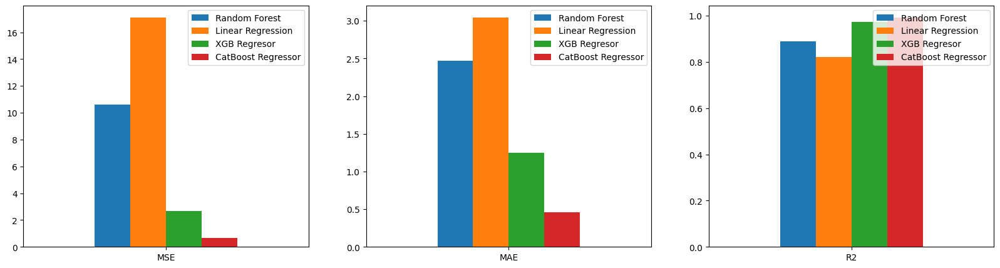

In [59]:
df_mse = pd.DataFrame({'Random Forest': RF_mse, 'Linear Regression': LR_mse,'XGB Regresor':XGB_mse,'CatBoost Regressor':CB_mse}, index=['MSE'])
df_mae = pd.DataFrame({'Random Forest': RF_mae, 'Linear Regression': LR_mae,'XGB Regresor':XGB_mae,'CatBoost Regressor': CB_mae}, index=['MAE'])
df_r2 = pd.DataFrame({'Random Forest': RF_r2, 'Linear Regression': LR_r2,'XGB Regresor':XGB_r2,'CatBoost Regressor': CB_r2}, index=['R2'])


fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))

df_mse.plot.bar(rot=0, ax=axes[0])
df_mae.plot.bar(rot=0, ax=axes[1])
df_r2.plot.bar(rot=0, ax=axes[2])

    
plt.show()

In [60]:
print(df_mse)
print('\n\n',df_mae)
print("\n\n",df_r2)

     Random Forest  Linear Regression  XGB Regresor  CatBoost Regressor
MSE      10.627922          17.116174      2.652568            0.689267


      Random Forest  Linear Regression  XGB Regresor  CatBoost Regressor
MAE        2.47416           3.047063      1.252512             0.45732


     Random Forest  Linear Regression  XGB Regresor  CatBoost Regressor
R2       0.888946           0.821149      0.972283            0.992798


The above shown results show that in general Random Forest is slightly better than Linear Regression

In [61]:
# function to remove the string 'regresson__' from the names of the best parameters
def transform(dict, prefix):
    dict_prefix = {key:value for key,value in dict.items() if prefix in key}
    return {key.replace(prefix,''):value for key,value in dict_prefix.items()}

pipe = make_pipeline(preprocess_pipeline, 
                     RF_best_params.get('reduce_dim'),
                     RandomForestRegressor(n_estimators=10, **transform(RF_best_params, 'regresson__')))

final_model =pipe.fit(X, y)

534:	learn: 0.2798373	total: 1.65s	remaining: 1.43s
535:	learn: 0.2791069	total: 1.65s	remaining: 1.43s
536:	learn: 0.2782823	total: 1.65s	remaining: 1.43s
537:	learn: 0.2775548	total: 1.66s	remaining: 1.42s
538:	learn: 0.2771486	total: 1.66s	remaining: 1.42s
539:	learn: 0.2763431	total: 1.66s	remaining: 1.42s
540:	learn: 0.2759065	total: 1.66s	remaining: 1.41s
541:	learn: 0.2754162	total: 1.67s	remaining: 1.41s
542:	learn: 0.2749268	total: 1.67s	remaining: 1.41s
543:	learn: 0.2741637	total: 1.67s	remaining: 1.4s
544:	learn: 0.2737847	total: 1.68s	remaining: 1.4s
545:	learn: 0.2730039	total: 1.68s	remaining: 1.4s
546:	learn: 0.2725662	total: 1.68s	remaining: 1.39s
547:	learn: 0.2719516	total: 1.68s	remaining: 1.39s
548:	learn: 0.2714135	total: 1.69s	remaining: 1.39s
549:	learn: 0.2708178	total: 1.69s	remaining: 1.38s
550:	learn: 0.2701464	total: 1.69s	remaining: 1.38s
551:	learn: 0.2696081	total: 1.7s	remaining: 1.38s
552:	learn: 0.2689513	total: 1.7s	remaining: 1.37s
553:	learn: 0.268

698:	learn: 0.2078547	total: 1.73s	remaining: 747ms
699:	learn: 0.2073921	total: 1.74s	remaining: 744ms
700:	learn: 0.2070384	total: 1.74s	remaining: 742ms
701:	learn: 0.2067993	total: 1.74s	remaining: 739ms
702:	learn: 0.2066344	total: 1.74s	remaining: 736ms
703:	learn: 0.2061674	total: 1.74s	remaining: 734ms
704:	learn: 0.2058622	total: 1.75s	remaining: 731ms
705:	learn: 0.2054523	total: 1.75s	remaining: 729ms
706:	learn: 0.2050600	total: 1.75s	remaining: 726ms
707:	learn: 0.2046662	total: 1.75s	remaining: 724ms
708:	learn: 0.2041665	total: 1.76s	remaining: 721ms
709:	learn: 0.2037142	total: 1.76s	remaining: 718ms
710:	learn: 0.2034637	total: 1.76s	remaining: 716ms
711:	learn: 0.2031551	total: 1.76s	remaining: 713ms
712:	learn: 0.2026598	total: 1.76s	remaining: 711ms
713:	learn: 0.2021976	total: 1.77s	remaining: 708ms
714:	learn: 0.2019220	total: 1.77s	remaining: 705ms
715:	learn: 0.2014954	total: 1.77s	remaining: 703ms
716:	learn: 0.2010396	total: 1.77s	remaining: 700ms
717:	learn: 

In [62]:
filename = 'final_model2.sav'
pickle.dump(final_model, open(filename, 'wb'))